# 1 · BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN

## OBJETIVO DEL NOTEBOOK

Este notebook desarrolla el **modelo temporal de clasificación de la calidad
del aire de Barcelona**, a partir del Maestro 06 generado durante la fase de
integración de datos del proyecto.

El objetivo es construir un modelo capaz de clasificar cada observación en
tres categorías de calidad del aire:

- **Buena**
- **Media**
- **Mala**

utilizando información ambiental, meteorológica, temporal, espacial, de
movilidad y actividad urbana disponible en el instante de predicción y en
instantes temporales anteriores.

---

## ESTRUCTURA DEL ANÁLISIS

El desarrollo sigue una secuencia reproducible:

**DATOS INTEGRADOS → AUDITORÍA → EDA → FEATURE ENGINEERING →
SELECCIÓN DE FEATURES → SPLIT TEMPORAL → MODELIZACIÓN →
INTERPRETABILIDAD → EVALUACIÓN → VALIDACIÓN ESPACIAL**

La unidad de análisis final se establece a nivel de:

**fecha + estación geográfica**

y el periodo efectivo de modelización comprende **2019–2024**.

---

## AUDITORÍA Y PREPARACIÓN DE LOS DATOS

Antes de entrenar los modelos se realizan controles sucesivos sobre:

- cobertura temporal;
- granularidad de las observaciones;
- duplicidades;
- correspondencia entre estaciones físicas y geográficas;
- consolidación de estaciones;
- distribución de los contaminantes;
- variable objetivo;
- correlaciones y estructura multivariante;
- autocorrelación temporal y espacial;
- cobertura de las variables;
- posibles fuentes de leakage.

Estas comprobaciones permiten establecer una base de datos coherente y
reproducible antes de iniciar la fase predictiva.

---

## FEATURE ENGINEERING

Se incorporan variables derivadas de las diferentes dimensiones del problema,
incluyendo:

- retardos históricos de NO₂;
- medias móviles;
- variables de calendario y estacionalidad;
- meteorología;
- tráfico y aforos;
- actividad aeroportuaria;
- actividad marítima;
- variables espaciales;
- indicadores de movilidad y entorno urbano.

Las variables históricas se construyen respetando la dimensión temporal para
evitar utilizar información futura en la predicción.

---

## MODELIZACIÓN TEMPORAL

La evaluación principal se realiza mediante una separación temporal:

**TRAIN: 2019–2023**

**TEST: 2024**

El conjunto TEST de 2024 se mantiene independiente y se utiliza exclusivamente
para la evaluación final.

Se comparan diferentes algoritmos de clasificación:

- Regresión Logística;
- Random Forest;
- Random Forest con ponderación de clases;
- XGBoost;
- XGBoost + SMOTE.

Debido al fuerte desequilibrio de las categorías, especialmente de la clase
`Mala`, se utilizan métricas sensibles al rendimiento de las clases
minoritarias, con especial atención al **F1 macro**.

---

## MODELO FINAL E INTERPRETABILIDAD

Una vez seleccionado el modelo final se realiza:

- evaluación completa;
- matriz de confusión;
- ROC-AUC;
- Average Precision;
- MCC;
- Cohen's Kappa;
- análisis detallado de errores;
- interpretabilidad mediante SHAP;
- análisis específico de la clase `Mala`;
- importancia de variables por bloques temáticos.

Finalmente se incorpora una validación espacial
**Leave-One-Station-Out (LOSO)** para comprobar hasta qué punto el modelo
puede generalizar a estaciones que no han participado en su entrenamiento.

---

## PRINCIPIO DE TRAZABILIDAD

El notebook mantiene separados:

**DATOS DE ENTRADA → TRANSFORMACIONES → MODELOS → RESULTADOS**

Las transformaciones necesarias para la modelización se realizan sobre copias
de trabajo y los resultados generados se almacenan de forma independiente.

De este modo, cada resultado puede relacionarse con la etapa del pipeline que
lo produjo y reproducirse posteriormente.

---

## RESULTADO ESPERADO

El objetivo final no es únicamente obtener una elevada precisión predictiva,
sino construir un modelo:

- temporalmente válido;
- interpretable;
- reproducible;
- robusto frente al desequilibrio de clases;
- evaluado mediante métricas múltiples;
- sometido a análisis de errores;
- y contrastado mediante validación espacial.

# ✓ INICIO DEL MODELO TEMPORAL DE CLASIFICACIÓN

# 2 · CONEXIÓN CON GOOGLE DRIVE

El proyecto se desarrolla en Google Colab y utiliza Google Drive como sistema
de almacenamiento persistente.

Se monta la unidad de Google Drive al inicio del notebook para trabajar
directamente sobre la estructura de carpetas del TFM y garantizar que los
notebooks, figuras, modelos y resultados generados durante el análisis queden
almacenados de forma persistente.

La conexión con Drive permite mantener separadas las diferentes fases del
proyecto y conservar la trazabilidad entre:

**datos integrados → modelización → resultados → memoria → dashboard**

Los datos originales y los maestros integrados se utilizarán únicamente como
fuentes de entrada. Los productos generados por este notebook se almacenarán
en la carpeta específica del modelo temporal.

In [ ]:
# =============================================================================
# 02 · CONEXIÓN CON GOOGLE DRIVE
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

from pathlib import Path

MOUNT_POINT = Path("/content/drive")

# -----------------------------------------------------------------------------
# Comprobar si Google Drive ya está montado
# -----------------------------------------------------------------------------

if (MOUNT_POINT / "MyDrive").exists():

    print("=" * 90)
    print("BREATHE BARCELONA · GOOGLE DRIVE")
    print("=" * 90)

    print("\n✓ Google Drive ya estaba montado")
    print(f"✓ Ruta disponible: {MOUNT_POINT / 'MyDrive'}")

else:

    from google.colab import drive

    # Crear el punto de montaje únicamente si no existe
    MOUNT_POINT.mkdir(parents=True, exist_ok=True)

    drive.mount(str(MOUNT_POINT))

    print("=" * 90)
    print("BREATHE BARCELONA · GOOGLE DRIVE")
    print("=" * 90)

    print("\n✓ Google Drive montado correctamente")
    print(f"✓ Ruta disponible: {MOUNT_POINT / 'MyDrive'}")

print("=" * 90)

Mounted at /content/drive
BREATHE BARCELONA · GOOGLE DRIVE

✓ Google Drive montado correctamente
✓ Ruta disponible: /content/drive/MyDrive


# 3 · ORGANIZACIÓN DEL ANÁLISIS Y TRAZABILIDAD

El modelo temporal se desarrolla a partir del **Maestro 06**, generado durante
la fase de integración de datos del proyecto.

Se mantiene una separación explícita entre las fases de:

**PREINTEGRACIÓN → INTEGRACIÓN → MODELIZACIÓN**

Esta estructura permite preservar la trazabilidad del proceso y evitar que las
transformaciones realizadas durante la modelización modifiquen los datos
integrados de partida.

### Fase de preintegración

La carpeta `PREINTEGRACION` contiene los procesos de preparación y tratamiento
inicial de las diferentes fuentes de datos utilizadas en el proyecto.

### Fase de integración

La carpeta `INTEGRACION` contiene los procesos mediante los cuales las
diferentes fuentes se combinan para construir los maestros de datos.

El **Maestro 06** constituye la entrada principal de este notebook, al integrar
la información de contaminación atmosférica con variables meteorológicas, de
movilidad, actividad urbana y otras variables ambientales y espaciales.

### Fase de modelización temporal

La modelización se desarrolla en una carpeta independiente:

```text
MODELO_TEMPORAL/
│
├── 01_Notebook/
├── 02_Figuras/
├── 03_Modelos/
└── 04_Resultados/

In [ ]:
# =============================================================================
# 03 · ESTRUCTURA DE TRABAJO Y RUTAS DEFINITIVAS
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

from pathlib import Path

# =============================================================================
# GOOGLE DRIVE REAL
# =============================================================================

DRIVE_ROOT = Path("/content/drive/MyDrive")

# =============================================================================
# PROYECTO TFM
# =============================================================================

BASE_DIR = DRIVE_ROOT / "TFM" / "11_Machine_Learning_Temporal"

# =============================================================================
# FASES PREVIAS
# =============================================================================

DIR_PREINTEGRACION = BASE_DIR / "PREINTEGRACION"
DIR_INTEGRACION = BASE_DIR / "INTEGRACION"

# =============================================================================
# MODELO TEMPORAL
# =============================================================================

MODEL_DIR = BASE_DIR / "MODELO_TEMPORAL"

DIR_NOTEBOOK = MODEL_DIR / "01_Notebook"
DIR_FIGURAS = MODEL_DIR / "02_Figuras"
DIR_MODELOS = MODEL_DIR / "03_Modelos"
DIR_RESULTADOS = MODEL_DIR / "04_Resultados"

# =============================================================================
# COMPROBACIÓN DE LA ESTRUCTURA REAL
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · ESTRUCTURA DEFINITIVA")
print("=" * 90)

print("\n✓ Drive:")
print(f"  {DRIVE_ROOT}")

print("\n✓ Carpeta TFM:")
print(f"  {BASE_DIR}")

print("\n✓ PREINTEGRACION:")
print(f"  {DIR_PREINTEGRACION}")
print(f"  Existe: {DIR_PREINTEGRACION.exists()}")

print("\n✓ INTEGRACION:")
print(f"  {DIR_INTEGRACION}")
print(f"  Existe: {DIR_INTEGRACION.exists()}")

# =============================================================================
# CREAR CARPETAS DEL MODELO TEMPORAL
# =============================================================================

for carpeta in [
    MODEL_DIR,
    DIR_NOTEBOOK,
    DIR_FIGURAS,
    DIR_MODELOS,
    DIR_RESULTADOS
]:
    carpeta.mkdir(parents=True, exist_ok=True)

print("\n✓ MODELO_TEMPORAL:")
print(f"  {MODEL_DIR}")

print("\n✓ Salidas:")
print(f"  01_Notebook   → {DIR_NOTEBOOK}")
print(f"  02_Figuras    → {DIR_FIGURAS}")
print(f"  03_Modelos    → {DIR_MODELOS}")
print(f"  04_Resultados → {DIR_RESULTADOS}")

# =============================================================================
# COMPROBACIÓN FINAL
# =============================================================================

if not DIR_INTEGRACION.exists():
    raise FileNotFoundError(
        f"No se encuentra INTEGRACION en:\n{DIR_INTEGRACION}"
    )

print("\n" + "=" * 90)
print("✓ RUTAS CORRECTAMENTE CONFIGURADAS")
print("✓ INTEGRACION LOCALIZADA")
print("✓ MODELO_TEMPORAL PREPARADO")
print("✓ A partir de ahora se utilizará /content/drive")
print("=" * 90)

BREATHE BARCELONA · ESTRUCTURA DEFINITIVA

✓ Drive:
  /content/drive/MyDrive

✓ Carpeta TFM:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal

✓ PREINTEGRACION:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/PREINTEGRACION
  Existe: True

✓ INTEGRACION:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/INTEGRACION
  Existe: True

✓ MODELO_TEMPORAL:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/MODELO_TEMPORAL

✓ Salidas:
  01_Notebook   → /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/MODELO_TEMPORAL/01_Notebook
  02_Figuras    → /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/MODELO_TEMPORAL/02_Figuras
  03_Modelos    → /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/MODELO_TEMPORAL/03_Modelos
  04_Resultados → /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/MODELO_TEMPORAL/04_Resultados

✓ RUTAS CORRECTAMENTE CONFIGURADAS
✓ INTEGRACION LOCALIZADA
✓ MODELO_TEMPORAL PREPARADO
✓ A partir de ahora se utilizará /cont

# 4 · CONJUNTO DE DATOS DE ENTRADA: MAESTRO 06

El modelo temporal parte del **Maestro 06**, generado durante la fase de
integración de datos del proyecto.

Este conjunto de datos constituye la entrada del modelo porque reúne, para cada
observación diaria y estación de medida, información procedente de diferentes
bloques ambientales y urbanos.

Entre las principales fuentes integradas se encuentran:

- **Calidad del aire:** concentración de NO₂ y variables derivadas.
- **Meteorología:** temperatura, humedad, precipitación, radiación y viento.
- **Tráfico rodado:** intensidad de tráfico y variables espaciales derivadas
  de los aforos.
- **Contaminación acústica:** indicadores derivados de las mediciones
  disponibles.
- **Transporte aéreo:** volumen de vuelos, compañías y zonas activas.
- **Transporte marítimo:** movimientos portuarios y características agregadas
  de los buques.
- **Información espacial:** coordenadas, estación de medida y variables
  asociadas a la localización.

La integración de estas fuentes permite plantear la clasificación desde una
perspectiva multivariable, relacionando la calidad del aire con las condiciones
meteorológicas, la movilidad y la actividad urbana.

### Unidad de análisis

La unidad de análisis es la **observación diaria asociada a una estación de
medida**.

Cada registro representa una fecha y una localización determinada, junto con
las variables ambientales y urbanas disponibles para dicha observación.

### Variable objetivo

La variable objetivo utilizada en el modelo será:

`clase_NO2_3`

Esta variable representa la clasificación de la calidad del aire en tres
categorías:

- **Buena**
- **Moderada**
- **Mala**

La columna `target` contiene su codificación numérica para su utilización por
los algoritmos de aprendizaje automático.

Antes de realizar cualquier transformación o entrenamiento se llevará a cabo
una auditoría inicial del Maestro 06 para comprobar:

1. dimensiones del conjunto de datos;
2. periodo temporal disponible;
3. estaciones disponibles;
4. estructura y tipos de variables;
5. valores ausentes;
6. distribución de las clases;
7. variables categóricas;
8. posibles variables identificativas;
9. correspondencia entre `NO2_ug_m3`, `categoria_EEA_NO2_6`,
   `clase_NO2_3` y `target`.

Esta auditoría permitirá establecer el estado inicial del conjunto de datos
antes del preprocesamiento específico del modelo.

### Trazabilidad

El Maestro 06 se utilizará como **fuente de entrada y no será modificado**
durante el proceso de modelización.

Las transformaciones necesarias para el aprendizaje automático se realizarán
sobre copias de trabajo, conservando el maestro integrado como referencia
original.

De este modo, el flujo de trabajo queda definido como:

**Maestro 06 → auditoría → preprocesamiento → modelización → evaluación →
interpretabilidad → resultados**

Los resultados obtenidos se almacenarán en la estructura específica de
`MODELO_TEMPORAL` y podrán reutilizarse posteriormente tanto en la memoria del
TFM como en el dashboard Breathe Barcelona.

In [ ]:
# =============================================================================
# 04 · LOCALIZACIÓN DEL MAESTRO 06
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · LOCALIZACIÓN DEL MAESTRO 06")
print("=" * 90)

# -----------------------------------------------------------------------------
# Comprobar carpeta de integración
# -----------------------------------------------------------------------------

if not DIR_INTEGRACION.exists():
    raise FileNotFoundError(
        f"No se encuentra la carpeta INTEGRACION:\n{DIR_INTEGRACION}"
    )

print("\n✓ Carpeta INTEGRACION:")
print(f"  {DIR_INTEGRACION}")

# -----------------------------------------------------------------------------
# Listar archivos disponibles
# -----------------------------------------------------------------------------

archivos = sorted(
    [f for f in DIR_INTEGRACION.iterdir() if f.is_file()]
)

print(f"\n✓ Archivos disponibles: {len(archivos)}")

for i, archivo in enumerate(archivos, 1):
    print(f"{i:02d}. {archivo.name}")

# -----------------------------------------------------------------------------
# Localizar el Maestro 06
# -----------------------------------------------------------------------------

candidatos_06 = [
    f for f in archivos
    if f.name.lower().startswith("06_")
]

if len(candidatos_06) == 0:
    raise FileNotFoundError(
        "\nNo se ha encontrado ningún archivo que comience por '06_'."
    )

if len(candidatos_06) > 1:

    print("\n⚠️ Se han encontrado varios candidatos:")

    for f in candidatos_06:
        print(f"   - {f.name}")

else:

    RUTA_MAESTRO_06 = candidatos_06[0]

    print("\n✓ Maestro 06 localizado:")
    print(f"  {RUTA_MAESTRO_06.name}")

    print("\n✓ Ruta completa:")
    print(f"  {RUTA_MAESTRO_06}")

print("\n" + "=" * 90)

BREATHE BARCELONA · LOCALIZACIÓN DEL MAESTRO 06

✓ Carpeta INTEGRACION:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/INTEGRACION

✓ Archivos disponibles: 6
01. 01_maestro_contaminacion.csv
02. 02_maestro_contaminacion_meteorologia.csv
03. 03_maestro_contaminacion_meteorologia_trafico.csv
04. 04_maestro_contaminacion_meteorologia_trafico_ruido.csv
05. 05_maestro_contaminacion_meteorologia_trafico_ruido_vuelos.csv
06. 06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv

✓ Maestro 06 localizado:
  06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv

✓ Ruta completa:
  /content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/INTEGRACION/06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv



### RESULTADO DE LA LOCALIZACIÓN DEL CONJUNTO DE ENTRADA

La carpeta de integración contiene seis maestros sucesivos, construidos de
forma incremental mediante la incorporación de nuevas fuentes de información:

1. `01_maestro_contaminacion.csv`
2. `02_maestro_contaminacion_meteorologia.csv`
3. `03_maestro_contaminacion_meteorologia_trafico.csv`
4. `04_maestro_contaminacion_meteorologia_trafico_ruido.csv`
5. `05_maestro_contaminacion_meteorologia_trafico_ruido_vuelos.csv`
6. `06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv`

El **Maestro 06** constituye el conjunto de datos de entrada seleccionado para
la presente fase de modelización, al ser el último nivel de integración y
contener conjuntamente las fuentes utilizadas en el análisis temporal:

**contaminación + meteorología + tráfico + ruido + transporte aéreo +
transporte marítimo.**

Esta estructura incremental permite mantener la trazabilidad de la
incorporación de fuentes y comprobar que el modelo temporal parte del nivel
máximo de integración disponible.

El archivo seleccionado es:

`06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv`

La ruta de entrada queda fijada y el archivo original se conservará sin
modificaciones durante el proceso de modelización.

# 5 · CARGA Y AUDITORÍA INICIAL DEL MAESTRO 06

Una vez identificado el Maestro 06 como conjunto de datos de entrada, se realiza
una primera auditoría descriptiva antes de aplicar cualquier transformación
orientada al aprendizaje automático.

Esta etapa tiene como finalidad conocer el estado real del conjunto de datos
y detectar posibles problemas que deban resolverse antes de construir el
modelo.

La auditoría inicial comprende los siguientes aspectos:

### 5.1. Dimensiones del conjunto de datos

Se comprueba el número total de observaciones y variables disponibles.

Esta información permite caracterizar la escala del conjunto de datos y
comprobar que corresponde al maestro generado durante la fase de integración.

### 5.2. Cobertura temporal

Se identifican las fechas mínima y máxima disponibles y se comprueba la
existencia de fechas no válidas o ausentes.

La dimensión temporal es especialmente relevante en este estudio, ya que la
modelización posterior utilizará una estrategia de validación cronológica para
evitar que información futura participe en el entrenamiento.

### 5.3. Estructura de las variables

Se revisan todas las columnas del maestro y sus tipos de datos con el objetivo
de distinguir posteriormente entre:

- variables numéricas;
- variables categóricas;
- variables temporales;
- identificadores;
- variables espaciales;
- variables derivadas;
- variable objetivo.

Esta clasificación será necesaria para diseñar el preprocesamiento específico
del modelo.

### 5.4. Estaciones de medida

Se comprueba el número de estaciones representadas en el conjunto de datos y
el número de observaciones asociadas a cada una.

Esta comprobación permitirá identificar posibles diferencias de cobertura entre
estaciones y valorar posteriormente su influencia sobre la modelización.

### 5.5. Variable objetivo

Se inspeccionan conjuntamente las variables:

- `NO2_ug_m3`
- `categoria_EEA_NO2_6`
- `clase_NO2_3`
- `target`

El objetivo es verificar que la concentración de NO₂, su clasificación ambiental
y la codificación utilizada por los algoritmos mantienen una correspondencia
coherente.

La distribución de `target` se analizará además para determinar el grado de
desequilibrio entre las clases antes de seleccionar las estrategias de
modelización.

### 5.6. Valores ausentes

Se cuantifican los valores ausentes de cada variable.

Los valores nulos no se imputarán en esta primera auditoría. Primero se
documentará su distribución y posteriormente se decidirá, para cada bloque de
variables, la estrategia de tratamiento más adecuada.

Este procedimiento evita realizar imputaciones prematuras y permite que las
decisiones de preprocesamiento estén justificadas por las características
observadas en los datos.

### 5.7. Principio de no modificación

Esta primera auditoría es exclusivamente descriptiva.

El Maestro 06 original no se modifica durante esta etapa. Las transformaciones,
selección de variables, imputaciones y codificaciones se realizarán
posteriormente sobre conjuntos de trabajo derivados del maestro original.

De esta forma se mantiene la trazabilidad entre:

**Maestro integrado → auditoría → preprocesamiento → modelización → evaluación.**

In [ ]:
# =============================================================================
# 05 · CARGA Y AUDITORÍA INICIAL DEL MAESTRO 06
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

import pandas as pd
import numpy as np

print("=" * 90)
print("BREATHE BARCELONA · CARGA DEL MAESTRO 06")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. CARGA DEL MAESTRO
# -----------------------------------------------------------------------------

df = pd.read_csv(
    RUTA_MAESTRO_06,
    low_memory=False
)

print("\n✓ Maestro 06 cargado correctamente")

# -----------------------------------------------------------------------------
# 2. DIMENSIONES
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("DIMENSIONES")
print("-" * 90)

print(f"✓ Filas    : {df.shape[0]:,}")
print(f"✓ Columnas : {df.shape[1]:,}")

# -----------------------------------------------------------------------------
# 3. PERIODO TEMPORAL
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("PERIODO TEMPORAL")
print("-" * 90)

if "fecha" in df.columns:

    df["fecha"] = pd.to_datetime(
        df["fecha"],
        errors="coerce"
    )

    print(f"✓ Fecha mínima : {df['fecha'].min()}")
    print(f"✓ Fecha máxima : {df['fecha'].max()}")
    print(f"✓ Fechas nulas : {df['fecha'].isna().sum():,}")

else:
    print("⚠️ No se encuentra la columna 'fecha'.")

# -----------------------------------------------------------------------------
# 4. COLUMNAS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COLUMNAS DEL MAESTRO")
print("-" * 90)

for i, columna in enumerate(df.columns, 1):
    print(f"{i:02d}. {columna}")

# -----------------------------------------------------------------------------
# 5. ESTACIONES
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("ESTACIONES")
print("-" * 90)

if "estacion_modelo" in df.columns:

    print(f"✓ Estaciones modelo: {df['estacion_modelo'].nunique()}")

    print("\nRegistros por estación:")
    print(
        df["estacion_modelo"]
        .value_counts(dropna=False)
        .sort_index()
    )

else:
    print("⚠️ No se encuentra 'estacion_modelo'.")

# -----------------------------------------------------------------------------
# 6. VARIABLES RELACIONADAS CON EL OBJETIVO
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("VARIABLE OBJETIVO Y VARIABLES DE REFERENCIA")
print("-" * 90)

for columna in [
    "NO2_ug_m3",
    "categoria_EEA_NO2_6",
    "clase_NO2_3",
    "target"
]:

    if columna in df.columns:

        print(f"\n✓ {columna}")
        print(f"  Tipo   : {df[columna].dtype}")
        print(f"  Nulos  : {df[columna].isna().sum():,}")

        if columna in [
            "categoria_EEA_NO2_6",
            "clase_NO2_3",
            "target"
        ]:
            print("  Valores:")
            print(
                df[columna]
                .value_counts(dropna=False)
                .sort_index()
            )

# -----------------------------------------------------------------------------
# 7. TIPOS DE DATOS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("TIPOS DE DATOS")
print("-" * 90)

print(
    df.dtypes.value_counts()
)

# -----------------------------------------------------------------------------
# 8. VALORES AUSENTES
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("VALORES AUSENTES")
print("-" * 90)

nulos = (
    df.isna()
    .sum()
    .sort_values(ascending=False)
)

nulos_no_cero = nulos[nulos > 0]

if len(nulos_no_cero) > 0:
    print(nulos_no_cero.head(20))
else:
    print("✓ No se han detectado valores ausentes.")

print("\n" + "=" * 90)
print("✓ AUDITORÍA INICIAL COMPLETADA")
print("=" * 90)

BREATHE BARCELONA · CARGA DEL MAESTRO 06

✓ Maestro 06 cargado correctamente

------------------------------------------------------------------------------------------
DIMENSIONES
------------------------------------------------------------------------------------------
✓ Filas    : 43,642
✓ Columnas : 73

------------------------------------------------------------------------------------------
PERIODO TEMPORAL
------------------------------------------------------------------------------------------
✓ Fecha mínima : 2018-06-12 00:00:00
✓ Fecha máxima : 2024-12-31 00:00:00
✓ Fechas nulas : 0

------------------------------------------------------------------------------------------
COLUMNAS DEL MAESTRO
------------------------------------------------------------------------------------------
01. fecha
02. codi_estacio
03. nom_cabina
04. contaminant
05. valor
06. horas_validas
07. codi_estacio_str
08. estacion_fisica
09. estacion_geo
10. lat
11. lon
12. tipo
13. X_ETRS89
14. Y_ETRS89


### RESULTADOS DE LA AUDITORÍA INICIAL

La carga del Maestro 06 confirma un conjunto de datos compuesto por **43.642
observaciones y 73 variables**, correspondientes al nivel máximo de integración
disponible en la fase de preparación de los datos.

### Cobertura temporal y periodo efectivo de modelización

La auditoría inicial muestra que el Maestro 06 contiene registros desde el
**12 de junio de 2018 hasta el 31 de diciembre de 2024**, sin fechas nulas.

No obstante, la cobertura temporal de las diferentes fuentes integradas no es
homogénea durante todo este intervalo. Algunas de las fuentes incorporadas al
maestro no presentan una disponibilidad completa para 2018.

Por este motivo, aunque los registros de 2018 se conservan en el Maestro 06
original, se establece como **periodo efectivo de modelización 2019–2024**.
El año 2018 se excluirá posteriormente del conjunto utilizado para el
aprendizaje automático, evitando que una cobertura parcial de determinadas
fuentes afecte a la comparabilidad temporal del modelo.

Esta decisión permite trabajar con un periodo temporal común y suficientemente
consistente entre las fuentes integradas, manteniendo además la continuidad
necesaria para el análisis de los tres periodos definidos en el estudio:

- **2019:** periodo pre-COVID de referencia.
- **2020–2021:** periodo afectado por la pandemia y las restricciones de
  movilidad.
- **2022–2024:** periodo posterior a la fase principal de restricciones.

Por tanto, se distingue entre:

- **Periodo disponible en el Maestro 06:** junio de 2018 – diciembre de 2024.
- **Periodo efectivo de modelización:** enero de 2019 – diciembre de 2024.

El filtrado temporal se realizará posteriormente sobre una copia de trabajo
del Maestro 06, antes de la construcción de la variable objetivo y del
preprocesamiento específico del modelo.

### Estructura de las variables

El conjunto contiene:

- **58 variables `float64`**;
- **5 variables `int64`**;
- **9 variables `object`**;
- **1 variable temporal `datetime64[ns]`**.

Esta estructura confirma que el conjunto combina variables numéricas,
categóricas e información temporal. El preprocesamiento deberá adaptarse al
tipo y naturaleza de cada variable, evitando aplicar transformaciones
homogéneas cuando no estén justificadas.

### Cobertura espacial

La estructura del maestro incluye información de estación y localización,
entre ella `codi_estacio`, `nom_cabina`, `estacion_fisica`, `estacion_geo`,
`lat`, `lon` y las coordenadas proyectadas `X_ETRS89` e `Y_ETRS89`.

La comprobación realizada no encuentra una columna denominada
`estacion_modelo`. Por tanto, esta variable no forma parte del Maestro 06
original y no se utilizará como identificador hasta determinar qué variable de
estación debe emplearse en la fase de modelización.

### Variable objetivo

La auditoría confirma que las columnas `NO2_ug_m3`, `categoria_EEA_NO2_6`,
`clase_NO2_3` y `target` **no están presentes en el Maestro 06 original**.

Esto indica que la variable objetivo del modelo no está almacenada todavía en
el maestro integrado, sino que deberá construirse durante la fase específica
de preparación del modelo.

Esta separación permite diferenciar claramente entre:

**datos integrados → definición de la variable objetivo → preprocesamiento →
modelización.**

La construcción de la variable objetivo se documentará explícitamente antes
del entrenamiento y se evitará utilizar como predictores aquellas variables
que puedan introducir fuga de información respecto al objetivo.

### Valores ausentes

Se detectan valores ausentes en diferentes bloques de información. Las
mayores cantidades corresponden a determinadas variables meteorológicas, entre
ellas `PM`, `PN`, `PX`, `RS24h` y `DVVX10`, con **15.904 valores ausentes**.

También presentan valores ausentes `PPT`, `DVM10`, `VVM10` y `VVX10`, con
**10.103 registros**, mientras que otras variables meteorológicas presentan
niveles intermedios de ausencia.

Las variables relacionadas con la actividad aeroportuaria, como
`Vuelos_total`, `Companias_activas`, `Zonas_activas` y
`Vuelos_internacionales_pct`, presentan **4.751 valores ausentes**.

Asimismo, determinadas variables asociadas al tráfico presentan **440 valores
ausentes**, entre ellas algunas variables correspondientes al radio de 750 m.

La presencia de valores ausentes no se considera por sí misma un error del
conjunto de datos. Puede responder a diferencias temporales en la disponibilidad
de las fuentes originales y a la incorporación progresiva de determinadas
variables.

Por este motivo, **no se realizará una eliminación global de registros ni una
imputación automática en esta etapa**. Primero se analizará la distribución
temporal y el origen de los valores ausentes para definir una estrategia de
preprocesamiento coherente con cada bloque de variables.

### Conclusión de la auditoría inicial

El Maestro 06 presenta una estructura adecuada para continuar con el desarrollo
del modelo temporal, pero antes del entrenamiento será necesario realizar una
fase específica de preparación que incluya:

1. selección del periodo efectivo **2019–2024**;
2. definición y construcción de la variable objetivo;
3. identificación de las variables predictoras;
4. revisión de variables identificativas y categóricas;
5. análisis detallado de valores ausentes;
6. comprobación de duplicados y granularidad temporal;
7. revisión de posibles variables derivadas del propio NO₂ que puedan producir
   fuga de información;
8. definición de la partición temporal entre entrenamiento y prueba.

A partir de este punto, todas las transformaciones se realizarán sobre copias
de trabajo, manteniendo el Maestro 06 original como referencia.

# 6 · SELECCIÓN DEL PERIODO TEMPORAL DE MODELIZACIÓN

A partir de la auditoría inicial se establece como periodo efectivo para la
modelización **enero de 2019 a diciembre de 2024**.

Aunque el Maestro 06 contiene registros desde junio de 2018, el año 2018
presenta una cobertura temporal desigual entre las diferentes fuentes
integradas. Mantener este periodo parcial podría introducir diferencias en la
disponibilidad de predictores que no respondan a variaciones reales de la
calidad del aire.

Por este motivo, el año 2018 se excluye del conjunto de modelización y se
mantiene únicamente en el Maestro 06 original como parte de la trazabilidad
del proceso.

La selección del periodo 2019–2024 proporciona además un marco temporal
coherente para estudiar la evolución de la calidad del aire alrededor del
periodo COVID-19:

- **2019:** periodo pre-COVID utilizado como referencia.
- **2020–2021:** periodo caracterizado por las restricciones y alteraciones
  de movilidad asociadas a la pandemia.
- **2022–2024:** periodo posterior a la fase principal de restricciones.

El filtrado se realizará exclusivamente sobre una copia de trabajo del
Maestro 06. El archivo original permanecerá sin modificaciones.

Después del filtrado se comprobarán nuevamente:

1. número de observaciones;
2. fecha mínima y máxima;
3. continuidad temporal;
4. distribución de observaciones por año;
5. número de estaciones y observaciones por estación.

Esta comprobación permitirá verificar que la selección temporal se ha realizado
correctamente antes de continuar con la construcción de la variable objetivo.

In [ ]:
# =============================================================================
# 06 · SELECCIÓN DEL PERIODO DE MODELIZACIÓN
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · SELECCIÓN DEL PERIODO TEMPORAL")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. CREAR COPIA DE TRABAJO
# -----------------------------------------------------------------------------

df_model = df.copy()

# -----------------------------------------------------------------------------
# 2. ASEGURAR FORMATO TEMPORAL
# -----------------------------------------------------------------------------

df_model["fecha"] = pd.to_datetime(
    df_model["fecha"],
    errors="coerce"
)

# -----------------------------------------------------------------------------
# 3. FILTRO TEMPORAL
# -----------------------------------------------------------------------------

FECHA_INICIO = pd.Timestamp("2019-01-01")
FECHA_FIN = pd.Timestamp("2024-12-31")

df_model = df_model[
    (df_model["fecha"] >= FECHA_INICIO) &
    (df_model["fecha"] <= FECHA_FIN)
].copy()

# -----------------------------------------------------------------------------
# 4. COMPROBACIÓN DEL RESULTADO
# -----------------------------------------------------------------------------

print("\n✓ Periodo seleccionado:")
print(f"  Inicio: {FECHA_INICIO.date()}")
print(f"  Fin   : {FECHA_FIN.date()}")

print("\n" + "-" * 90)
print("DIMENSIONES")
print("-" * 90)

print(f"✓ Observaciones antes del filtro : {len(df):,}")
print(f"✓ Observaciones después del filtro: {len(df_model):,}")
print(f"✓ Observaciones excluidas         : {len(df) - len(df_model):,}")

print("\n" + "-" * 90)
print("COBERTURA TEMPORAL")
print("-" * 90)

print(f"✓ Fecha mínima: {df_model['fecha'].min()}")
print(f"✓ Fecha máxima: {df_model['fecha'].max()}")

print("\n" + "-" * 90)
print("OBSERVACIONES POR AÑO")
print("-" * 90)

observaciones_anuales = (
    df_model["fecha"]
    .dt.year
    .value_counts()
    .sort_index()
)

print(observaciones_anuales)

print("\n" + "-" * 90)
print("OBSERVACIONES POR ESTACIÓN")
print("-" * 90)

# Utilizamos una columna disponible del Maestro 06
if "estacion_geo" in df_model.columns:

    estaciones_anuales = (
        df_model["estacion_geo"]
        .value_counts(dropna=False)
        .sort_index()
    )

    print(estaciones_anuales)

elif "estacion_fisica" in df_model.columns:

    estaciones_anuales = (
        df_model["estacion_fisica"]
        .value_counts(dropna=False)
        .sort_index()
    )

    print(estaciones_anuales)

else:

    print("⚠️ No se ha encontrado una variable de estación adecuada.")

print("\n" + "=" * 90)
print("✓ FILTRADO TEMPORAL COMPLETADO")
print("=" * 90)

BREATHE BARCELONA · SELECCIÓN DEL PERIODO TEMPORAL

✓ Periodo seleccionado:
  Inicio: 2019-01-01
  Fin   : 2024-12-31

------------------------------------------------------------------------------------------
DIMENSIONES
------------------------------------------------------------------------------------------
✓ Observaciones antes del filtro : 43,642
✓ Observaciones después del filtro: 40,812
✓ Observaciones excluidas         : 2,830

------------------------------------------------------------------------------------------
COBERTURA TEMPORAL
------------------------------------------------------------------------------------------
✓ Fecha mínima: 2019-01-01 00:00:00
✓ Fecha máxima: 2024-12-31 00:00:00

------------------------------------------------------------------------------------------
OBSERVACIONES POR AÑO
------------------------------------------------------------------------------------------
fecha
2019    4311
2020    6894
2021    7051
2022    7446
2023    7634
2024    74

### RESULTADOS DE LA SELECCIÓN TEMPORAL

El filtrado temporal aplicado sobre una copia de trabajo del Maestro 06 reduce
el conjunto de datos desde **43.642 hasta 40.812 observaciones**, excluyendo
**2.830 registros correspondientes al periodo anterior a enero de 2019**.

El conjunto definitivo para la modelización queda comprendido entre el
**1 de enero de 2019 y el 31 de diciembre de 2024**, manteniendo una cobertura
temporal continua dentro del periodo seleccionado.

La distribución anual de observaciones es la siguiente:

| Año | Observaciones |
|---:|---:|
| 2019 | 4.311 |
| 2020 | 6.894 |
| 2021 | 7.051 |
| 2022 | 7.446 |
| 2023 | 7.634 |
| 2024 | 7.476 |

La distribución muestra una cobertura claramente inferior en 2019 respecto a
los años posteriores. Esta diferencia deberá tenerse en cuenta en los análisis
temporales posteriores, aunque no se realizará ninguna corrección artificial
de la frecuencia de observación en esta etapa.

### Distribución espacial

El conjunto seleccionado contiene ocho estaciones geográficas:

| Estación | Observaciones |
|---|---:|
| Ciutadella | 4.091 |
| Eixample | 6.578 |
| Gràcia | 5.767 |
| Observatori Fabra | 85 |
| Palau Reial | 6.953 |
| Poblenou | 5.325 |
| Sants | 6.025 |
| Vall d'Hebron | 5.988 |

La distribución espacial no es completamente homogénea. La mayoría de las
estaciones presentan varios miles de observaciones, mientras que
**Observatori Fabra presenta únicamente 85 registros** durante el periodo
seleccionado.

Esta diferencia de cobertura deberá revisarse antes del entrenamiento, ya que
una estación con una disponibilidad tan reducida puede tener una representación
insuficiente en el conjunto de aprendizaje y afectar a la evaluación de la
capacidad de generalización espacial del modelo.

Por el momento, **no se elimina ninguna estación**. La decisión se pospone a
una auditoría específica de cobertura temporal y disponibilidad por estación,
evitando aplicar un criterio de exclusión sin analizar previamente el origen
de esta diferencia.

### Conjunto de trabajo

A partir de este punto, `df_model` constituye el **conjunto de trabajo temporal
2019–2024** para el desarrollo del modelo.

El Maestro 06 original permanece intacto y se conserva como fuente de
referencia.

El siguiente paso será analizar la **granularidad temporal y la cobertura por
estación**, incluyendo posibles duplicados y la disponibilidad real de las
observaciones, antes de construir la variable objetivo.

# 7 · AUDITORÍA DE GRANULARIDAD TEMPORAL Y COBERTURA POR ESTACIÓN

Antes de definir la variable objetivo y realizar el preprocesamiento, se
comprueba que el conjunto de trabajo presenta la granularidad temporal y
espacial esperadas.

El modelo se plantea sobre una unidad de análisis **diaria y por estación de
medida**. Por tanto, cada combinación de fecha y estación debería representar
una única observación analítica.

Esta comprobación es necesaria para detectar:

- registros duplicados;
- múltiples observaciones para una misma fecha y estación;
- fechas con una cobertura anormalmente baja;
- estaciones con disponibilidad temporal insuficiente;
- posibles discontinuidades en la serie temporal.

La auditoría se realizará sobre `df_model`, que contiene únicamente el periodo
2019–2024.

En esta fase no se eliminarán observaciones de forma automática. Cualquier
decisión de exclusión se tomará posteriormente y deberá estar justificada por
la estructura de los datos y por su impacto sobre el modelo.

Se prestará especial atención a **Observatori Fabra**, que en la auditoría
anterior presentó una cobertura considerablemente inferior a la del resto de
estaciones.

La finalidad es determinar si esta baja cobertura responde a una serie
realmente disponible pero limitada o a una particularidad de la integración
que deba corregirse antes de continuar.

In [ ]:
# =============================================================================
# 07 · AUDITORÍA DE GRANULARIDAD Y COBERTURA POR ESTACIÓN
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · AUDITORÍA TEMPORAL Y ESPACIAL")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. IDENTIFICAR LA VARIABLE DE ESTACIÓN
# -----------------------------------------------------------------------------

if "estacion_geo" in df_model.columns:
    COLUMNA_ESTACION = "estacion_geo"

elif "estacion_fisica" in df_model.columns:
    COLUMNA_ESTACION = "estacion_fisica"

else:
    raise KeyError(
        "No se ha encontrado una columna válida para identificar la estación."
    )

print(f"\n✓ Variable de estación utilizada: {COLUMNA_ESTACION}")

# -----------------------------------------------------------------------------
# 2. DUPLICADOS DE FECHA + ESTACIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("DUPLICADOS · FECHA + ESTACIÓN")
print("-" * 90)

duplicados = df_model.duplicated(
    subset=["fecha", COLUMNA_ESTACION],
    keep=False
)

n_duplicados = duplicados.sum()

print(f"✓ Registros pertenecientes a combinaciones duplicadas: {n_duplicados:,}")

if n_duplicados > 0:

    duplicados_detalle = (
        df_model.loc[duplicados, ["fecha", COLUMNA_ESTACION]]
        .value_counts()
        .sort_values(ascending=False)
    )

    print("\nPrincipales combinaciones duplicadas:")
    print(duplicados_detalle.head(20))

else:

    print("✓ No existen duplicados fecha-estación.")

# -----------------------------------------------------------------------------
# 3. OBSERVACIONES POR ESTACIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COBERTURA POR ESTACIÓN")
print("-" * 90)

cobertura_estacion = (
    df_model
    .groupby(COLUMNA_ESTACION)
    .agg(
        observaciones=("fecha", "size"),
        fecha_inicio=("fecha", "min"),
        fecha_fin=("fecha", "max"),
        dias_distintos=("fecha", "nunique")
    )
    .sort_values("observaciones", ascending=False)
)

print(cobertura_estacion)

# -----------------------------------------------------------------------------
# 4. OBSERVACIONES POR ESTACIÓN Y AÑO
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COBERTURA POR ESTACIÓN Y AÑO")
print("-" * 90)

cobertura_anual = pd.crosstab(
    df_model[COLUMNA_ESTACION],
    df_model["fecha"].dt.year
)

print(cobertura_anual)

# -----------------------------------------------------------------------------
# 5. NÚMERO DE FECHAS DISTINTAS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("GRANULARIDAD TEMPORAL")
print("-" * 90)

print(f"✓ Fechas distintas totales: {df_model['fecha'].nunique():,}")

# -----------------------------------------------------------------------------
# 6. COMPROBACIÓN ESPECÍFICA DE OBSERVATORI FABRA
# -----------------------------------------------------------------------------

if "Observatori Fabra" in df_model[COLUMNA_ESTACION].astype(str).unique():

    fabra = df_model[
        df_model[COLUMNA_ESTACION].astype(str) == "Observatori Fabra"
    ].copy()

    print("\n" + "-" * 90)
    print("OBSERVATORI FABRA · REVISIÓN ESPECÍFICA")
    print("-" * 90)

    print(f"✓ Observaciones: {len(fabra):,}")
    print(f"✓ Fecha inicial: {fabra['fecha'].min()}")
    print(f"✓ Fecha final  : {fabra['fecha'].max()}")
    print(f"✓ Días distintos: {fabra['fecha'].nunique():,}")

    print("\nObservaciones por año:")
    print(
        fabra["fecha"]
        .dt.year
        .value_counts()
        .sort_index()
    )

print("\n" + "=" * 90)
print("✓ AUDITORÍA DE GRANULARIDAD COMPLETADA")
print("=" * 90)

BREATHE BARCELONA · AUDITORÍA TEMPORAL Y ESPACIAL

✓ Variable de estación utilizada: estacion_geo

------------------------------------------------------------------------------------------
DUPLICADOS · FECHA + ESTACIÓN
------------------------------------------------------------------------------------------
✓ Registros pertenecientes a combinaciones duplicadas: 40,715

Principales combinaciones duplicadas:
fecha       estacion_geo
2024-11-01  Eixample        4
2022-02-22  Palau Reial     4
2022-03-03  Palau Reial     4
2022-02-27  Palau Reial     4
2022-02-28  Palau Reial     4
2024-03-09  Palau Reial     4
2024-03-10  Eixample        4
            Palau Reial     4
2022-03-01  Palau Reial     4
2022-03-02  Palau Reial     4
2022-03-04  Palau Reial     4
2022-03-05  Palau Reial     4
2022-09-11  Palau Reial     4
2024-11-01  Palau Reial     4
2024-11-02  Eixample        4
            Palau Reial     4
2024-11-03  Eixample        4
            Palau Reial     4
2024-03-09  Eixample   

### RESULTADOS DE LA AUDITORÍA DE GRANULARIDAD Y COBERTURA

La auditoría muestra que la variable `estacion_geo` permite identificar ocho
estaciones geográficas dentro del periodo 2019–2024.

Sin embargo, la comprobación inicial de unicidad fecha–estación revela que
**40.715 registros pertenecen a combinaciones de fecha y estación que aparecen
más de una vez**.

Este resultado no se interpreta todavía como un problema de duplicación de
datos. El Maestro 06 contiene una columna `contaminant` y otras variables
heredadas de la estructura de los datos de calidad del aire, por lo que una
misma combinación de fecha y estación puede representar diferentes
observaciones dentro de la estructura original.

Por tanto, antes de eliminar o agregar registros es necesario determinar cuál
es la verdadera unidad de observación del Maestro 06 y qué variable distingue
las diferentes filas.

Esta comprobación es especialmente importante para evitar una agregación
incorrecta que pudiera provocar pérdida de información o introducir sesgos en
la construcción de la variable objetivo.

### Cobertura temporal por estación

La cobertura de las estaciones principales es heterogénea:

- **Palau Reial:** 6.953 observaciones y cobertura durante todo el periodo
  2019–2024.
- **Eixample:** 6.578 observaciones y cobertura durante todo el periodo.
- **Sants:** 6.025 observaciones y cobertura durante todo el periodo.
- **Vall d'Hebron:** 5.988 observaciones y cobertura durante todo el periodo.
- **Gràcia:** 5.767 observaciones y cobertura durante todo el periodo.
- **Poblenou:** 5.325 observaciones y cobertura durante todo el periodo.
- **Ciutadella:** 4.091 observaciones y cobertura durante todo el periodo.
- **Observatori Fabra:** únicamente 85 observaciones, correspondientes a enero
  de 2019.

Las estaciones principales presentan varios miles de observaciones y una
cobertura distribuida a lo largo de los seis años analizados. No obstante, la
disponibilidad anual no es homogénea, especialmente en Ciutadella, Poblenou,
Gràcia y Palau Reial.

### Caso particular de Observatori Fabra

La revisión específica muestra que Observatori Fabra únicamente presenta
registros entre el **1 y el 31 de enero de 2019**, con **85 observaciones
correspondientes a 29 días distintos**.

No existen observaciones de esta estación durante 2020–2024.

Dado que su cobertura representa únicamente una fracción muy pequeña del
periodo de estudio, se considera una candidata clara a exclusión del conjunto
de modelización. No obstante, esta decisión se tomará después de comprobar la
estructura de las filas y la disponibilidad de la variable objetivo.

### Decisión metodológica

En esta etapa se adoptan dos decisiones:

1. **No eliminar todavía los registros aparentemente duplicados.**
   Primero se determinará qué variable o combinación de variables define la
   unidad de observación real del maestro.

2. **Mantener provisionalmente Observatori Fabra**, pero marcarlo como estación
   de cobertura insuficiente y candidata a exclusión.

El siguiente paso será analizar las combinaciones de `fecha`, `estacion_geo` y
`contaminant` para identificar la granularidad real de las observaciones antes
de realizar cualquier agregación o construcción de la variable objetivo.

# 8 · DETERMINACIÓN DE LA GRANULARIDAD REAL DE LAS OBSERVACIONES

La auditoría anterior ha mostrado que una misma combinación de fecha y estación
puede aparecer varias veces. Antes de considerar estos registros como
duplicados, es necesario determinar qué variable explica esta multiplicidad.

El Maestro 06 conserva información procedente de la estructura original de
calidad del aire, incluyendo la variable `contaminant`. Por ello, se comprobará
si las diferentes filas de una misma fecha y estación corresponden a distintos
contaminantes o a otras dimensiones de la información integrada.

La unidad de análisis final del modelo deberá ser **una observación diaria por
estación**, pero esta unidad todavía no puede imponerse mediante una agregación
automática.

Se analizarán:

1. el número de contaminantes presentes;
2. las combinaciones `fecha–estación–contaminante`;
3. el número de registros por combinación;
4. los contaminantes disponibles por estación;
5. un ejemplo concreto de las fechas que presentan cuatro registros.

Esta comprobación permitirá determinar si las filas repetidas corresponden a
diferentes contaminantes y, en consecuencia, si es necesario realizar una
transformación de formato antes de construir la variable objetivo.

No se eliminarán registros en esta etapa.

In [ ]:
# =============================================================================
# 08 · DETERMINACIÓN DE LA GRANULARIDAD REAL
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · GRANULARIDAD REAL DE LAS OBSERVACIONES")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. CONTAMINANTES DISPONIBLES
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("CONTAMINANTES")
print("-" * 90)

if "contaminant" in df_model.columns:

    contaminantes = (
        df_model["contaminant"]
        .value_counts(dropna=False)
        .sort_index()
    )

    print(contaminantes)

    print(
        f"\n✓ Número de categorías de contaminante: "
        f"{df_model['contaminant'].nunique(dropna=False)}"
    )

else:
    raise KeyError(
        "No se encuentra la columna 'contaminant' en df_model."
    )

# -----------------------------------------------------------------------------
# 2. UNICIDAD FECHA + ESTACIÓN + CONTAMINANTE
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("UNICIDAD · FECHA + ESTACIÓN + CONTAMINANTE")
print("-" * 90)

duplicados_triples = df_model.duplicated(
    subset=["fecha", COLUMNA_ESTACION, "contaminant"],
    keep=False
)

print(
    f"✓ Registros pertenecientes a combinaciones "
    f"fecha-estación-contaminante repetidas: "
    f"{duplicados_triples.sum():,}"
)

if duplicados_triples.sum() == 0:
    print("✓ Cada combinación fecha-estación-contaminante es única.")
else:
    print("⚠️ Existen repeticiones incluso a este nivel.")

# -----------------------------------------------------------------------------
# 3. NÚMERO DE CONTAMINANTES POR FECHA Y ESTACIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("NÚMERO DE CONTAMINANTES POR FECHA + ESTACIÓN")
print("-" * 90)

n_contaminantes = (
    df_model
    .groupby(["fecha", COLUMNA_ESTACION])["contaminant"]
    .nunique()
)

print("\nDistribución del número de contaminantes:")
print(
    n_contaminantes
    .value_counts()
    .sort_index()
)

# -----------------------------------------------------------------------------
# 4. CONTAMINANTES POR ESTACIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("CONTAMINANTES POR ESTACIÓN")
print("-" * 90)

contaminantes_estacion = (
    df_model
    .groupby(COLUMNA_ESTACION)["contaminant"]
    .unique()
)

for estacion, valores in contaminantes_estacion.items():
    print(f"\n{estacion}:")
    print(f"  {list(valores)}")

# -----------------------------------------------------------------------------
# 5. EJEMPLOS DE FECHA + ESTACIÓN CON CUATRO REGISTROS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("EJEMPLOS DE COMBINACIONES CON CUATRO REGISTROS")
print("-" * 90)

conteo_fecha_estacion = (
    df_model
    .groupby(["fecha", COLUMNA_ESTACION])
    .size()
    .sort_values(ascending=False)
)

ejemplos = conteo_fecha_estacion[
    conteo_fecha_estacion == conteo_fecha_estacion.max()
].head(5)

print(ejemplos)

for (fecha, estacion), _ in ejemplos.items():

    print("\n" + "." * 70)
    print(f"Fecha    : {fecha}")
    print(f"Estación : {estacion}")
    print("." * 70)

    columnas_mostrar = [
        "fecha",
        COLUMNA_ESTACION,
        "contaminant",
        "valor"
    ]

    print(
        df_model[
            (df_model["fecha"] == fecha) &
            (df_model[COLUMNA_ESTACION] == estacion)
        ][columnas_mostrar]
        .to_string(index=False)
    )

print("\n" + "=" * 90)
print("✓ ANÁLISIS DE GRANULARIDAD COMPLETADO")
print("=" * 90)

BREATHE BARCELONA · GRANULARIDAD REAL DE LAS OBSERVACIONES

------------------------------------------------------------------------------------------
CONTAMINANTES
------------------------------------------------------------------------------------------
contaminant
NO2      16004
O3       11904
PM10     11170
PM2.5     1734
Name: count, dtype: int64

✓ Número de categorías de contaminante: 4

------------------------------------------------------------------------------------------
UNICIDAD · FECHA + ESTACIÓN + CONTAMINANTE
------------------------------------------------------------------------------------------
✓ Registros pertenecientes a combinaciones fecha-estación-contaminante repetidas: 3,964
⚠️ Existen repeticiones incluso a este nivel.

------------------------------------------------------------------------------------------
NÚMERO DE CONTAMINANTES POR FECHA + ESTACIÓN
------------------------------------------------------------------------------------------

Distribución d

### RESULTADOS DEL ANÁLISIS DE GRANULARIDAD

La auditoría confirma que el Maestro 06 contiene cuatro contaminantes
atmosféricos principales:

- **NO₂:** 16.004 observaciones.
- **O₃:** 11.904 observaciones.
- **PM10:** 11.170 observaciones.
- **PM2.5:** 1.734 observaciones.

La presencia de diferentes contaminantes explica que una misma combinación de
fecha y estación geográfica pueda presentar varias filas. De hecho, el número
de contaminantes disponibles por combinación fecha–estación muestra que:

- 146 combinaciones presentan un único contaminante;
- 5.017 presentan dos contaminantes;
- 7.274 presentan tres contaminantes;
- 1.707 presentan los cuatro contaminantes.

Los ejemplos analizados muestran que, cuando los cuatro contaminantes están
disponibles, una misma fecha y estación presenta exactamente cuatro registros,
uno para cada contaminante. Por ejemplo, para Eixample el 31 de diciembre de
2024 aparecen registros independientes para NO₂, O₃, PM10 y PM2.5.

Por tanto, las repeticiones observadas inicialmente a nivel de
**fecha–estación** no constituyen duplicados propiamente dichos, sino que
responden a la estructura en formato largo de las mediciones de calidad del
aire.

### Cobertura de contaminantes por estación

La disponibilidad de contaminantes no es homogénea entre estaciones:

| Estación | Contaminantes disponibles |
|---|---|
| Ciutadella | NO₂, O₃ |
| Eixample | NO₂, O₃, PM10, PM2.5 |
| Gràcia | NO₂, O₃, PM10 |
| Observatori Fabra | NO₂, O₃, PM10 |
| Palau Reial | NO₂, O₃, PM10, PM2.5 |
| Poblenou | NO₂, O₃, PM10 |
| Sants | NO₂, PM10 |
| Vall d'Hebron | NO₂, O₃, PM10, PM2.5 |

Esta heterogeneidad debe tenerse en cuenta al construir el conjunto de
modelización. En particular, **NO₂ es el contaminante de interés común a todas
las estaciones**, mientras que O₃, PM10 y especialmente PM2.5 presentan una
disponibilidad espacial más limitada.

Esta característica constituye uno de los argumentos para seleccionar **NO₂
como variable objetivo principal**, manteniendo los restantes contaminantes,
cuando estén disponibles y correctamente definidos, como posibles variables
explicativas o elementos complementarios del análisis.

### Revisión de duplicidades

La comprobación de unicidad a nivel de
**fecha–estación–contaminante** todavía detecta 3.964 registros pertenecientes
a combinaciones repetidas.

Por tanto, aunque la multiplicidad inicial de cuatro registros por
fecha–estación queda explicada por los diferentes contaminantes, permanece una
segunda cuestión que debe resolverse antes de realizar el `pivot`.

Será necesario comprobar si estas repeticiones corresponden a diferentes
códigos de estación, cabinas o estaciones físicas agrupadas bajo una misma
denominación geográfica, o si existen otras dimensiones de la estructura
original.

Por este motivo, **no se realiza todavía ninguna agregación ni eliminación de
duplicados**.

### Decisión metodológica

La auditoría permite establecer que el Maestro 06 se encuentra originalmente
en **formato largo para los contaminantes**. La estructura final necesaria
para el modelo será, previsiblemente, una observación por **fecha y estación
de medida**, con los contaminantes representados como variables independientes.

Antes de realizar esta transformación se resolverá el origen de las
repeticiones a nivel de fecha–estación–contaminante, preservando mientras tanto
el conjunto original sin modificaciones.

# 9 · RESOLUCIÓN DE LA GRANULARIDAD Y DUPLICIDADES

La auditoría anterior ha confirmado que la estructura original del Maestro 06
se encuentra en formato largo para los contaminantes. Sin embargo, también se
han identificado repeticiones a nivel de:

**fecha + estación geográfica + contaminante**

Antes de transformar los datos a una estructura de una observación diaria por
estación, es necesario determinar el origen de estas repeticiones.

La hipótesis de trabajo es que una misma denominación geográfica puede agrupar
diferentes identificadores de estación, cabinas o estaciones físicas. Por ello,
se analizarán conjuntamente las variables de identificación disponibles:

- `codi_estacio`;
- `nom_cabina`;
- `codi_estacio_str`;
- `estacion_fisica`;
- `estacion_geo`;
- `contaminant`.

Además, se comprobará si las repeticiones corresponden a valores de
concentración diferentes o a registros completamente idénticos.

Esta comprobación es necesaria para evitar una agregación incorrecta. En
particular, no se aplicará una media o cualquier otra función de agregación
hasta determinar qué representa cada registro.

El objetivo final será establecer una unidad de análisis coherente para el
modelo temporal: **una observación diaria y geográficamente identificable**,
manteniendo la máxima información disponible y evitando duplicidades
artificiales.

La transformación posterior permitirá representar los contaminantes como
variables independientes, facilitando la construcción de la variable objetivo
basada en NO₂ y la incorporación de información ambiental y urbana como
predictores.

In [ ]:
# =============================================================================
# 09 · RESOLUCIÓN DE DUPLICIDADES Y GRANULARIDAD
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · ANÁLISIS DE DUPLICIDADES")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. VARIABLES DE IDENTIFICACIÓN
# -----------------------------------------------------------------------------

columnas_id = [
    "fecha",
    "codi_estacio",
    "nom_cabina",
    "codi_estacio_str",
    "estacion_fisica",
    "estacion_geo",
    "contaminant",
    "valor"
]

columnas_id = [
    c for c in columnas_id
    if c in df_model.columns
]

print("\n✓ Variables utilizadas:")
print(columnas_id)

# -----------------------------------------------------------------------------
# 2. RELACIÓN ENTRE ESTACIÓN GEOGRÁFICA Y ESTACIÓN FÍSICA
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("RELACIÓN ENTRE IDENTIFICADORES DE ESTACIÓN")
print("-" * 90)

relacion_estaciones = (
    df_model[
        [
            "estacion_geo",
            "estacion_fisica",
            "codi_estacio",
            "codi_estacio_str",
            "nom_cabina"
        ]
    ]
    .drop_duplicates()
    .sort_values(
        [
            "estacion_geo",
            "estacion_fisica",
            "codi_estacio"
        ]
    )
)

print(relacion_estaciones.to_string(index=False))

# -----------------------------------------------------------------------------
# 3. NÚMERO DE IDENTIFICADORES POR ESTACIÓN GEOGRÁFICA
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("IDENTIFICADORES ÚNICOS POR ESTACIÓN GEOGRÁFICA")
print("-" * 90)

for columna in [
    "codi_estacio",
    "codi_estacio_str",
    "nom_cabina",
    "estacion_fisica"
]:

    if columna in df_model.columns:

        resumen = (
            df_model
            .groupby("estacion_geo")[columna]
            .nunique(dropna=True)
        )

        print(f"\n{columna}:")
        print(resumen)

# -----------------------------------------------------------------------------
# 4. REPETICIONES FECHA + ESTACIÓN + CONTAMINANTE
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("REPETICIONES FECHA + ESTACIÓN + CONTAMINANTE")
print("-" * 90)

conteo_triple = (
    df_model
    .groupby(
        ["fecha", "estacion_geo", "contaminant"]
    )
    .size()
    .sort_values(ascending=False)
)

print("\nDistribución del número de registros:")
print(
    conteo_triple
    .value_counts()
    .sort_index()
)

# -----------------------------------------------------------------------------
# 5. COMBINACIONES REPETIDAS
# -----------------------------------------------------------------------------

repetidas = conteo_triple[
    conteo_triple > 1
]

print(
    f"\n✓ Combinaciones fecha-estación-contaminante repetidas: "
    f"{len(repetidas):,}"
)

print("\nPrimeras combinaciones repetidas:")
print(repetidas.head(10))

# -----------------------------------------------------------------------------
# 6. EJEMPLOS DETALLADOS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("EJEMPLOS DETALLADOS DE REPETICIONES")
print("-" * 90)

for clave, n in repetidas.head(5).items():

    fecha, estacion, contaminante = clave

    print("\n" + "." * 75)
    print(f"Fecha       : {fecha}")
    print(f"Estación    : {estacion}")
    print(f"Contaminante: {contaminante}")
    print(f"Registros   : {n}")
    print("." * 75)

    subset = df_model[
        (df_model["fecha"] == fecha) &
        (df_model["estacion_geo"] == estacion) &
        (df_model["contaminant"] == contaminante)
    ]

    print(
        subset[columnas_id]
        .to_string(index=False)
    )

# -----------------------------------------------------------------------------
# 7. DUPLICADOS EXACTOS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("DUPLICADOS EXACTOS")
print("-" * 90)

duplicados_exactos = df_model.duplicated(
    keep=False
)

print(
    f"✓ Registros pertenecientes a filas completamente duplicadas: "
    f"{duplicados_exactos.sum():,}"
)

# -----------------------------------------------------------------------------
# 8. VARIABILIDAD DE LA CONCENTRACIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("VARIABILIDAD DE 'valor'")
print("-" * 90)

variabilidad = (
    df_model
    .groupby(
        ["fecha", "estacion_geo", "contaminant"]
    )["valor"]
    .agg(
        n_registros="size",
        n_valores_distintos="nunique",
        valor_min="min",
        valor_max="max"
    )
)

variabilidad_repetida = variabilidad[
    variabilidad["n_registros"] > 1
]

print(
    variabilidad_repetida
    .head(20)
    .to_string()
)

print("\n" + "=" * 90)
print("✓ ANÁLISIS DE DUPLICIDADES COMPLETADO")
print("=" * 90)

BREATHE BARCELONA · ANÁLISIS DE DUPLICIDADES

✓ Variables utilizadas:
['fecha', 'codi_estacio', 'nom_cabina', 'codi_estacio_str', 'estacion_fisica', 'estacion_geo', 'contaminant', 'valor']

------------------------------------------------------------------------------------------
RELACIÓN ENTRE IDENTIFICADORES DE ESTACIÓN
------------------------------------------------------------------------------------------
     estacion_geo estacion_fisica codi_estacio codi_estacio_str               nom_cabina
       Ciutadella      Ciutadella           50               50   Barcelona - Ciutadella
       Ciutadella      Ciutadella           IL               IL   Barcelona - Ciutadella
         Eixample        Eixample           43               43     Barcelona - Eixample
         Eixample        Eixample           IH               IH     Barcelona - Eixample
           Gràcia          Gràcia           44               44       Barcelona - Gràcia
           Gràcia          Gràcia           IJ     

### RESULTADOS DEL ANÁLISIS DE DUPLICIDADES

La auditoría permite identificar finalmente el origen de las repeticiones
observadas a nivel de fecha–estación–contaminante.

La variable `estacion_geo` constituye una **agrupación geográfica de estaciones
físicas**, por lo que una misma denominación geográfica puede estar asociada a
varios identificadores de estación.

Este comportamiento se observa en la mayoría de las estaciones:

- Ciutadella: 2 códigos de estación.
- Eixample: 2 códigos.
- Gràcia: 2 códigos.
- Palau Reial: 2 códigos.
- Poblenou: 2 códigos.
- Sants: 3 códigos.
- Vall d'Hebron: 2 códigos.
- Observatori Fabra: 1 código.

La variable `nom_cabina`, sin embargo, mantiene una única denominación para cada
estación geográfica, mientras que `estacion_fisica` diferencia explícitamente
los tres emplazamientos históricos asociados a Sants (`Sants_4`, `Sants_42` y
`Sants_hist`).

### Naturaleza de las repeticiones

La comprobación muestra que existen **1.982 combinaciones repetidas de
fecha–estación geográfica–contaminante**, todas ellas con dos registros.

Estas repeticiones no corresponden a filas idénticas. La auditoría de
duplicados exactos encuentra:

**0 registros completamente duplicados.**

Los ejemplos analizados muestran que los registros repetidos corresponden a
diferentes códigos de estación física y presentan valores de concentración
distintos.

Por ejemplo, el 29 de noviembre de 2023, para Sants y NO₂, aparecen dos
mediciones:

- código 4: 28,71 µg/m³;
- código 42: 32,17 µg/m³.

De forma equivalente, el 22 de mayo de 2020 aparecen valores de 39,46 y
24,25 µg/m³ para los códigos 4 y 42, respectivamente. :contentReference[oaicite:0]{index=0}

Por tanto, **no se trata de duplicados que deban eliminarse**, sino de
mediciones procedentes de diferentes identificadores físicos que han sido
homogeneizados bajo una misma estación geográfica.

### Implicación para la unidad de análisis

Para el modelo temporal se busca trabajar con una unidad de análisis diaria y
espacialmente homogénea. La variable `estacion_geo` proporciona precisamente
esta agrupación espacial común.

Por tanto, antes de construir el conjunto definitivo de modelización será
necesario transformar la estructura original de las observaciones mediante una
agregación a nivel de:

**fecha + estación geográfica + contaminante.**

Esta transformación permitirá conservar una única observación por
contaminante, fecha y unidad espacial del modelo, evitando que una misma
estación geográfica tenga un peso artificialmente superior por disponer de
varios códigos físicos.

Dado que los valores correspondientes a los diferentes códigos físicos no son
idénticos, la agregación deberá realizarse mediante un criterio estadístico
explícito, que se definirá y documentará antes de construir el conjunto
definitivo.

### Decisión metodológica

A partir de esta auditoría se establecen las siguientes decisiones:

1. **No se eliminan las 1.982 repeticiones como duplicados.**
2. Se mantiene `estacion_geo` como unidad espacial común del modelo.
3. Los diferentes códigos físicos se integrarán posteriormente dentro de cada
   estación geográfica.
4. La agregación se realizará únicamente después de definir el estadístico
   apropiado para representar la exposición diaria de cada contaminante.
5. El Maestro 06 original permanecerá sin modificar.

Esta transformación permitirá pasar posteriormente del formato largo original a
una estructura analítica en la que cada combinación **fecha–estación geográfica**
constituya una observación y los diferentes contaminantes puedan representarse
como variables independientes.

La ausencia de duplicados exactos y la identificación de los diferentes
códigos físicos confirman que las repeticiones observadas responden a la
estructura espacial de la red de medida y no a un error de duplicación del
conjunto de datos. :contentReference[oaicite:1]{index=1}

# 10 · EVALUACIÓN DE LA AGREGACIÓN DE ESTACIONES FÍSICAS

La auditoría anterior ha mostrado que una misma estación geográfica puede
integrar diferentes identificadores físicos de la red de medida. Por tanto,
antes de consolidarlos en una única observación diaria se evalúa la
compatibilidad de sus mediciones.

La agregación no debe realizarse de forma automática únicamente para eliminar
repeticiones. Los diferentes códigos pueden representar ubicaciones físicas
distintas dentro de una misma unidad geográfica y, por tanto, presentar
concentraciones diferentes.

Para cada estación geográfica con más de un identificador se analizará:

- número de observaciones por código;
- periodo temporal cubierto por cada código;
- número de días compartidos;
- concentración media y dispersión;
- diferencias entre códigos cuando existen mediciones en la misma fecha y
  contaminante.

Esta comprobación permitirá distinguir entre:

1. códigos que representan una continuidad o sustitución de una misma estación;
2. códigos que representan emplazamientos físicos diferentes;
3. códigos cuya coexistencia requiere una agregación explícita.

El objetivo no es seleccionar arbitrariamente un código, sino definir un
criterio reproducible para obtener una única representación diaria de cada
estación geográfica.

Como criterio de referencia para la modelización se estudiará posteriormente
la utilización de la **media diaria entre los códigos físicos disponibles** para
una misma estación geográfica, fecha y contaminante, siempre que existan varias
mediciones válidas.

La decisión definitiva se tomará después de evaluar la cobertura y las
diferencias observadas entre los códigos.

In [ ]:
# =============================================================================
# 10 · EVALUACIÓN DE LA AGREGACIÓN DE ESTACIONES FÍSICAS
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · EVALUACIÓN DE ESTACIONES FÍSICAS")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. COBERTURA POR CÓDIGO FÍSICO
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COBERTURA POR CÓDIGO DE ESTACIÓN")
print("-" * 90)

cobertura_codigo = (
    df_model
    .groupby(
        ["estacion_geo", "codi_estacio"]
    )
    .agg(
        observaciones=("fecha", "size"),
        dias=("fecha", "nunique"),
        fecha_inicio=("fecha", "min"),
        fecha_fin=("fecha", "max")
    )
    .sort_values(
        ["estacion_geo", "fecha_inicio", "codi_estacio"]
    )
)

print(cobertura_codigo.to_string())

# -----------------------------------------------------------------------------
# 2. NÚMERO DE DÍAS COMPARTIDOS ENTRE CÓDIGOS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("DÍAS COMPARTIDOS ENTRE CÓDIGOS FÍSICOS")
print("-" * 90)

dias_codigo = (
    df_model[
        ["fecha", "estacion_geo", "codi_estacio"]
    ]
    .drop_duplicates()
)

dias_compartidos = (
    dias_codigo
    .groupby("estacion_geo")["fecha"]
    .nunique()
)

print("Días con al menos un código disponible:")
print(dias_compartidos)

# -----------------------------------------------------------------------------
# 3. ESTADÍSTICOS DE CONCENTRACIÓN POR CÓDIGO
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("CONCENTRACIÓN POR CÓDIGO Y CONTAMINANTE")
print("-" * 90)

estadisticos_codigo = (
    df_model
    .groupby(
        ["estacion_geo", "codi_estacio", "contaminant"]
    )["valor"]
    .agg(
        n="count",
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .round(3)
)

print(estadisticos_codigo.to_string())

# -----------------------------------------------------------------------------
# 4. COMPARACIÓN ENTRE CÓDIGOS EN DÍAS COMPARTIDOS
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COMPARACIÓN DE CÓDIGOS EN FECHAS COMPARTIDAS")
print("-" * 90)

# Para evitar mezclar contaminantes, primero calculamos una fila por
# fecha-estación-código-contaminante.

base_comparacion = (
    df_model[
        [
            "fecha",
            "estacion_geo",
            "codi_estacio",
            "contaminant",
            "valor"
        ]
    ]
    .dropna(subset=["valor"])
    .copy()
)

# -----------------------------------------------------------------------------
# 5. DIFERENCIAS ENTRE MEDICIONES DE CÓDIGOS
# -----------------------------------------------------------------------------

comparaciones = []

for estacion in base_comparacion["estacion_geo"].dropna().unique():

    sub = base_comparacion[
        base_comparacion["estacion_geo"] == estacion
    ]

    codigos = (
        sub["codi_estacio"]
        .dropna()
        .unique()
        .tolist()
    )

    if len(codigos) < 2:
        continue

    # Solo necesitamos comparaciones entre pares
    for i in range(len(codigos)):
        for j in range(i + 1, len(codigos)):

            codigo_a = codigos[i]
            codigo_b = codigos[j]

            a = sub[
                sub["codi_estacio"] == codigo_a
            ][
                ["fecha", "contaminant", "valor"]
            ].rename(
                columns={"valor": "valor_a"}
            )

            b = sub[
                sub["codi_estacio"] == codigo_b
            ][
                ["fecha", "contaminant", "valor"]
            ].rename(
                columns={"valor": "valor_b"}
            )

            comparacion = a.merge(
                b,
                on=["fecha", "contaminant"],
                how="inner"
            )

            if len(comparacion) > 0:

                comparacion["diferencia_abs"] = (
                    comparacion["valor_a"] -
                    comparacion["valor_b"]
                ).abs()

                comparacion["estacion_geo"] = estacion
                comparacion["codigo_a"] = codigo_a
                comparacion["codigo_b"] = codigo_b

                comparaciones.append(comparacion)

# -----------------------------------------------------------------------------
# 6. RESUMEN DE COMPARACIONES
# -----------------------------------------------------------------------------

if comparaciones:

    comparacion_final = pd.concat(
        comparaciones,
        ignore_index=True
    )

    resumen_comparacion = (
        comparacion_final
        .groupby(
            [
                "estacion_geo",
                "codigo_a",
                "codigo_b",
                "contaminant"
            ]
        )
        .agg(
            dias_compartidos=("fecha", "nunique"),
            diferencia_media_abs=("diferencia_abs", "mean"),
            diferencia_mediana_abs=("diferencia_abs", "median"),
            diferencia_max_abs=("diferencia_abs", "max")
        )
        .round(3)
        .sort_values(
            ["estacion_geo", "contaminant"]
        )
    )

    print(
        resumen_comparacion.to_string()
    )

else:

    print(
        "⚠️ No existen pares de códigos con fechas y contaminantes compartidos."
    )

print("\n" + "=" * 90)
print("✓ EVALUACIÓN DE ESTACIONES FÍSICAS COMPLETADA")
print("=" * 90)

BREATHE BARCELONA · EVALUACIÓN DE ESTACIONES FÍSICAS

------------------------------------------------------------------------------------------
COBERTURA POR CÓDIGO DE ESTACIÓN
------------------------------------------------------------------------------------------
                                observaciones  dias fecha_inicio  fecha_fin
estacion_geo      codi_estacio                                             
Ciutadella        IL                       48    24   2019-01-01 2019-01-30
                  50                     4043  2030   2019-04-02 2024-12-31
Eixample          IH                       62    28   2019-01-01 2019-01-30
                  43                     6516  2027   2019-04-02 2024-12-31
Gràcia            IJ                       66    28   2019-01-01 2019-01-30
                  44                     5701  2011   2019-04-02 2024-12-31
Observatori Fabra OF                       85    29   2019-01-01 2019-01-31
Palau Reial       IZ                       76  

### RESULTADOS DE LA EVALUACIÓN DE LAS ESTACIONES FÍSICAS

La auditoría de los identificadores físicos confirma que las estaciones
geográficas utilizadas en el modelo pueden integrar diferentes códigos de
estación a lo largo del periodo de estudio.

En varios casos se observa un patrón temporal consistente con una transición
entre identificadores históricos y códigos de estación utilizados durante el
resto del periodo:

- Ciutadella: código histórico `IL` durante enero de 2019 y código `50` desde
  abril de 2019.
- Eixample: código histórico `IH` durante enero de 2019 y código `43` desde
  abril de 2019.
- Gràcia: código histórico `IJ` durante enero de 2019 y código `44` desde
  abril de 2019.
- Palau Reial: código histórico `IZ` durante enero de 2019 y código `57` desde
  abril de 2019.
- Poblenou: código histórico `I2` durante enero de 2019 y código `58` desde
  noviembre de 2019.
- Vall d'Hebron: código histórico `IN` durante enero de 2019 y código `54`
  desde abril de 2019.
- Sants: códigos `ID`, `4` y `42`, con coexistencia prolongada de los códigos
  `4` y `42`.
- Observatori Fabra: código `OF`, limitado exclusivamente a enero de 2019.

Este patrón confirma que las repeticiones detectadas anteriormente no pueden
considerarse duplicados simples. En buena parte corresponden a diferentes
identificadores utilizados por la red de medida durante distintas fases
temporales.

### Códigos históricos de 2019

Los identificadores `IL`, `IH`, `IJ`, `IZ`, `I2`, `ID` e `IN` presentan una
cobertura muy limitada, concentrada principalmente entre el 1 y el 30/31 de
enero de 2019.

Estos códigos presentan, por tanto, un comportamiento diferente al de los
identificadores principales utilizados posteriormente.

Su existencia explica parte de las repeticiones detectadas al agrupar
únicamente por `estacion_geo`, pero no justifica su eliminación automática,
puesto que contienen observaciones reales correspondientes al inicio del
periodo de estudio.

### Caso particular de Sants

Sants presenta una situación diferente. Los códigos `4` y `42` disponen de
una cobertura prolongada y presentan **1.982 días compartidos** para NO₂.

Las concentraciones no son idénticas entre ambos códigos. Para las fechas
compartidas:

- diferencia media absoluta: **6,211 µg/m³**;
- diferencia mediana absoluta: **5,208 µg/m³**;
- diferencia máxima absoluta: **42,167 µg/m³**.

Por tanto, los códigos `4` y `42` no deben considerarse registros duplicados
del mismo valor. Representan mediciones diferenciadas que han sido agrupadas
bajo la misma unidad geográfica `Sants`.

Esta diferencia tiene una implicación metodológica importante: seleccionar
arbitrariamente uno de los códigos supondría descartar información disponible
y podría modificar la representación de la exposición a NO₂ en esta estación.

### Criterio de consolidación

A partir de los resultados obtenidos, se mantiene `estacion_geo` como unidad
espacial de análisis del modelo, mientras que los identificadores físicos se
consideran una dimensión interna de la estación geográfica.

Cuando existan varios códigos físicos válidos para una misma fecha, estación
geográfica y contaminante, la consolidación deberá realizarse mediante un
criterio estadístico explícito y reproducible.

Como opción principal se considera la **media de las mediciones físicas
disponibles** para representar la concentración diaria de la estación
geográfica.

Este criterio permite:

- evitar que una estación geográfica tenga un peso superior por disponer de
  varios códigos físicos;
- conservar la información de todos los puntos de medida disponibles;
- obtener una única observación por fecha, estación geográfica y contaminante;
- facilitar posteriormente la transformación del formato largo al formato
  analítico utilizado por el modelo.

No obstante, antes de aplicar definitivamente esta agregación se realizará una
comprobación de sensibilidad sobre los códigos que coexisten durante periodos
prolongados, especialmente Sants, para verificar que la consolidación no
produce un comportamiento anómalo de la serie de NO₂.

### Decisión metodológica

La auditoría permite establecer que:

1. Los identificadores históricos de 2019 corresponden a observaciones reales
   y no deben eliminarse como duplicados exactos.
2. Los códigos `4` y `42` de Sants contienen mediciones simultáneas diferentes
   y deben tratarse como fuentes físicas diferenciadas antes de su
   consolidación.
3. `estacion_geo` se mantendrá como unidad espacial común del modelo.
4. La futura agregación se realizará por **fecha + estación geográfica +
   contaminante**, utilizando un criterio estadístico explícito.
5. El Maestro 06 original permanecerá sin modificaciones.

Esta decisión permite pasar posteriormente a una estructura de modelización
diaria sin perder la trazabilidad de la red física de medida.

# 11 · SELECCIÓN DEL ESTADÍSTICO DE CONSOLIDACIÓN DE ESTACIONES FÍSICAS

La auditoría anterior ha confirmado que determinadas estaciones geográficas
integran mediciones procedentes de más de un identificador físico.

Antes de consolidar estas mediciones en una única observación diaria se
compara el comportamiento de diferentes estadísticos de agregación.

Se consideran principalmente:

- **media aritmética**, como medida de tendencia central que incorpora todas las
  mediciones disponibles;
- **mediana**, como medida robusta frente a valores extremos.

La comparación resulta especialmente relevante para **Sants**, donde los
códigos `4` y `42` presentan una coexistencia prolongada y diferencias reales
en las concentraciones de NO₂.

La selección del estadístico no se realizará únicamente por conveniencia
computacional. Se evaluará:

1. diferencia entre media y mediana;
2. presencia de valores extremos;
3. número de observaciones consolidadas;
4. comportamiento de NO₂, que constituye la variable objetivo;
5. coherencia entre ambas representaciones.

La finalidad es seleccionar un criterio reproducible que permita representar
cada estación geográfica sin otorgar un peso adicional a aquellas que disponen
de varios identificadores físicos.

La comparación se realizará sobre las combinaciones con más de un código
físico disponible para una misma fecha, estación geográfica y contaminante.

No se modifica todavía `df_model` ni se realiza la agregación definitiva.

In [ ]:
# =============================================================================
# 11 · COMPARACIÓN DE ESTADÍSTICOS DE CONSOLIDACIÓN
# BREATHE BARCELONA · MODELO TEMPORAL DE CLASIFICACIÓN
# =============================================================================

print("=" * 90)
print("BREATHE BARCELONA · COMPARACIÓN MEDIA VS MEDIANA")
print("=" * 90)

# -----------------------------------------------------------------------------
# 1. BASE DE COMPARACIÓN
# -----------------------------------------------------------------------------

base_agregacion = (
    df_model[
        [
            "fecha",
            "estacion_geo",
            "contaminant",
            "codi_estacio",
            "valor"
        ]
    ]
    .dropna(subset=["valor"])
    .copy()
)

# -----------------------------------------------------------------------------
# 2. NÚMERO DE CÓDIGOS FÍSICOS POR OBSERVACIÓN
# -----------------------------------------------------------------------------

codigos_por_observacion = (
    base_agregacion
    .groupby(
        ["fecha", "estacion_geo", "contaminant"]
    )["codi_estacio"]
    .nunique()
)

print("\n" + "-" * 90)
print("NÚMERO DE CÓDIGOS FÍSICOS POR OBSERVACIÓN")
print("-" * 90)

print(
    codigos_por_observacion
    .value_counts()
    .sort_index()
)

# -----------------------------------------------------------------------------
# 3. COMPARACIÓN MEDIA / MEDIANA
# -----------------------------------------------------------------------------

comparacion_agregacion = (
    base_agregacion
    .groupby(
        ["fecha", "estacion_geo", "contaminant"]
    )
    .agg(
        n_codigos=("codi_estacio", "nunique"),
        media=("valor", "mean"),
        mediana=("valor", "median"),
        minimo=("valor", "min"),
        maximo=("valor", "max"),
        desviacion=("valor", "std")
    )
    .reset_index()
)

# Solo observaciones con más de un código físico
comparacion_multi = comparacion_agregacion[
    comparacion_agregacion["n_codigos"] > 1
].copy()

comparacion_multi["diferencia_media_mediana"] = (
    comparacion_multi["media"] -
    comparacion_multi["mediana"]
).abs()

print("\n" + "-" * 90)
print("OBSERVACIONES CON VARIOS CÓDIGOS FÍSICOS")
print("-" * 90)

print(
    f"✓ Observaciones con más de un código: "
    f"{len(comparacion_multi):,}"
)

# -----------------------------------------------------------------------------
# 4. RESUMEN POR ESTACIÓN Y CONTAMINANTE
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("DIFERENCIA MEDIA VS MEDIANA")
print("-" * 90)

resumen_media_mediana = (
    comparacion_multi
    .groupby(
        ["estacion_geo", "contaminant"]
    )
    .agg(
        observaciones=("media", "size"),
        diferencia_media_mediana=(
            "diferencia_media_mediana",
            "mean"
        ),
        diferencia_mediana=(
            "diferencia_media_mediana",
            "median"
        ),
        diferencia_maxima=(
            "diferencia_media_mediana",
            "max"
        )
    )
    .round(3)
)

print(
    resumen_media_mediana
    .to_string()
)

# -----------------------------------------------------------------------------
# 5. CASO ESPECÍFICO: SANTS + NO2
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("CASO ESPECÍFICO · SANTS + NO2")
print("-" * 90)

sants_no2 = comparacion_multi[
    (comparacion_multi["estacion_geo"] == "Sants") &
    (comparacion_multi["contaminant"] == "NO2")
].copy()

if len(sants_no2) > 0:

    print(
        sants_no2[
            [
                "fecha",
                "n_codigos",
                "media",
                "mediana",
                "minimo",
                "maximo",
                "diferencia_media_mediana"
            ]
        ]
        .head(20)
        .to_string(index=False)
    )

    print("\nResumen Sants + NO2:")

    print(
        sants_no2[
            [
                "media",
                "mediana",
                "diferencia_media_mediana"
            ]
        ]
        .describe()
        .round(3)
    )

else:

    print("⚠️ No se han encontrado observaciones múltiples para Sants + NO2.")

# -----------------------------------------------------------------------------
# 6. IMPACTO GLOBAL DE LA ELECCIÓN
# -----------------------------------------------------------------------------

print("\n" + "-" * 90)
print("COMPARACIÓN GLOBAL")
print("-" * 90)

if len(comparacion_multi) > 0:

    media_global = comparacion_multi["media"].mean()
    mediana_global = comparacion_multi["mediana"].mean()

    diferencia_global = (
        comparacion_multi["diferencia_media_mediana"].mean()
    )

    print(f"✓ Media de las medias     : {media_global:.3f}")
    print(f"✓ Media de las medianas   : {mediana_global:.3f}")
    print(
        f"✓ Diferencia absoluta media "
        f"entre ambos criterios    : {diferencia_global:.3f}"
    )

print("\n" + "=" * 90)
print("✓ COMPARACIÓN DE ESTADÍSTICOS COMPLETADA")
print("=" * 90)

BREATHE BARCELONA · COMPARACIÓN MEDIA VS MEDIANA

------------------------------------------------------------------------------------------
NÚMERO DE CÓDIGOS FÍSICOS POR OBSERVACIÓN
------------------------------------------------------------------------------------------
codi_estacio
1    36848
2     1982
Name: count, dtype: int64

------------------------------------------------------------------------------------------
OBSERVACIONES CON VARIOS CÓDIGOS FÍSICOS
------------------------------------------------------------------------------------------
✓ Observaciones con más de un código: 1,982

------------------------------------------------------------------------------------------
DIFERENCIA MEDIA VS MEDIANA
------------------------------------------------------------------------------------------
                          observaciones  diferencia_media_mediana  diferencia_mediana  diferencia_maxima
estacion_geo contaminant                                                         

### RESULTADOS DE LA COMPARACIÓN DE ESTADÍSTICOS DE CONSOLIDACIÓN

La comparación confirma que la multiplicidad de códigos físicos se concentra
exclusivamente en la estación de **Sants**.

Del total de observaciones analizadas:

- **36.848** combinaciones fecha–estación–contaminante disponen de un único
  código físico.
- **1.982** combinaciones disponen de dos códigos físicos.

Las 1.982 observaciones con dos códigos corresponden exclusivamente a
**Sants y NO₂**.

No se han identificado observaciones con más de dos códigos físicos para una
misma combinación fecha–estación–contaminante.

### Comparación entre media y mediana

Para las 1.982 observaciones de Sants con dos códigos físicos, la media y la
mediana presentan exactamente el mismo valor en todos los casos:

- diferencia media absoluta: **0,000 µg/m³**;
- diferencia mediana absoluta: **0,000 µg/m³**;
- diferencia máxima: **0,000 µg/m³**.

Esto se debe a que, cuando existen exactamente dos mediciones, la media
aritmética y la mediana coinciden con el punto central entre ambas
observaciones.

Por tanto, en este caso concreto, la elección entre media y mediana no produce
ninguna diferencia en la serie consolidada de NO₂.

### Comportamiento de Sants

Las 1.982 observaciones compartidas de Sants presentan una concentración
consolidada media de NO₂ de **24,732 µg/m³**, con una desviación estándar de
**11,014 µg/m³** y un rango entre **4,804 y 71,375 µg/m³**.

La comparación muestra que las dos mediciones físicas pueden presentar valores
diferentes, pero su consolidación mediante la media genera una representación
única y reproducible de la estación geográfica.

Por ejemplo, el 2 de abril de 2019 las dos mediciones fueron 38,708 y
53,955 µg/m³. La concentración consolidada resultante es 46,331 µg/m³.

Por tanto, la agregación no elimina información por selección arbitraria de
uno de los códigos, sino que combina las mediciones disponibles para obtener
una representación común de la unidad geográfica.

### Criterio seleccionado

A partir de esta comprobación se selecciona la **media aritmética** como
estadístico de consolidación de los códigos físicos.

El criterio será:

**fecha + estación geográfica + contaminante → media de las mediciones físicas
disponibles**

La elección queda justificada porque:

1. solo existe una situación de coexistencia prolongada de códigos físicos,
   correspondiente a Sants;
2. las observaciones con múltiples códigos son exclusivamente Sants + NO₂;
3. no existen duplicados exactos;
4. la media y la mediana producen exactamente el mismo resultado en todas las
   observaciones con dos códigos;
5. la media permite incorporar conjuntamente todas las mediciones físicas
   disponibles;
6. se obtiene una única representación diaria por estación geográfica y
   contaminante.

Este criterio se aplicará posteriormente de forma reproducible mediante una
agregación explícita, manteniendo el Maestro 06 original sin modificaciones.

La siguiente transformación permitirá pasar de la estructura original en
formato largo a una estructura analítica de **una fila por fecha y estación
geográfica**, con los contaminantes representados como variables independientes.

# 12 · ANÁLISIS EXPLORATORIO DE DATOS (EDA)

## Breathe Barcelona · Maestro 06

Esta celda desarrolla el **análisis exploratorio de datos (EDA)** del maestro integrado 06, correspondiente al periodo **2019–2024**.

El objetivo es caracterizar la distribución espacial y temporal de la contaminación atmosférica y explorar su relación con las principales variables ambientales y de actividad urbana disponibles antes de la fase de modelización.

---

## Objetivos del análisis

1. Caracterizar la distribución de los principales contaminantes:
   - NO₂
   - O₃
   - PM10
   - PM2.5

2. Analizar la **heterogeneidad espacial** de las concentraciones de NO₂ entre estaciones.

3. Analizar la **evolución temporal** de NO₂ a escala diaria y anual.

4. Comparar la concentración de NO₂ entre los periodos:
   - **Pre-COVID:** 2019
   - **COVID:** 2020–2021
   - **Post-COVID:** 2022–2024

5. Estudiar las relaciones entre contaminantes mediante análisis de correlación.

6. Explorar las relaciones bivariantes entre NO₂ y:
   - meteorología,
   - tráfico,
   - ruido,
   - actividad aérea,
   - actividad portuaria.

7. Identificar patrones, posibles relaciones no lineales y estructuras de variabilidad que orienten la posterior **ingeniería de variables y modelización mediante Machine Learning**.

---

## Preparación de los datos

El maestro 06 se restringe al periodo **2019–2024**, excluyendo 2018 debido a la disponibilidad incompleta de datos en algunas de las fuentes integradas.

La información de contaminación, inicialmente estructurada en formato largo, se transforma a formato ancho mediante la agregación por:

**fecha + estación geográfica + contaminante**

obteniendo una observación diaria por estación y las variables:

- `NO2_ug_m3`
- `O3_ug_m3`
- `PM10_ug_m3`
- `PM25_ug_m3`

Cuando existen varios códigos físicos asociados a una misma estación geográfica y fecha, sus registros se agregan mediante la **media**, evitando duplicidades en la unidad analítica final.

---

## Variable objetivo

El análisis de modelización se centrará en la concentración de **NO₂**.

La concentración continua se conserva como variable cuantitativa y, adicionalmente, se transforma en tres clases:

| Clase | Intervalo NO₂ | Target |
|---|---:|---:|
| Buena | ≤ 25 µg/m³ | 0 |
| Media | > 25 y ≤ 60 µg/m³ | 1 |
| Mala | > 60 µg/m³ | 2 |

La clasificación se utilizará posteriormente como variable objetivo del problema de **clasificación multiclase**.

---

## Estructura temporal

Para el análisis específico del efecto de la pandemia se establecen tres periodos:

| Periodo | Años |
|---|---|
| Pre-COVID | 2019 |
| COVID | 2020–2021 |
| Post-COVID | 2022–2024 |

Esta partición temporal se utilizará posteriormente para comparar la evolución de la calidad del aire y estudiar si los patrones observados durante la pandemia se mantienen o se modifican en el periodo posterior.

---

## Análisis gráfico

Se generan figuras orientadas a estudiar:

### Contaminación
- Distribución de NO₂.
- Distribución de O₃.
- Distribución de PM10.
- Distribución de PM2.5.

### Variabilidad espacial
- Distribución de NO₂ por estación.
- Concentración media de NO₂ por estación y año.

### Variabilidad temporal
- Serie temporal diaria de NO₂.
- Evolución media anual.
- Comparación Pre-COVID / COVID / Post-COVID.

### Relaciones entre contaminantes
- Matriz de correlación.

### Relaciones con variables explicativas
- NO₂ vs temperatura.
- NO₂ vs humedad relativa.
- NO₂ vs precipitación.
- NO₂ vs velocidad del viento.
- NO₂ vs tráfico IDW a 500, 750 y 1000 m.
- NO₂ vs ruido IDW a 1500 m.
- NO₂ vs vuelos.
- NO₂ vs movimientos portuarios.

---

## Consideración metodológica

El análisis bivariante se plantea como una **fase exploratoria**, no como evidencia de causalidad.

Las relaciones observadas entre NO₂ y las variables ambientales o de actividad urbana pueden estar condicionadas simultáneamente por factores temporales, espaciales y meteorológicos. Por ello, los resultados del EDA servirán para orientar la posterior construcción de variables y el desarrollo de modelos multivariantes de Machine Learning.

---

## Salida del bloque

Al finalizar esta celda se obtiene:

- el dataset integrado preparado para el análisis,
- la variable temporal `periodo_covid`,
- la variable objetivo `clase_NO2_3`,
- la codificación numérica `target`,
- los principales estadísticos descriptivos,
- y el conjunto de figuras EDA almacenado en la carpeta de resultados.

**Este bloque constituye la transición entre la integración/auditoría de datos y la fase de análisis estadístico y modelización.**

✓ Maestro 06:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/INTEGRACION/06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv

✓ Maestro 06 cargado
✓ Filas: 43,642
✓ Columnas: 73

✓ Contaminación agregada por:
  fecha + estación geográfica + contaminante

✓ Contaminación transformada a formato ancho
✓ Filas: 14,144

✓ Variables explicativas disponibles:
68

✓ Filas    : 14,144
✓ Columnas : 74

✓ Periodos temporales:
periodo_covid
Pre-COVID     1593
COVID         4948
Post-COVID    7603
Name: count, dtype: Int64

✓ Variable objetivo:
  NO2_ug_m3 → clase_NO2_3 → target

AUDITORÍA EDA

✓ Duplicados fecha + estación: 0

✓ COBERTURA TEMPORAL
Inicio: 2019-01-01 00:00:00
Fin   : 2024-12-31 00:00:00
Días distintos: 2,066

✓ COBERTURA POR ESTACIÓN
                   observaciones fecha_inicio  fecha_fin  dias_distintos
estacion_geo                                                            
Ciutadella                  2054   2019-01-01 2024-12-31            2054
Eixamp

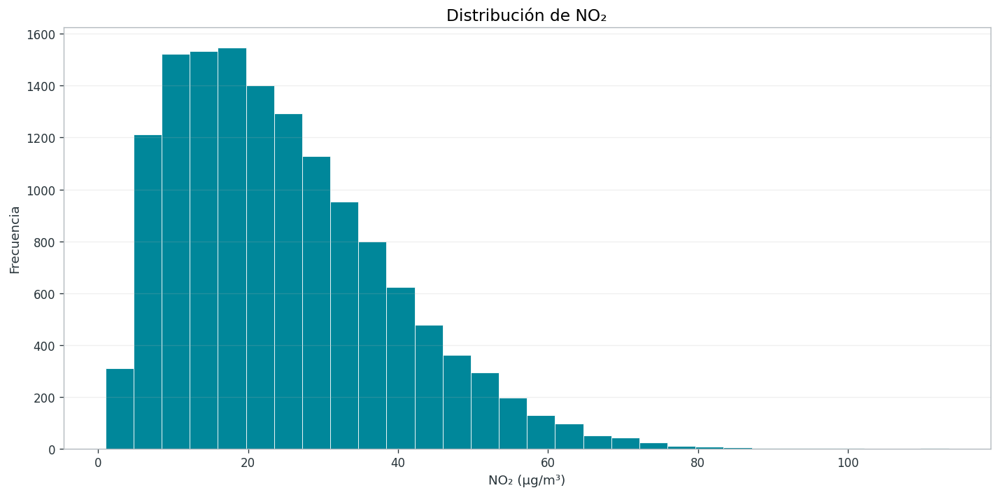

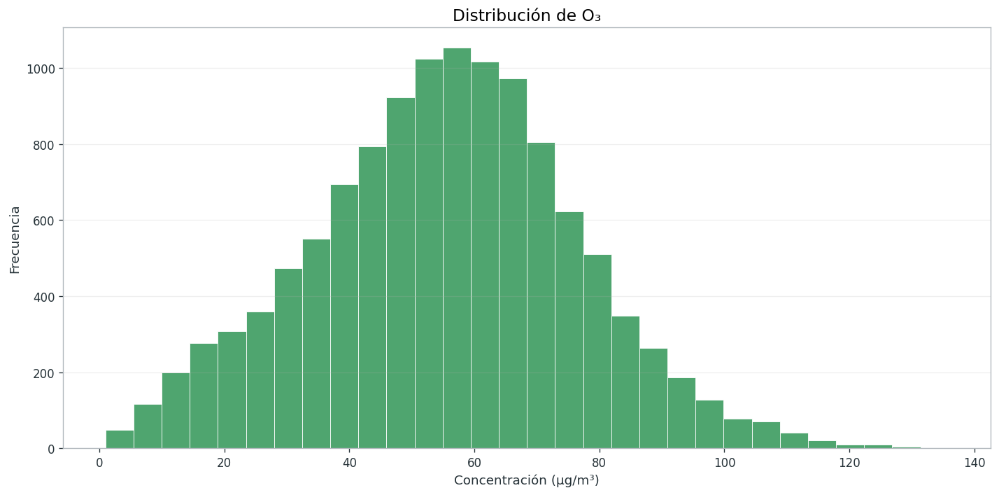

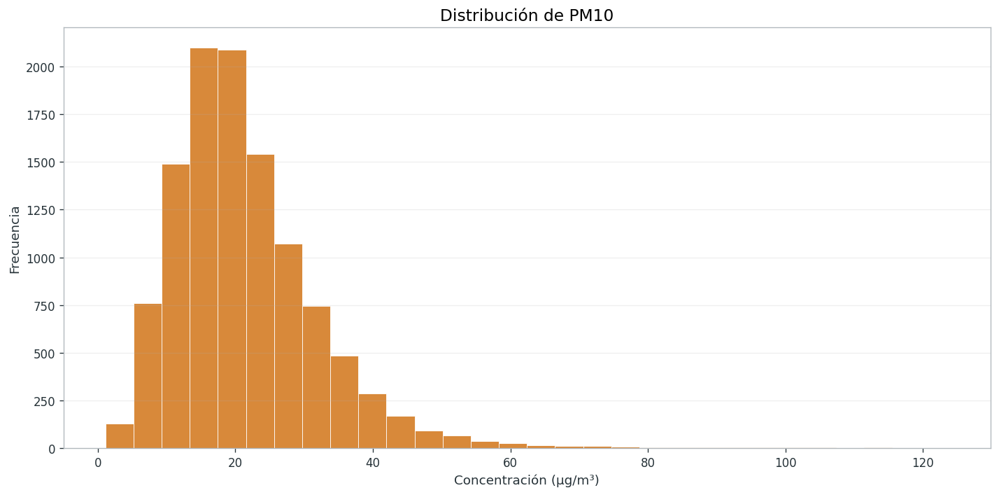

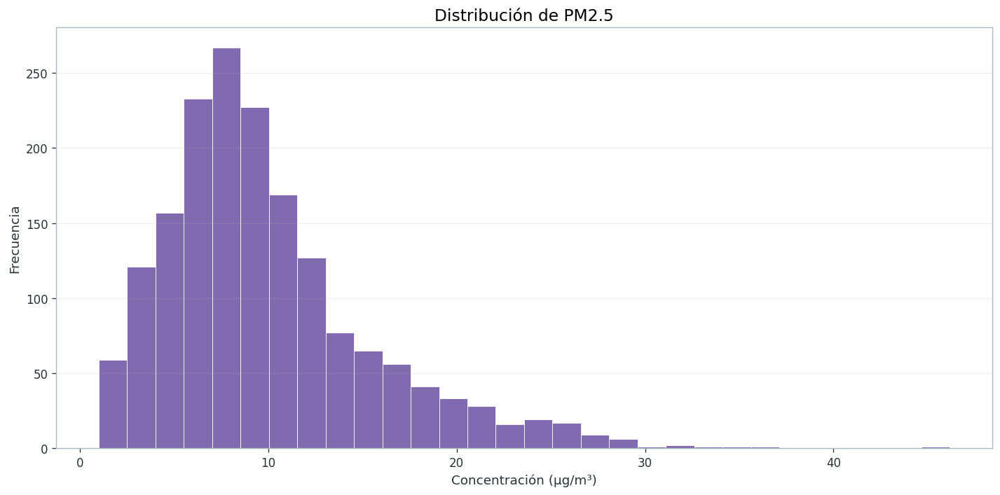

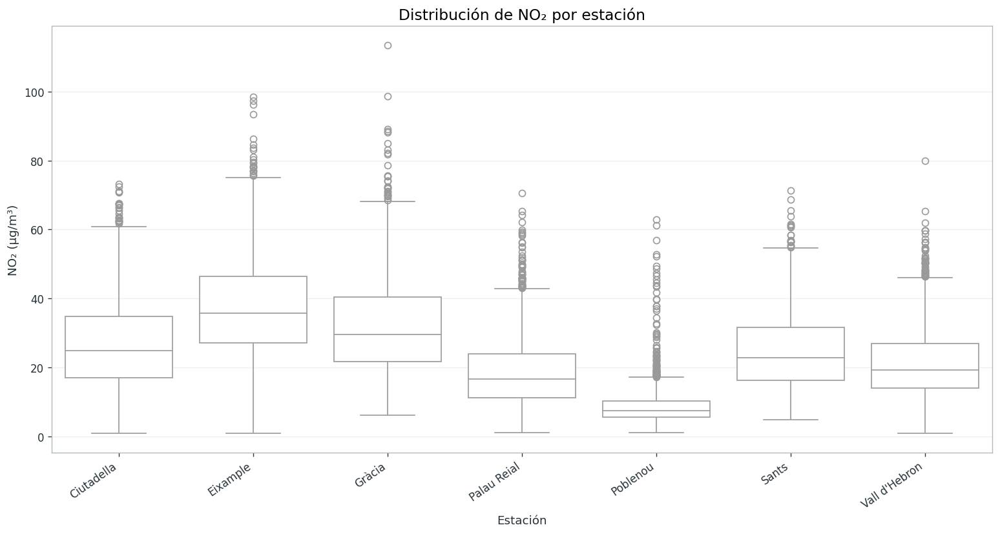

...

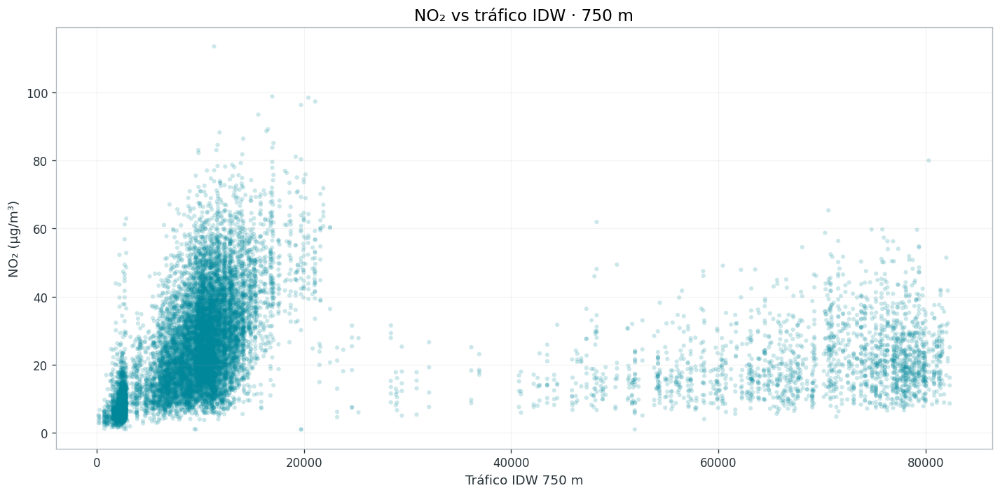

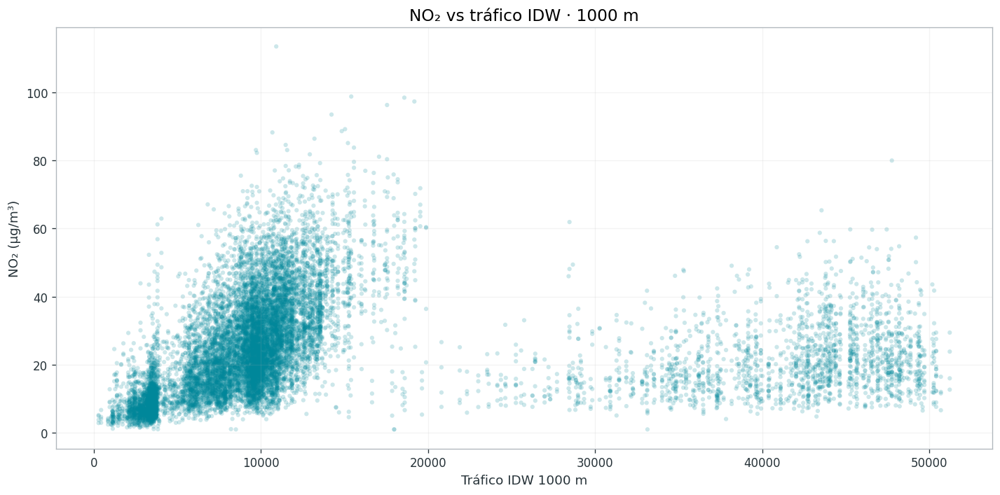

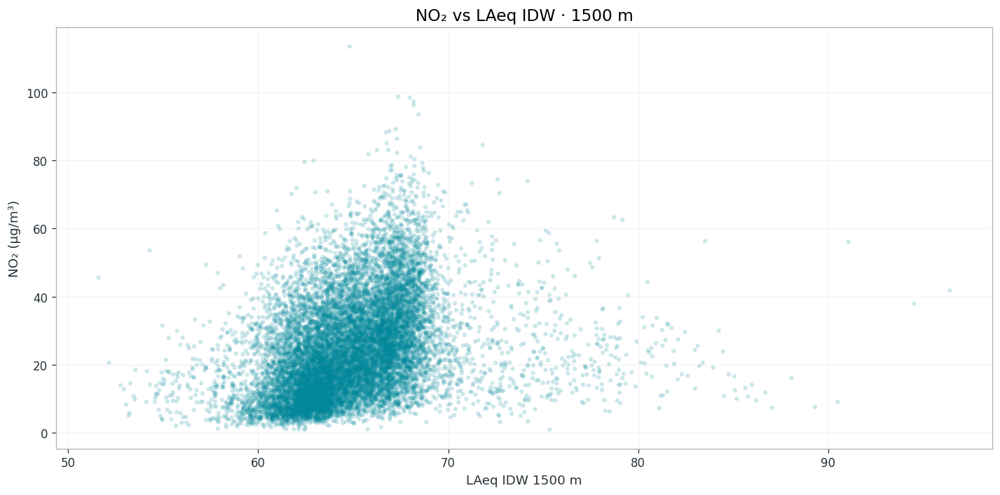

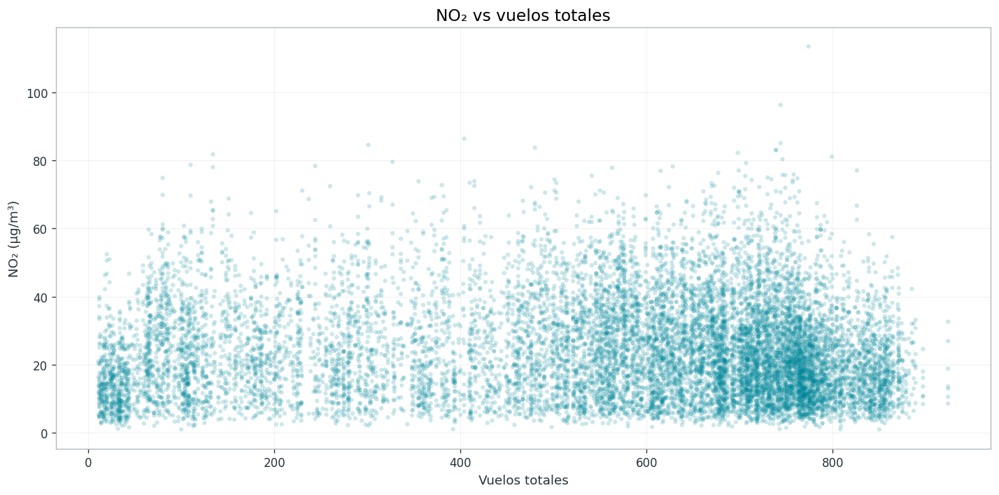

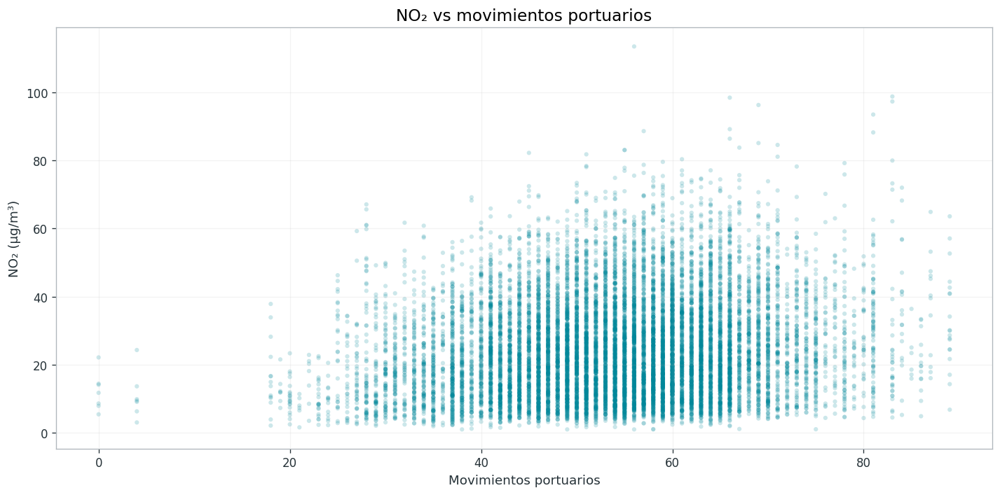


DISTRIBUCIÓN DEL TARGET
clase_NO2_3
Buena    8079
Media    5680
Mala      263
NaN       122
Name: count, dtype: int64

✓ Porcentajes:
clase_NO2_3
Buena    57.62
Media    40.51
Mala      1.88
Name: proportion, dtype: float64

CELDA 12 · EDA COMPLETADO

✓ Observaciones finales : 14,144
✓ Variables finales    : 79

✓ Periodos temporales:
periodo_covid
Pre-COVID     1593
COVID         4948
Post-COVID    7603
Name: count, dtype: Int64

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/EDA

✓ EDA COMPLETADO


In [ ]:
# =============================================================================
# BREATHE BARCELONA · CELDA 12
# EDA · MAESTRO 06 · CONTAMINACIÓN + ENTORNO URBANO
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# -----------------------------------------------------------------------------
# 0. CONFIGURACIÓN
# -----------------------------------------------------------------------------

RUTA_MAESTRO_06 = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "INTEGRACION/06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv"
)

DIR_MODELO_TEMPORAL = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal"
)

DIR_FIGURAS_EDA = DIR_MODELO_TEMPORAL / "02_Figuras" / "EDA"
DIR_FIGURAS_EDA.mkdir(parents=True, exist_ok=True)

# -----------------------------------------------------------------------------
# PALETA BREATHE BARCELONA
# -----------------------------------------------------------------------------

PALETA = {
    "NO2": "#00879A",
    "O3": "#4FA56F",
    "PM10": "#D8893A",
    "PM25": "#806BB0",
    "Pre-COVID": "#5F7487",
    "COVID": "#D47B38",
    "Post-COVID": "#00879A",
    "texto": "#263238",
    "grid": "#D9DEE2",
}

# -----------------------------------------------------------------------------
# ESTILO
# -----------------------------------------------------------------------------

plt.rcParams.update({
    "figure.figsize": (12, 6),
    "figure.dpi": 120,
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "axes.edgecolor": "#B0B7BC",
    "axes.labelcolor": PALETA["texto"],
    "xtick.color": PALETA["texto"],
    "ytick.color": PALETA["texto"],
    "font.family": "DejaVu Sans",
})

# =============================================================================
# 1. CARGA
# =============================================================================

df = pd.read_csv(
    RUTA_MAESTRO_06,
    low_memory=False
)

df["fecha"] = pd.to_datetime(df["fecha"], errors="coerce")

print("✓ Maestro 06:")
print(RUTA_MAESTRO_06)

print("\n✓ Maestro 06 cargado")
print(f"✓ Filas: {len(df):,}")
print(f"✓ Columnas: {df.shape[1]:,}")

# =============================================================================
# 2. FILTRO TEMPORAL 2019–2024
# =============================================================================

df = df[
    (df["fecha"] >= "2019-01-01") &
    (df["fecha"] <= "2024-12-31")
].copy()

# =============================================================================
# 3. NORMALIZACIÓN DE ESTACIÓN
# =============================================================================

df["estacion_geo"] = df["estacion_geo"].astype(str).str.strip()

# =============================================================================
# 4. CONTAMINACIÓN → FORMATO ANCHO
# =============================================================================

contaminantes = ["NO2", "O3", "PM10", "PM2.5"]

df_cont = df[
    df["contaminant"].isin(contaminantes)
].copy()

# -----------------------------------------------------------------------------
# Agregación de posibles códigos físicos duplicados
# -----------------------------------------------------------------------------

df_cont_ag = (
    df_cont
    .groupby(
        ["fecha", "estacion_geo", "contaminant"],
        as_index=False
    )["valor"]
    .mean()
)

print("\n✓ Contaminación agregada por:")
print("  fecha + estación geográfica + contaminante")

# -----------------------------------------------------------------------------
# Pivot
# -----------------------------------------------------------------------------

df_wide = (
    df_cont_ag
    .pivot_table(
        index=["fecha", "estacion_geo"],
        columns="contaminant",
        values="valor",
        aggfunc="mean"
    )
    .reset_index()
)

df_wide = df_wide.rename(columns={
    "NO2": "NO2_ug_m3",
    "O3": "O3_ug_m3",
    "PM10": "PM10_ug_m3",
    "PM2.5": "PM25_ug_m3",
})

for col in ["NO2_ug_m3", "O3_ug_m3", "PM10_ug_m3", "PM25_ug_m3"]:
    if col not in df_wide.columns:
        df_wide[col] = np.nan

print("\n✓ Contaminación transformada a formato ancho")
print(f"✓ Filas: {len(df_wide):,}")

# =============================================================================
# 5. VARIABLES AMBIENTALES Y DE ENTORNO
# =============================================================================

# Variables que no son contaminación
columnas_clave = [
    "fecha",
    "estacion_geo"
]

columnas_contaminacion = [
    "contaminant",
    "valor",
    "horas_validas"
]

# Nos quedamos con una observación por fecha + estación
# usando la media para variables numéricas y el primer valor para objetos.

df_aux = df.drop(
    columns=[
        c for c in columnas_contaminacion
        if c in df.columns
    ],
    errors="ignore"
).copy()

# -----------------------------------------------------------------------------
# Separación numéricas / no numéricas
# -----------------------------------------------------------------------------

num_cols = df_aux.select_dtypes(include=[np.number]).columns.tolist()

num_cols = [
    c for c in num_cols
    if c not in ["codi_estacio"]
]

obj_cols = df_aux.select_dtypes(
    include=["object", "category"]
).columns.tolist()

obj_cols = [
    c for c in obj_cols
    if c not in ["estacion_geo"]
]

# -----------------------------------------------------------------------------
# Agregación
# -----------------------------------------------------------------------------

df_num = (
    df_aux
    .groupby(["fecha", "estacion_geo"], as_index=False)[num_cols]
    .mean()
)

# Algunas variables de identificación se conservan mediante first
obj_cols_validos = [
    c for c in obj_cols
    if c not in ["fecha", "estacion_geo"]
]

if obj_cols_validos:
    df_obj = (
        df_aux
        .groupby(["fecha", "estacion_geo"], as_index=False)[obj_cols_validos]
        .first()
    )
else:
    df_obj = df_aux[["fecha", "estacion_geo"]].drop_duplicates()

# -----------------------------------------------------------------------------
# Merge
# -----------------------------------------------------------------------------

df_integrado = df_wide.merge(
    df_num,
    on=["fecha", "estacion_geo"],
    how="left",
    suffixes=("", "_aux")
)

# Añadimos objetos si existen
if len(obj_cols_validos) > 0:
    df_integrado = df_integrado.merge(
        df_obj,
        on=["fecha", "estacion_geo"],
        how="left",
        suffixes=("", "_obj")
    )

# -----------------------------------------------------------------------------
# Eliminar duplicados derivados del merge
# -----------------------------------------------------------------------------

df_integrado = (
    df_integrado
    .sort_values(["fecha", "estacion_geo"])
    .drop_duplicates(["fecha", "estacion_geo"])
    .reset_index(drop=True)
)

print("\n✓ Variables explicativas disponibles:")
print(
    len([
        c for c in df_integrado.columns
        if c not in [
            "fecha",
            "estacion_geo",
            "NO2_ug_m3",
            "O3_ug_m3",
            "PM10_ug_m3",
            "PM25_ug_m3"
        ]
    ])
)

print(f"\n✓ Filas    : {len(df_integrado):,}")
print(f"✓ Columnas : {df_integrado.shape[1]:,}")

# =============================================================================
# 6. VARIABLES TEMPORALES
# =============================================================================

df_integrado["anio"] = df_integrado["fecha"].dt.year
df_integrado["mes"] = df_integrado["fecha"].dt.month
df_integrado["dia"] = df_integrado["fecha"].dt.day

# -----------------------------------------------------------------------------
# Pre-COVID / COVID / Post-COVID
# -----------------------------------------------------------------------------

df_integrado["periodo_covid"] = np.select(
    [
        df_integrado["anio"] == 2019,
        df_integrado["anio"].isin([2020, 2021]),
        df_integrado["anio"].isin([2022, 2023, 2024])
    ],
    [
        "Pre-COVID",
        "COVID",
        "Post-COVID"
    ],
    default="Sin periodo"
)

df_integrado["periodo_covid"] = (
    df_integrado["periodo_covid"]
    .astype("string")
)

print("\n✓ Periodos temporales:")
print(
    df_integrado["periodo_covid"]
    .value_counts()
    .reindex(["Pre-COVID", "COVID", "Post-COVID"])
)

# =============================================================================
# 7. VARIABLE OBJETIVO
# =============================================================================

# Clasificación NO2 en tres niveles:
#
# Buena  : <= 25 µg/m³
# Media  : >25 y <=60 µg/m³
# Mala   : >60 µg/m³
#
# La variable continua NO2 se conserva para EDA y análisis posteriores.

df_integrado["clase_NO2_3"] = pd.cut(
    df_integrado["NO2_ug_m3"],
    bins=[-np.inf, 25, 60, np.inf],
    labels=["Buena", "Media", "Mala"],
    right=True
)

df_integrado["target"] = (
    df_integrado["clase_NO2_3"]
    .map({
        "Buena": 0,
        "Media": 1,
        "Mala": 2
    })
    .astype("Int64")
)

print("\n✓ Variable objetivo:")
print("  NO2_ug_m3 → clase_NO2_3 → target")

# =============================================================================
# 8. AUDITORÍA BÁSICA
# =============================================================================

print("\n" + "=" * 80)
print("AUDITORÍA EDA")
print("=" * 80)

print(f"\n✓ Duplicados fecha + estación: "
      f"{df_integrado.duplicated(['fecha', 'estacion_geo']).sum()}")

print("\n✓ COBERTURA TEMPORAL")
print(f"Inicio: {df_integrado['fecha'].min()}")
print(f"Fin   : {df_integrado['fecha'].max()}")
print(
    f"Días distintos: "
    f"{df_integrado['fecha'].dt.normalize().nunique():,}"
)

print("\n✓ COBERTURA POR ESTACIÓN")

cobertura = (
    df_integrado
    .groupby("estacion_geo")
    .agg(
        observaciones=("fecha", "size"),
        fecha_inicio=("fecha", "min"),
        fecha_fin=("fecha", "max"),
        dias_distintos=("fecha", lambda x: x.dt.normalize().nunique())
    )
    .sort_index()
)

print(cobertura)

print("\n✓ VALORES AUSENTES PRINCIPALES")

print(
    df_integrado
    .isna()
    .sum()
    .loc[lambda x: x > 0]
    .sort_values(ascending=False)
    .head(40)
)

# =============================================================================
# 9. ESTADÍSTICOS DESCRIPTIVOS DE CONTAMINANTES
# =============================================================================

cont_cols = [
    "NO2_ug_m3",
    "O3_ug_m3",
    "PM10_ug_m3",
    "PM25_ug_m3"
]

print("\n" + "=" * 80)
print("ESTADÍSTICOS DESCRIPTIVOS · CONTAMINANTES")
print("=" * 80)

print(
    df_integrado[cont_cols]
    .describe()
    .round(3)
)

# =============================================================================
# 10. NO2 POR ESTACIÓN
# =============================================================================

resumen_no2 = (
    df_integrado
    .groupby("estacion_geo")["NO2_ug_m3"]
    .agg(
        observaciones="count",
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .round(3)
)

print("\n## NO₂ · RESUMEN POR ESTACIÓN")
print(resumen_no2)

# =============================================================================
# 11. FIGURA 1 · DISTRIBUCIÓN NO2
# =============================================================================

def guardar_figura(nombre):
    plt.tight_layout()
    plt.savefig(
        DIR_FIGURAS_EDA / nombre,
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()
    plt.close()

plt.figure(figsize=(12, 6))

plt.hist(
    df_integrado["NO2_ug_m3"].dropna(),
    bins=30,
    color=PALETA["NO2"],
    edgecolor="white",
    linewidth=0.5
)

plt.title("Distribución de NO₂")
plt.xlabel("NO₂ (µg/m³)")
plt.ylabel("Frecuencia")
plt.grid(axis="y", alpha=0.20)

guardar_figura("01_distribucion_NO2.png")

# =============================================================================
# 12. FIGURAS 2–4 · RESTO DE CONTAMINANTES
# =============================================================================

config_cont = [
    ("O3_ug_m3", "Distribución de O₃", PALETA["O3"],
     "02_distribucion_O3.png"),
    ("PM10_ug_m3", "Distribución de PM10", PALETA["PM10"],
     "03_distribucion_PM10.png"),
    ("PM25_ug_m3", "Distribución de PM2.5", PALETA["PM25"],
     "04_distribucion_PM25.png"),
]

for variable, titulo, color, nombre in config_cont:

    plt.figure(figsize=(12, 6))

    plt.hist(
        df_integrado[variable].dropna(),
        bins=30,
        color=color,
        edgecolor="white",
        linewidth=0.5
    )

    plt.title(titulo)
    plt.xlabel("Concentración (µg/m³)")
    plt.ylabel("Frecuencia")
    plt.grid(axis="y", alpha=0.20)

    guardar_figura(nombre)

# =============================================================================
# 13. FIGURA 5 · BOXPLOT NO2 POR ESTACIÓN
# =============================================================================

# Observatori Fabra se conserva en el dataset,
# pero no se utiliza en la comparación principal por disponer
# únicamente de 29 días de observación.

estaciones_box = [
    e for e in sorted(df_integrado["estacion_geo"].dropna().unique())
    if e != "Observatori Fabra"
]

df_box = df_integrado[
    df_integrado["estacion_geo"].isin(estaciones_box)
].copy()

plt.figure(figsize=(13, 7))

sns.boxplot(
    data=df_box,
    x="estacion_geo",
    y="NO2_ug_m3",
    color="white",
    linewidth=1
)

plt.title("Distribución de NO₂ por estación")
plt.xlabel("Estación")
plt.ylabel("NO₂ (µg/m³)")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.20)

guardar_figura("05_boxplot_NO2_estacion.png")

# =============================================================================
# 14. FIGURA 6 · EVOLUCIÓN TEMPORAL GLOBAL
# =============================================================================

serie_no2 = (
    df_integrado
    .groupby("fecha", as_index=False)["NO2_ug_m3"]
    .mean()
    .sort_values("fecha")
)

plt.figure(figsize=(16, 6))

plt.plot(
    serie_no2["fecha"],
    serie_no2["NO2_ug_m3"],
    linewidth=0.8,
    color=PALETA["NO2"]
)

# Franjas temporales
plt.axvspan(
    pd.Timestamp("2019-01-01"),
    pd.Timestamp("2019-12-31"),
    color=PALETA["Pre-COVID"],
    alpha=0.08,
    label="Pre-COVID"
)

plt.axvspan(
    pd.Timestamp("2020-01-01"),
    pd.Timestamp("2021-12-31"),
    color=PALETA["COVID"],
    alpha=0.08,
    label="COVID"
)

plt.axvspan(
    pd.Timestamp("2022-01-01"),
    pd.Timestamp("2024-12-31"),
    color=PALETA["Post-COVID"],
    alpha=0.06,
    label="Post-COVID"
)

plt.title(
    "Evolución temporal de la concentración media diaria de NO₂"
)
plt.xlabel("Fecha")
plt.ylabel("NO₂ (µg/m³)")
plt.legend(frameon=False)
plt.grid(axis="y", alpha=0.20)

guardar_figura("06_serie_temporal_NO2_covid.png")

# =============================================================================
# 15. FIGURA 7 · EVOLUCIÓN ANUAL
# =============================================================================

media_anual = (
    df_integrado
    .groupby("anio")["NO2_ug_m3"]
    .mean()
)

plt.figure(figsize=(12, 6))

plt.plot(
    media_anual.index,
    media_anual.values,
    marker="o",
    linewidth=2,
    color=PALETA["NO2"]
)

for x, y in zip(media_anual.index, media_anual.values):
    plt.text(
        x,
        y + 0.35,
        f"{y:.1f}",
        ha="center",
        fontsize=9
    )

plt.title("Concentración media anual de NO₂")
plt.xlabel("Año")
plt.ylabel("NO₂ (µg/m³)")
plt.xticks(media_anual.index)
plt.grid(axis="y", alpha=0.20)

guardar_figura("07_media_anual_NO2.png")

# =============================================================================
# 16. FIGURA 8 · PRE-COVID / COVID / POST-COVID
# =============================================================================

orden_periodos = [
    "Pre-COVID",
    "COVID",
    "Post-COVID"
]

media_periodo = (
    df_integrado
    .groupby("periodo_covid", observed=False)["NO2_ug_m3"]
    .mean()
    .reindex(orden_periodos)
)

plt.figure(figsize=(11, 6))

bars = plt.bar(
    media_periodo.index,
    media_periodo.values,
    color=[
        PALETA["Pre-COVID"],
        PALETA["COVID"],
        PALETA["Post-COVID"]
    ]
)

for bar, valor in zip(bars, media_periodo.values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.3,
        f"{valor:.1f}",
        ha="center",
        fontsize=10
    )

plt.title("NO₂ medio por periodo temporal")
plt.xlabel("Periodo")
plt.ylabel("NO₂ (µg/m³)")
plt.grid(axis="y", alpha=0.20)

guardar_figura("08_NO2_periodos_covid.png")

# =============================================================================
# 17. FIGURA 9 · HEATMAP ESTACIÓN × AÑO
# =============================================================================

heatmap_no2 = (
    df_integrado
    .pivot_table(
        index="estacion_geo",
        columns="anio",
        values="NO2_ug_m3",
        aggfunc="mean"
    )
)

plt.figure(figsize=(12, 7))

sns.heatmap(
    heatmap_no2,
    annot=True,
    fmt=".1f",
    cmap=sns.light_palette(
        PALETA["NO2"],
        as_cmap=True
    ),
    linewidths=0.5,
    cbar_kws={"label": "NO₂ (µg/m³)"}
)

plt.title("Concentración media de NO₂ por estación y año")
plt.xlabel("Año")
plt.ylabel("Estación")

guardar_figura("09_heatmap_NO2_estacion_anio.png")

# =============================================================================
# 18. FIGURA 10 · CORRELACIÓN ENTRE CONTAMINANTES
# =============================================================================

corr_cont = (
    df_integrado[cont_cols]
    .corr()
)

plt.figure(figsize=(9, 7))

sns.heatmap(
    corr_cont,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    vmin=-1,
    vmax=1,
    center=0,
    linewidths=0.5,
    cbar_kws={"label": "Correlación"}
)

plt.title("Correlación entre contaminantes")
plt.xlabel("")
plt.ylabel("")

guardar_figura("10_correlacion_contaminantes.png")

# =============================================================================
# 19. FUNCIÓN GENERAL PARA SCATTERPLOTS
# =============================================================================

def scatter_eda(
    x,
    titulo,
    xlabel,
    nombre,
    alpha=0.20,
    s=14
):

    if x not in df_integrado.columns:
        print(f"⚠️ Variable no disponible: {x}")
        return

    tmp = df_integrado[[x, "NO2_ug_m3"]].dropna()

    if len(tmp) == 0:
        print(f"⚠️ Sin datos para: {x}")
        return

    plt.figure(figsize=(12, 6))

    plt.scatter(
        tmp[x],
        tmp["NO2_ug_m3"],
        s=s,
        alpha=alpha,
        color=PALETA["NO2"],
        edgecolors="none"
    )

    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel("NO₂ (µg/m³)")
    plt.grid(alpha=0.15)

    guardar_figura(nombre)

# =============================================================================
# 20. METEOROLOGÍA
# =============================================================================

scatter_eda(
    "TM",
    "NO₂ vs TM",
    "TM",
    "11_NO2_vs_TM.png"
)

scatter_eda(
    "HRM",
    "NO₂ vs HRM",
    "HRM",
    "12_NO2_vs_HRM.png"
)

scatter_eda(
    "PPT",
    "NO₂ vs PPT",
    "PPT",
    "13_NO2_vs_PPT.png"
)

scatter_eda(
    "VVM10",
    "NO₂ vs VVM10",
    "VVM10",
    "14_NO2_vs_VVM10.png"
)

# =============================================================================
# 21. TRÁFICO
# =============================================================================

scatter_eda(
    "trafico_idw_500m",
    "NO₂ vs tráfico IDW · 500 m",
    "Tráfico IDW 500 m",
    "15_NO2_vs_trafico_500m.png"
)

scatter_eda(
    "trafico_idw_750m",
    "NO₂ vs tráfico IDW · 750 m",
    "Tráfico IDW 750 m",
    "16_NO2_vs_trafico_750m.png"
)

scatter_eda(
    "trafico_idw_1000m",
    "NO₂ vs tráfico IDW · 1000 m",
    "Tráfico IDW 1000 m",
    "17_NO2_vs_trafico_1000m.png"
)

# =============================================================================
# 22. RUIDO
# =============================================================================

scatter_eda(
    "LAeq_idw_1500m",
    "NO₂ vs LAeq IDW · 1500 m",
    "LAeq IDW 1500 m",
    "18_NO2_vs_LAeq_1500m.png"
)

# =============================================================================
# 23. ACTIVIDAD AÉREA
# =============================================================================

scatter_eda(
    "Vuelos_total",
    "NO₂ vs vuelos totales",
    "Vuelos totales",
    "19_NO2_vs_vuelos_total.png"
)

# =============================================================================
# 24. ACTIVIDAD PORTUARIA
# =============================================================================

scatter_eda(
    "Puerto_movimientos",
    "NO₂ vs movimientos portuarios",
    "Movimientos portuarios",
    "20_NO2_vs_puerto_movimientos.png"
)

# =============================================================================
# 25. RESUMEN TARGET
# =============================================================================

print("\n" + "=" * 80)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 80)

target_resumen = (
    df_integrado["clase_NO2_3"]
    .value_counts(dropna=False)
)

print(target_resumen)

print("\n✓ Porcentajes:")

print(
    (
        df_integrado["clase_NO2_3"]
        .value_counts(normalize=True)
        .mul(100)
        .round(2)
    )
)

# =============================================================================
# 26. RESUMEN FINAL
# =============================================================================

print("\n" + "=" * 80)
print("CELDA 12 · EDA COMPLETADO")
print("=" * 80)

print(f"\n✓ Observaciones finales : {len(df_integrado):,}")
print(f"✓ Variables finales    : {df_integrado.shape[1]:,}")

print(
    "\n✓ Periodos temporales:"
)
print(
    df_integrado["periodo_covid"]
    .value_counts()
    .reindex(orden_periodos)
)

print(
    "\n✓ Figuras guardadas en:"
)
print(DIR_FIGURAS_EDA)

print("\n✓ EDA COMPLETADO")

In [ ]:
# =============================================================================
# BREATHE BARCELONA · CELDA 12
# EDA · MAESTRO 06 · CONTAMINACIÓN + ENTORNO URBANO
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# -----------------------------------------------------------------------------
# 0. CONFIGURACIÓN
# -----------------------------------------------------------------------------

RUTA_MAESTRO_06 = Path(
    "/content/gdrive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "INTEGRACION/06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv"
)

DIR_MODELO_TEMPORAL = Path(
    "/content/gdrive/MyDrive/TFM/11_Machine_Learning_Temporal"
)

DIR_FIGURAS_EDA = DIR_MODELO_TEMPORAL / "02_Figuras" / "EDA"
DIR_FIGURAS_EDA.mkdir(parents=True, exist_ok=True)

# -----------------------------------------------------------------------------
# PALETA BREATHE BARCELONA
# -----------------------------------------------------------------------------

PALETA = {
    "NO2": "#00879A",          # teal principal
    "O3": "#4FA56F",           # verde
    "PM10": "#D8893A",         # naranja
    "PM25": "#806BB0",         # morado
    "Pre-COVID": "#5F7487",
    "COVID": "#D47B38",
    "Post-COVID": "#00879A",
    "texto": "#263238",
    "grid": "#D9DEE2",
}

# -----------------------------------------------------------------------------
# ESTILO
# -----------------------------------------------------------------------------

plt.rcParams.update({
    "figure.figsize": (12, 6),
    "figure.dpi": 120,
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "axes.edgecolor": "#B0B7BC",
    "axes.labelcolor": PALETA["texto"],
    "xtick.color": PALETA["texto"],
    "ytick.color": PALETA["texto"],
    "font.family": "DejaVu Sans",
})

# =============================================================================
# 1. CARGA
# =============================================================================

df = pd.read_csv(
    RUTA_MAESTRO_06,
    low_memory=False
)

df["fecha"] = pd.to_datetime(df["fecha"], errors="coerce")

print("✓ Maestro 06:")
print(RUTA_MAESTRO_06)

print("\n✓ Maestro 06 cargado")
print(f"✓ Filas: {len(df):,}")
print(f"✓ Columnas: {df.shape[1]:,}")

# =============================================================================
# 2. FILTRO TEMPORAL 2019–2024
# =============================================================================

df = df[
    (df["fecha"] >= "2019-01-01") &
    (df["fecha"] <= "2024-12-31")
].copy()

# =============================================================================
# 3. NORMALIZACIÓN DE ESTACIÓN
# =============================================================================

df["estacion_geo"] = df["estacion_geo"].astype(str).str.strip()

# =============================================================================
# 4. CONTAMINACIÓN → FORMATO ANCHO
# =============================================================================

contaminantes = ["NO2", "O3", "PM10", "PM2.5"]

df_cont = df[
    df["contaminant"].isin(contaminantes)
].copy()

# -------------------------------------------------------------------------
# Agregación de posibles códigos físicos duplicados
# -------------------------------------------------------------------------

df_cont_ag = (
    df_cont
    .groupby(
        ["fecha", "estacion_geo", "contaminant"],
        as_index=False
    )["valor"]
    .mean()
)

print("\n✓ Contaminación agregada por:")
print("  fecha + estación geográfica + contaminante")

# -------------------------------------------------------------------------
# Pivot
# -------------------------------------------------------------------------

df_wide = (
    df_cont_ag
    .pivot_table(
        index=["fecha", "estacion_geo"],
        columns="contaminant",
        values="valor",
        aggfunc="mean"
    )
    .reset_index()
)

df_wide = df_wide.rename(columns={
    "NO2": "NO2_ug_m3",
    "O3": "O3_ug_m3",
    "PM10": "PM10_ug_m3",
    "PM2.5": "PM25_ug_m3",
})

for col in ["NO2_ug_m3", "O3_ug_m3", "PM10_ug_m3", "PM25_ug_m3"]:
    if col not in df_wide.columns:
        df_wide[col] = np.nan

print("\n✓ Contaminación transformada a formato ancho")
print(f"✓ Filas: {len(df_wide):,}")

# =============================================================================
# 5. VARIABLES AMBIENTALES Y DE ENTORNO
# =============================================================================

# Variables que no son contaminación
columnas_clave = [
    "fecha",
    "estacion_geo"
]

columnas_contaminacion = [
    "contaminant",
    "valor",
    "horas_validas"
]

# Nos quedamos con una observación por fecha + estación
# usando la media para variables numéricas y el primer valor para objetos.

df_aux = df.drop(
    columns=[
        c for c in columnas_contaminacion
        if c in df.columns
    ],
    errors="ignore"
).copy()

# -----------------------------------------------------------------------------
# Separación numéricas / no numéricas
# -----------------------------------------------------------------------------

num_cols = df_aux.select_dtypes(include=[np.number]).columns.tolist()

num_cols = [
    c for c in num_cols
    if c not in ["codi_estacio"]
]

obj_cols = df_aux.select_dtypes(
    include=["object", "category"]
).columns.tolist()

obj_cols = [
    c for c in obj_cols
    if c not in ["estacion_geo"]
]

# -----------------------------------------------------------------------------
# Agregación
# -----------------------------------------------------------------------------

df_num = (
    df_aux
    .groupby(["fecha", "estacion_geo"], as_index=False)[num_cols]
    .mean()
)

# Algunas variables de identificación se conservan mediante first
obj_cols_validos = [
    c for c in obj_cols
    if c not in ["fecha", "estacion_geo"]
]

if obj_cols_validos:
    df_obj = (
        df_aux
        .groupby(["fecha", "estacion_geo"], as_index=False)[obj_cols_validos]
        .first()
    )
else:
    df_obj = df_aux[["fecha", "estacion_geo"]].drop_duplicates()

# -----------------------------------------------------------------------------
# Merge
# -----------------------------------------------------------------------------

df_integrado = df_wide.merge(
    df_num,
    on=["fecha", "estacion_geo"],
    how="left",
    suffixes=("", "_aux")
)

# Añadimos objetos si existen
if len(obj_cols_validos) > 0:
    df_integrado = df_integrado.merge(
        df_obj,
        on=["fecha", "estacion_geo"],
        how="left",
        suffixes=("", "_obj")
    )

# -----------------------------------------------------------------------------
# Eliminar duplicados derivados del merge
# -----------------------------------------------------------------------------

df_integrado = (
    df_integrado
    .sort_values(["fecha", "estacion_geo"])
    .drop_duplicates(["fecha", "estacion_geo"])
    .reset_index(drop=True)
)

print("\n✓ Variables explicativas disponibles:")
print(
    len([
        c for c in df_integrado.columns
        if c not in [
            "fecha",
            "estacion_geo",
            "NO2_ug_m3",
            "O3_ug_m3",
            "PM10_ug_m3",
            "PM25_ug_m3"
        ]
    ])
)

print(f"\n✓ Filas    : {len(df_integrado):,}")
print(f"✓ Columnas : {df_integrado.shape[1]:,}")

# =============================================================================
# 6. VARIABLES TEMPORALES
# =============================================================================

df_integrado["anio"] = df_integrado["fecha"].dt.year
df_integrado["mes"] = df_integrado["fecha"].dt.month
df_integrado["dia"] = df_integrado["fecha"].dt.day

# -----------------------------------------------------------------------------
# Pre-COVID / COVID / Post-COVID
# -----------------------------------------------------------------------------

df_integrado["periodo_covid"] = np.select(
    [
        df_integrado["anio"] == 2019,
        df_integrado["anio"].isin([2020, 2021]),
        df_integrado["anio"].isin([2022, 2023, 2024])
    ],
    [
        "Pre-COVID",
        "COVID",
        "Post-COVID"
    ],
    default="Sin periodo"
)

df_integrado["periodo_covid"] = (
    df_integrado["periodo_covid"]
    .astype("string")
)

print("\n✓ Periodos temporales:")
print(
    df_integrado["periodo_covid"]
    .value_counts()
    .reindex(["Pre-COVID", "COVID", "Post-COVID"])
)

# =============================================================================
# 7. VARIABLE OBJETIVO
# =============================================================================

# Clasificación NO2 en tres niveles:
#
# Buena  : <= 25 µg/m³
# Media  : >25 y <=60 µg/m³
# Mala   : >60 µg/m³
#
# La variable continua NO2 se conserva para EDA y análisis posteriores.

df_integrado["clase_NO2_3"] = pd.cut(
    df_integrado["NO2_ug_m3"],
    bins=[-np.inf, 25, 60, np.inf],
    labels=["Buena", "Media", "Mala"],
    right=True
)

df_integrado["target"] = (
    df_integrado["clase_NO2_3"]
    .map({
        "Buena": 0,
        "Media": 1,
        "Mala": 2
    })
    .astype("Int64")
)

print("\n✓ Variable objetivo:")
print("  NO2_ug_m3 → clase_NO2_3 → target")

# =============================================================================
# 8. AUDITORÍA BÁSICA
# =============================================================================

print("\n" + "=" * 80)
print("AUDITORÍA EDA")
print("=" * 80)

print(f"\n✓ Duplicados fecha + estación: "
      f"{df_integrado.duplicated(['fecha', 'estacion_geo']).sum()}")

print("\n✓ COBERTURA TEMPORAL")
print(f"Inicio: {df_integrado['fecha'].min()}")
print(f"Fin   : {df_integrado['fecha'].max()}")
print(
    f"Días distintos: "
    f"{df_integrado['fecha'].dt.normalize().nunique():,}"
)

print("\n✓ COBERTURA POR ESTACIÓN")

cobertura = (
    df_integrado
    .groupby("estacion_geo")
    .agg(
        observaciones=("fecha", "size"),
        fecha_inicio=("fecha", "min"),
        fecha_fin=("fecha", "max"),
        dias_distintos=("fecha", lambda x: x.dt.normalize().nunique())
    )
    .sort_index()
)

print(cobertura)

print("\n✓ VALORES AUSENTES PRINCIPALES")

print(
    df_integrado
    .isna()
    .sum()
    .loc[lambda x: x > 0]
    .sort_values(ascending=False)
    .head(40)
)

# =============================================================================
# 9. ESTADÍSTICOS DESCRIPTIVOS DE CONTAMINANTES
# =============================================================================

cont_cols = [
    "NO2_ug_m3",
    "O3_ug_m3",
    "PM10_ug_m3",
    "PM25_ug_m3"
]

print("\n" + "=" * 80)
print("ESTADÍSTICOS DESCRIPTIVOS · CONTAMINANTES")
print("=" * 80)

print(
    df_integrado[cont_cols]
    .describe()
    .round(3)
)

# =============================================================================
# 10. NO2 POR ESTACIÓN
# =============================================================================

resumen_no2 = (
    df_integrado
    .groupby("estacion_geo")["NO2_ug_m3"]
    .agg(
        observaciones="count",
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .round(3)
)

print("\n## NO₂ · RESUMEN POR ESTACIÓN")
print(resumen_no2)

# =============================================================================
# 11. FIGURA 1 · DISTRIBUCIÓN NO2
# =============================================================================

def guardar_figura(nombre):
    plt.tight_layout()
    plt.savefig(
        DIR_FIGURAS_EDA / nombre,
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()
    plt.close()

plt.figure(figsize=(12, 6))

plt.hist(
    df_integrado["NO2_ug_m3"].dropna(),
    bins=30,
    color=PALETA["NO2"],
    edgecolor="white",
    linewidth=0.5
)

plt.title("Distribución de NO₂")
plt.xlabel("NO₂ (µg/m³)")
plt.ylabel("Frecuencia")
plt.grid(axis="y", alpha=0.20)

guardar_figura("01_distribucion_NO2.png")

# =============================================================================
# 12. FIGURAS 2–4 · RESTO DE CONTAMINANTES
# =============================================================================

config_cont = [
    ("O3_ug_m3", "Distribución de O₃", PALETA["O3"],
     "02_distribucion_O3.png"),
    ("PM10_ug_m3", "Distribución de PM10", PALETA["PM10"],
     "03_distribucion_PM10.png"),
    ("PM25_ug_m3", "Distribución de PM2.5", PALETA["PM25"],
     "04_distribucion_PM25.png"),
]

for variable, titulo, color, nombre in config_cont:

    plt.figure(figsize=(12, 6))

    plt.hist(
        df_integrado[variable].dropna(),
        bins=30,
        color=color,
        edgecolor="white",
        linewidth=0.5
    )

    plt.title(titulo)
    plt.xlabel("Concentración (µg/m³)")
    plt.ylabel("Frecuencia")
    plt.grid(axis="y", alpha=0.20)

    guardar_figura(nombre)

# =============================================================================
# 13. FIGURA 5 · BOXPLOT NO2 POR ESTACIÓN
# =============================================================================

# Observatori Fabra se conserva en el dataset,
# pero no se utiliza en la comparación principal por disponer
# únicamente de 29 días de observación.

estaciones_box = [
    e for e in sorted(df_integrado["estacion_geo"].dropna().unique())
    if e != "Observatori Fabra"
]

df_box = df_integrado[
    df_integrado["estacion_geo"].isin(estaciones_box)
].copy()

plt.figure(figsize=(13, 7))

sns.boxplot(
    data=df_box,
    x="estacion_geo",
    y="NO2_ug_m3",
    color="white",
    linewidth=1
)

plt.title("Distribución de NO₂ por estación")
plt.xlabel("Estación")
plt.ylabel("NO₂ (µg/m³)")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.20)

guardar_figura("05_boxplot_NO2_estacion.png")

# =============================================================================
# 14. FIGURA 6 · EVOLUCIÓN TEMPORAL GLOBAL
# =============================================================================

serie_no2 = (
    df_integrado
    .groupby("fecha", as_index=False)["NO2_ug_m3"]
    .mean()
    .sort_values("fecha")
)

plt.figure(figsize=(16, 6))

plt.plot(
    serie_no2["fecha"],
    serie_no2["NO2_ug_m3"],
    linewidth=0.8,
    color=PALETA["NO2"]
)

# Franjas temporales
plt.axvspan(
    pd.Timestamp("2019-01-01"),
    pd.Timestamp("2019-12-31"),
    color=PALETA["Pre-COVID"],
    alpha=0.08,
    label="Pre-COVID"
)

plt.axvspan(
    pd.Timestamp("2020-01-01"),
    pd.Timestamp("2021-12-31"),
    color=PALETA["COVID"],
    alpha=0.08,
    label="COVID"
)

plt.axvspan(
    pd.Timestamp("2022-01-01"),
    pd.Timestamp("2024-12-31"),
    color=PALETA["Post-COVID"],
    alpha=0.06,
    label="Post-COVID"
)

plt.title(
    "Evolución temporal de la concentración media diaria de NO₂"
)
plt.xlabel("Fecha")
plt.ylabel("NO₂ (µg/m³)")
plt.legend(frameon=False)
plt.grid(axis="y", alpha=0.20)

guardar_figura("06_serie_temporal_NO2_covid.png")

# =============================================================================
# 15. FIGURA 7 · EVOLUCIÓN ANUAL
# =============================================================================

media_anual = (
    df_integrado
    .groupby("anio")["NO2_ug_m3"]
    .mean()
)

plt.figure(figsize=(12, 6))

plt.plot(
    media_anual.index,
    media_anual.values,
    marker="o",
    linewidth=2,
    color=PALETA["NO2"]
)

for x, y in zip(media_anual.index, media_anual.values):
    plt.text(
        x,
        y + 0.35,
        f"{y:.1f}",
        ha="center",
        fontsize=9
    )

plt.title("Concentración media anual de NO₂")
plt.xlabel("Año")
plt.ylabel("NO₂ (µg/m³)")
plt.xticks(media_anual.index)
plt.grid(axis="y", alpha=0.20)

guardar_figura("07_media_anual_NO2.png")

# =============================================================================
# 16. FIGURA 8 · PRE-COVID / COVID / POST-COVID
# =============================================================================

orden_periodos = [
    "Pre-COVID",
    "COVID",
    "Post-COVID"
]

media_periodo = (
    df_integrado
    .groupby("periodo_covid", observed=False)["NO2_ug_m3"]
    .mean()
    .reindex(orden_periodos)
)

plt.figure(figsize=(11, 6))

bars = plt.bar(
    media_periodo.index,
    media_periodo.values,
    color=[
        PALETA["Pre-COVID"],
        PALETA["COVID"],
        PALETA["Post-COVID"]
    ]
)

for bar, valor in zip(bars, media_periodo.values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.3,
        f"{valor:.1f}",
        ha="center",
        fontsize=10
    )

plt.title("NO₂ medio por periodo temporal")
plt.xlabel("Periodo")
plt.ylabel("NO₂ (µg/m³)")
plt.grid(axis="y", alpha=0.20)

guardar_figura("08_NO2_periodos_covid.png")

# =============================================================================
# 17. FIGURA 9 · HEATMAP ESTACIÓN × AÑO
# =============================================================================

heatmap_no2 = (
    df_integrado
    .pivot_table(
        index="estacion_geo",
        columns="anio",
        values="NO2_ug_m3",
        aggfunc="mean"
    )
)

plt.figure(figsize=(12, 7))

sns.heatmap(
    heatmap_no2,
    annot=True,
    fmt=".1f",
    cmap=sns.light_palette(
        PALETA["NO2"],
        as_cmap=True
    ),
    linewidths=0.5,
    cbar_kws={"label": "NO₂ (µg/m³)"}
)

plt.title("Concentración media de NO₂ por estación y año")
plt.xlabel("Año")
plt.ylabel("Estación")

guardar_figura("09_heatmap_NO2_estacion_anio.png")

# =============================================================================
# 18. FIGURA 10 · CORRELACIÓN ENTRE CONTAMINANTES
# =============================================================================

corr_cont = (
    df_integrado[cont_cols]
    .corr()
)

plt.figure(figsize=(9, 7))

sns.heatmap(
    corr_cont,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    vmin=-1,
    vmax=1,
    center=0,
    linewidths=0.5,
    cbar_kws={"label": "Correlación"}
)

plt.title("Correlación entre contaminantes")
plt.xlabel("")
plt.ylabel("")

guardar_figura("10_correlacion_contaminantes.png")

# =============================================================================
# 19. FUNCIÓN GENERAL PARA SCATTERPLOTS
# =============================================================================

def scatter_eda(
    x,
    titulo,
    xlabel,
    nombre,
    alpha=0.20,
    s=14
):

    if x not in df_integrado.columns:
        print(f"⚠️ Variable no disponible: {x}")
        return

    tmp = df_integrado[[x, "NO2_ug_m3"]].dropna()

    if len(tmp) == 0:
        print(f"⚠️ Sin datos para: {x}")
        return

    plt.figure(figsize=(12, 6))

    plt.scatter(
        tmp[x],
        tmp["NO2_ug_m3"],
        s=s,
        alpha=alpha,
        color=PALETA["NO2"],
        edgecolors="none"
    )

    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel("NO₂ (µg/m³)")
    plt.grid(alpha=0.15)

    guardar_figura(nombre)

# =============================================================================
# 20. METEOROLOGÍA
# =============================================================================

scatter_eda(
    "TM",
    "NO₂ vs TM",
    "TM",
    "11_NO2_vs_TM.png"
)

scatter_eda(
    "HRM",
    "NO₂ vs HRM",
    "HRM",
    "12_NO2_vs_HRM.png"
)

scatter_eda(
    "PPT",
    "NO₂ vs PPT",
    "PPT",
    "13_NO2_vs_PPT.png"
)

scatter_eda(
    "VVM10",
    "NO₂ vs VVM10",
    "VVM10",
    "14_NO2_vs_VVM10.png"
)

# =============================================================================
# 21. TRÁFICO
# =============================================================================

scatter_eda(
    "trafico_idw_500m",
    "NO₂ vs tráfico IDW · 500 m",
    "Tráfico IDW 500 m",
    "15_NO2_vs_trafico_500m.png"
)

scatter_eda(
    "trafico_idw_750m",
    "NO₂ vs tráfico IDW · 750 m",
    "Tráfico IDW 750 m",
    "16_NO2_vs_trafico_750m.png"
)

scatter_eda(
    "trafico_idw_1000m",
    "NO₂ vs tráfico IDW · 1000 m",
    "Tráfico IDW 1000 m",
    "17_NO2_vs_trafico_1000m.png"
)

# =============================================================================
# 22. RUIDO
# =============================================================================

scatter_eda(
    "LAeq_idw_1500m",
    "NO₂ vs LAeq IDW · 1500 m",
    "LAeq IDW 1500 m",
    "18_NO2_vs_LAeq_1500m.png"
)

# =============================================================================
# 23. ACTIVIDAD AÉREA
# =============================================================================

scatter_eda(
    "Vuelos_total",
    "NO₂ vs vuelos totales",
    "Vuelos totales",
    "19_NO2_vs_vuelos_total.png"
)

# =============================================================================
# 24. ACTIVIDAD PORTUARIA
# =============================================================================

scatter_eda(
    "Puerto_movimientos",
    "NO₂ vs movimientos portuarios",
    "Movimientos portuarios",
    "20_NO2_vs_puerto_movimientos.png"
)

# =============================================================================
# 25. RESUMEN TARGET
# =============================================================================

print("\n" + "=" * 80)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 80)

target_resumen = (
    df_integrado["clase_NO2_3"]
    .value_counts(dropna=False)
)

print(target_resumen)

print("\n✓ Porcentajes:")

print(
    (
        df_integrado["clase_NO2_3"]
        .value_counts(normalize=True)
        .mul(100)
        .round(2)
    )
)

# =============================================================================
# 26. RESUMEN FINAL
# =============================================================================

print("\n" + "=" * 80)
print("CELDA 12 · EDA COMPLETADO")
print("=" * 80)

print(f"\n✓ Observaciones finales : {len(df_integrado):,}")
print(f"✓ Variables finales    : {df_integrado.shape[1]:,}")

print(
    "\n✓ Periodos temporales:"
)
print(
    df_integrado["periodo_covid"]
    .value_counts()
    .reindex(orden_periodos)
)

print(
    "\n✓ Figuras guardadas en:"
)
print(DIR_FIGURAS_EDA)

print("\n✓ EDA COMPLETADO")

FileNotFoundError: [Errno 2] No such file or directory: '/content/gdrive/MyDrive/TFM/11_Machine_Learning_Temporal/INTEGRACION/06_maestro_contaminacion_meteorologia_trafico_ruido_vuelos_puerto.csv'

### RESULTADOS DEL ANÁLISIS EXPLORATORIO DE DATOS (EDA)

## 1. Estructura final del conjunto de datos

Tras integrar y transformar el Maestro 06 se obtiene un conjunto de **14.144 observaciones y 79 variables**, con una unidad de análisis definida por la combinación **fecha–estación geográfica**.

La información de contaminación se ha transformado desde formato largo a formato ancho, obteniendo una variable independiente para cada uno de los cuatro contaminantes considerados: **NO₂, O₃, PM10 y PM2.5**.

La comprobación de unicidad confirma que no existen duplicados para la combinación fecha–estación:

- Observaciones: **14.144**
- Duplicados fecha + estación: **0**
- Periodo: **2019–2024**
- Días distintos: **2.066**

La disponibilidad temporal no es homogénea entre estaciones. La mayoría presenta cobertura durante todo el periodo, mientras que **Observatori Fabra únicamente dispone de 29 días de observación en enero de 2019**. Esta particularidad se tendrá en cuenta en las comparaciones espaciales y temporales.

---

## 2. Distribución de los contaminantes

El NO₂ presenta una concentración media de **24,53 µg/m³**, con una mediana de **21,96 µg/m³** y una desviación estándar de **14,28 µg/m³**. Los valores oscilan entre **1,00 y 113,40 µg/m³**, mostrando una distribución asimétrica con una cola hacia concentraciones elevadas.

Para el resto de contaminantes se obtienen:

| Contaminante | Media (µg/m³) | Mediana (µg/m³) | Desv. estándar |
|---|---:|---:|---:|
| NO₂ | 24,53 | 21,96 | 14,28 |
| O₃ | 55,19 | 55,78 | 21,20 |
| PM10 | 21,49 | 19,42 | 11,06 |
| PM2.5 | 9,92 | 8,65 | 5,60 |

Las distribuciones muestran comportamientos diferentes entre contaminantes y, en particular, la presencia de colas derechas en NO₂, PM10 y PM2.5. Esto confirma la necesidad de caracterizar las variables antes de aplicar técnicas de modelización.

La disponibilidad de PM2.5 es notablemente inferior a la del resto de contaminantes, por lo que esta variable deberá tratarse con especial precaución en las fases posteriores.

---

## 3. Variabilidad espacial del NO₂

El análisis por estación evidencia una marcada heterogeneidad espacial.

Eixample presenta la mayor concentración media de NO₂, con **37,60 µg/m³**, seguida de Gràcia (**32,03 µg/m³**) y Ciutadella (**26,77 µg/m³**). Sants presenta una media de **24,87 µg/m³**, mientras que Vall d'Hebron y Palau Reial presentan valores inferiores, de **21,35 y 18,84 µg/m³**, respectivamente.

Poblenou presenta una concentración media especialmente baja (**8,78 µg/m³**). Observatori Fabra presenta también una concentración reducida (**10,94 µg/m³**), aunque su cobertura temporal es demasiado limitada para establecer una comparación equivalente con el resto de estaciones.

Las diferencias observadas confirman que la calidad del aire presenta una importante **componente espacial**, por lo que la localización y las características del entorno urbano deberán considerarse en la modelización.

---

## 4. Evolución temporal y periodo COVID

La evolución temporal del NO₂ muestra una variabilidad importante a lo largo del periodo 2019–2024.

La concentración media anual presenta una reducción muy marcada entre **2019 y 2020**, coincidiendo temporalmente con el inicio de la pandemia de COVID-19. Durante 2020 y 2021 se mantienen concentraciones inferiores a las observadas en 2019.

Posteriormente se observa una recuperación parcial en 2022, seguida de una nueva reducción en 2023 y 2024. Por tanto, la evolución posterior a la pandemia no reproduce simplemente el comportamiento previo a 2020.

Para analizar esta dinámica se han definido tres periodos:

- **Pre-COVID:** 2019
- **COVID:** 2020–2021
- **Post-COVID:** 2022–2024

Esta división permitirá analizar posteriormente si los cambios observados en la calidad del aire están asociados únicamente al periodo excepcional de la pandemia o si persisten diferencias estructurales durante el periodo posterior.

---

## 5. Relaciones entre contaminantes

La matriz de correlación muestra que los contaminantes presentan relaciones entre sí, aunque con distinta intensidad.

En particular, NO₂ presenta relaciones positivas con las partículas PM10 y PM2.5, mientras que la relación con O₃ presenta un comportamiento inverso.

Estas relaciones indican que los contaminantes no deben considerarse variables completamente independientes y justifican el análisis conjunto de las variables ambientales.

La posible existencia de correlaciones entre variables explicativas será estudiada posteriormente mediante técnicas de reducción de dimensionalidad, entre ellas **PCA**.

---

## 6. Relación con las variables meteorológicas

Los diagramas bivariantes muestran que la relación entre NO₂ y las variables meteorológicas no es estrictamente lineal.

La temperatura, humedad y precipitación presentan patrones dispersos, mientras que la velocidad del viento muestra una relación más evidente con la concentración de NO₂: los valores elevados de NO₂ tienden a concentrarse con mayor frecuencia bajo condiciones de menor ventilación.

Estos resultados son coherentes con la importancia de las condiciones meteorológicas en la dispersión de los contaminantes y justifican su incorporación como variables explicativas en el modelo.

---

## 7. Relación con el tráfico

Los análisis de NO₂ frente a las variables de tráfico IDW calculadas a **500, 750 y 1000 m** muestran una elevada dispersión y diferencias asociadas al entorno espacial de las estaciones.

No se interpreta esta relación bivariante como evidencia de causalidad. La concentración de NO₂ depende simultáneamente de factores espaciales, meteorológicos y de movilidad.

La disponibilidad de tres escalas espaciales permitirá estudiar posteriormente si existe una escala de influencia del tráfico más informativa para la predicción.

---

## 8. Ruido, actividad aérea y actividad portuaria

Las relaciones exploratorias entre NO₂ y **LAeq**, número de vuelos y movimientos portuarios presentan también una elevada dispersión.

Estas variables no muestran por sí solas una relación lineal suficiente para explicar la concentración de NO₂. Sin embargo, su incorporación resulta relevante desde una perspectiva de **entorno urbano multimodal**, ya que permiten representar fuentes de actividad diferentes del tráfico terrestre.

Su utilidad se evaluará posteriormente dentro del modelo multivariable.

---

## 9. Distribución de la variable objetivo

La concentración continua de NO₂ se ha transformado en tres categorías para el problema de clasificación:

| Clase | Intervalo de NO₂ | Target |
|---|---:|---:|
| Buena | ≤ 25 µg/m³ | 0 |
| Media | > 25 y ≤ 60 µg/m³ | 1 |
| Mala | > 60 µg/m³ | 2 |

De las **14.144 observaciones**, 14.022 disponen de un valor válido de NO₂ y, por tanto, de variable objetivo.

La distribución obtenida es:

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 8.079 | 57,62 % |
| Media | 5.680 | 40,51 % |
| Mala | 263 | 1,88 % |

La distribución evidencia un **fuerte desequilibrio de clases**, especialmente para la categoría *Mala*. Esta característica será relevante en la fase de modelización y deberá tenerse en cuenta tanto en la selección de métricas como en las estrategias de entrenamiento.

---

## 10. Conclusión del EDA

El análisis exploratorio confirma que la concentración de NO₂ presenta simultáneamente una importante **variabilidad espacial y temporal**.

Se observan diferencias claras entre estaciones, una modificación sustancial de los niveles de contaminación durante el periodo COVID y relaciones heterogéneas con las variables meteorológicas y de actividad urbana.

Los análisis bivariantes muestran además que ninguna de las variables consideradas parece explicar por sí sola la variabilidad del NO₂. Esto justifica el planteamiento de un modelo **multivariable de clasificación temporal**, integrando información ambiental, meteorológica y de actividad urbana.

Finalmente, el fuerte desequilibrio de la variable objetivo, con únicamente un **1,88 % de observaciones pertenecientes a la clase Mala**, constituye uno de los principales retos metodológicos para la fase de Machine Learning.

El EDA proporciona así la base para las siguientes etapas del estudio: **análisis temporal, ingeniería de variables, reducción de dimensionalidad, entrenamiento de modelos y evaluación temporal del rendimiento predictivo**.

# 13 · PREPARACIÓN Y AUDITORÍA DE LA VARIABLE OBJETIVO

## Breathe Barcelona · Clasificación temporal de NO₂

Esta celda prepara y audita la variable objetivo utilizada en el problema de
clasificación de la calidad del aire.

La concentración diaria de **NO₂ (`NO2_ug_m3`)** se transforma en tres
categorías:

| Clase | Intervalo NO₂ | Target |
|---|---:|---:|
| Buena | ≤ 25 µg/m³ | 0 |
| Media | > 25 y ≤ 60 µg/m³ | 1 |
| Mala | > 60 µg/m³ | 2 |

El objetivo de esta fase es comprobar la consistencia de la clasificación,
caracterizar su distribución espacial y temporal y evaluar su persistencia
diaria antes de construir los conjuntos de entrenamiento, validación y test.

---

## Objetivos

1. Verificar la consistencia entre `NO2_ug_m3`, `clase_NO2_3` y `target`.
2. Identificar los valores ausentes de la variable objetivo.
3. Construir el conjunto válido para modelización.
4. Analizar la distribución global de las clases.
5. Analizar la distribución espacial por estación.
6. Analizar la evolución anual y mensual del objetivo.
7. Comparar los periodos **Pre-COVID, COVID y Post-COVID**.
8. Caracterizar la clase minoritaria *Mala*.
9. Analizar la persistencia de la clasificación entre **días consecutivos**.

---

## Periodización

Para el análisis temporal se mantienen los tres periodos definidos en la
Celda 12:

- **Pre-COVID:** 2019
- **COVID:** 2020–2021
- **Post-COVID:** 2022–2024

Los 122 registros sin concentración válida de NO₂ se excluyen del conjunto
utilizado para modelización, sin realizar imputación de la variable objetivo.

---

## Desequilibrio de clases

La distribución del objetivo presenta un desequilibrio importante,
especialmente en la categoría **Mala**.

Por ello, la evaluación posterior no se basará únicamente en accuracy, sino
que utilizará métricas por clase como **precision, recall y F1-score**, además
de matrices de confusión.

Cualquier estrategia de balanceo se aplicará exclusivamente sobre el conjunto
de entrenamiento, evitando introducir información de validación o test.

---

## Persistencia temporal

Dado que las observaciones corresponden a una serie temporal diaria, se analiza
la transición de la clase entre **dos días consecutivos** dentro de cada
estación.

Solo se consideran pares cuya diferencia temporal sea exactamente de un día.
De esta forma, una observación no se considera erróneamente como "día
anterior" cuando existen días sin datos.

Este análisis permitirá valorar la persistencia temporal de la calidad del aire
y servirá como referencia para interpretar posteriormente el comportamiento
de los modelos predictivos.

---

## Salidas

La celda genera:

- auditoría de la variable objetivo;
- distribución global de clases;
- distribución por estación;
- distribución anual;
- distribución mensual;
- comparación Pre-COVID / COVID / Post-COVID;
- evolución anual de las proporciones;
- análisis de la clase Mala;
- matriz de transición entre días consecutivos;
- porcentaje de persistencia temporal;
- y las figuras correspondientes.

El conjunto resultante constituye la base para la posterior partición temporal
en **TRAIN, VALIDACIÓN y TEST**.

13 · AUDITORÍA DE LA VARIABLE OBJETIVO

✓ Dataset recibido desde Celda 12
✓ Filas    : 14,144
✓ Columnas : 79

✓ Variables objetivo presentes:
  - fecha
  - estacion_geo
  - NO2_ug_m3
  - clase_NO2_3
  - target

------------------------------------------------------------------------------------------
CONSISTENCIA DE LA VARIABLE OBJETIVO
------------------------------------------------------------------------------------------

✓ Inconsistencias de clase : 0
✓ Inconsistencias de target: 0
✓ Clasificación completamente consistente

------------------------------------------------------------------------------------------
VALORES AUSENTES DEL OBJETIVO
------------------------------------------------------------------------------------------

✓ NO₂ nulo   : 122
✓ Clase nula : 122
✓ Target nulo: 122

------------------------------------------------------------------------------------------
DATASET VÁLIDO PARA MODELIZACIÓN
--------------------------------------------------------------------

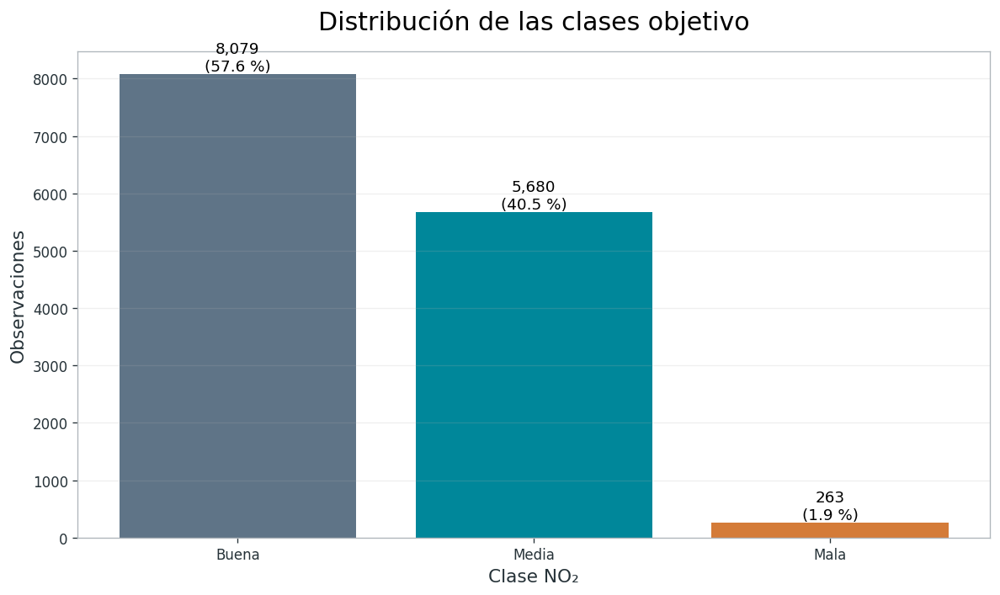

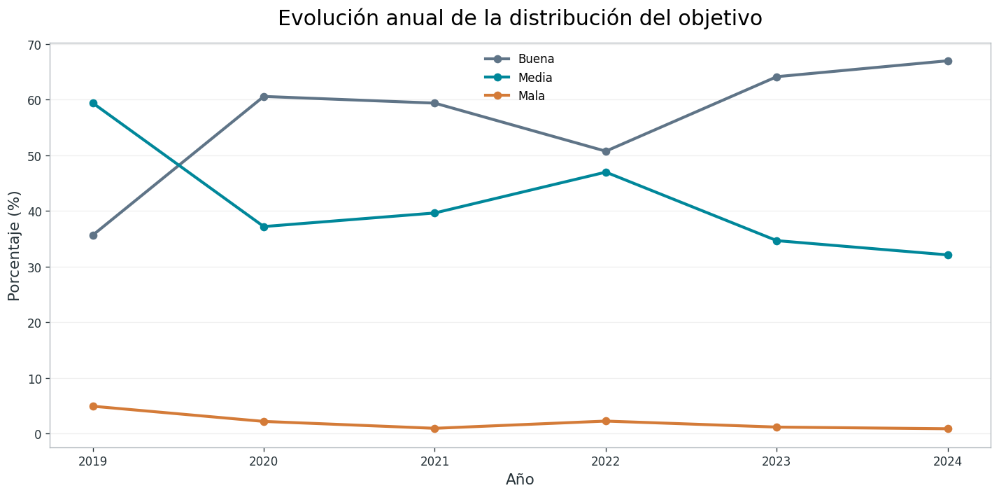

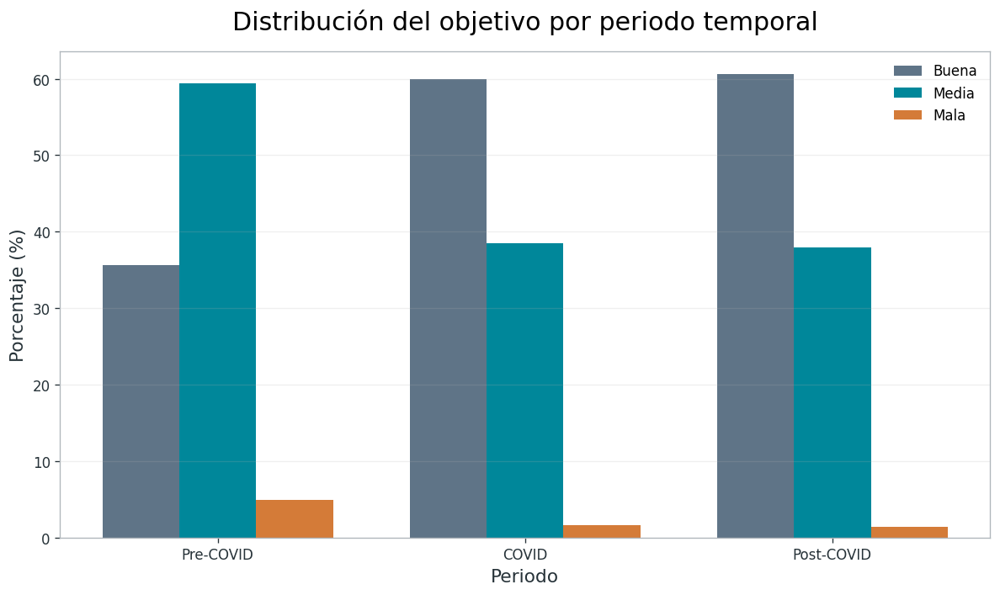


------------------------------------------------------------------------------------------
PERSISTENCIA DE LA CLASE OBJETIVO
------------------------------------------------------------------------------------------

✓ Pares de días consecutivos: 13,723

Matriz de transición (%)
clase_NO2_3     Buena  Media   Mala
clase_anterior                     
Buena           81.80  18.13   0.08
Media           26.20  70.66   3.14
Mala             1.18  68.90  29.92

✓ Persistencia de la misma clase: 76.34 %


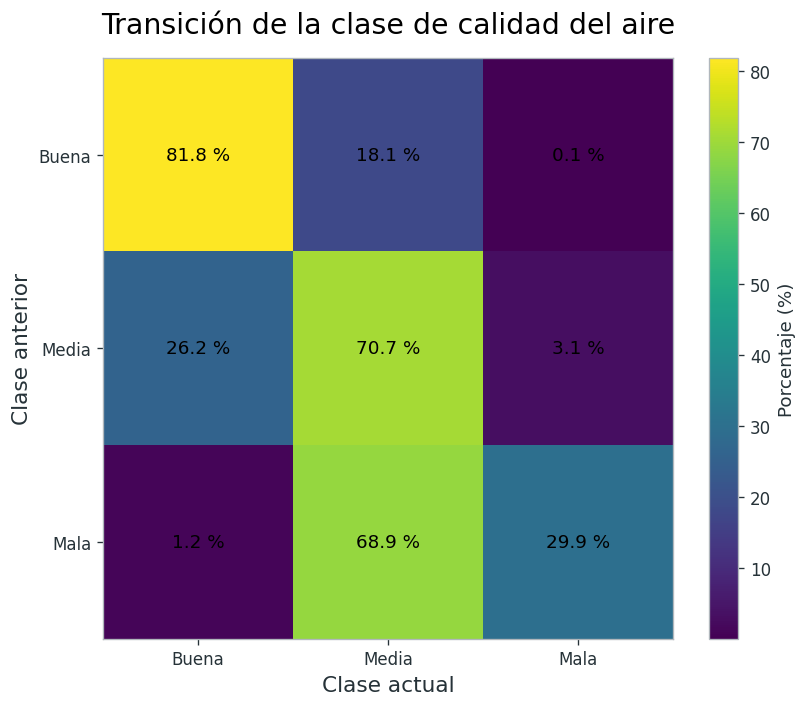


CELDA 13 · COMPLETADA

✓ Observaciones para modelización: 14,022
✓ Variables: 81
✓ Periodo: 2019-01-01 00:00:00 → 2024-12-31 00:00:00
✓ Dataset guardado en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/dataset_objetivo_NO2.csv

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/TARGET

✓ AUDITORÍA DEL TARGET COMPLETADA


In [ ]:
# =============================================================================
# 13 · PREPARACIÓN Y AUDITORÍA DE LA VARIABLE OBJETIVO
# BREATHE BARCELONA · CLASIFICACIÓN TEMPORAL DE NO₂
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =============================================================================
# 1. COMPROBACIÓN DEL DATASET DE ENTRADA
# =============================================================================

print("=" * 90)
print("13 · AUDITORÍA DE LA VARIABLE OBJETIVO")
print("=" * 90)

if "df_integrado" not in globals():
    raise NameError(
        "No existe df_integrado. Ejecuta primero la Celda 12."
    )

df_target = df_integrado.copy()

# Fecha
df_target["fecha"] = pd.to_datetime(
    df_target["fecha"],
    errors="coerce"
)

# Crear año y mes si no existen
df_target["anio"] = df_target["fecha"].dt.year
df_target["mes"] = df_target["fecha"].dt.month

print("\n✓ Dataset recibido desde Celda 12")
print(f"✓ Filas    : {len(df_target):,}")
print(f"✓ Columnas : {df_target.shape[1]:,}")

# =============================================================================
# 2. COMPROBACIÓN DE VARIABLES NECESARIAS
# =============================================================================

variables_objetivo = [
    "fecha",
    "estacion_geo",
    "NO2_ug_m3",
    "clase_NO2_3",
    "target"
]

faltantes = [
    c for c in variables_objetivo
    if c not in df_target.columns
]

if faltantes:
    raise KeyError(
        f"Faltan variables necesarias: {faltantes}"
    )

print("\n✓ Variables objetivo presentes:")
for variable in variables_objetivo:
    print(f"  - {variable}")

# =============================================================================
# 3. RECONSTRUCCIÓN INDEPENDIENTE DE LA CLASIFICACIÓN
# =============================================================================

df_target["clase_comprobacion"] = pd.cut(
    df_target["NO2_ug_m3"],
    bins=[-np.inf, 25, 60, np.inf],
    labels=["Buena", "Media", "Mala"],
    right=True
)

map_target = {
    "Buena": 0,
    "Media": 1,
    "Mala": 2
}

df_target["target_comprobacion"] = (
    df_target["clase_comprobacion"]
    .map(map_target)
    .astype("Int64")
)

# =============================================================================
# 4. COMPROBACIÓN DE CONSISTENCIA
# =============================================================================

mask_clase = (
    df_target["clase_NO2_3"].astype("string")
    != df_target["clase_comprobacion"].astype("string")
)

# Los dos valores nulos no son una inconsistencia
mask_clase &= ~(
    df_target["clase_NO2_3"].isna()
    &
    df_target["clase_comprobacion"].isna()
)

mask_target = (
    df_target["target"].astype("Int64")
    !=
    df_target["target_comprobacion"]
)

mask_target &= ~(
    df_target["target"].isna()
    &
    df_target["target_comprobacion"].isna()
)

print("\n" + "-" * 90)
print("CONSISTENCIA DE LA VARIABLE OBJETIVO")
print("-" * 90)

print(
    f"\n✓ Inconsistencias de clase : {mask_clase.sum():,}"
)

print(
    f"✓ Inconsistencias de target: {mask_target.sum():,}"
)

if mask_clase.sum() == 0 and mask_target.sum() == 0:
    print("✓ Clasificación completamente consistente")
else:
    print("⚠️ Existen inconsistencias. Revisar antes de continuar.")

# =============================================================================
# 5. VALORES AUSENTES
# =============================================================================

print("\n" + "-" * 90)
print("VALORES AUSENTES DEL OBJETIVO")
print("-" * 90)

print(
    f"\n✓ NO₂ nulo   : "
    f"{df_target['NO2_ug_m3'].isna().sum():,}"
)

print(
    f"✓ Clase nula : "
    f"{df_target['clase_NO2_3'].isna().sum():,}"
)

print(
    f"✓ Target nulo: "
    f"{df_target['target'].isna().sum():,}"
)

# =============================================================================
# 6. CONJUNTO VÁLIDO PARA MODELIZACIÓN
# =============================================================================

df_modelo = df_target[
    df_target["target"].notna()
].copy()

df_modelo["target"] = (
    df_modelo["target"]
    .astype(int)
)

print("\n" + "-" * 90)
print("DATASET VÁLIDO PARA MODELIZACIÓN")
print("-" * 90)

print(
    f"\n✓ Observaciones totales   : "
    f"{len(df_target):,}"
)

print(
    f"✓ Observaciones válidas   : "
    f"{len(df_modelo):,}"
)

print(
    f"✓ Observaciones excluidas : "
    f"{len(df_target) - len(df_modelo):,}"
)

# =============================================================================
# 7. PERIODIZACIÓN COVID / NO-COVID
# =============================================================================

# Se reconstruye explícitamente a partir del año para asegurar
# consistencia y evitar depender de una clasificación previa.

df_modelo["periodo_covid"] = np.select(
    [
        df_modelo["anio"] == 2019,
        df_modelo["anio"].isin([2020, 2021]),
        df_modelo["anio"].isin([2022, 2023, 2024])
    ],
    [
        "Pre-COVID",
        "COVID",
        "Post-COVID"
    ],
    default="Sin periodo"
)

orden_periodos = [
    "Pre-COVID",
    "COVID",
    "Post-COVID"
]

print("\n" + "-" * 90)
print("PERIODOS TEMPORALES")
print("-" * 90)

print(
    df_modelo["periodo_covid"]
    .value_counts()
    .reindex(orden_periodos)
)

# =============================================================================
# 8. DISTRIBUCIÓN GLOBAL DEL TARGET
# =============================================================================

orden_clases = [
    "Buena",
    "Media",
    "Mala"
]

dist_global = (
    df_modelo["clase_NO2_3"]
    .value_counts()
    .reindex(orden_clases, fill_value=0)
)

pct_global = (
    dist_global
    .div(dist_global.sum())
    .mul(100)
)

tabla_global = pd.DataFrame({
    "observaciones": dist_global,
    "porcentaje": pct_global.round(2)
})

print("\n" + "-" * 90)
print("DISTRIBUCIÓN GLOBAL DEL TARGET")
print("-" * 90)

print(tabla_global)

# =============================================================================
# 9. DISTRIBUCIÓN POR ESTACIÓN
# =============================================================================

tabla_estacion = pd.crosstab(
    df_modelo["estacion_geo"],
    df_modelo["clase_NO2_3"]
).reindex(
    columns=orden_clases,
    fill_value=0
)

tabla_estacion["Total"] = (
    tabla_estacion[orden_clases]
    .sum(axis=1)
)

pct_estacion = (
    tabla_estacion[orden_clases]
    .div(tabla_estacion["Total"], axis=0)
    .mul(100)
    .round(2)
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN POR ESTACIÓN")
print("-" * 90)

print(tabla_estacion)

print("\nPORCENTAJES POR ESTACIÓN")
print(pct_estacion)

# =============================================================================
# 10. DISTRIBUCIÓN POR AÑO
# =============================================================================

tabla_anio = pd.crosstab(
    df_modelo["anio"],
    df_modelo["clase_NO2_3"]
).reindex(
    columns=orden_clases,
    fill_value=0
)

tabla_anio["Total"] = (
    tabla_anio[orden_clases]
    .sum(axis=1)
)

pct_anio = (
    tabla_anio[orden_clases]
    .div(tabla_anio["Total"], axis=0)
    .mul(100)
    .round(2)
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN POR AÑO")
print("-" * 90)

print(tabla_anio)

print("\nPORCENTAJES POR AÑO")
print(pct_anio)

# =============================================================================
# 11. DISTRIBUCIÓN MENSUAL
# =============================================================================

tabla_mes = pd.crosstab(
    df_modelo["mes"],
    df_modelo["clase_NO2_3"]
).reindex(
    columns=orden_clases,
    fill_value=0
)

tabla_mes["Total"] = (
    tabla_mes[orden_clases]
    .sum(axis=1)
)

pct_mes = (
    tabla_mes[orden_clases]
    .div(tabla_mes["Total"], axis=0)
    .mul(100)
    .round(2)
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN MENSUAL")
print("-" * 90)

print(tabla_mes)

print("\nPORCENTAJES MENSUALES")
print(pct_mes)

# =============================================================================
# 12. DISTRIBUCIÓN PRE-COVID / COVID / POST-COVID
# =============================================================================

tabla_periodo = pd.crosstab(
    df_modelo["periodo_covid"],
    df_modelo["clase_NO2_3"]
).reindex(
    index=orden_periodos,
    columns=orden_clases,
    fill_value=0
)

tabla_periodo["Total"] = (
    tabla_periodo[orden_clases]
    .sum(axis=1)
)

pct_periodo = (
    tabla_periodo[orden_clases]
    .div(tabla_periodo["Total"], axis=0)
    .mul(100)
    .round(2)
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN POR PERIODO COVID / NO-COVID")
print("-" * 90)

print(tabla_periodo)

print("\nPORCENTAJES POR PERIODO")
print(pct_periodo)

# Control
total_periodos = tabla_periodo["Total"].sum()

print(
    f"\n✓ Control total periodos: "
    f"{total_periodos:,}"
)

if total_periodos == len(df_modelo):
    print("✓ Periodización consistente con el dataset válido")
else:
    print("⚠️ Error: los periodos no suman el dataset válido")

# =============================================================================
# 13. CLASE MALA
# =============================================================================

mask_mala = (
    df_modelo["clase_NO2_3"] == "Mala"
)

n_mala = mask_mala.sum()

print("\n" + "-" * 90)
print("CLASE MALA · DISTRIBUCIÓN")
print("-" * 90)

print(
    f"\n✓ Observaciones clase Mala: "
    f"{n_mala:,}"
)

print("\nPor estación:")
print(
    df_modelo.loc[
        mask_mala,
        "estacion_geo"
    ]
    .value_counts()
)

print("\nPor año:")
print(
    df_modelo.loc[
        mask_mala,
        "anio"
    ]
    .value_counts()
    .sort_index()
)

# =============================================================================
# 14. RANGO DE NO₂ POR CLASE
# =============================================================================

resumen_clase = (
    df_modelo
    .groupby(
        "clase_NO2_3",
        observed=False
    )["NO2_ug_m3"]
    .agg(
        n="count",
        minimo="min",
        media="mean",
        mediana="median",
        maximo="max"
    )
    .reindex(orden_clases)
    .round(3)
)

print("\n" + "-" * 90)
print("RANGO DE NO₂ POR CLASE")
print("-" * 90)

print(resumen_clase)

# =============================================================================
# 15. CARPETA DE FIGURAS
# =============================================================================

if "DIR_MODELO_TEMPORAL" not in globals():

    # Fallback por si se ejecuta la celda de forma independiente
    from pathlib import Path

    DIR_MODELO_TEMPORAL = Path(
        "/content/gdrive/MyDrive/TFM/11_Machine_Learning_Temporal"
    )

DIR_FIGURAS_TARGET = (
    DIR_MODELO_TEMPORAL /
    "02_Figuras" /
    "TARGET"
)

DIR_FIGURAS_TARGET.mkdir(
    parents=True,
    exist_ok=True
)

# =============================================================================
# PALETA BREATHE BARCELONA
# =============================================================================

COLOR_BUENA = "#5F7487"
COLOR_MEDIA = "#00879A"
COLOR_MALA = "#D47B38"

# =============================================================================
# 16. FIGURA · DISTRIBUCIÓN DEL TARGET
# =============================================================================

plt.figure(figsize=(10, 6))

colores = [
    COLOR_BUENA,
    COLOR_MEDIA,
    COLOR_MALA
]

bars = plt.bar(
    orden_clases,
    dist_global.values,
    color=colores
)

plt.title(
    "Distribución de las clases objetivo",
    fontsize=18,
    pad=15
)

plt.xlabel(
    "Clase NO₂",
    fontsize=13
)

plt.ylabel(
    "Observaciones",
    fontsize=13
)

plt.grid(
    axis="y",
    alpha=0.20
)

for bar, n, pct in zip(
    bars,
    dist_global.values,
    pct_global.values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{n:,}\n({pct:.1f} %)",
        ha="center",
        va="bottom",
        fontsize=11
    )

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS_TARGET /
    "01_distribucion_target.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =============================================================================
# 17. FIGURA · EVOLUCIÓN ANUAL DEL TARGET
# =============================================================================

plt.figure(figsize=(12, 6))

plt.plot(
    pct_anio.index,
    pct_anio["Buena"],
    marker="o",
    linewidth=2.5,
    label="Buena",
    color=COLOR_BUENA
)

plt.plot(
    pct_anio.index,
    pct_anio["Media"],
    marker="o",
    linewidth=2.5,
    label="Media",
    color=COLOR_MEDIA
)

plt.plot(
    pct_anio.index,
    pct_anio["Mala"],
    marker="o",
    linewidth=2.5,
    label="Mala",
    color=COLOR_MALA
)

plt.title(
    "Evolución anual de la distribución del objetivo",
    fontsize=18,
    pad=15
)

plt.xlabel(
    "Año",
    fontsize=13
)

plt.ylabel(
    "Porcentaje (%)",
    fontsize=13
)

plt.xticks(
    pct_anio.index
)

plt.legend(
    frameon=False
)

plt.grid(
    axis="y",
    alpha=0.20
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS_TARGET /
    "02_target_por_anio.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =============================================================================
# 18. FIGURA · PRE-COVID / COVID / POST-COVID
# =============================================================================

plt.figure(figsize=(10, 6))

x = np.arange(len(orden_periodos))
width = 0.25

plt.bar(
    x - width,
    pct_periodo["Buena"],
    width,
    label="Buena",
    color=COLOR_BUENA
)

plt.bar(
    x,
    pct_periodo["Media"],
    width,
    label="Media",
    color=COLOR_MEDIA
)

plt.bar(
    x + width,
    pct_periodo["Mala"],
    width,
    label="Mala",
    color=COLOR_MALA
)

plt.xticks(
    x,
    orden_periodos
)

plt.ylabel(
    "Porcentaje (%)",
    fontsize=13
)

plt.xlabel(
    "Periodo",
    fontsize=13
)

plt.title(
    "Distribución del objetivo por periodo temporal",
    fontsize=18,
    pad=15
)

plt.legend(
    frameon=False
)

plt.grid(
    axis="y",
    alpha=0.20
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS_TARGET /
    "03_target_covid.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =============================================================================
# 19. PERSISTENCIA TEMPORAL · DÍAS CONSECUTIVOS
# =============================================================================

df_persistencia = (
    df_modelo[
        [
            "fecha",
            "estacion_geo",
            "clase_NO2_3"
        ]
    ]
    .sort_values(
        [
            "estacion_geo",
            "fecha"
        ]
    )
    .copy()
)

# Fecha de la observación anterior dentro de cada estación
df_persistencia["fecha_anterior"] = (
    df_persistencia
    .groupby("estacion_geo")["fecha"]
    .shift(1)
)

# Clase del día anterior
df_persistencia["clase_anterior"] = (
    df_persistencia
    .groupby("estacion_geo")["clase_NO2_3"]
    .shift(1)
)

# Diferencia temporal
df_persistencia["delta_dias"] = (
    df_persistencia["fecha"]
    -
    df_persistencia["fecha_anterior"]
).dt.days

# SOLO días realmente consecutivos
df_persistencia = df_persistencia[
    df_persistencia["delta_dias"] == 1
].copy()

# =============================================================================
# 20. MATRIZ DE TRANSICIÓN
# =============================================================================

matriz_persistencia = pd.crosstab(
    df_persistencia["clase_anterior"],
    df_persistencia["clase_NO2_3"],
    normalize="index"
)

matriz_persistencia = (
    matriz_persistencia
    .reindex(
        index=orden_clases,
        columns=orden_clases,
        fill_value=0
    )
    .mul(100)
    .round(2)
)

print("\n" + "-" * 90)
print("PERSISTENCIA DE LA CLASE OBJETIVO")
print("-" * 90)

print(
    f"\n✓ Pares de días consecutivos: "
    f"{len(df_persistencia):,}"
)

print("\nMatriz de transición (%)")
print(matriz_persistencia)

# =============================================================================
# 21. PERSISTENCIA GLOBAL
# =============================================================================

persistencia_global = (
    df_persistencia["clase_NO2_3"]
    ==
    df_persistencia["clase_anterior"]
).mean() * 100

print(
    f"\n✓ Persistencia de la misma clase: "
    f"{persistencia_global:.2f} %"
)

# =============================================================================
# 22. FIGURA · MATRIZ DE TRANSICIÓN
# =============================================================================

plt.figure(figsize=(7, 6))

plt.imshow(
    matriz_persistencia.values,
    aspect="auto"
)

plt.xticks(
    range(len(orden_clases)),
    orden_clases
)

plt.yticks(
    range(len(orden_clases)),
    orden_clases
)

plt.xlabel(
    "Clase actual",
    fontsize=13
)

plt.ylabel(
    "Clase anterior",
    fontsize=13
)

plt.title(
    "Transición de la clase de calidad del aire",
    fontsize=17,
    pad=15
)

for i in range(len(orden_clases)):
    for j in range(len(orden_clases)):

        plt.text(
            j,
            i,
            f"{matriz_persistencia.iloc[i, j]:.1f} %",
            ha="center",
            va="center",
            fontsize=11
        )

plt.colorbar(
    label="Porcentaje (%)"
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS_TARGET /
    "04_matriz_transicion_target.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =============================================================================
# 23. GUARDAR DATASET PARA MODELIZACIÓN
# =============================================================================

RUTA_DATASET_OBJETIVO = (
    DIR_MODELO_TEMPORAL /
    "03_Datos_Modelado" /
    "dataset_objetivo_NO2.csv"
)

RUTA_DATASET_OBJETIVO.parent.mkdir(
    parents=True,
    exist_ok=True
)

df_modelo.to_csv(
    RUTA_DATASET_OBJETIVO,
    index=False
)

# =============================================================================
# 24. RESUMEN FINAL
# =============================================================================

print("\n" + "=" * 90)
print("CELDA 13 · COMPLETADA")
print("=" * 90)

print(
    f"\n✓ Observaciones para modelización: "
    f"{len(df_modelo):,}"
)

print(
    f"✓ Variables: "
    f"{df_modelo.shape[1]:,}"
)

print(
    f"✓ Periodo: "
    f"{df_modelo['fecha'].min()} → "
    f"{df_modelo['fecha'].max()}"
)

print(
    f"✓ Dataset guardado en:\n"
    f"{RUTA_DATASET_OBJETIVO}"
)

print(
    f"\n✓ Figuras guardadas en:\n"
    f"{DIR_FIGURAS_TARGET}"
)

print("\n✓ AUDITORÍA DEL TARGET COMPLETADA")

### RESULTADOS · AUDITORÍA Y CARACTERIZACIÓN DEL OBJETIVO

## Consistencia de la variable objetivo

La variable objetivo se construye a partir de la concentración diaria de NO₂ (`NO2_ug_m3`), transformándola en tres categorías de calidad del aire (`clase_NO2_3`) y, posteriormente, en una codificación numérica (`target`).

La comprobación realizada muestra una **consistencia completa entre las tres representaciones de la variable objetivo**, sin inconsistencias de clasificación ni de codificación:

- Inconsistencias entre NO₂ y clase: **0**
- Inconsistencias entre clase y target: **0**

Por tanto, la variable objetivo queda correctamente definida para la posterior etapa de modelización.

---

## Observaciones válidas para modelización

El dataset integrado contiene **14.144 observaciones**. De ellas, **14.022 presentan un valor válido de NO₂ y, por tanto, un target definido**, mientras que 122 observaciones quedan excluidas de la modelización por ausencia de la variable objetivo.

- Observaciones totales: **14.144**
- Observaciones válidas: **14.022**
- Observaciones excluidas: **122**

Los valores ausentes del objetivo afectan simultáneamente a `NO2_ug_m3`, `clase_NO2_3` y `target`, manteniéndose la correspondencia entre las tres variables.

---

## Distribución global del objetivo

La distribución de las 14.022 observaciones válidas presenta un cierto desequilibrio entre las tres categorías:

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 8.079 | 57,62 % |
| Media | 5.680 | 40,51 % |
| Mala | 263 | 1,88 % |

La categoría **Buena** constituye la clase mayoritaria, seguida de la categoría **Media**. La categoría **Mala** representa únicamente el **1,88 %** de las observaciones.

Este desequilibrio deberá tenerse en cuenta durante la fase de aprendizaje supervisado, especialmente en la evaluación de la capacidad del modelo para detectar episodios de peor calidad del aire.

---

## Distribución espacial del objetivo

La composición de las clases presenta diferencias importantes entre estaciones.

Eixample muestra la mayor proporción relativa de situaciones **Medias (74,74 %) y Malas (6,88 %)**, mientras que Gràcia presenta un **60,71 % de observaciones Medias y un 3,85 % de Malas**.

Por el contrario, Poblenou presenta una distribución dominada por la categoría **Buena (98,24 %)**, seguida de Palau Reial (**77,38 %**) y Vall d'Hebron (**70,12 %**).

Ciutadella y Sants presentan distribuciones más equilibradas entre las categorías Buena y Media.

Estas diferencias espaciales muestran que la variable objetivo presenta una componente territorial relevante, que será analizada posteriormente mediante las variables ambientales, de tráfico y de localización incorporadas al modelo.

---

## Evolución temporal del objetivo

La distribución anual muestra una mejora progresiva de la calidad del aire respecto a 2019.

La proporción de observaciones clasificadas como **Buena** pasa de:

- **35,66 % en 2019**
- **60,59 % en 2020**
- **59,39 % en 2021**
- **50,75 % en 2022**
- **64,14 % en 2023**
- **67,00 % en 2024**

Paralelamente, la categoría **Mala** disminuye desde el **4,93 % en 2019** hasta el **0,88 % en 2024**.

El comportamiento temporal no es completamente monótono, ya que se observa un repunte de la categoría Media en 2022, seguido de una nueva mejora en 2023 y 2024.

---

## Periodización Pre-COVID / COVID / Post-COVID

La comparación entre periodos evidencia un cambio notable respecto a la situación Pre-COVID.

| Periodo | Buena | Media | Mala |
|---|---:|---:|---:|
| Pre-COVID | 35,66 % | 59,41 % | 4,93 % |
| COVID | 59,98 % | 38,45 % | 1,57 % |
| Post-COVID | 60,62 % | 37,94 % | 1,44 % |

La proporción de observaciones clasificadas como **Buena** aumenta desde el **35,66 % en el periodo Pre-COVID hasta el 59,98 % durante COVID**, manteniéndose posteriormente en un nivel similar en el periodo Post-COVID (**60,62 %**).

La categoría Mala presenta una reducción paralela, desde el **4,93 % Pre-COVID hasta el 1,44 % Post-COVID**.

Este resultado justifica mantener la periodización Pre-COVID/COVID/Post-COVID como dimensión específica del análisis temporal.

---

## Persistencia temporal de la calidad del aire

El análisis de transiciones entre días consecutivos muestra una elevada persistencia de la categoría de calidad del aire.

La matriz de transición obtenida es:

| Clase anterior → actual | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 81,80 % | 18,13 % | 0,08 % |
| Media | 26,20 % | 70,66 % | 3,14 % |
| Mala | 1,18 % | 68,90 % | 29,92 % |

La **persistencia global de la misma categoría es del 76,34 %**.

La categoría Buena presenta una elevada estabilidad: en el **81,80 %** de los casos permanece como Buena al día siguiente. La categoría Media mantiene su estado en el **70,66 %** de las transiciones.

En el caso de la categoría Mala, únicamente el **29,92 %** permanece como Mala al día siguiente, mientras que el **68,90 %** pasa a la categoría Media.

Estos resultados evidencian una **dependencia temporal significativa de la calidad del aire**, por lo que la dimensión temporal deberá considerarse explícitamente en la posterior construcción y evaluación de los modelos predictivos.

---

## Conclusión

La caracterización del objetivo muestra tres características fundamentales:

1. **Desequilibrio de clases**, con una representación reducida de los episodios de calidad Mala.
2. **Heterogeneidad espacial**, con diferencias importantes entre estaciones.
3. **Dependencia temporal**, tanto en la evolución de las categorías como en la elevada persistencia entre días consecutivos.

Además, el contraste Pre-COVID/COVID/Post-COVID evidencia un cambio claro en la distribución de las categorías de calidad del aire.

Estos resultados constituyen la base para la siguiente etapa de modelización, en la que será necesario considerar tanto el **desequilibrio de clases** como la **estructura temporal de los datos**.

# 14 · EDA DEL OBJETIVO · DISTRIBUCIÓN Y DINÁMICA TEMPORAL
## Objetivo

Esta etapa analiza en profundidad la variable objetivo de calidad del aire basada en la concentración diaria de NO₂ (`NO2_ug_m3`) y su clasificación en tres categorías:

- **Buena**: ≤ 25 µg/m³
- **Media**: 26–60 µg/m³
- **Mala**: > 60 µg/m³

El análisis tiene como finalidad caracterizar la distribución del objetivo antes de la modelización y estudiar sus principales patrones temporales.

---

## Análisis realizado

Se estudian cuatro dimensiones principales:

1. **Distribución global de las clases objetivo**, para cuantificar su frecuencia y detectar posibles problemas de desequilibrio.

2. **Evolución anual de las clases**, para identificar cambios en la distribución de la calidad del aire entre 2019 y 2024.

3. **Comparación Pre-COVID / COVID / Post-COVID**, con el fin de analizar el cambio en la distribución de las categorías durante los distintos periodos temporales definidos en el estudio.

4. **Persistencia y transición temporal de las clases**, mediante el análisis de la relación entre la categoría observada en un día y la correspondiente al día siguiente.

---

## Criterio temporal

La persistencia se calcula únicamente entre observaciones consecutivas de una misma estación separadas exactamente un día.

De esta forma, se evita interpretar como transición temporal aquellos pares de registros que presentan días intermedios sin observación.

---

## Visualización

Las figuras utilizan la identidad visual **Breathe Barcelona**, manteniendo una codificación cromática consistente para las categorías:

- **Buena → azul grisáceo**
- **Media → turquesa**
- **Mala → naranja**

En la matriz de transición se utiliza una escala continua independiente, ya que el color representa el porcentaje de transición y no una categoría de calidad.

---

## Resultados esperados

Este análisis permitirá:

- cuantificar el desequilibrio entre clases;
- identificar cambios temporales en la calidad del aire;
- caracterizar las diferencias entre los periodos Pre-COVID, COVID y Post-COVID;
- determinar el grado de persistencia de las categorías;
- y justificar la incorporación de la dimensión temporal en las etapas posteriores de modelización.

---

14 · EDA DEL OBJETIVO

✓ Paleta Breathe Barcelona configurada
✓ Dataset cargado: 14,022 observaciones

------------------------------------------------------------------------------------------
DISTRIBUCIÓN GLOBAL DEL TARGET
------------------------------------------------------------------------------------------
             observaciones  porcentaje
clase_NO2_3                           
Buena                 8079       57.62
Media                 5680       40.51
Mala                   263        1.88


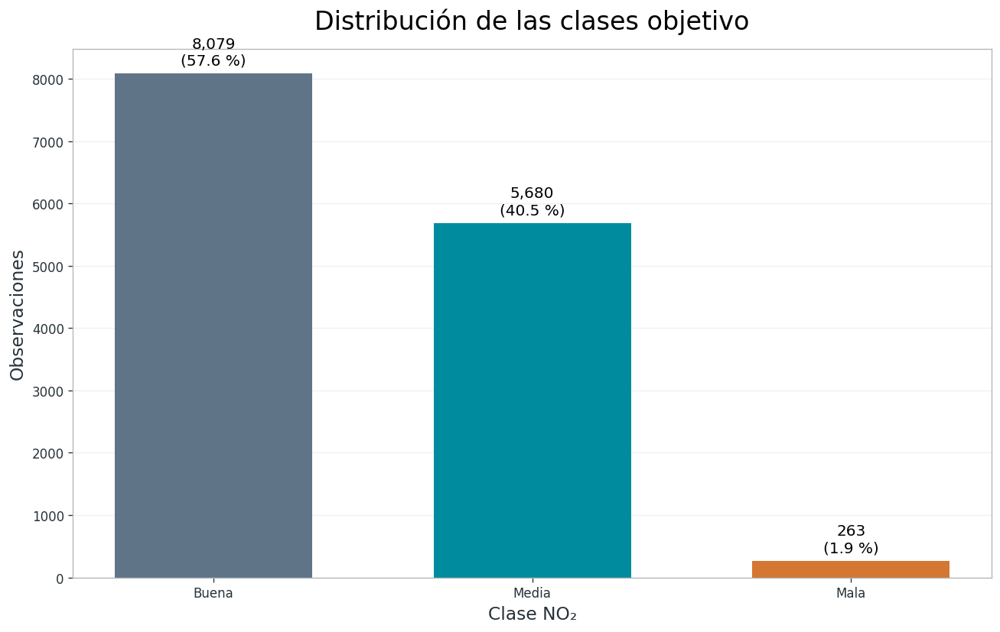

✓ Figura 1 guardada

------------------------------------------------------------------------------------------
DISTRIBUCIÓN ANUAL (%)
------------------------------------------------------------------------------------------
clase_NO2_3  Buena  Media  Mala
anio                           
2019         35.66  59.41  4.93
2020         60.59  37.21  2.20
2021         59.39  39.65  0.96
2022         50.75  46.99  2.26
2023         64.14  34.68  1.18
2024         67.00  32.12  0.88


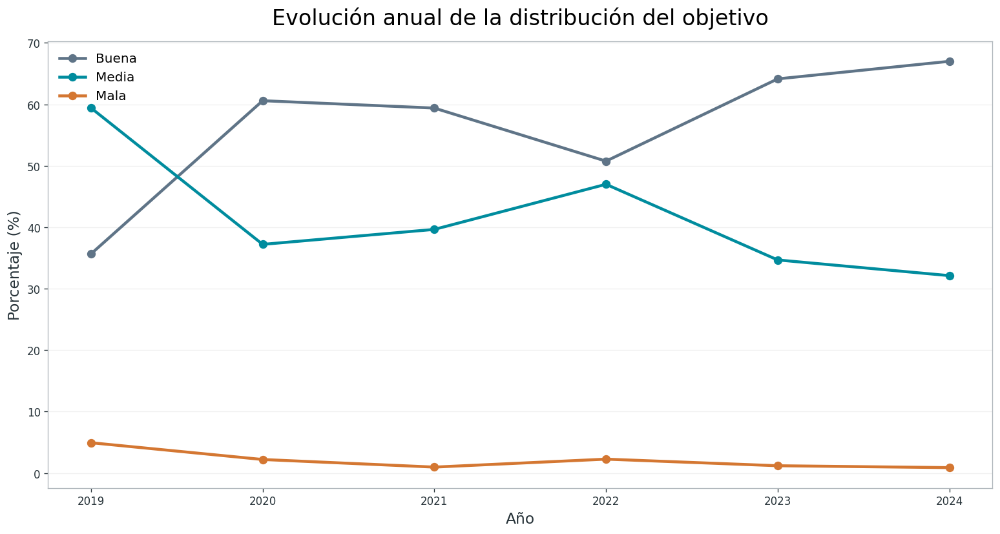

✓ Figura 2 guardada

------------------------------------------------------------------------------------------
DISTRIBUCIÓN POR PERIODO (%)
------------------------------------------------------------------------------------------
clase_NO2_3    Buena  Media  Mala
periodo_covid                    
Pre-COVID      35.66  59.41  4.93
COVID          59.98  38.45  1.57
Post-COVID     60.62  37.94  1.44


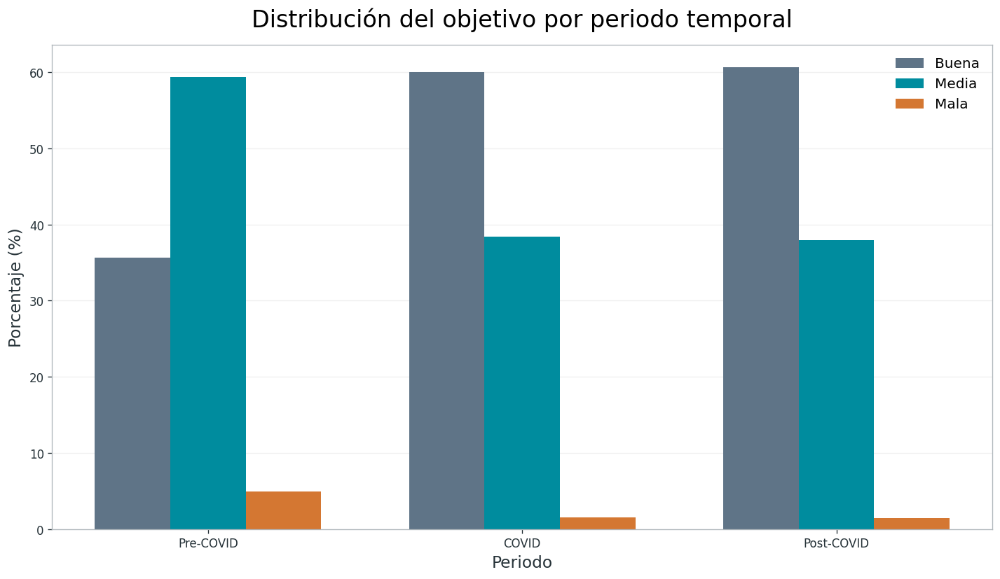

✓ Figura 3 guardada

------------------------------------------------------------------------------------------
PERSISTENCIA TEMPORAL
------------------------------------------------------------------------------------------

✓ Pares de días consecutivos: 13,723

MATRIZ DE TRANSICIÓN (%)
clase_NO2_3     Buena  Media   Mala
clase_anterior                     
Buena           81.80  18.13   0.08
Media           26.20  70.66   3.14
Mala             1.18  68.90  29.92

✓ Persistencia global de la misma clase: 76.34 %


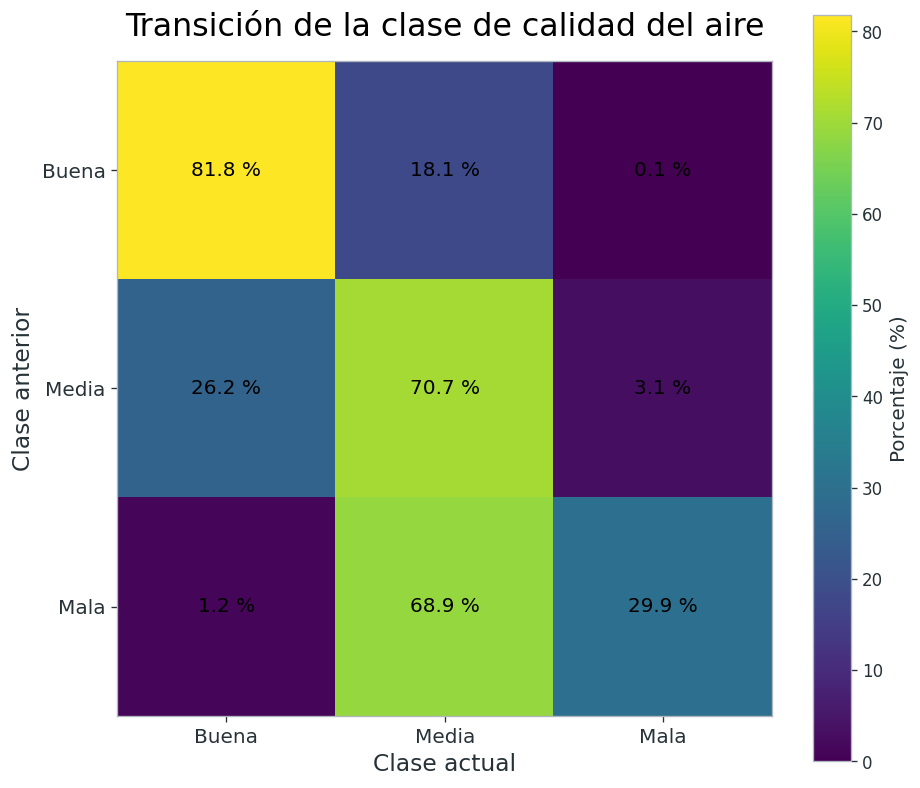

✓ Figura 4 guardada

CELDA 14 · COMPLETADA

✓ Observaciones analizadas : 14,022
✓ Pares consecutivos       : 13,723
✓ Persistencia global      : 76.34 %

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/TARGET

✓ EDA DEL TARGET COMPLETADO


In [ ]:
# =============================================================================
# CELDA 14 · EDA DEL OBJETIVO · DISTRIBUCIÓN Y DINÁMICA TEMPORAL
# BREATHE BARCELONA
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 90)
print("14 · EDA DEL OBJETIVO")
print("=" * 90)

# =============================================================================
# 1. RUTAS
# =============================================================================

RUTA_DATASET = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

DIR_FIGURAS = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/TARGET"
)

DIR_FIGURAS.mkdir(
    parents=True,
    exist_ok=True
)

# =============================================================================
# 2. PALETA BREATHE BARCELONA
# =============================================================================

COLOR_BUENA = "#5F7487"
COLOR_MEDIA = "#008C9E"
COLOR_MALA = "#D47732"

PALETA_CLASES = {
    "Buena": COLOR_BUENA,
    "Media": COLOR_MEDIA,
    "Mala": COLOR_MALA
}

print("\n✓ Paleta Breathe Barcelona configurada")

# =============================================================================
# 3. CARGA DEL DATASET
# =============================================================================

df = pd.read_csv(
    RUTA_DATASET,
    parse_dates=["fecha"],
    low_memory=False
)

df = df.dropna(
    subset=[
        "NO2_ug_m3",
        "clase_NO2_3",
        "target"
    ]
).copy()

df["anio"] = df["fecha"].dt.year
df["mes"] = df["fecha"].dt.month

print(
    f"✓ Dataset cargado: "
    f"{len(df):,} observaciones"
)

# =============================================================================
# 4. ORDEN DE CATEGORÍAS
# =============================================================================

orden_clases = [
    "Buena",
    "Media",
    "Mala"
]

orden_periodos = [
    "Pre-COVID",
    "COVID",
    "Post-COVID"
]

# =============================================================================
# 5. DISTRIBUCIÓN GLOBAL DEL TARGET
# =============================================================================

dist_global = (
    df["clase_NO2_3"]
    .value_counts()
    .reindex(
        orden_clases,
        fill_value=0
    )
)

pct_global = (
    dist_global
    / dist_global.sum()
    * 100
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN GLOBAL DEL TARGET")
print("-" * 90)

print(
    pd.DataFrame({
        "observaciones": dist_global,
        "porcentaje": pct_global.round(2)
    })
)

# =============================================================================
# 6. FIGURA 1 · DISTRIBUCIÓN GLOBAL
# =============================================================================

fig, ax = plt.subplots(
    figsize=(11, 7)
)

bars = ax.bar(
    orden_clases,
    dist_global.values,
    color=[
        COLOR_BUENA,
        COLOR_MEDIA,
        COLOR_MALA
    ],
    width=0.62
)

for bar, n, pct in zip(
    bars,
    dist_global.values,
    pct_global.values
):

    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + dist_global.max() * 0.012,
        f"{n:,}\n({pct:.1f} %)",
        ha="center",
        va="bottom",
        fontsize=12
    )

ax.set_title(
    "Distribución de las clases objetivo",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Clase NO₂",
    fontsize=14
)

ax.set_ylabel(
    "Observaciones",
    fontsize=14
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "14_01_distribucion_clases_target.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print(
    "✓ Figura 1 guardada"
)

# =============================================================================
# 7. DISTRIBUCIÓN ANUAL
# =============================================================================

tabla_anual = pd.crosstab(
    df["anio"],
    df["clase_NO2_3"],
    normalize="index"
).reindex(
    columns=orden_clases,
    fill_value=0
)

tabla_anual_pct = (
    tabla_anual * 100
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN ANUAL (%)")
print("-" * 90)

print(
    tabla_anual_pct.round(2)
)

# =============================================================================
# 8. FIGURA 2 · EVOLUCIÓN ANUAL
# =============================================================================

fig, ax = plt.subplots(
    figsize=(13, 7)
)

for clase in orden_clases:

    ax.plot(
        tabla_anual_pct.index,
        tabla_anual_pct[clase],
        marker="o",
        markersize=7,
        linewidth=2.7,
        label=clase,
        color=PALETA_CLASES[clase]
    )

ax.set_title(
    "Evolución anual de la distribución del objetivo",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Año",
    fontsize=14
)

ax.set_ylabel(
    "Porcentaje (%)",
    fontsize=14
)

ax.set_xticks(
    tabla_anual_pct.index
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.legend(
    frameon=False,
    fontsize=12
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "14_02_evolucion_anual_target.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print(
    "✓ Figura 2 guardada"
)

# =============================================================================
# 9. DISTRIBUCIÓN PRE-COVID / COVID / POST-COVID
# =============================================================================

tabla_periodo = pd.crosstab(
    df["periodo_covid"],
    df["clase_NO2_3"],
    normalize="index"
).reindex(
    index=orden_periodos,
    columns=orden_clases,
    fill_value=0
)

tabla_periodo_pct = (
    tabla_periodo * 100
)

print("\n" + "-" * 90)
print("DISTRIBUCIÓN POR PERIODO (%)")
print("-" * 90)

print(
    tabla_periodo_pct.round(2)
)

# =============================================================================
# 10. FIGURA 3 · COVID / NO-COVID
# =============================================================================

fig, ax = plt.subplots(
    figsize=(12, 7)
)

x = np.arange(
    len(orden_periodos)
)

width = 0.24

for i, clase in enumerate(orden_clases):

    ax.bar(
        x + (i - 1) * width,
        tabla_periodo_pct[clase].values,
        width=width,
        label=clase,
        color=PALETA_CLASES[clase]
    )

ax.set_title(
    "Distribución del objetivo por periodo temporal",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Periodo",
    fontsize=14
)

ax.set_ylabel(
    "Porcentaje (%)",
    fontsize=14
)

ax.set_xticks(x)

ax.set_xticklabels(
    orden_periodos
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.legend(
    frameon=False,
    fontsize=12
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "14_03_target_covid.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print(
    "✓ Figura 3 guardada"
)

# =============================================================================
# 11. PERSISTENCIA TEMPORAL · DÍAS CONSECUTIVOS
# =============================================================================

df_persistencia = (
    df[
        [
            "fecha",
            "estacion_geo",
            "clase_NO2_3"
        ]
    ]
    .sort_values(
        [
            "estacion_geo",
            "fecha"
        ]
    )
    .copy()
)

# Fecha de la observación anterior
df_persistencia["fecha_anterior"] = (
    df_persistencia
    .groupby("estacion_geo")["fecha"]
    .shift(1)
)

# Clase de la observación anterior
df_persistencia["clase_anterior"] = (
    df_persistencia
    .groupby("estacion_geo")["clase_NO2_3"]
    .shift(1)
)

# Diferencia temporal
df_persistencia["dias_diff"] = (
    df_persistencia["fecha"]
    -
    df_persistencia["fecha_anterior"]
).dt.days

# Solo pares realmente consecutivos
df_persistencia = df_persistencia[
    df_persistencia["dias_diff"] == 1
].copy()

print("\n" + "-" * 90)
print("PERSISTENCIA TEMPORAL")
print("-" * 90)

print(
    f"\n✓ Pares de días consecutivos: "
    f"{len(df_persistencia):,}"
)

# =============================================================================
# 12. MATRIZ DE TRANSICIÓN
# =============================================================================

matriz_transicion = pd.crosstab(
    df_persistencia["clase_anterior"],
    df_persistencia["clase_NO2_3"],
    normalize="index"
).reindex(
    index=orden_clases,
    columns=orden_clases,
    fill_value=0
)

matriz_transicion_pct = (
    matriz_transicion * 100
)

print("\nMATRIZ DE TRANSICIÓN (%)")

print(
    matriz_transicion_pct.round(2)
)

# =============================================================================
# 13. PERSISTENCIA GLOBAL CORRECTA
# =============================================================================

# Número de transiciones por clase anterior
n_transiciones = (
    df_persistencia["clase_anterior"]
    .value_counts()
    .reindex(orden_clases)
    .fillna(0)
)

# Número de transiciones que mantienen la misma clase
n_misma_clase = (
    df_persistencia[
        df_persistencia["clase_anterior"]
        ==
        df_persistencia["clase_NO2_3"]
    ]
    .groupby(
        "clase_anterior",
        observed=False
    )
    .size()
    .reindex(orden_clases)
    .fillna(0)
)

persistencia = (
    n_misma_clase.sum()
    /
    n_transiciones.sum()
    *
    100
)

print(
    f"\n✓ Persistencia global de la misma clase: "
    f"{persistencia:.2f} %"
)

# =============================================================================
# 14. FIGURA 4 · MATRIZ DE TRANSICIÓN
# =============================================================================

fig, ax = plt.subplots(
    figsize=(8, 7)
)

im = ax.imshow(
    matriz_transicion_pct.values,
    cmap="viridis",
    vmin=0,
    vmax=np.nanmax(
        matriz_transicion_pct.values
    )
)

ax.set_xticks(
    range(len(orden_clases))
)

ax.set_yticks(
    range(len(orden_clases))
)

ax.set_xticklabels(
    orden_clases,
    fontsize=12
)

ax.set_yticklabels(
    orden_clases,
    fontsize=12
)

ax.set_xlabel(
    "Clase actual",
    fontsize=14
)

ax.set_ylabel(
    "Clase anterior",
    fontsize=14
)

ax.set_title(
    "Transición de la clase de calidad del aire",
    fontsize=19,
    pad=15
)

for i in range(len(orden_clases)):

    for j in range(len(orden_clases)):

        valor = matriz_transicion_pct.iloc[i, j]

        ax.text(
            j,
            i,
            f"{valor:.1f} %",
            ha="center",
            va="center",
            fontsize=12
        )

cbar = fig.colorbar(
    im,
    ax=ax
)

cbar.set_label(
    "Porcentaje (%)",
    fontsize=12
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "14_04_matriz_transicion_target.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print(
    "✓ Figura 4 guardada"
)

# =============================================================================
# 15. COMPROBACIONES FINALES
# =============================================================================

print("\n" + "=" * 90)
print("CELDA 14 · COMPLETADA")
print("=" * 90)

print(
    f"\n✓ Observaciones analizadas : "
    f"{len(df):,}"
)

print(
    f"✓ Pares consecutivos       : "
    f"{len(df_persistencia):,}"
)

print(
    f"✓ Persistencia global      : "
    f"{persistencia:.2f} %"
)

print(
    f"\n✓ Figuras guardadas en:"
    f"\n{DIR_FIGURAS}"
)

print("\n✓ EDA DEL TARGET COMPLETADO")

### RESULTADOS · EDA DEL OBJETIVO Y DINÁMICA TEMPORAL

## Distribución global del objetivo

El conjunto válido para el análisis contiene **14.022 observaciones**.

La distribución de las categorías de calidad del aire muestra un claro desequilibrio:

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 8.079 | 57,62 % |
| Media | 5.680 | 40,51 % |
| Mala | 263 | 1,88 % |

La categoría **Buena** es la más frecuente, seguida de la categoría **Media**, mientras que la categoría **Mala** representa únicamente el **1,88 %** de las observaciones.

Este resultado confirma la necesidad de utilizar métricas de evaluación por clase durante la posterior fase de modelización, especialmente para valorar la capacidad de los modelos para detectar episodios de peor calidad del aire.

---

## Evolución anual

La distribución de las categorías presenta una evolución temporal claramente diferenciada entre 2019 y 2024.

La proporción de observaciones clasificadas como **Buena** aumenta desde el **35,66 % en 2019** hasta el **67,00 % en 2024**.

Durante el mismo periodo, la categoría **Media** pasa del **59,41 % al 32,12 %**, mientras que la categoría **Mala** disminuye del **4,93 % al 0,88 %**.

El cambio más acusado se produce entre 2019 y 2020, coincidiendo temporalmente con el periodo COVID. Posteriormente se observa cierta recuperación de la categoría Media en 2022, seguida de una nueva mejora en 2023 y 2024.

La evolución anual muestra, por tanto, una modificación significativa de la distribución del objetivo a lo largo del periodo de estudio.

---

## Comparación Pre-COVID / COVID / Post-COVID

La comparación entre los tres periodos definidos permite observar con mayor claridad el cambio en la distribución de las categorías:

| Periodo | Buena | Media | Mala |
|---|---:|---:|---:|
| Pre-COVID | 35,66 % | 59,41 % | 4,93 % |
| COVID | 59,98 % | 38,45 % | 1,57 % |
| Post-COVID | 60,62 % | 37,94 % | 1,44 % |

La proporción de observaciones clasificadas como **Buena** aumenta desde el **35,66 % en el periodo Pre-COVID hasta el 59,98 % durante COVID**, manteniéndose posteriormente en un nivel similar durante el periodo Post-COVID (**60,62 %**).

Paralelamente, la categoría **Mala** disminuye desde el **4,93 % Pre-COVID hasta el 1,44 % Post-COVID**.

El periodo Post-COVID no recupera la distribución observada en 2019: la proporción de Buena permanece aproximadamente **25 puntos porcentuales por encima** del nivel Pre-COVID, mientras que las categorías Media y Mala presentan menores proporciones.

Estos resultados justifican mantener explícitamente la periodización **Pre-COVID / COVID / Post-COVID** en el análisis posterior.

> **Nota de interpretación:** la evolución temporal observada muestra una asociación con los distintos periodos, pero por sí sola no permite atribuir causalmente los cambios exclusivamente a la pandemia. En las etapas posteriores se incorporarán variables meteorológicas, de tráfico y del entorno urbano para analizar conjuntamente los factores asociados.

---

## Persistencia temporal

El análisis de persistencia se realiza utilizando únicamente pares de observaciones correspondientes a **días consecutivos dentro de una misma estación**.

Se obtienen **13.723 pares de días consecutivos**.

La matriz de transición es:

| Clase anterior → clase actual | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 81,80 % | 18,13 % | 0,08 % |
| Media | 26,20 % | 70,66 % | 3,14 % |
| Mala | 1,18 % | 68,90 % | 29,92 % |

La **persistencia global de la misma categoría es del 76,34 %**, lo que indica una elevada continuidad temporal de la clasificación.

La categoría Buena presenta la mayor estabilidad: el **81,80 %** de los días clasificados como Buena mantienen dicha categoría al día siguiente. Para la categoría Media, la persistencia es del **70,66 %**.

La categoría Mala presenta una persistencia menor (**29,92 %**). En la mayoría de los casos en los que aparece un día clasificado como Mala, la categoría siguiente pasa a ser Media (**68,90 %**).

La elevada persistencia observada confirma que la calidad del aire presenta una **dependencia temporal relevante**, aspecto que deberá considerarse durante la construcción y evaluación de los modelos predictivos.

---

## Síntesis del análisis

El EDA del objetivo identifica tres características principales:

1. **Desequilibrio de clases**, debido a la baja representación de la categoría Mala.
2. **Cambio temporal significativo**, especialmente entre el periodo Pre-COVID y los periodos posteriores.
3. **Elevada persistencia diaria**, con un 76,34 % de continuidad de la categoría entre días consecutivos.

Estos resultados justifican el planteamiento de un problema de clasificación temporal y proporcionan criterios para las siguientes fases de modelización, en las que se deberá controlar tanto el **desequilibrio de clases** como la **dependencia temporal** de las observaciones.

# 15 · ANÁLISIS TEMPORAL DE LA CONCENTRACIÓN DE NO₂

## Objetivo

Esta etapa analiza la evolución temporal de la concentración diaria de NO₂ (`NO2_ug_m3`) a lo largo del periodo 2019–2024.

El objetivo es caracterizar la variabilidad temporal de la concentración de NO₂ y detectar patrones asociados al año y a la estacionalidad antes de incorporar el análisis de autocorrelación temporal.

---

## Análisis realizado

Se estudia:

1. La evolución temporal de la concentración media de NO₂.
2. La variabilidad anual de las concentraciones.
3. El comportamiento mensual y estacional.
4. Las diferencias temporales entre estaciones.
5. La evolución de NO₂ durante los periodos Pre-COVID, COVID y Post-COVID.

El análisis se realiza sobre las observaciones con concentración de NO₂ disponible.

---

## Representación temporal

La evolución se analizará mediante agregaciones temporales, evitando interpretar las variaciones diarias aisladas como tendencias estructurales.

Se utilizarán estadísticas agregadas por año, mes y periodo temporal para facilitar la comparación entre estaciones y entre las distintas fases del periodo de estudio.

---

## Periodización COVID / no-COVID

Se mantiene la periodización definida anteriormente:

- **Pre-COVID:** 2019
- **COVID:** 2020–2021
- **Post-COVID:** 2022–2024

Esta división permitirá comparar la evolución de la concentración de NO₂ entre los tres periodos y servirá como base para los análisis posteriores.

---

## Visualización

Las figuras mantienen la identidad visual **Breathe Barcelona**, utilizando una representación consistente de la evolución temporal y de las estaciones.

---

## Resultados esperados

Este análisis permitirá identificar:

- cambios en el nivel medio de NO₂ a lo largo del periodo;
- patrones estacionales;
- diferencias persistentes entre estaciones;
- cambios asociados a los periodos Pre-COVID, COVID y Post-COVID;
- y posibles patrones temporales que deberán considerarse en la modelización posterior.

La siguiente etapa profundizará en la **dependencia temporal mediante autocorrelación y retardos**.

15 · ANÁLISIS TEMPORAL DE NO₂

✓ Paleta Breathe Barcelona configurada
✓ Observaciones con NO₂ válido: 14,022

------------------------------------------------------------------------------------------
NO₂ · RESUMEN ANUAL
------------------------------------------------------------------------------------------
      observaciones   media  mediana  desviacion  minimo   maximo
anio                                                             
2019           1562  32.424   30.545      15.404   1.000   98.708
2020           2408  23.698   19.968      15.091   1.000   83.714
2021           2492  23.524   21.435      13.069   1.875   86.333
2022           2522  26.612   24.729      14.738   1.667   84.500
2023           2532  22.563   20.208      13.096   1.042  113.400
2024           2506  21.313   18.917      12.403   1.000   77.042


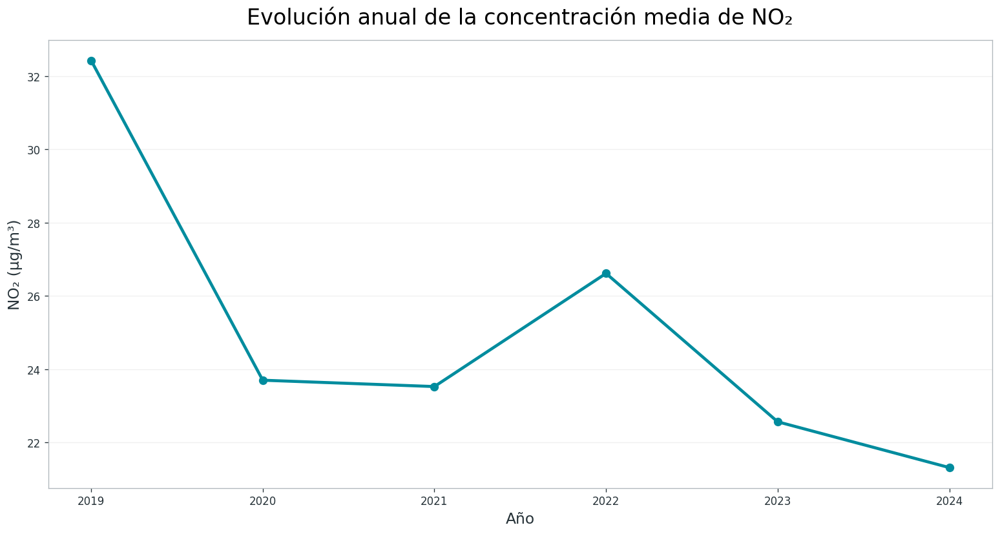

✓ Figura 1 guardada

------------------------------------------------------------------------------------------
NO₂ · RESUMEN MENSUAL
------------------------------------------------------------------------------------------
     observaciones   media  mediana  desviacion
mes                                            
1             1254  29.856   29.281      16.274
2              984  30.518   30.276      15.769
3             1070  22.997   20.596      13.112
4             1172  22.468   20.128      13.247
5             1235  23.544   21.153      13.387
6             1205  22.433   18.833      14.380
7             1204  22.167   19.873      12.720
8             1223  19.161   16.792      11.146
9             1203  22.953   20.609      13.172
10            1059  23.843   22.542      12.461
11            1155  26.981   25.583      14.405
12            1258  28.080   27.375      15.747


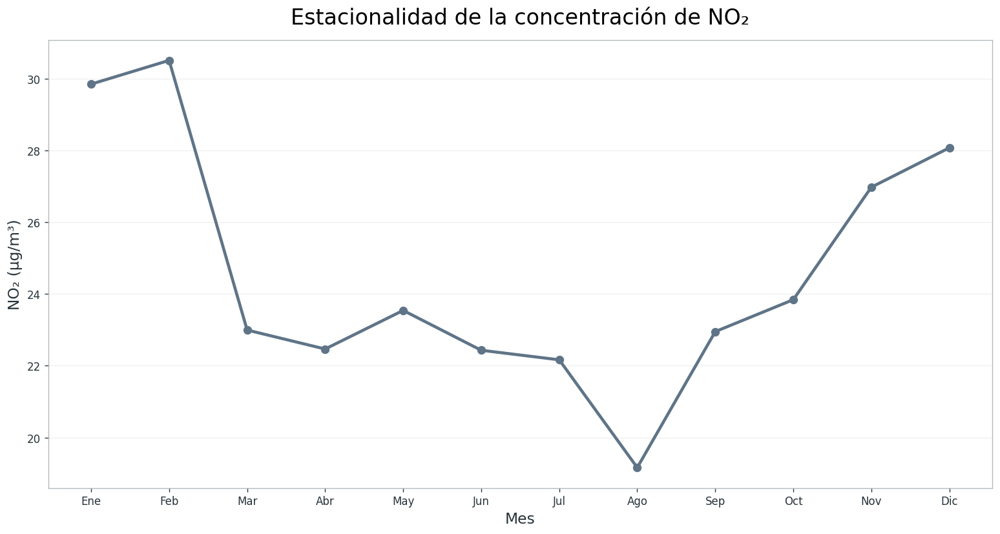

✓ Figura 2 guardada

------------------------------------------------------------------------------------------
NO₂ · MEDIA ANUAL POR ESTACIÓN
------------------------------------------------------------------------------------------
estacion_geo  Ciutadella  Eixample  Gràcia  Observatori Fabra  Palau Reial  \
anio                                                                         
2019               30.13     47.07   40.10              10.94        25.44   
2020               23.46     35.13   32.01                NaN        17.85   
2021               24.76     37.47   31.46                NaN        18.25   
2022               31.21     42.18   34.60                NaN        21.02   
2023               27.15     34.33   29.71                NaN        16.82   
2024               24.81     32.58   26.74                NaN        15.87   

estacion_geo  Poblenou  Sants  Vall d'Hebron  
anio                                          
2019             22.27  30.64          26.60  


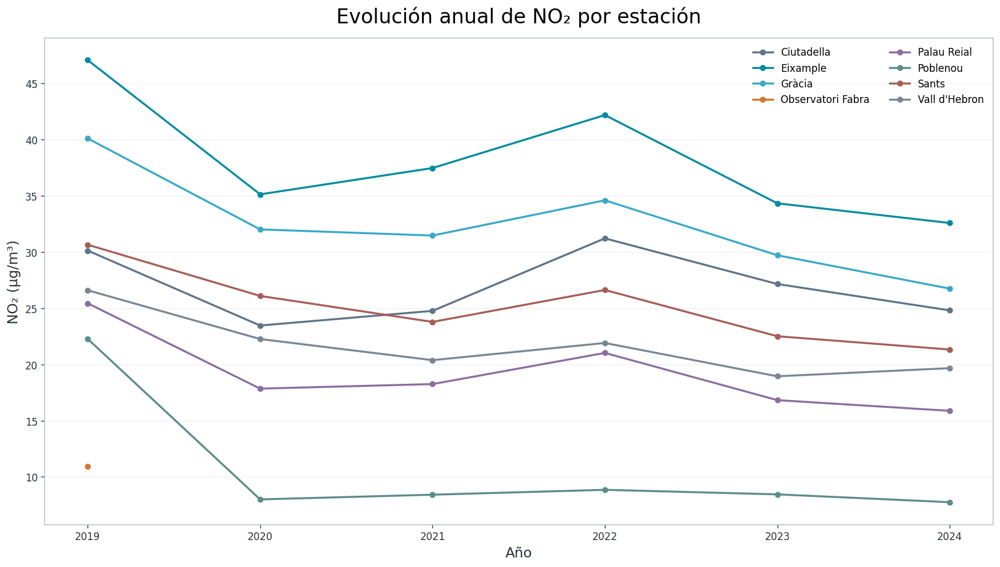

✓ Figura 3 guardada

------------------------------------------------------------------------------------------
NO₂ · PRE-COVID / COVID / POST-COVID
------------------------------------------------------------------------------------------
               observaciones   media  mediana  desviacion  minimo   maximo
periodo_covid                                                             
Pre-COVID               1562  32.424   30.545      15.404     1.0   98.708
COVID                   4900  23.609   20.833      14.098     1.0   86.333
Post-COVID              7560  23.500   21.000      13.637     1.0  113.400


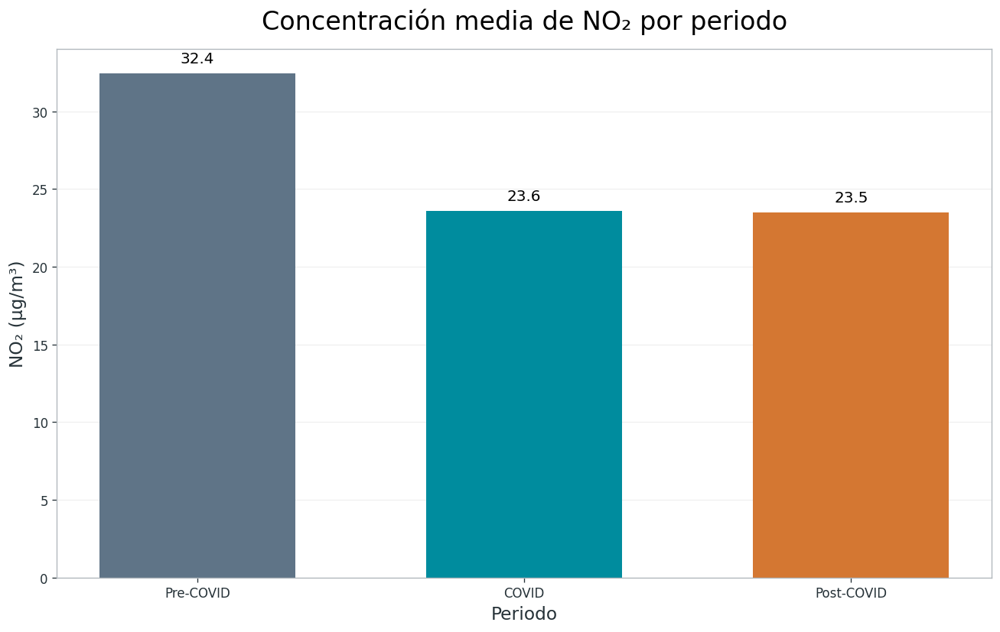

✓ Figura 4 guardada

CELDA 15 · COMPLETADA

✓ Observaciones analizadas : 14,022
✓ Años                    : 2019–2024
✓ Estaciones              : 8

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/TEMPORAL


In [ ]:
# =============================================================================
# CELDA 15 · ANÁLISIS TEMPORAL DE LA CONCENTRACIÓN DE NO₂
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 90)
print("15 · ANÁLISIS TEMPORAL DE NO₂")
print("=" * 90)

# =============================================================================
# 1. RUTAS
# =============================================================================

RUTA_DATASET = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

DIR_FIGURAS = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/TEMPORAL"
)

DIR_FIGURAS.mkdir(
    parents=True,
    exist_ok=True
)

# =============================================================================
# 2. PALETA BREATHE BARCELONA
# =============================================================================

COLOR_BUENA = "#5F7487"
COLOR_MEDIA = "#008C9E"
COLOR_MALA = "#D47732"

# Paleta adicional para estaciones

PALETA_ESTACIONES = [
    "#5F7487",
    "#008C9E",
    "#39A9C6",
    "#D47732",
    "#8A6F9E",
    "#5C8D89",
    "#A65D57",
    "#7A8793"
]

print("\n✓ Paleta Breathe Barcelona configurada")

# =============================================================================
# 3. CARGA
# =============================================================================

df = pd.read_csv(
    RUTA_DATASET,
    parse_dates=["fecha"],
    low_memory=False
)

df = df.dropna(
    subset=["NO2_ug_m3"]
).copy()

df["anio"] = df["fecha"].dt.year
df["mes"] = df["fecha"].dt.month

# Periodización

df["periodo_covid"] = np.select(
    [
        df["anio"] == 2019,
        df["anio"].isin([2020, 2021]),
        df["anio"].isin([2022, 2023, 2024])
    ],
    [
        "Pre-COVID",
        "COVID",
        "Post-COVID"
    ],
    default="Sin clasificar"
)

print(
    f"✓ Observaciones con NO₂ válido: {len(df):,}"
)

# =============================================================================
# 4. RESUMEN ANUAL
# =============================================================================

resumen_anual = (
    df
    .groupby("anio")["NO2_ug_m3"]
    .agg(
        observaciones="count",
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .round(3)
)

print("\n" + "-" * 90)
print("NO₂ · RESUMEN ANUAL")
print("-" * 90)

print(resumen_anual)

# =============================================================================
# 5. FIGURA 1 · EVOLUCIÓN ANUAL
# =============================================================================

media_anual = (
    df
    .groupby("anio")["NO2_ug_m3"]
    .mean()
)

fig, ax = plt.subplots(
    figsize=(13, 7)
)

ax.plot(
    media_anual.index,
    media_anual.values,
    marker="o",
    linewidth=2.8,
    markersize=7,
    color=COLOR_MEDIA
)

ax.set_title(
    "Evolución anual de la concentración media de NO₂",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Año",
    fontsize=14
)

ax.set_ylabel(
    "NO₂ (µg/m³)",
    fontsize=14
)

ax.set_xticks(
    media_anual.index
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "15_01_evolucion_anual_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 1 guardada")

# =============================================================================
# 6. RESUMEN MENSUAL
# =============================================================================

resumen_mensual = (
    df
    .groupby("mes")["NO2_ug_m3"]
    .agg(
        observaciones="count",
        media="mean",
        mediana="median",
        desviacion="std"
    )
    .round(3)
)

print("\n" + "-" * 90)
print("NO₂ · RESUMEN MENSUAL")
print("-" * 90)

print(resumen_mensual)

# =============================================================================
# 7. FIGURA 2 · ESTACIONALIDAD
# =============================================================================

media_mensual = (
    df
    .groupby("mes")["NO2_ug_m3"]
    .mean()
)

nombres_meses = [
    "Ene", "Feb", "Mar", "Abr",
    "May", "Jun", "Jul", "Ago",
    "Sep", "Oct", "Nov", "Dic"
]

fig, ax = plt.subplots(
    figsize=(13, 7)
)

ax.plot(
    media_mensual.index,
    media_mensual.values,
    marker="o",
    linewidth=2.8,
    markersize=7,
    color=COLOR_BUENA
)

ax.set_title(
    "Estacionalidad de la concentración de NO₂",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Mes",
    fontsize=14
)

ax.set_ylabel(
    "NO₂ (µg/m³)",
    fontsize=14
)

ax.set_xticks(
    range(1, 13)
)

ax.set_xticklabels(
    nombres_meses
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "15_02_estacionalidad_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 2 guardada")

# =============================================================================
# 8. EVOLUCIÓN POR ESTACIÓN
# =============================================================================

media_estacion_anual = (
    df
    .groupby(
        ["anio", "estacion_geo"]
    )["NO2_ug_m3"]
    .mean()
    .unstack()
)

print("\n" + "-" * 90)
print("NO₂ · MEDIA ANUAL POR ESTACIÓN")
print("-" * 90)

print(
    media_estacion_anual.round(2)
)

# =============================================================================
# 9. FIGURA 3 · EVOLUCIÓN POR ESTACIÓN
# =============================================================================

fig, ax = plt.subplots(
    figsize=(14, 8)
)

for i, estacion in enumerate(
    media_estacion_anual.columns
):

    ax.plot(
        media_estacion_anual.index,
        media_estacion_anual[estacion],
        marker="o",
        linewidth=2.0,
        markersize=5,
        label=estacion,
        color=PALETA_ESTACIONES[
            i % len(PALETA_ESTACIONES)
        ]
    )

ax.set_title(
    "Evolución anual de NO₂ por estación",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Año",
    fontsize=14
)

ax.set_ylabel(
    "NO₂ (µg/m³)",
    fontsize=14
)

ax.set_xticks(
    media_estacion_anual.index
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.legend(
    frameon=False,
    fontsize=10,
    ncol=2
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "15_03_evolucion_NO2_estaciones.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 3 guardada")

# =============================================================================
# 10. PRE-COVID / COVID / POST-COVID
# =============================================================================

orden_periodos = [
    "Pre-COVID",
    "COVID",
    "Post-COVID"
]

resumen_periodo = (
    df
    .groupby("periodo_covid")["NO2_ug_m3"]
    .agg(
        observaciones="count",
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .reindex(orden_periodos)
    .round(3)
)

print("\n" + "-" * 90)
print("NO₂ · PRE-COVID / COVID / POST-COVID")
print("-" * 90)

print(resumen_periodo)

# =============================================================================
# 11. FIGURA 4 · COMPARACIÓN DE PERIODOS
# =============================================================================

fig, ax = plt.subplots(
    figsize=(11, 7)
)

media_periodo = (
    resumen_periodo["media"]
)

bars = ax.bar(
    orden_periodos,
    media_periodo.values,
    color=[
        COLOR_BUENA,
        COLOR_MEDIA,
        COLOR_MALA
    ],
    width=0.60
)

for bar, valor in zip(
    bars,
    media_periodo.values
):

    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.5,
        f"{valor:.1f}",
        ha="center",
        va="bottom",
        fontsize=12
    )

ax.set_title(
    "Concentración media de NO₂ por periodo",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Periodo",
    fontsize=14
)

ax.set_ylabel(
    "NO₂ (µg/m³)",
    fontsize=14
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "15_04_NO2_periodos_covid.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 4 guardada")

# =============================================================================
# 12. RESUMEN FINAL
# =============================================================================

print("\n" + "=" * 90)
print("CELDA 15 · COMPLETADA")
print("=" * 90)

print(
    f"\n✓ Observaciones analizadas : {len(df):,}"
)

print(
    f"✓ Años                    : "
    f"{df['anio'].min()}–{df['anio'].max()}"
)

print(
    f"✓ Estaciones              : "
    f"{df['estacion_geo'].nunique()}"
)

print(
    f"\n✓ Figuras guardadas en:"
    f"\n{DIR_FIGURAS}"
)

### RESULTADOS DEL ANÁLISIS TEMPORAL DE LA CONCENTRACIÓN DE NO₂

## Evolución temporal de la concentración de NO₂

El análisis temporal muestra una evolución diferenciada de la concentración media de NO₂ durante el periodo 2019–2024.

La concentración media anual fue de **32,42 µg/m³ en 2019**, descendiendo hasta **23,70 µg/m³ en 2020** y **23,52 µg/m³ en 2021**. En 2022 se observa un repunte hasta **26,61 µg/m³**, seguido de un nuevo descenso en 2023 (**22,56 µg/m³**) y 2024 (**21,31 µg/m³**).

En conjunto, se observa una reducción de la concentración media anual de NO₂ de aproximadamente **34 % entre 2019 y 2024**, aunque con un repunte intermedio en 2022.

## Variabilidad estacional

La concentración de NO₂ presenta un patrón estacional marcado. Los valores medios más elevados se registran durante los meses de invierno, con máximos en **febrero (30,52 µg/m³)** y **enero (29,86 µg/m³)**. También se observa una concentración elevada en diciembre (**28,08 µg/m³**).

Por el contrario, el mínimo anual se alcanza en **agosto (19,16 µg/m³)**. A partir de septiembre se inicia una recuperación progresiva de las concentraciones, alcanzándose nuevamente valores elevados durante noviembre y diciembre.

Este comportamiento evidencia una componente estacional relevante que deberá considerarse en las etapas posteriores de modelización.

## Diferencias entre estaciones

La evolución temporal presenta diferencias espaciales persistentes entre las estaciones de monitorización. **Eixample y Gràcia** presentan las concentraciones medias más elevadas durante prácticamente todo el periodo, mientras que **Poblenou** registra valores claramente inferiores desde 2020.

En 2024, por ejemplo, la concentración media fue de **32,58 µg/m³ en Eixample**, **26,74 µg/m³ en Gràcia**, **24,81 µg/m³ en Ciutadella**, **21,33 µg/m³ en Sants**, **19,67 µg/m³ en Vall d'Hebron**, **15,87 µg/m³ en Palau Reial** y **7,75 µg/m³ en Poblenou**.

La estación de **Observatori Fabra** únicamente dispone de observaciones durante enero de 2019, por lo que no se considera representativa para analizar su evolución interanual.

## Comparación Pre-COVID, COVID y Post-COVID

La concentración media de NO₂ fue de **32,42 µg/m³ en el periodo Pre-COVID**, descendiendo hasta **23,61 µg/m³ durante COVID** y manteniéndose prácticamente estable en **23,50 µg/m³ durante el periodo Post-COVID**.

Por tanto, respecto al periodo Pre-COVID se observa una reducción de aproximadamente **27 % durante COVID** y **28 % en el periodo Post-COVID**.

Los resultados muestran que los niveles medios de NO₂ posteriores a la pandemia permanecen claramente por debajo de los observados en 2019. Esta evolución se considera una asociación temporal y no permite, por sí sola, establecer relaciones causales.

## Síntesis

El análisis confirma tres características principales de la serie de NO₂:

- una **tendencia temporal descendente** respecto a 2019;
- una **estacionalidad marcada**, con mayores concentraciones durante invierno y menores durante verano;
- y una **heterogeneidad espacial persistente** entre estaciones.

Estos patrones justifican la incorporación de variables temporales, meteorológicas y espaciales en las etapas posteriores de modelización.

# 16 · AUTOCORRELACIÓN TEMPORAL Y RETARDOS DE NO₂

## Objetivo

Una vez caracterizada la evolución temporal de la concentración de NO₂, esta etapa analiza su **dependencia temporal**.

El objetivo es determinar hasta qué punto la concentración observada en un día está relacionada con la concentración registrada en días anteriores y qué escalas temporales presentan mayor dependencia.

---

## Análisis realizado

Para cada estación de monitorización se calculan correlaciones entre la concentración diaria de NO₂ y sus valores retardados:

- **lag 1:** día anterior;
- **lag 2:** dos días anteriores;
- **lag 3:** tres días anteriores;
- **lag 7:** una semana anterior;
- **lag 14:** dos semanas anteriores;
- **lag 30:** aproximadamente un mes anterior.

El análisis se realiza respetando la estructura temporal de cada estación y evitando mezclar observaciones pertenecientes a estaciones diferentes.

---

## Autocorrelación

La autocorrelación permite cuantificar la similitud entre la serie de NO₂ y versiones de la misma serie desplazadas temporalmente.

Valores elevados de correlación para retardos cortos indicarían una mayor continuidad temporal de las concentraciones, mientras que una disminución de la correlación al aumentar el retardo indicaría una pérdida progresiva de dicha dependencia.

---

## Comparación entre estaciones

Además de analizar la autocorrelación global, se comparan los coeficientes obtenidos entre estaciones para determinar si la persistencia temporal presenta diferencias espaciales.

Esta comparación permitirá comprobar si las estaciones con mayores concentraciones presentan también una dinámica temporal diferenciada.

---

## Aplicación a la modelización

La identificación de dependencia temporal es relevante para la posterior construcción de variables retardadas.

Sin embargo, los retardos deberán incorporarse al modelo respetando estrictamente el orden temporal para evitar **fuga de información (data leakage)**.

El análisis de esta celda servirá, por tanto, para justificar qué escalas temporales pueden resultar informativas en la modelización posterior.

---

## Visualización

Se generarán:

1. una tabla de autocorrelaciones por estación y retardo;
2. un gráfico de la autocorrelación media según el retardo;
3. un mapa de calor de la autocorrelación por estación;
4. una representación de la evolución de la autocorrelación según la escala temporal.

La identidad visual seguirá la paleta **Breathe Barcelona** utilizada en las celdas anteriores.

16 · AUTOCORRELACIÓN TEMPORAL Y RETARDOS DE NO₂

✓ Paleta Breathe Barcelona configurada
✓ Dataset cargado: 14,022 observaciones
✓ Estaciones: 8

------------------------------------------------------------------------------------------
AUTOCORRELACIÓN DE NO₂ POR ESTACIÓN
------------------------------------------------------------------------------------------
                   lag_1  lag_2  lag_3  lag_7  lag_14  lag_30
estacion_geo                                                 
Ciutadella         0.559  0.334  0.264  0.262   0.223   0.173
Eixample           0.630  0.405  0.336  0.353   0.288   0.216
Gràcia             0.577  0.325  0.245  0.282   0.226   0.142
Observatori Fabra  0.001 -0.382 -0.179 -0.273   0.017     NaN
Palau Reial        0.601  0.364  0.297  0.286   0.247   0.197
Poblenou           0.685  0.543  0.509  0.440   0.319  -0.009
Sants              0.646  0.413  0.357  0.361   0.334   0.252
Vall d'Hebron      0.577  0.318  0.235  0.227   0.160   0.156

----------------

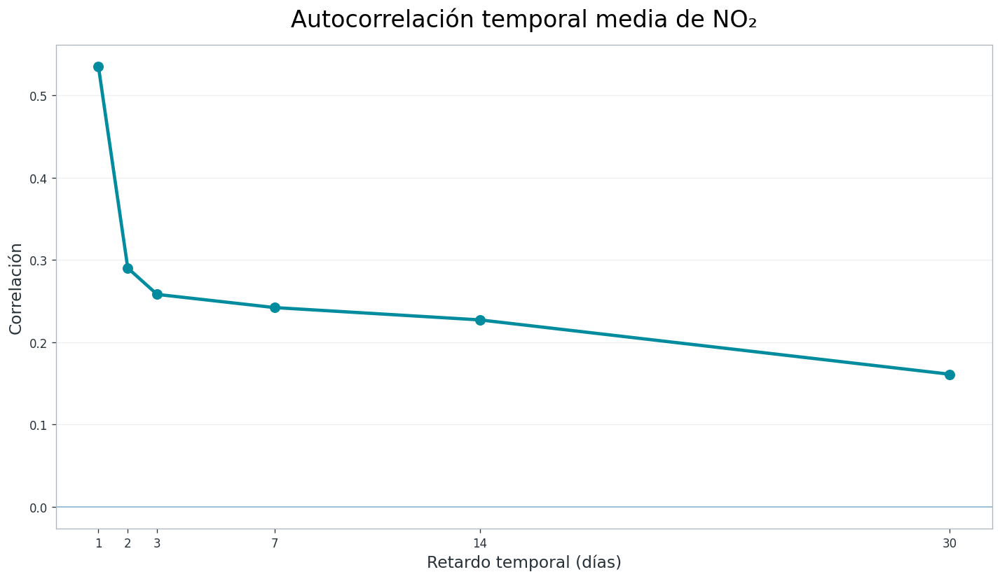

✓ Figura 1 guardada


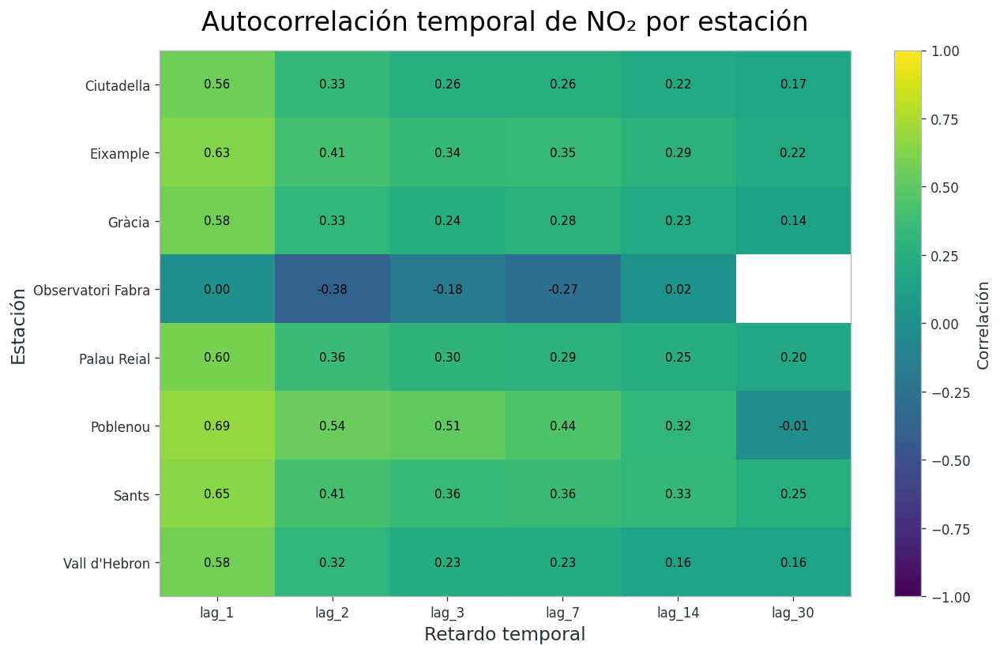

✓ Figura 2 guardada


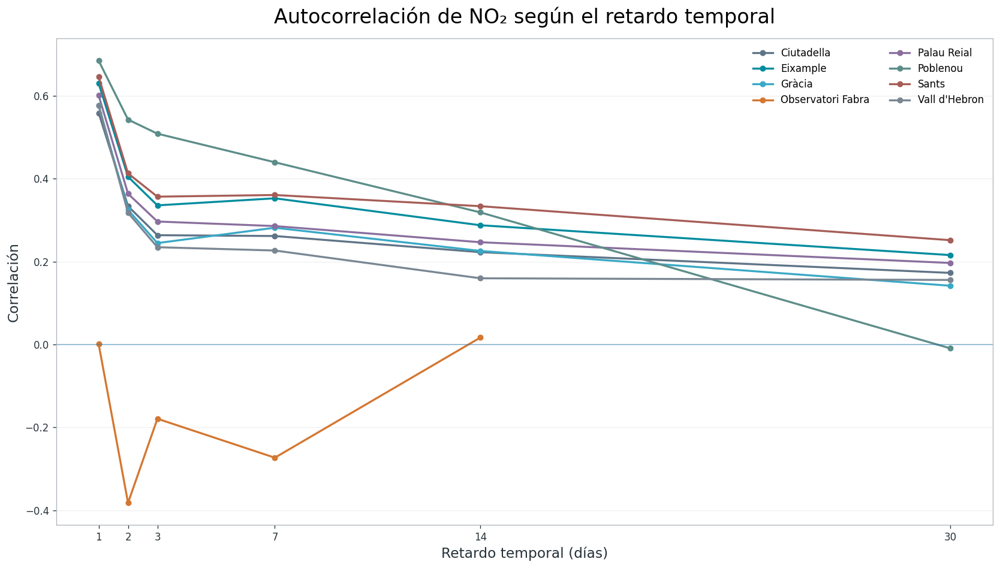

✓ Figura 3 guardada

------------------------------------------------------------------------------------------
RETARDO CON MAYOR AUTOCORRELACIÓN MEDIA
------------------------------------------------------------------------------------------
✓ Lag: 1 días
✓ Correlación media: 0.535

✓ Resultados guardados en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/16_autocorrelacion_NO2.csv

CELDA 16 · COMPLETADA

✓ Estaciones analizadas : 8
✓ Retardos analizados   : [1, 2, 3, 7, 14, 30]
✓ Mejor lag medio       : 1 días
✓ Correlación           : 0.535

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/TEMPORAL


In [ ]:
# =============================================================================
# CELDA 16 · AUTOCORRELACIÓN TEMPORAL Y RETARDOS DE NO₂
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 90)
print("16 · AUTOCORRELACIÓN TEMPORAL Y RETARDOS DE NO₂")
print("=" * 90)

# =============================================================================
# 1. RUTAS
# =============================================================================

RUTA_DATASET = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

DIR_FIGURAS = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/TEMPORAL"
)

DIR_FIGURAS.mkdir(
    parents=True,
    exist_ok=True
)

# =============================================================================
# 2. PALETA BREATHE BARCELONA
# =============================================================================

COLOR_PRINCIPAL = "#008C9E"
COLOR_SECUNDARIO = "#5F7487"

PALETA_ESTACIONES = [
    "#5F7487",
    "#008C9E",
    "#39A9C6",
    "#D47732",
    "#8A6F9E",
    "#5C8D89",
    "#A65D57",
    "#7A8793"
]

print("\n✓ Paleta Breathe Barcelona configurada")

# =============================================================================
# 3. CARGA Y PREPARACIÓN
# =============================================================================

df = pd.read_csv(
    RUTA_DATASET,
    parse_dates=["fecha"],
    low_memory=False
)

df = df.dropna(
    subset=[
        "fecha",
        "estacion_geo",
        "NO2_ug_m3"
    ]
).copy()

df = df.sort_values(
    [
        "estacion_geo",
        "fecha"
    ]
).reset_index(drop=True)

print(
    f"✓ Dataset cargado: {len(df):,} observaciones"
)

print(
    f"✓ Estaciones: {df['estacion_geo'].nunique()}"
)

# =============================================================================
# 4. CÁLCULO DE RETARDOS
# =============================================================================

LAGS = [1, 2, 3, 7, 14, 30]

resultados = []

for estacion, grupo in df.groupby("estacion_geo"):

    grupo = (
        grupo
        .sort_values("fecha")
        .copy()
    )

    # -------------------------------------------------------------------------
    # IMPORTANTE:
    # El lag se calcula sobre la serie temporal de cada estación.
    # -------------------------------------------------------------------------

    for lag in LAGS:

        x = grupo["NO2_ug_m3"]
        x_lag = x.shift(lag)

        validos = (
            pd.concat(
                [x, x_lag],
                axis=1
            )
            .dropna()
        )

        if len(validos) >= 3:

            correlacion = (
                validos.iloc[:, 0]
                .corr(validos.iloc[:, 1])
            )

        else:

            correlacion = np.nan

        resultados.append(
            {
                "estacion_geo": estacion,
                "lag": lag,
                "correlacion": correlacion,
                "pares_validos": len(validos)
            }
        )

df_autocorr = pd.DataFrame(
    resultados
)

# =============================================================================
# 5. RESULTADOS
# =============================================================================

tabla_autocorr = (
    df_autocorr
    .pivot(
        index="estacion_geo",
        columns="lag",
        values="correlacion"
    )
    .round(3)
)

tabla_autocorr.columns = [
    f"lag_{int(c)}"
    for c in tabla_autocorr.columns
]

print("\n" + "-" * 90)
print("AUTOCORRELACIÓN DE NO₂ POR ESTACIÓN")
print("-" * 90)

print(
    tabla_autocorr
)

# =============================================================================
# 6. AUTOCORRELACIÓN MEDIA
# =============================================================================

media_autocorr = (
    df_autocorr
    .groupby("lag")["correlacion"]
    .agg(
        media="mean",
        mediana="median",
        desviacion="std",
        minimo="min",
        maximo="max"
    )
    .round(3)
)

print("\n" + "-" * 90)
print("AUTOCORRELACIÓN MEDIA POR RETARDO")
print("-" * 90)

print(
    media_autocorr
)

# =============================================================================
# 7. FIGURA 1 · AUTOCORRELACIÓN MEDIA
# =============================================================================

fig, ax = plt.subplots(
    figsize=(12, 7)
)

ax.plot(
    media_autocorr.index,
    media_autocorr["media"],
    marker="o",
    linewidth=2.8,
    markersize=8,
    color=COLOR_PRINCIPAL
)

ax.set_title(
    "Autocorrelación temporal media de NO₂",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Retardo temporal (días)",
    fontsize=14
)

ax.set_ylabel(
    "Correlación",
    fontsize=14
)

ax.set_xticks(
    LAGS
)

ax.axhline(
    0,
    linewidth=1,
    alpha=0.5
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "16_01_autocorrelacion_media_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 1 guardada")

# =============================================================================
# 8. FIGURA 2 · HEATMAP SIN SEABORN
# =============================================================================

fig, ax = plt.subplots(
    figsize=(11, 7)
)

matriz = tabla_autocorr.values

im = ax.imshow(
    matriz,
    aspect="auto",
    cmap="viridis",
    vmin=-1,
    vmax=1
)

ax.set_xticks(
    range(len(tabla_autocorr.columns))
)

ax.set_xticklabels(
    tabla_autocorr.columns
)

ax.set_yticks(
    range(len(tabla_autocorr.index))
)

ax.set_yticklabels(
    tabla_autocorr.index
)

ax.set_xlabel(
    "Retardo temporal",
    fontsize=14
)

ax.set_ylabel(
    "Estación",
    fontsize=14
)

ax.set_title(
    "Autocorrelación temporal de NO₂ por estación",
    fontsize=20,
    pad=15
)

cbar = fig.colorbar(
    im,
    ax=ax
)

cbar.set_label(
    "Correlación",
    fontsize=12
)

# Valores dentro de las celdas

for i in range(matriz.shape[0]):

    for j in range(matriz.shape[1]):

        valor = matriz[i, j]

        if not np.isnan(valor):

            ax.text(
                j,
                i,
                f"{valor:.2f}",
                ha="center",
                va="center",
                fontsize=9
            )

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "16_02_heatmap_autocorrelacion_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 2 guardada")

# =============================================================================
# 9. FIGURA 3 · AUTOCORRELACIÓN POR ESTACIÓN
# =============================================================================

fig, ax = plt.subplots(
    figsize=(14, 8)
)

for i, estacion in enumerate(
    tabla_autocorr.index
):

    valores = tabla_autocorr.loc[
        estacion
    ].values

    ax.plot(
        LAGS,
        valores,
        marker="o",
        linewidth=2,
        markersize=5,
        label=estacion,
        color=PALETA_ESTACIONES[
            i % len(PALETA_ESTACIONES)
        ]
    )

ax.set_title(
    "Autocorrelación de NO₂ según el retardo temporal",
    fontsize=20,
    pad=15
)

ax.set_xlabel(
    "Retardo temporal (días)",
    fontsize=14
)

ax.set_ylabel(
    "Correlación",
    fontsize=14
)

ax.set_xticks(
    LAGS
)

ax.axhline(
    0,
    linewidth=1,
    alpha=0.5
)

ax.grid(
    axis="y",
    alpha=0.18
)

ax.legend(
    frameon=False,
    fontsize=10,
    ncol=2
)

ax.set_axisbelow(True)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "16_03_autocorrelacion_estaciones_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

print("✓ Figura 3 guardada")

# =============================================================================
# 10. RETARDO CON MAYOR CORRELACIÓN
# =============================================================================

mejor_lag = (
    media_autocorr["media"]
    .idxmax()
)

mejor_correlacion = (
    media_autocorr.loc[
        mejor_lag,
        "media"
    ]
)

print("\n" + "-" * 90)
print("RETARDO CON MAYOR AUTOCORRELACIÓN MEDIA")
print("-" * 90)

print(
    f"✓ Lag: {int(mejor_lag)} días"
)

print(
    f"✓ Correlación media: {mejor_correlacion:.3f}"
)

# =============================================================================
# 11. GUARDAR TABLA
# =============================================================================

RUTA_RESULTADOS = (
    DIR_FIGURAS.parent /
    "16_autocorrelacion_NO2.csv"
)

df_autocorr.to_csv(
    RUTA_RESULTADOS,
    index=False
)

print(
    f"\n✓ Resultados guardados en:"
    f"\n{RUTA_RESULTADOS}"
)

# =============================================================================
# 12. RESUMEN
# =============================================================================

print("\n" + "=" * 90)
print("CELDA 16 · COMPLETADA")
print("=" * 90)

print(
    f"\n✓ Estaciones analizadas : "
    f"{df['estacion_geo'].nunique()}"
)

print(
    f"✓ Retardos analizados   : "
    f"{LAGS}"
)

print(
    f"✓ Mejor lag medio       : "
    f"{int(mejor_lag)} días"
)

print(
    f"✓ Correlación           : "
    f"{mejor_correlacion:.3f}"
)

print(
    f"\n✓ Figuras guardadas en:"
    f"\n{DIR_FIGURAS}"
)

## RESULTADOS · AUTOCORRELACIÓN TEMPORAL DE NO₂

El análisis de autocorrelación temporal muestra una **dependencia temporal clara de las concentraciones diarias de NO₂**, especialmente a corto plazo.

- La **autocorrelación media máxima** se obtiene para un retardo de **1 día (r = 0,535)**.
- La autocorrelación disminuye progresivamente con el aumento del retardo:
  - **1 día:** 0,535
  - **2 días:** 0,290
  - **3 días:** 0,258
  - **7 días:** 0,242
  - **14 días:** 0,227
  - **30 días:** 0,161

### Heterogeneidad entre estaciones

La persistencia temporal presenta diferencias entre estaciones. **Poblenou** registra los valores más elevados en los primeros retardos:

- lag 1: **0,685**
- lag 2: **0,543**
- lag 3: **0,509**
- lag 7: **0,440**
- lag 14: **0,319**

También destacan **Sants (0,646)** y **Eixample (0,630)** para el retardo de un día.

En general, la autocorrelación disminuye al aumentar el retardo, aunque permanece positiva en la mayoría de las estaciones incluso a 30 días. Esto evidencia una **persistencia temporal de las concentraciones de NO₂**, especialmente marcada a escala diaria y semanal.

> **Observación metodológica:** Observatori Fabra presenta valores atípicos de autocorrelación debido a su cobertura extremadamente reducida (28 observaciones válidas), por lo que sus resultados deben interpretarse con cautela y no son directamente comparables con los del resto de estaciones.

### Implicación para la modelización

La existencia de esta dependencia temporal justifica evaluar **variables retardadas de NO₂** en la posterior fase de Machine Learning, especialmente los retardos de **1, 2, 3 y 7 días**, como potenciales variables predictoras.

# 17 · CORRELACIONES ENTRE VARIABLES

En esta celda se analiza la relación lineal entre las principales variables
ambientales, meteorológicas, de tráfico, ruido, actividad aeroportuaria y
portuaria disponibles en el dataset.

El objetivo es:

- identificar relaciones relevantes entre variables;
- detectar posibles variables redundantes;
- explorar asociaciones entre NO₂ y sus principales factores explicativos;
- preparar la selección de variables para el análisis multivariante posterior;
- proporcionar una primera base para el PCA y la modelización predictiva.

Se utilizará la **correlación de Pearson** para las variables numéricas.

La interpretación se realizará atendiendo tanto a la magnitud como al signo
de las correlaciones, sin asumir relaciones causales.

✓ Dataset cargado: 14,022 observaciones
✓ Variables analizadas: 14
['NO2_ug_m3', 'O3_ug_m3', 'PM10_ug_m3', 'PM25_ug_m3', 'TM', 'HRM', 'PPT', 'VVM10', 'trafico_idw_500m', 'trafico_idw_750m', 'trafico_idw_1000m', 'LAeq_idw_1500m', 'Vuelos_total', 'Puerto_movimientos']

CORRELACIÓN CON NO₂
O3_ug_m3             -0.684
PM10_ug_m3            0.469
PM25_ug_m3            0.453
VVM10                -0.420
LAeq_idw_1500m        0.322
Puerto_movimientos    0.153
TM                   -0.104
trafico_idw_1000m     0.095
HRM                  -0.086
trafico_idw_500m      0.062
PPT                  -0.048
trafico_idw_750m      0.028
Vuelos_total         -0.007


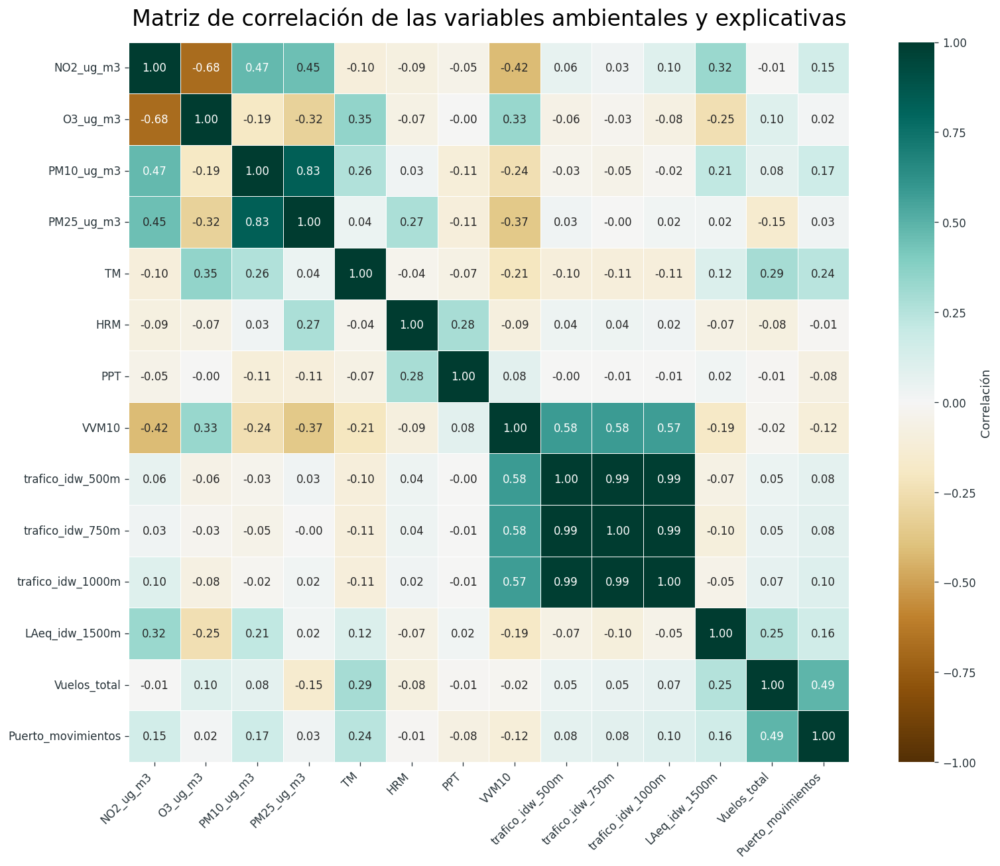


✓ Figura 1 guardada

TOP CORRELACIONES ABSOLUTAS CON NO₂
O3_ug_m3                       -0.684
PM10_ug_m3                     +0.469
PM25_ug_m3                     +0.453
VVM10                          -0.420
LAeq_idw_1500m                 +0.322
Puerto_movimientos             +0.153
TM                             -0.104
trafico_idw_1000m              +0.095
HRM                            -0.086
trafico_idw_500m               +0.062

✓ Matriz de correlación guardada
✓ Correlaciones con NO₂ guardadas
✓ Observaciones analizadas: 14,022


In [ ]:
# ============================================================
# 17 · CORRELACIONES ENTRE VARIABLES
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# ------------------------------------------------------------
# 1. CONFIGURACIÓN
# ------------------------------------------------------------

PALETA = {
    "principal": "#008C95",
    "secundario": "#60758A",
    "acento": "#D97932",
    "verde": "#5C8D87"
}

# Dataset de modelización

ruta_dataset = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

df = pd.read_csv(
    ruta_dataset,
    low_memory=False
)

print(
    f"✓ Dataset cargado: {len(df):,} observaciones"
)

# ------------------------------------------------------------
# 2. VARIABLES DE INTERÉS
# ------------------------------------------------------------

variables_interes = [
    "NO2_ug_m3",
    "O3_ug_m3",
    "PM10_ug_m3",
    "PM25_ug_m3",
    "TM",
    "HRM",
    "PPT",
    "VVM10",
    "trafico_idw_500m",
    "trafico_idw_750m",
    "trafico_idw_1000m",
    "LAeq_idw_1500m",
    "Vuelos_total",
    "Puerto_movimientos"
]

variables_presentes = [
    v for v in variables_interes
    if v in df.columns
]

print(
    f"✓ Variables analizadas: "
    f"{len(variables_presentes)}"
)

print(
    variables_presentes
)

# ------------------------------------------------------------
# 3. MATRIZ DE CORRELACIÓN
# ------------------------------------------------------------

corr = (
    df[variables_presentes]
    .corr(method="pearson")
)

# ------------------------------------------------------------
# 4. CORRELACIONES CON NO₂
# ------------------------------------------------------------

corr_no2 = (
    corr["NO2_ug_m3"]
    .drop("NO2_ug_m3")
    .sort_values(
        key=abs,
        ascending=False
    )
)

print("\n" + "=" * 60)
print("CORRELACIÓN CON NO₂")
print("=" * 60)

print(
    corr_no2
    .round(3)
    .to_string()
)

# ------------------------------------------------------------
# 5. HEATMAP
# ------------------------------------------------------------

plt.figure(
    figsize=(14, 11)
)

sns.heatmap(
    corr,
    cmap="BrBG",
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    square=True,
    cbar_kws={
        "label": "Correlación"
    }
)

plt.title(
    "Matriz de correlación de las variables ambientales y explicativas",
    fontsize=20,
    pad=15
)

plt.xticks(
    rotation=45,
    ha="right"
)

plt.yticks(
    rotation=0
)

plt.tight_layout()

ruta_figura = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/CORRELACIONES"
)

os.makedirs(
    ruta_figura,
    exist_ok=True
)

plt.savefig(
    f"{ruta_figura}/17_correlacion_variables.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "\n✓ Figura 1 guardada"
)

# ------------------------------------------------------------
# 6. TOP CORRELACIONES CON NO₂
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("TOP CORRELACIONES ABSOLUTAS CON NO₂")
print("=" * 60)

for variable, valor in corr_no2.head(10).items():

    print(
        f"{variable:30s} {valor:+.3f}"
    )

# ------------------------------------------------------------
# 7. GUARDAR RESULTADOS
# ------------------------------------------------------------

corr.to_csv(
    f"{ruta_figura}/17_matriz_correlacion.csv"
)

corr_no2.to_csv(
    f"{ruta_figura}/17_correlacion_con_NO2.csv",
    header=["correlacion"]
)

print(
    "\n✓ Matriz de correlación guardada"
)

print(
    "✓ Correlaciones con NO₂ guardadas"
)

print(
    f"✓ Observaciones analizadas: {len(df):,}"
)

## RESULTADOS · CORRELACIONES ENTRE VARIABLES

El análisis de correlación de Pearson muestra diferentes grados de asociación
entre la concentración de NO₂ y las variables ambientales y explicativas
consideradas.

### Correlaciones con NO₂

- **O₃:** correlación negativa fuerte (**r = −0,684**).
- **PM10:** correlación positiva moderada (**r = +0,469**).
- **PM2.5:** correlación positiva moderada (**r = +0,453**).
- **VVM10:** correlación negativa moderada (**r = −0,420**).
- **LAeq_idw_1500m:** correlación positiva moderada (**r = +0,322**).
- **Puerto_movimientos:** correlación positiva débil (**r = +0,153**).
- **TM:** correlación negativa débil (**r = −0,104**).
- **HRM:** correlación negativa débil (**r = −0,086**).
- **Tráfico:** las correlaciones lineales con NO₂ son reducidas en el conjunto
  global, con valores de **+0,062**, **+0,028** y **+0,095** para 500, 750 y
  1000 m, respectivamente.
- **Vuelos_total:** correlación prácticamente nula (**r = −0,007**).

### Redundancia entre variables de tráfico

Las tres variables espaciales de tráfico presentan una correlación
extremadamente elevada entre sí:

- `trafico_idw_500m` – `trafico_idw_750m`: **r = 0,99**
- `trafico_idw_500m` – `trafico_idw_1000m`: **r = 0,99**
- `trafico_idw_750m` – `trafico_idw_1000m`: **r = 0,99**

Esto evidencia una **elevada redundancia entre las tres escalas espaciales de
agregación del tráfico**, aspecto que deberá considerarse en el posterior
análisis multivariante y en la selección de variables.

### Interpretación

La asociación inversa entre NO₂ y O₃ constituye la relación lineal más
marcada observada. También se identifican asociaciones positivas entre NO₂ y
las partículas PM10 y PM2.5, mientras que la velocidad del viento presenta una
relación inversa moderada.

Por otro lado, la baja correlación lineal global del tráfico con NO₂ no implica
ausencia de relación, ya que las relaciones pueden ser **no lineales,
espaciales o dependientes de las condiciones meteorológicas**.

Los resultados muestran, por tanto, la necesidad de complementar el análisis
de correlaciones con técnicas multivariantes y modelos capaces de capturar
relaciones no lineales.

# 18 · ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)
El análisis de Componentes Principales (PCA) se utiliza para sintetizar la
información contenida en las variables explicativas y estudiar las principales
estructuras de variabilidad del conjunto de datos.

El análisis permitirá:

- reducir la dimensionalidad de las variables explicativas;
- identificar grupos de variables con comportamiento similar;
- detectar redundancias entre variables;
- determinar qué proporción de la varianza explica cada componente;
- interpretar los principales ejes de variabilidad mediante las cargas
  (*loadings*) de las variables.

Antes de aplicar el PCA, las variables numéricas serán estandarizadas para
evitar que las diferencias de escala condicionen el resultado.

La variable objetivo `NO2_ug_m3`, así como `clase_NO2_3` y `target`, no se
incorporan al PCA, ya que el objetivo es analizar la estructura interna de las
variables explicativas de forma independiente de la variable a predecir.

✓ Dataset cargado: 14,022 observaciones
✓ Variables numéricas disponibles: 67
✓ Variables con variabilidad: 67
✓ Valores ausentes imputados mediante mediana
✓ Variables estandarizadas

VARIANZA EXPLICADA
 componente  varianza_explicada  varianza_acumulada
          1              0.2904              0.2904
          2              0.0980              0.3883
          3              0.0751              0.4634
          4              0.0640              0.5274
          5              0.0503              0.5776
          6              0.0452              0.6228
          7              0.0431              0.6659
          8              0.0313              0.6972
          9              0.0274              0.7246
         10              0.0251              0.7496

✓ Componentes necesarios:
  80 % varianza: 13
  90 % varianza: 20
  95 % varianza: 26


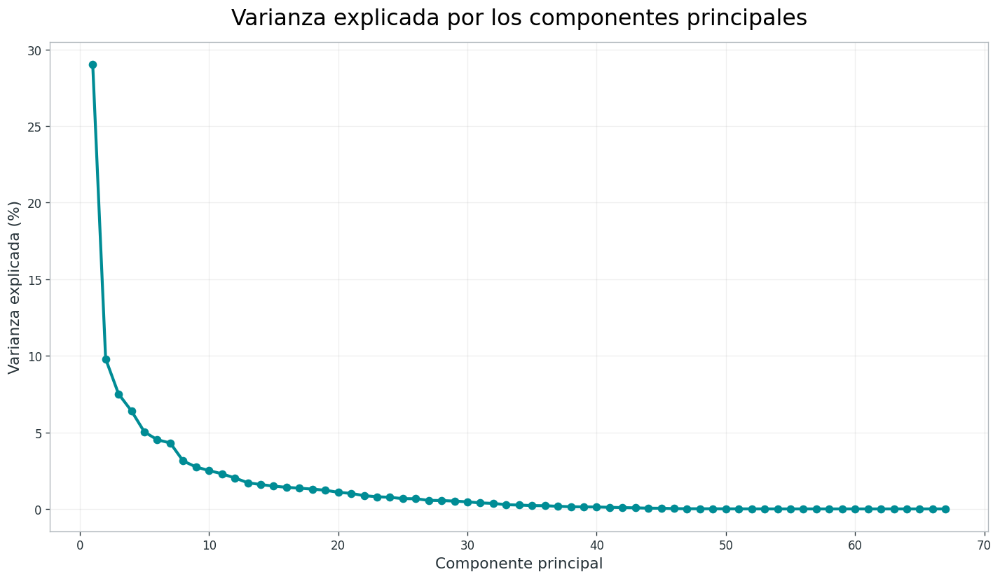

✓ Figura 1 guardada


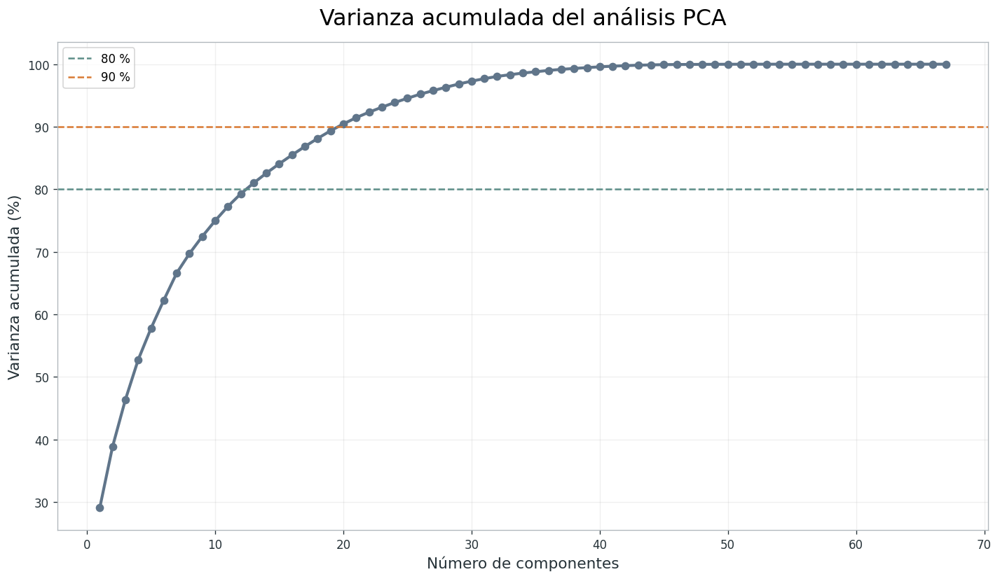

✓ Figura 2 guardada

PRINCIPALES CARGAS POR COMPONENTE

PC1
  n_aforos_total_500m                 +0.203
  n_aforos_disponibles_500m           +0.203
  n_aforos_obs_750m                   +0.201
  n_aforos_disponibles_750m           +0.201
  n_aforos_total_750m                 +0.201
  trafico_media_750m                  -0.197
  n_aforos_obs_500m                   +0.196
  trafico_idw_750m                    -0.196

PC2
  trafico_suma_1000m                  +0.266
  trafico_suma_750m                   +0.265
  Vuelos_total                        +0.242
  trafico_suma_500m                   +0.238
  Companias_activas                   +0.236
  Puerto_ferry_pasajeros              +0.226
  Vuelos_internacionales_pct          +0.220
  Zonas_activas                       +0.203

PC3
  Vuelos_total                        +0.275
  TX                                  +0.271
  Puerto_ferry_pasajeros              +0.267
  TM                                  +0.257
  Vuelos_internacionales_pct  

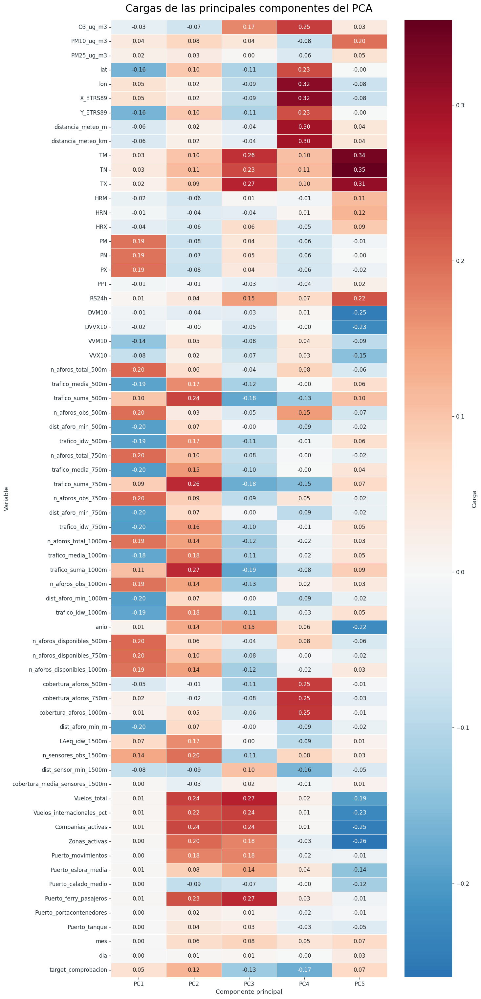

✓ Figura 3 guardada

✓ PCA COMPLETADO
✓ Observaciones: 14,022
✓ Variables analizadas: 67
✓ Componentes: 67
✓ 80 % varianza: 13 componentes
✓ 90 % varianza: 20 componentes
✓ 95 % varianza: 26 componentes

✓ Resultados guardados en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/PCA


In [ ]:
# ============================================================
# 18 · ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. CONFIGURACIÓN
# ------------------------------------------------------------

PALETA = {
    "principal": "#008C95",
    "secundario": "#60758A",
    "acento": "#D97932",
    "verde": "#5C8D87"
}

ruta_dataset = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

ruta_figuras = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/PCA"
)

os.makedirs(
    ruta_figuras,
    exist_ok=True
)

# ------------------------------------------------------------
# 2. CARGA
# ------------------------------------------------------------

df = pd.read_csv(
    ruta_dataset,
    low_memory=False
)

print(
    f"✓ Dataset cargado: {len(df):,} observaciones"
)

# ------------------------------------------------------------
# 3. VARIABLES EXPLICATIVAS
# ------------------------------------------------------------

variables_excluir = [
    "fecha",
    "NO2_ug_m3",
    "clase_NO2_3",
    "target",
    "estacion_geo",
    "periodo_covid"
]

# Solo variables numéricas

df_numerico = df.select_dtypes(
    include=np.number
).copy()

variables_pca = [
    col
    for col in df_numerico.columns
    if col not in variables_excluir
]

print(
    f"✓ Variables numéricas disponibles: "
    f"{len(variables_pca)}"
)

# ------------------------------------------------------------
# 4. ELIMINAR VARIABLES SIN VARIABILIDAD
# ------------------------------------------------------------

n_unicos = (
    df_numerico[variables_pca]
    .nunique()
)

variables_pca = [
    col
    for col in variables_pca
    if n_unicos[col] > 1
]

print(
    f"✓ Variables con variabilidad: "
    f"{len(variables_pca)}"
)

# ------------------------------------------------------------
# 5. IMPUTACIÓN DE VALORES AUSENTES
# ------------------------------------------------------------

X = (
    df_numerico[variables_pca]
    .copy()
)

imputer = SimpleImputer(
    strategy="median"
)

X_imp = imputer.fit_transform(
    X
)

print(
    "✓ Valores ausentes imputados mediante mediana"
)

# ------------------------------------------------------------
# 6. ESTANDARIZACIÓN
# ------------------------------------------------------------

scaler = StandardScaler()

X_std = scaler.fit_transform(
    X_imp
)

print(
    "✓ Variables estandarizadas"
)

# ------------------------------------------------------------
# 7. PCA COMPLETO
# ------------------------------------------------------------

pca = PCA()

X_pca = pca.fit_transform(
    X_std
)

varianza_explicada = (
    pca.explained_variance_ratio_
)

varianza_acumulada = (
    np.cumsum(
        varianza_explicada
    )
)

resultados_pca = pd.DataFrame({
    "componente": np.arange(
        1,
        len(varianza_explicada) + 1
    ),
    "varianza_explicada": varianza_explicada,
    "varianza_acumulada": varianza_acumulada
})

print("\n" + "=" * 60)
print("VARIANZA EXPLICADA")
print("=" * 60)

print(
    resultados_pca
    .head(10)
    .round(4)
    .to_string(index=False)
)

# ------------------------------------------------------------
# 8. NÚMERO DE COMPONENTES PARA 80%, 90% Y 95%
# ------------------------------------------------------------

n_80 = (
    np.argmax(
        varianza_acumulada >= 0.80
    ) + 1
)

n_90 = (
    np.argmax(
        varianza_acumulada >= 0.90
    ) + 1
)

n_95 = (
    np.argmax(
        varianza_acumulada >= 0.95
    ) + 1
)

print("\n✓ Componentes necesarios:")
print(
    f"  80 % varianza: {n_80}"
)

print(
    f"  90 % varianza: {n_90}"
)

print(
    f"  95 % varianza: {n_95}"
)

# ------------------------------------------------------------
# 9. FIGURA 1 · VARIANZA EXPLICADA
# ------------------------------------------------------------

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    resultados_pca["componente"],
    resultados_pca["varianza_explicada"] * 100,
    marker="o",
    linewidth=2.5,
    color=PALETA["principal"]
)

plt.xlabel(
    "Componente principal",
    fontsize=13
)

plt.ylabel(
    "Varianza explicada (%)",
    fontsize=13
)

plt.title(
    "Varianza explicada por los componentes principales",
    fontsize=19,
    pad=15
)

plt.grid(
    alpha=0.20
)

plt.tight_layout()

plt.savefig(
    f"{ruta_figuras}/18_pca_varianza_explicada.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Figura 1 guardada"
)

# ------------------------------------------------------------
# 10. FIGURA 2 · VARIANZA ACUMULADA
# ------------------------------------------------------------

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    resultados_pca["componente"],
    resultados_pca["varianza_acumulada"] * 100,
    marker="o",
    linewidth=2.5,
    color=PALETA["secundario"]
)

plt.axhline(
    80,
    linestyle="--",
    linewidth=1.5,
    color=PALETA["verde"],
    label="80 %"
)

plt.axhline(
    90,
    linestyle="--",
    linewidth=1.5,
    color=PALETA["acento"],
    label="90 %"
)

plt.xlabel(
    "Número de componentes",
    fontsize=13
)

plt.ylabel(
    "Varianza acumulada (%)",
    fontsize=13
)

plt.title(
    "Varianza acumulada del análisis PCA",
    fontsize=19,
    pad=15
)

plt.legend()

plt.grid(
    alpha=0.20
)

plt.tight_layout()

plt.savefig(
    f"{ruta_figuras}/18_pca_varianza_acumulada.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Figura 2 guardada"
)

# ------------------------------------------------------------
# 11. CARGAS DE LOS COMPONENTES
# ------------------------------------------------------------

loadings = pd.DataFrame(
    pca.components_.T,
    index=variables_pca,
    columns=[
        f"PC{i}"
        for i in range(
            1,
            len(variables_pca) + 1
        )
    ]
)

# Primeros componentes

n_componentes_interpretacion = min(
    5,
    len(variables_pca)
)

loadings_principales = (
    loadings.iloc[
        :,
        :n_componentes_interpretacion
    ]
)

# ------------------------------------------------------------
# 12. TOP VARIABLES POR COMPONENTE
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("PRINCIPALES CARGAS POR COMPONENTE")
print("=" * 60)

for pc in loadings_principales.columns:

    top = (
        loadings_principales[pc]
        .abs()
        .sort_values(
            ascending=False
        )
        .head(8)
    )

    print(
        f"\n{pc}"
    )

    for variable in top.index:

        valor = loadings.loc[
            variable,
            pc
        ]

        print(
            f"  {variable:35s} "
            f"{valor:+.3f}"
        )

# ------------------------------------------------------------
# 13. FIGURA 3 · HEATMAP DE LOADINGS
# ------------------------------------------------------------

plt.figure(
    figsize=(
        12,
        max(
            7,
            len(variables_pca) * 0.38
        )
    )
)

sns.heatmap(
    loadings_principales,
    cmap="RdBu_r",
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.4,
    cbar_kws={
        "label": "Carga"
    }
)

plt.title(
    "Cargas de las principales componentes del PCA",
    fontsize=19,
    pad=15
)

plt.xlabel(
    "Componente principal"
)

plt.ylabel(
    "Variable"
)

plt.tight_layout()

plt.savefig(
    f"{ruta_figuras}/18_pca_loadings.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Figura 3 guardada"
)

# ------------------------------------------------------------
# 14. GUARDAR RESULTADOS
# ------------------------------------------------------------

resultados_pca.to_csv(
    f"{ruta_figuras}/18_pca_varianza.csv",
    index=False
)

loadings.to_csv(
    f"{ruta_figuras}/18_pca_loadings.csv"
)

print("\n" + "=" * 60)
print("✓ PCA COMPLETADO")
print("=" * 60)

print(
    f"✓ Observaciones: {len(df):,}"
)

print(
    f"✓ Variables analizadas: "
    f"{len(variables_pca)}"
)

print(
    f"✓ Componentes: "
    f"{len(varianza_explicada)}"
)

print(
    f"✓ 80 % varianza: "
    f"{n_80} componentes"
)

print(
    f"✓ 90 % varianza: "
    f"{n_90} componentes"
)

print(
    f"✓ 95 % varianza: "
    f"{n_95} componentes"
)

print(
    f"\n✓ Resultados guardados en:"
)

print(
    ruta_figuras
)

### RESULTADOS DEL ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)

El análisis de componentes principales (PCA) se realizó sobre **67 variables numéricas explicativas**, después de imputar los valores ausentes mediante la mediana y estandarizar las variables.

## VARIANZA EXPLICADA

Los primeros componentes concentran una parte importante de la variabilidad:

| Componente | Varianza explicada | Varianza acumulada |
|---|---:|---:|
| PC1 | 29.04 % | 29.04 % |
| PC2 | 9.80 % | 38.83 % |
| PC3 | 7.51 % | 46.34 % |
| PC4 | 6.40 % | 52.74 % |
| PC5 | 5.03 % | 57.76 % |
| PC6 | 4.52 % | 62.28 % |
| PC7 | 4.31 % | 66.59 % |
| PC8 | 3.13 % | 69.72 % |
| PC9 | 2.74 % | 72.46 % |
| PC10 | 2.51 % | 74.96 % |

Los cinco primeros componentes explican conjuntamente aproximadamente el
**57.8 % de la varianza total**.

Los niveles de varianza acumulada alcanzados son:

| Varianza acumulada | Componentes necesarios |
|---|---:|
| 80 % | 13 |
| 90 % | 20 |
| 95 % | 26 |

Por tanto, es posible representar el **80 % de la variabilidad con 13
componentes frente a las 67 variables originales**. Para conservar el 95 %
de la varianza son necesarios 26 componentes.

## PRINCIPALES CARGAS E INTERPRETACIÓN

### PC1 · Estructura de aforos y tráfico

Las mayores cargas se concentran en variables relacionadas con el número,
disponibilidad y observación de aforos, junto con métricas espaciales de
tráfico:

- `n_aforos_total_500m`: +0.203
- `n_aforos_disponibles_500m`: +0.203
- `n_aforos_obs_750m`: +0.201
- `n_aforos_disponibles_750m`: +0.201
- `n_aforos_total_750m`: +0.201
- `trafico_media_750m`: −0.197
- `n_aforos_obs_500m`: +0.196
- `trafico_idw_750m`: −0.196

PC1 representa principalmente una dimensión asociada a la **estructura y
caracterización espacial del entorno viario y de los aforos**.

### PC2 · Intensidad de movilidad y actividad urbana

Las mayores cargas corresponden a las variables de tráfico agregado y a
indicadores de actividad aeroportuaria y portuaria:

- `trafico_suma_1000m`: +0.266
- `trafico_suma_750m`: +0.265
- `Vuelos_total`: +0.242
- `trafico_suma_500m`: +0.238
- `Companias_activas`: +0.236
- `Puerto_ferry_pasajeros`: +0.226
- `Vuelos_internacionales_pct`: +0.220
- `Zonas_activas`: +0.203

PC2 representa principalmente una dimensión de **intensidad de movilidad y
actividad urbana**.

### PC3 · Actividad de transporte y condiciones térmicas

Las mayores cargas se encuentran en variables de actividad aeroportuaria y
portuaria junto con variables de temperatura:

- `Vuelos_total`: +0.275
- `TX`: +0.271
- `Puerto_ferry_pasajeros`: +0.267
- `TM`: +0.257
- `Vuelos_internacionales_pct`: +0.243
- `Companias_activas`: +0.238
- `TN`: +0.233
- `trafico_suma_1000m`: −0.187

PC3 combina una dimensión de **actividad de transporte y condiciones
térmicas**.

### PC4 · Estructura espacial y ambiental

Las mayores cargas corresponden a coordenadas, distancia a estaciones
meteorológicas y cobertura espacial de los aforos:

- `X_ETRS89`: +0.320
- `lon`: +0.319
- `distancia_meteo_km`: +0.296
- `distancia_meteo_m`: +0.296
- `cobertura_aforos_750m`: +0.255
- `cobertura_aforos_1000m`: +0.252
- `O3_ug_m3`: +0.246
- `cobertura_aforos_500m`: +0.246

PC4 representa principalmente una **dimensión espacial y ambiental**.

### PC5 · Condiciones meteorológicas

Las mayores cargas se concentran en las variables térmicas y de viento:

- `TN`: +0.355
- `TM`: +0.339
- `TX`: +0.309
- `Zonas_activas`: −0.260
- `DVM10`: −0.248
- `Companias_activas`: −0.245
- `Vuelos_internacionales_pct`: −0.228
- `DVVX10`: −0.227

PC5 está asociado principalmente a una dimensión de **condiciones
meteorológicas y térmicas**.

## MATRIZ DE CARGAS

La matriz de cargas de los cinco primeros componentes confirma visualmente
estos patrones y permite identificar agrupaciones de variables con
comportamientos similares.

En particular:

- **PC1** concentra las cargas de las variables de aforos y métricas
  espaciales de tráfico.
- **PC2** agrupa principalmente intensidad de tráfico, vuelos y actividad
  portuaria.
- **PC3** combina actividad aeroportuaria/portuaria con temperatura.
- **PC4** presenta una marcada componente espacial, especialmente asociada
  a coordenadas y distancia a estaciones meteorológicas.
- **PC5** está dominado por las variables térmicas `TN`, `TM` y `TX`, junto
  con indicadores meteorológicos de viento.

## INTERPRETACIÓN GLOBAL

El PCA muestra que las 67 variables explicativas presentan una estructura
multidimensional en la que se distinguen diferentes bloques de información:

1. **estructura de aforos y tráfico**;
2. **movilidad e intensidad de actividad urbana**;
3. **actividad aeroportuaria y portuaria**;
4. **condiciones meteorológicas y térmicas**;
5. **estructura espacial y asignación de variables ambientales**.

La necesidad de 13 componentes para alcanzar el 80 % de varianza indica que
existe **redundancia entre numerosas variables**, pero también que la
información explicativa se distribuye entre diferentes dimensiones.

Este resultado complementa el análisis de correlaciones y permite identificar
qué grupos de variables contribuyen conjuntamente a la estructura del
conjunto de datos.

## CONCLUSIÓN

El PCA confirma la existencia de una **estructura latente multidimensional**
en las variables explicativas del modelo.

La reducción de **67 variables a 13 componentes conservando el 80 % de la
varianza**, y a 26 componentes conservando el 95 %, proporciona una referencia
cuantitativa para evaluar estrategias posteriores de selección o reducción
de variables.

En esta fase, el PCA se utiliza principalmente como **herramienta
exploratoria e interpretativa**, mientras que la selección definitiva de
variables para los modelos predictivos se realizará posteriormente en función
del objetivo de clasificación de la calidad del aire.

# 19 · AUTOCORRELACIÓN ESPACIAL DEL NO₂

## Objetivo

Tras analizar la dependencia temporal y las relaciones entre variables, esta
celda estudia la existencia de **autocorrelación espacial** en las
concentraciones de NO₂.

El objetivo es determinar si las estaciones que presentan una mayor proximidad
espacial tienden a registrar valores de NO₂ similares.

Para ello se calcula el estadístico **Moran's I**, utilizando como variable
espacial la concentración media de NO₂ por estación.

El análisis permitirá:

- evaluar la existencia de estructura espacial en la distribución del NO₂;
- comparar el patrón observado con una distribución espacial aleatoria;
- identificar si predominan agrupamientos de valores similares o diferentes;
- proporcionar una primera evidencia de dependencia espacial antes del
  análisis espacial local.

La matriz de pesos espaciales se construirá a partir de las coordenadas de las
estaciones.

Dado que el estudio dispone de un número reducido de estaciones de
monitorización, los resultados se interpretarán como **evidencia exploratoria
de estructura espacial**, evitando realizar inferencias excesivamente
generales.

19 · AUTOCORRELACIÓN ESPACIAL GLOBAL DEL NO₂

✓ Dataset cargado: 14,022 observaciones
✓ Coordenada X: X_ETRS89
✓ Coordenada Y: Y_ETRS89

------------------------------------------------------------------------------------------
NO₂ MEDIO POR ESTACIÓN
------------------------------------------------------------------------------------------
     estacion_geo  NO2_media          X           Y  observaciones
       Ciutadella     26.769 432059.475 4581971.106           2050
         Eixample     37.601 429249.000 4581875.874           2019
           Gràcia     32.025 429230.091 4583363.850           2026
Observatori Fabra     10.936 426786.192 4585575.443             28
      Palau Reial     18.836 426032.467 4582152.263           2003
         Poblenou      8.780 433507.035 4583900.664           1818
            Sants     24.866 427486.280 4581204.917           2063
    Vall d'Hebron     21.349 428791.896 4586410.361           2015

✓ Estaciones con coordenadas y NO₂ válido: 8

✓ Matriz

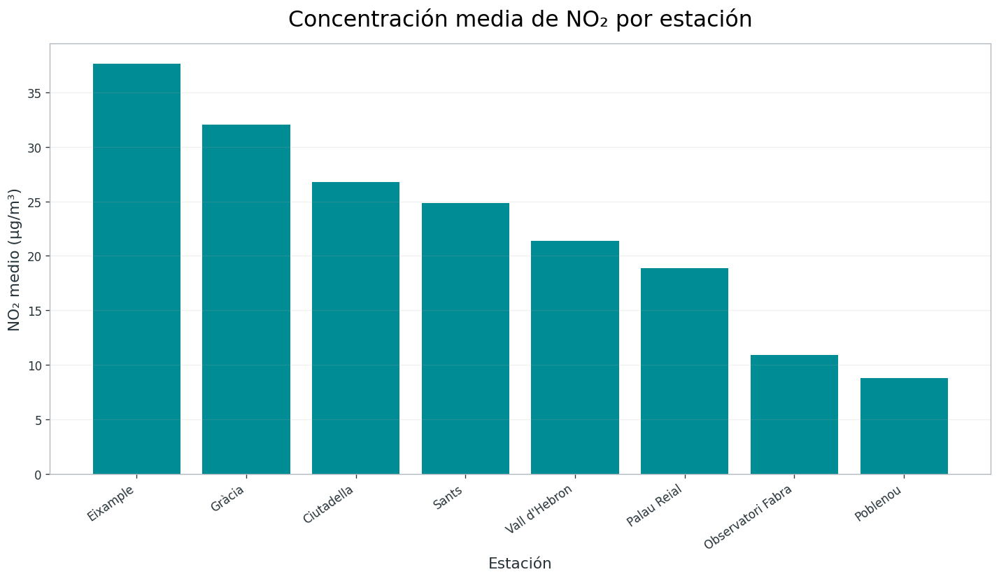

✓ Figura 1 guardada


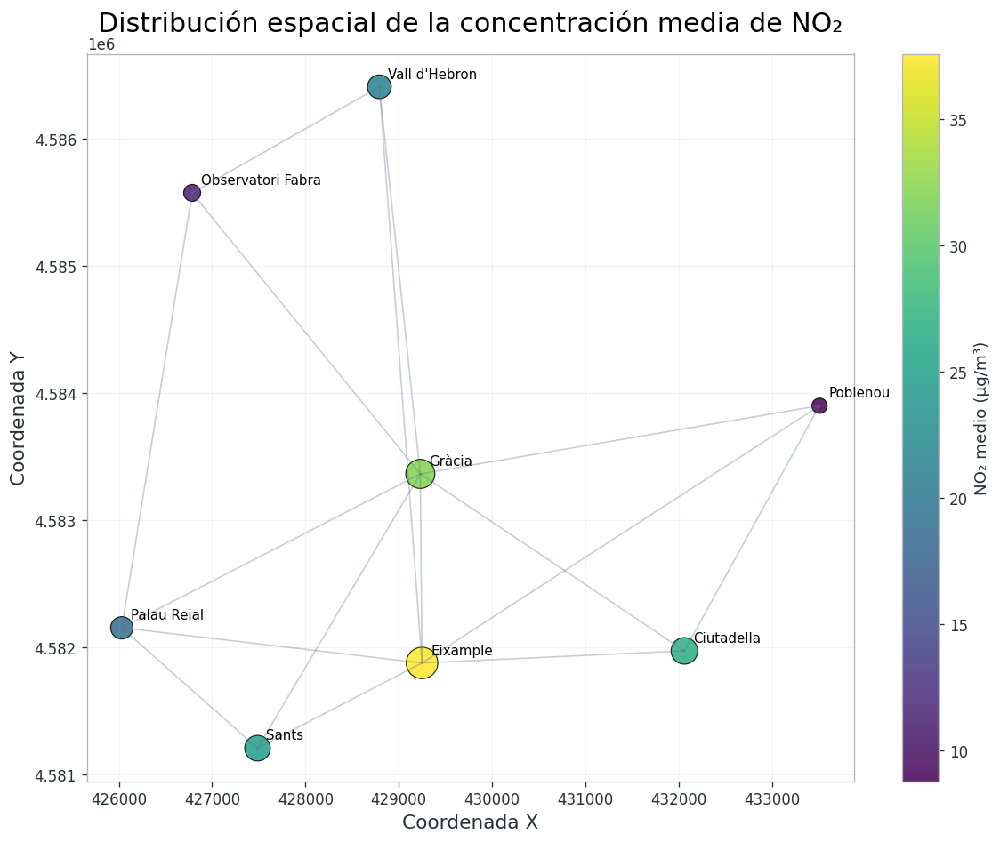

✓ Figura 2 guardada

CELDA 19 · COMPLETADA

✓ Estaciones analizadas : 8
✓ Moran's I             : -0.2339
✓ Moran esperado        : -0.1429
✓ Vecinos utilizados    : 3

✓ Figuras guardadas en:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/ESPACIAL


In [ ]:
# =============================================================================
# CELDA 19 · AUTOCORRELACIÓN ESPACIAL GLOBAL DEL NO₂
# =============================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.neighbors import NearestNeighbors

# -------------------------------------------------------------------------
# 1. CONFIGURACIÓN
# -------------------------------------------------------------------------

COLOR_PRINCIPAL = "#008C95"
COLOR_SECUNDARIO = "#5F7487"
COLOR_ACENTO = "#D47732"
COLOR_VERDE = "#5C8D89"

print("=" * 90)
print("19 · AUTOCORRELACIÓN ESPACIAL GLOBAL DEL NO₂")
print("=" * 90)

# -------------------------------------------------------------------------
# 2. RUTA DATASET
# -------------------------------------------------------------------------

RUTA_DATASET = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

DIR_FIGURAS = (
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/ESPACIAL"
)

os.makedirs(
    DIR_FIGURAS,
    exist_ok=True
)

# -------------------------------------------------------------------------
# 3. CARGA
# -------------------------------------------------------------------------

df = pd.read_csv(
    RUTA_DATASET,
    low_memory=False
)

print(
    f"\n✓ Dataset cargado: {len(df):,} observaciones"
)

# -------------------------------------------------------------------------
# 4. COMPROBAR COORDENADAS DISPONIBLES
# -------------------------------------------------------------------------

posibles_x = [
    "X_ETRS89",
    "x",
    "coord_x",
    "utm_x"
]

posibles_y = [
    "Y_ETRS89",
    "y",
    "coord_y",
    "utm_y"
]

col_x = next(
    (
        c
        for c in posibles_x
        if c in df.columns
    ),
    None
)

col_y = next(
    (
        c
        for c in posibles_y
        if c in df.columns
    ),
    None
)

if col_x is None or col_y is None:

    raise ValueError(
        "No se encontraron coordenadas X/Y adecuadas "
        "para el análisis espacial."
    )

print(
    f"✓ Coordenada X: {col_x}"
)

print(
    f"✓ Coordenada Y: {col_y}"
)

# -------------------------------------------------------------------------
# 5. MEDIA DE NO₂ POR ESTACIÓN
# -------------------------------------------------------------------------

estaciones = (
    df
    .dropna(
        subset=[
            "estacion_geo",
            "NO2_ug_m3",
            col_x,
            col_y
        ]
    )
    .groupby("estacion_geo")
    .agg(
        NO2_media=("NO2_ug_m3", "mean"),
        X=(col_x, "first"),
        Y=(col_y, "first"),
        observaciones=("NO2_ug_m3", "count")
    )
    .reset_index()
)

print("\n" + "-" * 90)
print("NO₂ MEDIO POR ESTACIÓN")
print("-" * 90)

print(
    estaciones
    .round(3)
    .to_string(index=False)
)

print(
    f"\n✓ Estaciones con coordenadas y NO₂ válido: "
    f"{len(estaciones)}"
)

# -------------------------------------------------------------------------
# 6. MATRIZ DE DISTANCIAS
# -------------------------------------------------------------------------

coords = (
    estaciones[
        ["X", "Y"]
    ]
    .to_numpy()
)

n_estaciones = len(
    estaciones
)

if n_estaciones < 4:

    raise ValueError(
        "Número insuficiente de estaciones "
        "para un análisis espacial."
    )

# -------------------------------------------------------------------------
# 7. VECINOS MÁS PRÓXIMOS
# -------------------------------------------------------------------------

#
# Con solo 8 estaciones es preferible utilizar una estructura de vecinos
# basada en k-nearest neighbours para evitar estaciones aisladas.
#
# Se utiliza k=3.
# -------------------------------------------------------------------------

K = min(
    3,
    n_estaciones - 1
)

nn = NearestNeighbors(
    n_neighbors=K + 1,
    metric="euclidean"
)

nn.fit(
    coords
)

distancias, indices = nn.kneighbors(
    coords
)

# -------------------------------------------------------------------------
# 8. MATRIZ DE PESOS ESPACIALES
# -------------------------------------------------------------------------

W = np.zeros(
    (
        n_estaciones,
        n_estaciones
    )
)

for i in range(
    n_estaciones
):

    vecinos = indices[
        i,
        1:
    ]

    for j in vecinos:

        W[
            i,
            j
        ] = 1

# Simetrizar para evitar relaciones dirigidas

W = np.maximum(
    W,
    W.T
)

# Normalización por filas

sumas = W.sum(
    axis=1
)

W_row = np.divide(
    W,
    sumas[:, None],
    out=np.zeros_like(W),
    where=sumas[:, None] != 0
)

print(
    "\n✓ Matriz espacial construida"
)

print(
    "✓ Método: K vecinos más próximos"
)

print(
    f"✓ K utilizado: {K}"
)

# -------------------------------------------------------------------------
# 9. MORAN'S I
# -------------------------------------------------------------------------

y = (
    estaciones[
        "NO2_media"
    ]
    .to_numpy(
        dtype=float
    )
)

y_media = y.mean()

z = y - y_media

S0 = W_row.sum()

numerador = (
    n_estaciones
    / S0
    *
    np.sum(
        W_row
        *
        np.outer(
            z,
            z
        )
    )
)

denominador = np.sum(
    z ** 2
)

moran_I = (
    numerador
    / denominador
)

print("\n" + "=" * 90)
print("MORAN'S I")
print("=" * 90)

print(
    f"✓ Moran's I: {moran_I:.4f}"
)

print(
    f"✓ Número de estaciones: "
    f"{n_estaciones}"
)

# -------------------------------------------------------------------------
# 10. VALOR ESPERADO BAJO ALEATORIEDAD
# -------------------------------------------------------------------------

moran_esperado = (
    -1
    /
    (n_estaciones - 1)
)

print(
    f"✓ Moran's I esperado bajo aleatoriedad: "
    f"{moran_esperado:.4f}"
)

# -------------------------------------------------------------------------
# 11. INTERPRETACIÓN DESCRIPTIVA
# -------------------------------------------------------------------------

if moran_I > 0:

    interpretacion = (
        "autocorrelación espacial positiva: las estaciones próximas "
        "tienden a presentar valores similares"
    )

elif moran_I < 0:

    interpretacion = (
        "autocorrelación espacial negativa: las estaciones próximas "
        "tienden a presentar valores diferentes"
    )

else:

    interpretacion = (
        "ausencia aproximada de autocorrelación espacial"
    )

print(
    f"✓ Interpretación descriptiva: "
    f"{interpretacion}"
)

# -------------------------------------------------------------------------
# 12. FIGURA 1 · NO₂ MEDIO POR ESTACIÓN
# -------------------------------------------------------------------------

orden = (
    estaciones
    .sort_values(
        "NO2_media",
        ascending=False
    )
)

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    orden["estacion_geo"],
    orden["NO2_media"],
    color=COLOR_PRINCIPAL
)

plt.title(
    "Concentración media de NO₂ por estación",
    fontsize=19,
    pad=15
)

plt.ylabel(
    "NO₂ medio (µg/m³)",
    fontsize=13
)

plt.xlabel(
    "Estación",
    fontsize=13
)

plt.xticks(
    rotation=35,
    ha="right"
)

plt.grid(
    axis="y",
    alpha=0.18
)

plt.tight_layout()

plt.savefig(
    f"{DIR_FIGURAS}/19_01_NO2_medio_estaciones.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Figura 1 guardada"
)

# -------------------------------------------------------------------------
# 13. FIGURA 2 · DISPERSIÓN ESPACIAL
# -------------------------------------------------------------------------

plt.figure(
    figsize=(10, 8)
)

scatter = plt.scatter(
    estaciones["X"],
    estaciones["Y"],
    s=estaciones["NO2_media"] * 12,
    c=estaciones["NO2_media"],
    cmap="viridis",
    alpha=0.85,
    edgecolor="black",
    linewidth=0.7
)

for _, fila in estaciones.iterrows():

    plt.annotate(
        fila["estacion_geo"],
        (
            fila["X"],
            fila["Y"]
        ),
        xytext=(6, 6),
        textcoords="offset points",
        fontsize=9
    )

# Dibujar conexiones de vecinos

for i in range(
    n_estaciones
):

    for j in range(
        i + 1,
        n_estaciones
    ):

        if W[
            i,
            j
        ] > 0:

            plt.plot(
                [
                    coords[i, 0],
                    coords[j, 0]
                ],
                [
                    coords[i, 1],
                    coords[j, 1]
                ],
                color=COLOR_SECUNDARIO,
                alpha=0.35,
                linewidth=1
            )

plt.colorbar(
    scatter,
    label="NO₂ medio (µg/m³)"
)

plt.title(
    "Distribución espacial de la concentración media de NO₂",
    fontsize=18,
    pad=15
)

plt.xlabel(
    "Coordenada X",
    fontsize=13
)

plt.ylabel(
    "Coordenada Y",
    fontsize=13
)

plt.grid(
    alpha=0.15
)

plt.tight_layout()

plt.savefig(
    f"{DIR_FIGURAS}/19_02_distribucion_espacial_NO2.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Figura 2 guardada"
)

# -------------------------------------------------------------------------
# 14. GUARDAR RESULTADOS
# -------------------------------------------------------------------------

estaciones.to_csv(
    f"{DIR_FIGURAS}/19_estaciones_NO2_espacial.csv",
    index=False
)

pd.DataFrame({
    "estadistico": [
        "Moran_I",
        "Moran_I_esperado",
        "n_estaciones",
        "K_vecinos"
    ],
    "valor": [
        moran_I,
        moran_esperado,
        n_estaciones,
        K
    ]
}).to_csv(
    f"{DIR_FIGURAS}/19_moran_global.csv",
    index=False
)

# -------------------------------------------------------------------------
# 15. RESUMEN
# -------------------------------------------------------------------------

print("\n" + "=" * 90)
print("CELDA 19 · COMPLETADA")
print("=" * 90)

print(
    f"\n✓ Estaciones analizadas : "
    f"{n_estaciones}"
)

print(
    f"✓ Moran's I             : "
    f"{moran_I:.4f}"
)

print(
    f"✓ Moran esperado        : "
    f"{moran_esperado:.4f}"
)

print(
    f"✓ Vecinos utilizados    : "
    f"{K}"
)

print(
    f"\n✓ Figuras guardadas en:"
    f"\n{DIR_FIGURAS}"
)

## RESULTADOS — CELDA 19 · ANÁLISIS ESPACIAL DE NO₂

### DISTRIBUCIÓN ESPACIAL DEL NO₂

✓ Observaciones analizadas: **14.022**  
✓ Estaciones con coordenadas y NO₂ válido: **8**

| Estación | NO₂ medio (µg/m³) | Observaciones |
|---|---:|---:|
| Eixample | 37,60 | 2.019 |
| Gràcia | 32,03 | 2.026 |
| Ciutadella | 26,77 | 2.050 |
| Sants | 24,87 | 2.063 |
| Vall d'Hebron | 21,35 | 2.015 |
| Palau Reial | 18,84 | 2.003 |
| Observatori Fabra | 10,94 | 28 |
| Poblenou | 8,78 | 1.818 |

La concentración media de NO₂ presenta una **marcada heterogeneidad espacial** entre las estaciones, con los valores más elevados en Eixample y Gràcia y los más bajos en Poblenou y Observatori Fabra.

---

### AUTOCORRELACIÓN ESPACIAL GLOBAL

✓ Método de vecindad: **K vecinos más próximos**  
✓ Número de vecinos: **K = 3**  
✓ Estaciones analizadas: **8**

**Índice de Moran:**

> **I = −0,2339**

**Valor esperado bajo aleatoriedad:**

> **I esperado = −0,1429**

El índice de Moran obtenido es inferior al valor esperado bajo aleatoriedad, indicando una **tendencia exploratoria hacia la disimilitud espacial**: las estaciones próximas tienden a presentar valores de NO₂ diferentes en lugar de formar agrupamientos homogéneos de valores altos o bajos.

Dado el reducido número de estaciones disponibles, este resultado se interpreta como **evidencia exploratoria de estructura espacial**, sin considerarlo una prueba estadística concluyente.

---

### PRINCIPALES RESULTADOS

- Existe una **importante heterogeneidad espacial** de las concentraciones medias de NO₂.
- **Eixample (37,60 µg/m³)** presenta la concentración media más elevada.
- **Poblenou (8,78 µg/m³)** presenta la concentración media más baja.
- El índice global de Moran presenta **I = −0,2339**, frente a un valor esperado de **−0,1429**.
- El resultado apunta a una **tendencia de disimilitud espacial** entre estaciones próximas.
- La localización espacial constituye, por tanto, una dimensión relevante para la posterior modelización.

✓ **ANÁLISIS ESPACIAL EXPLORATORIO COMPLETADO**

✓ Figuras guardadas en:

`/content/gdrive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/ESPACIAL`

# 20 · FEATURE ENGINEERING TEMPORAL Y AUDITORÍA DE LEAKAGE

## Objetivo

Incorporar información temporal e histórica de NO₂ al conjunto de datos,
manteniendo estrictamente la disponibilidad de la información en el momento
de realizar la predicción.

Las nuevas variables se construyen utilizando exclusivamente información
disponible hasta el día anterior.

---

## VARIABLES TEMPORALES

Se incorporan:

- año;
- mes;
- día de la semana;
- día del mes;
- semana del año;
- trimestre;
- estación del año;
- tendencia temporal;
- codificación cíclica del mes;
- codificación cíclica del día de la semana;
- indicador de fin de semana;
- indicadores estacionales.

---

## INFORMACIÓN HISTÓRICA DE NO₂

Se incorporan retardos de:

- 1 día;
- 2 días;
- 3 días;
- 7 días;
- 14 días.

También se calculan medias móviles retardadas de:

- 3 días;
- 7 días;
- 14 días.

Todas estas variables se calculan por estación y utilizando `shift(1)` antes
del cálculo de las ventanas móviles.

Por tanto, el valor de NO₂ correspondiente al propio día objetivo no participa
en estas variables.

---

## VARIABLES EXCLUIDAS

No se incorporan diferencias calculadas utilizando el NO₂ contemporáneo:

- `NO2_delta_1d`
- `NO2_delta_7d`

Estas variables utilizan el valor de NO₂ del día objetivo y podrían introducir
información directamente relacionada con la variable objetivo.

---

## AUDITORÍA DE LEAKAGE

Antes de continuar con la modelización se realizan comprobaciones específicas:

1. correlación entre las nuevas variables temporales y el target;
2. distribución de los retardos por clase;
3. capacidad predictiva de `NO2_lag_1` de forma aislada;
4. capacidad predictiva conjunta de las variables temporales;
5. coincidencia entre las clases obtenidas a partir de los retardos y el target;
6. comprobación de los valores ausentes generados por los retardos.

El objetivo es detectar cualquier variable que pueda reconstruir directamente
la variable objetivo.

---

## CRITERIO METODOLÓGICO

Los retardos de NO₂ se consideran variables predictoras históricas válidas
si utilizan exclusivamente información anterior al día objetivo.

La variable `NO2_ug_m3` contemporánea y cualquier variable derivada directamente
de ella en el mismo día permanecen excluidas del conjunto de predictores.

---

## RESULTADO ESPERADO

Obtener un dataset temporal enriquecido y auditado, preparado para la fase de
selección de variables y modelización.

✓ Feature engineering temporal  
✓ Retardos históricos  
✓ Medias móviles retardadas  
✓ Variables cíclicas  
✓ Control explícito de leakage  
✓ Dataset preparado para modelización

In [ ]:
# ============================================================
# CELDA 20 — FEATURE ENGINEERING TEMPORAL + AUDITORÍA LEAKAGE
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

RUTA_ENTRADA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_objetivo_NO2.csv"
)

RUTA_SALIDA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_feature_engineering.csv"
)

print("=" * 78)
print("20 · FEATURE ENGINEERING TEMPORAL + AUDITORÍA DE LEAKAGE")
print("=" * 78)

# ============================================================
# 2. CARGA
# ============================================================

df = pd.read_csv(
    RUTA_ENTRADA,
    low_memory=False
)

df["fecha"] = pd.to_datetime(
    df["fecha"],
    errors="coerce"
)

print(
    f"\n✓ Dataset cargado: {len(df):,} observaciones"
)

print(
    f"✓ Columnas iniciales: {len(df.columns)}"
)

# ============================================================
# 3. VALIDACIONES PREVIAS
# ============================================================

columnas_obligatorias = [
    "fecha",
    "estacion_geo",
    "NO2_ug_m3",
    "target"
]

faltantes = [
    c
    for c in columnas_obligatorias
    if c not in df.columns
]

if faltantes:

    raise ValueError(
        f"Faltan columnas obligatorias: {faltantes}"
    )

if df["fecha"].isna().any():

    raise ValueError(
        "Existen fechas no válidas."
    )

# ============================================================
# 4. ORDEN TEMPORAL POR ESTACIÓN
# ============================================================

df = (
    df
    .sort_values(
        ["estacion_geo", "fecha"]
    )
    .reset_index(drop=True)
)

print(
    "✓ Dataset ordenado temporalmente por estación"
)

# ============================================================
# 5. VARIABLES TEMPORALES BÁSICAS
# ============================================================

df["anio"] = df["fecha"].dt.year
df["mes"] = df["fecha"].dt.month
df["dia_semana"] = df["fecha"].dt.dayofweek
df["dia_mes"] = df["fecha"].dt.day

df["semana_anio"] = (
    df["fecha"]
    .dt.isocalendar()
    .week
    .astype(int)
)

df["trimestre"] = df["fecha"].dt.quarter

df["dias_desde_inicio"] = (
    df["fecha"] - df["fecha"].min()
).dt.days

# ============================================================
# 6. ESTACIÓN DEL AÑO
# ============================================================

df["estacion_anio"] = df["mes"].map({
    12: "Invierno",
    1: "Invierno",
    2: "Invierno",
    3: "Primavera",
    4: "Primavera",
    5: "Primavera",
    6: "Verano",
    7: "Verano",
    8: "Verano",
    9: "Otoño",
    10: "Otoño",
    11: "Otoño"
})

df["estacion_anio_code"] = df["mes"].map({
    12: 0,
    1: 0,
    2: 0,
    3: 1,
    4: 1,
    5: 1,
    6: 2,
    7: 2,
    8: 2,
    9: 3,
    10: 3,
    11: 3
})

print(
    "✓ Variables temporales creadas"
)

# ============================================================
# 7. VARIABLES CÍCLICAS
# ============================================================

df["mes_sin"] = np.sin(
    2 * np.pi * df["mes"] / 12
)

df["mes_cos"] = np.cos(
    2 * np.pi * df["mes"] / 12
)

df["dia_semana_sin"] = np.sin(
    2 * np.pi * df["dia_semana"] / 7
)

df["dia_semana_cos"] = np.cos(
    2 * np.pi * df["dia_semana"] / 7
)

print(
    "✓ Variables cíclicas creadas"
)

# ============================================================
# 8. INDICADORES TEMPORALES
# ============================================================

df["es_fin_semana"] = (
    df["dia_semana"] >= 5
).astype(int)

df["es_invierno"] = (
    df["estacion_anio_code"] == 0
).astype(int)

df["es_verano"] = (
    df["estacion_anio_code"] == 2
).astype(int)

print(
    "✓ Indicadores temporales creados"
)

# ============================================================
# 9. RETARDOS DE NO₂
# ============================================================

lags = [
    1,
    2,
    3,
    7,
    14
]

for lag in lags:

    df[f"NO2_lag_{lag}"] = (
        df
        .groupby("estacion_geo")["NO2_ug_m3"]
        .shift(lag)
    )

print(
    "✓ Retardos temporales creados:"
)

print(
    [
        f"NO2_lag_{lag}"
        for lag in lags
    ]
)

# ============================================================
# 10. MEDIAS MÓVILES RETARDADAS
# ============================================================

ventanas = [
    3,
    7,
    14
]

for ventana in ventanas:

    df[f"NO2_rolling_{ventana}d"] = (
        df
        .groupby("estacion_geo")["NO2_ug_m3"]
        .transform(
            lambda x:
            x
            .shift(1)
            .rolling(
                window=ventana,
                min_periods=1
            )
            .mean()
        )
    )

print(
    "✓ Medias móviles retardadas creadas:"
)

print(
    [
        f"NO2_rolling_{v}d"
        for v in ventanas
    ]
)

# ============================================================
# 11. NO CREAR DELTAS CONTEMPORÁNEAS
# ============================================================

variables_excluidas_leakage = [
    "NO2_delta_1d",
    "NO2_delta_7d"
]

print(
    "\n✓ Variables excluidas por riesgo de leakage:"
)

for col in variables_excluidas_leakage:

    print(
        f"   - {col}"
    )

# ============================================================
# 12. LISTA DE VARIABLES TEMPORALES
# ============================================================

variables_temporales = [
    "anio",
    "mes",
    "dia_semana",
    "dia_mes",
    "semana_anio",
    "trimestre",
    "dias_desde_inicio",
    "estacion_anio_code",
    "mes_sin",
    "mes_cos",
    "dia_semana_sin",
    "dia_semana_cos",
    "es_fin_semana",
    "es_invierno",
    "es_verano",
    "NO2_lag_1",
    "NO2_lag_2",
    "NO2_lag_3",
    "NO2_lag_7",
    "NO2_lag_14",
    "NO2_rolling_3d",
    "NO2_rolling_7d",
    "NO2_rolling_14d"
]

print(
    f"\n✓ Variables temporales para modelización: "
    f"{len(variables_temporales)}"
)

# ============================================================
# 13. TEST 1 — CORRELACIÓN CON TARGET
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 1 · CORRELACIÓN DE VARIABLES TEMPORALES CON TARGET"
)

print(
    "=" * 78
)

resultados_corr = []

for col in variables_temporales:

    if col not in df.columns:
        continue

    if not pd.api.types.is_numeric_dtype(
        df[col]
    ):
        continue

    tmp = df[
        [col, "target"]
    ].dropna()

    if len(tmp) < 10:
        continue

    corr = tmp[col].corr(
        tmp["target"]
    )

    resultados_corr.append({
        "variable": col,
        "correlacion": corr,
        "abs_correlacion": abs(corr)
    })

corr_df = (
    pd.DataFrame(
        resultados_corr
    )
    .sort_values(
        "abs_correlacion",
        ascending=False
    )
)

print(
    corr_df.to_string(
        index=False
    )
)

# ============================================================
# 14. TEST 2 — RETARDOS POR CLASE
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 2 · DISTRIBUCIÓN DE LOS RETARDOS POR CLASE"
)

print(
    "=" * 78
)

for col in [
    "NO2_lag_1",
    "NO2_lag_2",
    "NO2_lag_3",
    "NO2_lag_7",
    "NO2_lag_14"
]:

    tabla = (
        df
        .groupby("target")[col]
        .agg(
            [
                "count",
                "mean",
                "median",
                "min",
                "max"
            ]
        )
    )

    print(
        f"\n{col}"
    )

    print(
        tabla
        .round(3)
        .to_string()
    )

# ============================================================
# 15. TEST 3 — LAG 1 AISLADO
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 3 · CAPACIDAD PREDICTIVA DE NO2_LAG_1"
)

print(
    "=" * 78
)

tmp = df[
    [
        "NO2_lag_1",
        "target"
    ]
].dropna()

modelo_lag1 = Pipeline([
    (
        "imputer",
        SimpleImputer(
            strategy="median"
        )
    ),
    (
        "tree",
        DecisionTreeClassifier(
            max_depth=3,
            random_state=42
        )
    )
])

modelo_lag1.fit(
    tmp[
        ["NO2_lag_1"]
    ],
    tmp["target"]
)

pred_lag1 = modelo_lag1.predict(
    tmp[
        ["NO2_lag_1"]
    ]
)

acc_lag1 = accuracy_score(
    tmp["target"],
    pred_lag1
)

print(
    f"✓ Accuracy diagnóstico usando SOLO NO2_lag_1: "
    f"{acc_lag1:.4f}"
)

# ============================================================
# 16. TEST 4 — BLOQUE TEMPORAL
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 4 · CAPACIDAD PREDICTIVA DEL BLOQUE TEMPORAL"
)

print(
    "=" * 78
)

features_temporales_numericas = [
    c
    for c in variables_temporales
    if pd.api.types.is_numeric_dtype(
        df[c]
    )
]

X_diag = df[
    features_temporales_numericas
].copy()

y_diag = df[
    "target"
].copy()

modelo_temporal = Pipeline([
    (
        "imputer",
        SimpleImputer(
            strategy="median"
        )
    ),
    (
        "tree",
        DecisionTreeClassifier(
            max_depth=5,
            random_state=42
        )
    )
])

modelo_temporal.fit(
    X_diag,
    y_diag
)

pred_temporal = modelo_temporal.predict(
    X_diag
)

acc_temporal = accuracy_score(
    y_diag,
    pred_temporal
)

print(
    f"✓ Accuracy diagnóstico bloque temporal: "
    f"{acc_temporal:.4f}"
)

print(
    "⚠ Esta métrica es únicamente diagnóstica "
    "y se calcula sobre las mismas observaciones."
)

# ============================================================
# 17. TEST 5 — COINCIDENCIA DE LAGS CON LOS UMBRALES
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 5 · COINCIDENCIA ENTRE LAGS Y CLASE DEL TARGET"
)

print(
    "=" * 78
)

for lag in [
    "NO2_lag_1",
    "NO2_lag_2",
    "NO2_lag_3",
    "NO2_lag_7",
    "NO2_lag_14"
]:

    tmp = df[
        [
            lag,
            "target"
        ]
    ].dropna()

    clase_lag = pd.cut(
        tmp[lag],
        bins=[
            -np.inf,
            25,
            60,
            np.inf
        ],
        labels=[
            0,
            1,
            2
        ],
        right=True
    )

    coincidencia = (
        clase_lag.to_numpy()
        ==
        tmp["target"].to_numpy()
    ).mean()

    print(
        f"{lag:<18}"
        f"{coincidencia * 100:6.2f} %"
    )

# ============================================================
# 18. TEST 6 — VALORES AUSENTES
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "TEST 6 · VALORES AUSENTES GENERADOS POR LOS LAGS"
)

print(
    "=" * 78
)

for col in [
    "NO2_lag_1",
    "NO2_lag_2",
    "NO2_lag_3",
    "NO2_lag_7",
    "NO2_lag_14",
    "NO2_rolling_3d",
    "NO2_rolling_7d",
    "NO2_rolling_14d"
]:

    n_nan = df[
        col
    ].isna().sum()

    pct_nan = (
        n_nan
        / len(df)
        * 100
    )

    print(
        f"{col:<22}"
        f"{n_nan:>6} "
        f"({pct_nan:5.2f} %)"
    )

# ============================================================
# 19. TEST 7 — CONTROL DE DUPLICADOS
# ============================================================

duplicados = df.duplicated(
    subset=[
        "fecha",
        "estacion_geo"
    ]
).sum()

print(
    "\n" + "=" * 78
)

print(
    "TEST 7 · DUPLICADOS FECHA + ESTACIÓN"
)

print(
    "=" * 78
)

print(
    f"✓ Duplicados: {duplicados}"
)

if duplicados > 0:

    raise ValueError(
        "Se han detectado duplicados fecha + estación."
    )

# ============================================================
# 20. TEST 8 — CONTROL DEL ORDEN TEMPORAL
# ============================================================

orden_correcto = True

for estacion, grupo in df.groupby(
    "estacion_geo"
):

    if not grupo[
        "fecha"
    ].is_monotonic_increasing:

        orden_correcto = False

        print(
            f"⚠ Orden temporal incorrecto: "
            f"{estacion}"
        )

if not orden_correcto:

    raise ValueError(
        "El orden temporal no es correcto."
    )

print(
    "✓ Orden temporal correcto en todas las estaciones"
)

# ============================================================
# 21. CONTROL ESPECÍFICO DE LEAKAGE
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "CONTROL ESPECÍFICO DE LEAKAGE"
)

print(
    "=" * 78
)

columnas_no_permitidas = [
    "NO2_delta_1d",
    "NO2_delta_7d"
]

presentes = [
    c
    for c in columnas_no_permitidas
    if c in df.columns
]

if presentes:

    raise ValueError(
        f"Variables de leakage presentes: {presentes}"
    )

print(
    "✓ No existen variables delta contemporáneas"
)

print(
    "✓ NO2_ug_m3 se conserva únicamente como "
    "variable de referencia/objetivo"
)

# ============================================================
# 22. GUARDADO
# ============================================================

df.to_csv(
    RUTA_SALIDA,
    index=False
)

# ============================================================
# 23. RESUMEN FINAL
# ============================================================

print(
    "\n" + "=" * 78
)

print(
    "FEATURE ENGINEERING TEMPORAL — RESUMEN"
)

print(
    "=" * 78
)

print(
    f"✓ Observaciones: {len(df):,}"
)

print(
    f"✓ Columnas finales: {len(df.columns)}"
)

print(
    f"✓ Variables temporales añadidas: "
    f"{len(variables_temporales)}"
)

print(
    "✓ Retardos: 1, 2, 3, 7 y 14 días"
)

print(
    "✓ Medias móviles retardadas: 3, 7 y 14 días"
)

print(
    "✓ Codificación cíclica temporal"
)

print(
    "✓ Indicadores estacionales"
)

print(
    "✓ Variables delta contemporáneas excluidas"
)

print(
    f"\n✓ Dataset guardado en:\n{RUTA_SALIDA}"
)

print(
    "\n" + "=" * 78
)

print(
    "✓ CELDA 20 COMPLETADA"
)

print(
    "=" * 78
)

20 · FEATURE ENGINEERING TEMPORAL + AUDITORÍA DE LEAKAGE

✓ Dataset cargado: 14,022 observaciones
✓ Columnas iniciales: 81
✓ Dataset ordenado temporalmente por estación
✓ Variables temporales creadas
✓ Variables cíclicas creadas
✓ Indicadores temporales creados
✓ Retardos temporales creados:
['NO2_lag_1', 'NO2_lag_2', 'NO2_lag_3', 'NO2_lag_7', 'NO2_lag_14']
✓ Medias móviles retardadas creadas:
['NO2_rolling_3d', 'NO2_rolling_7d', 'NO2_rolling_14d']

✓ Variables excluidas por riesgo de leakage:
   - NO2_delta_1d
   - NO2_delta_7d

✓ Variables temporales para modelización: 23

TEST 1 · CORRELACIÓN DE VARIABLES TEMPORALES CON TARGET
          variable  correlacion  abs_correlacion
         NO2_lag_1     0.635037         0.635037
    NO2_rolling_3d     0.602137         0.602137
    NO2_rolling_7d     0.598922         0.598922
   NO2_rolling_14d     0.595856         0.595856
         NO2_lag_2     0.507110         0.507110
         NO2_lag_7     0.474041         0.474041
         NO2_lag_3 

### RESULTADOS FEATURE ENGINEERING TEMPORAL Y AUDITORÍA DE LEAKAGE

## FEATURE ENGINEERING TEMPORAL

Se incorporaron **23 variables temporales** al dataset de 14.022 observaciones.

El conjunto incluye variables de calendario, codificación cíclica, indicadores
estacionales y variables históricas de NO₂.

### Variables históricas de NO₂

Se incorporaron retardos de:

- 1 día
- 2 días
- 3 días
- 7 días
- 14 días

Además, se calcularon medias móviles retardadas de:

- 3 días
- 7 días
- 14 días

Todas las variables históricas se calcularon por estación y utilizando
información previa al día objetivo.

---

## CONTROL DE LEAKAGE

Se excluyeron explícitamente las variables:

- `NO2_delta_1d`
- `NO2_delta_7d`

Estas variables utilizan el valor contemporáneo de NO₂ y, por tanto, presentan
riesgo de introducir información directamente relacionada con el objetivo.

✓ No existen variables delta contemporáneas en el dataset final.

✓ `NO2_ug_m3` se mantiene únicamente como variable de referencia y para la
definición del objetivo, no como predictor contemporáneo.

---

## CORRELACIÓN CON EL TARGET

Las variables con mayor asociación con el objetivo fueron las relacionadas con
la evolución histórica del NO₂:

| Variable | Correlación |
|---|---:|
| `NO2_lag_1` | **0,635** |
| `NO2_rolling_3d` | **0,602** |
| `NO2_rolling_7d` | **0,599** |
| `NO2_rolling_14d` | **0,596** |
| `NO2_lag_2` | **0,507** |
| `NO2_lag_7` | **0,474** |
| `NO2_lag_3` | **0,468** |
| `NO2_lag_14` | **0,446** |

La elevada asociación de `NO2_lag_1` es consistente con la persistencia
temporal observada anteriormente en la concentración de NO₂.

Las variables puramente temporales presentan asociaciones considerablemente
menores, destacando `es_invierno` (0,184), `mes_cos` (0,175) y
`es_fin_semana` (-0,170).

---

## COMPORTAMIENTO DE LOS RETARDOS POR CLASE

El valor medio de NO₂ del día anterior aumenta progresivamente entre las
categorías del objetivo:

| Clase | Media `NO2_lag_1` | Mediana |
|---|---:|---:|
| Buena | 17,07 | 15,44 |
| Media | 33,84 | 32,54 |
| Mala | 52,91 | 52,92 |

El mismo patrón se mantiene para los retardos de 2, 3, 7 y 14 días.

Esto confirma que las condiciones de contaminación presentan una elevada
persistencia temporal y que la información histórica aporta capacidad
predictiva relevante.

---

## TEST DIAGNÓSTICO · `NO2_lag_1`

Un árbol de decisión utilizando exclusivamente `NO2_lag_1` obtuvo:

**Accuracy = 0,7694**

Este resultado demuestra que el retardo de un día contiene una señal
predictiva importante, pero **no permite reconstruir perfectamente el target**.

Por tanto, el resultado no constituye evidencia de leakage por sí mismo.

---

## TEST DIAGNÓSTICO · BLOQUE TEMPORAL

El conjunto completo de variables temporales obtuvo:

**Accuracy diagnóstica = 0,8010**

Esta prueba se realizó sobre las mismas observaciones utilizadas para ajustar el
árbol y, por tanto, tiene carácter exclusivamente diagnóstico.

El resultado confirma que la información temporal contiene una señal importante
sobre la calidad del aire, pero no demuestra capacidad de generalización.

La evaluación definitiva se realizará posteriormente mediante la división
temporal TRAIN/TEST.

---

## COINCIDENCIA ENTRE LOS RETARDOS Y LAS CATEGORÍAS DEL TARGET

Al aplicar los mismos umbrales utilizados para definir las categorías de NO₂
sobre los valores históricos se obtuvo:

| Variable | Coincidencia con target |
|---|---:|
| `NO2_lag_1` | **76,16 %** |
| `NO2_lag_2` | 69,79 % |
| `NO2_lag_3` | 68,35 % |
| `NO2_lag_7` | 68,87 % |
| `NO2_lag_14` | 67,82 % |

El `lag_1` presenta la mayor coincidencia, pero se mantiene muy por debajo del
100 %. Por tanto, los retardos no constituyen una codificación directa del
objetivo.

---

## VALORES AUSENTES GENERADOS

Los retardos generan un número reducido de valores ausentes:

| Variable | NaN | % |
|---|---:|---:|
| `NO2_lag_1` | 8 | 0,06 % |
| `NO2_lag_2` | 16 | 0,11 % |
| `NO2_lag_3` | 24 | 0,17 % |
| `NO2_lag_7` | 56 | 0,40 % |
| `NO2_lag_14` | 112 | 0,80 % |
| `NO2_rolling_3d` | 8 | 0,06 % |
| `NO2_rolling_7d` | 8 | 0,06 % |
| `NO2_rolling_14d` | 8 | 0,06 % |

La pérdida de información asociada a los retardos es, por tanto, muy reducida
y podrá gestionarse posteriormente dentro del pipeline de modelización.

---

## CONTROLES DE INTEGRIDAD

✓ Observaciones: **14.022**

✓ Columnas finales: **103**

✓ Variables temporales añadidas: **23**

✓ Duplicados `fecha + estación`: **0**

✓ Orden temporal correcto en todas las estaciones

✓ Variables delta contemporáneas excluidas

---

## CONCLUSIÓN

El feature engineering temporal queda validado para la siguiente fase.

Los resultados muestran una **fuerte persistencia temporal del NO₂**, especialmente
a un día de distancia, pero las variables históricas no reconstruyen
perfectamente el objetivo.

En consecuencia, los retardos y medias móviles pueden mantenerse como
predictores históricos dentro del modelo, siempre que el entrenamiento y la
evaluación respeten la separación temporal.

La auditoría realizada en esta etapa no muestra evidencia de leakage directo
en las variables temporales incorporadas.

✓ **FEATURE ENGINEERING TEMPORAL VALIDADO**

✓ **LEAKAGE CONTEMPORÁNEO CONTROLADO**

✓ **DATASET PREPARADO PARA LA FASE DE MODELIZACIÓN**

# 21 · INVENTARIO Y DEFINICIÓN DE FEATURES CANDIDATAS

## Objetivo

Construir un inventario sistemático de las variables disponibles tras el
feature engineering temporal y definir el conjunto inicial de variables
candidatas para la modelización de la calidad del aire.

En esta etapa se realizará una auditoría de:

- estructura y dimensiones del dataset;
- variable objetivo;
- variables numéricas y categóricas;
- variables temporales;
- variables históricas de NO₂;
- cobertura de las variables;
- valores ausentes;
- duplicidades;
- posibles variables relacionadas directamente con el objetivo;
- posibles fuentes de leakage.

## Definición del conjunto candidato

Se identificarán las variables potencialmente utilizables como predictores,
manteniendo separadas:

- variables ambientales;
- variables meteorológicas;
- variables de tráfico;
- variables espaciales;
- variables temporales;
- variables históricas de NO₂;
- variables categóricas.

Las variables directamente utilizadas para definir el objetivo o que puedan
introducir información del futuro se excluirán del conjunto de predictores.

## Variables temporales e históricas

Se conservarán como candidatas las variables temporales derivadas y los
retardos históricos de NO₂ cuando representen información disponible antes del
instante de predicción.

Entre ellas se considerarán retardos y estadísticas móviles como:

- `NO2_lag_1`
- `NO2_lag_2`
- `NO2_lag_3`
- `NO2_lag_7`
- `NO2_lag_14`
- `NO2_rolling_3d`
- `NO2_rolling_7d`
- `NO2_rolling_14d`

Estas variables serán posteriormente auditadas para garantizar que no
introducen leakage temporal.

## Control de cobertura

Se analizará la disponibilidad de cada variable y el porcentaje de valores
válidos.

Las variables con cobertura insuficiente serán identificadas para decidir
posteriormente si deben eliminarse, imputarse o tratarse específicamente.

## Control de integridad

Se comprobará:

- ausencia de duplicidades;
- existencia de valores nulos en el target;
- orden cronológico;
- coherencia dimensional;
- ausencia de variables de objetivo o leakage entre las features candidatas.

## Resultado esperado

La etapa debe proporcionar:

1. un inventario completo de las variables disponibles;
2. una clasificación por tipo de variable;
3. un conjunto inicial de features candidatas;
4. una identificación explícita de variables a excluir;
5. información de cobertura y valores ausentes;
6. una base reproducible para la posterior depuración y selección de
   variables.

# ✓ INVENTARIO Y AUDITORÍA DE FEATURES INICIADOS

In [ ]:
# ============================================================
# CELDA 21 — INVENTARIO Y DEFINICIÓN DE FEATURES CANDIDATAS
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

RUTA_ENTRADA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_feature_engineering.csv"
)

RUTA_SALIDA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_modelado_candidato.csv"
)

RUTA_INVENTARIO = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/inventario_features_celda21.csv"
)

print("=" * 78)
print("21 · INVENTARIO Y DEFINICIÓN DE FEATURES CANDIDATAS")
print("=" * 78)

# ============================================================
# 2. CARGA
# ============================================================

df = pd.read_csv(
    RUTA_ENTRADA,
    low_memory=False
)

df["fecha"] = pd.to_datetime(
    df["fecha"],
    errors="coerce"
)

print(
    f"\n✓ Observaciones cargadas: {len(df):,}"
)

print(
    f"✓ Columnas cargadas: {len(df.columns)}"
)

# ============================================================
# 3. ORDEN CRONOLÓGICO
# ============================================================

df = (
    df
    .sort_values(
        ["fecha", "estacion_geo"]
    )
    .reset_index(drop=True)
)

print(
    "✓ Dataset ordenado cronológicamente"
)

# ============================================================
# 4. COMPROBACIÓN DE VARIABLES OBJETIVO
# ============================================================

objetivo = "target"

variables_objetivo = [
    "target",
    "clase_NO2_3",
    "NO2_ug_m3"
]

print("\n" + "=" * 78)
print("VARIABLES OBJETIVO / LEAKAGE")
print("=" * 78)

for col in variables_objetivo:

    if col in df.columns:
        print(f"✓ {col} → presente")

    else:
        print(f"⚠ {col} → no presente")

if objetivo not in df.columns:

    raise ValueError(
        "No se encuentra la variable target."
    )

print(
    "\n✓ Target válido:",
    df[objetivo].notna().sum()
)

print(
    "✓ Target nulo:",
    df[objetivo].isna().sum()
)

# ============================================================
# 5. VARIABLES EXCLUIDAS
# ============================================================

variables_excluidas = [
    "target",
    "clase_NO2_3",
    "NO2_ug_m3",
    "NO2_delta_1d",
    "NO2_delta_7d"
]

# Identificadores administrativos redundantes

identificadores_redundantes = [
    "codi_estacio",
    "nom_cabina",
    "codi_estacio_str"
]

# Variable de comprobación del objetivo

variables_comprobacion = [
    "clase_comprobacion"
]

# ============================================================
# 6. COMPROBAR QUE NO HAY LEAKAGE
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE LEAKAGE")
print("=" * 78)

leakage_presentes = [
    c
    for c in variables_excluidas
    if c in df.columns
]

for col in leakage_presentes:

    print(
        f"- {col}"
    )

print(
    f"\n✓ Variables objetivo/leakage excluidas: "
    f"{len(leakage_presentes)}"
)

# ============================================================
# 7. VARIABLES CANDIDATAS
# ============================================================

variables_excluir_total = (
    set(variables_excluidas)
    | set(identificadores_redundantes)
    | set(variables_comprobacion)
)

features_candidatas = [
    c
    for c in df.columns
    if c not in variables_excluir_total
]

print("\n" + "=" * 78)
print("FEATURES CANDIDATAS")
print("=" * 78)

print(
    f"✓ Variables candidatas iniciales: "
    f"{len(features_candidatas)}"
)

# ============================================================
# 8. TIPOS DE VARIABLES
# ============================================================

features_df = df[
    features_candidatas
]

variables_numericas = (
    features_df
    .select_dtypes(
        include=np.number
    )
    .columns
    .tolist()
)

variables_categoricas = (
    features_df
    .select_dtypes(
        exclude=np.number
    )
    .columns
    .tolist()
)

print(
    f"\n✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

print("\nVariables categóricas:")

for col in variables_categoricas:

    print(
        f"- {col}: "
        f"{df[col].nunique(dropna=True)} categorías"
    )

# ============================================================
# 9. VARIABLES TEMPORALES
# ============================================================

variables_temporales = [
    c
    for c in features_candidatas
    if (
        c.startswith("NO2_lag_")
        or c.startswith("NO2_rolling_")
        or c in [
            "anio",
            "mes",
            "dia_semana",
            "dia_mes",
            "semana_anio",
            "trimestre",
            "dias_desde_inicio",
            "estacion_anio",
            "estacion_anio_code",
            "mes_sin",
            "mes_cos",
            "dia_semana_sin",
            "dia_semana_cos",
            "es_fin_semana",
            "es_invierno",
            "es_verano"
        ]
    )
]

print("\n" + "=" * 78)
print("VARIABLES TEMPORALES")
print("=" * 78)

print(
    f"✓ Variables temporales candidatas: "
    f"{len(variables_temporales)}"
)

for col in variables_temporales:

    print(
        f"- {col}"
    )

# ============================================================
# 10. VARIABLES RELACIONADAS CON NO₂
# ============================================================

print("\n" + "=" * 78)
print("VARIABLES RELACIONADAS CON NO₂")
print("=" * 78)

variables_no2 = [
    c
    for c in features_candidatas
    if "no2" in c.lower()
]

for col in variables_no2:

    print(
        f"- {col}"
    )

# ============================================================
# 11. VALORES AUSENTES
# ============================================================

print("\n" + "=" * 78)
print("VALORES AUSENTES")
print("=" * 78)

nan_resumen = (
    df[
        features_candidatas
    ]
    .isna()
    .sum()
    .sort_values(
        ascending=False
    )
)

nan_resumen = nan_resumen[
    nan_resumen > 0
]

print(
    f"✓ Variables con valores ausentes: "
    f"{len(nan_resumen)}"
)

if len(nan_resumen) > 0:

    tabla_nan = pd.DataFrame({
        "variable": nan_resumen.index,
        "n_nan": nan_resumen.values,
        "pct_nan": (
            nan_resumen.values
            / len(df)
            * 100
        )
    })

    print(
        tabla_nan.to_string(
            index=False
        )
    )

else:

    print(
        "✓ No existen valores ausentes"
    )

# ============================================================
# 12. VARIABLES CON COBERTURA MUY BAJA
# ============================================================

print("\n" + "=" * 78)
print("COBERTURA DE VARIABLES")
print("=" * 78)

cobertura = (
    df[
        features_candidatas
    ]
    .notna()
    .mean()
    .mul(100)
    .sort_values()
)

print(
    cobertura.head(20).to_string()
)

# ============================================================
# 13. CARDINALIDAD CATEGÓRICA
# ============================================================

print("\n" + "=" * 78)
print("CARDINALIDAD DE VARIABLES CATEGÓRICAS")
print("=" * 78)

for col in variables_categoricas:

    print(
        f"\n{col}"
    )

    print(
        df[col]
        .value_counts(
            dropna=False
        )
        .head(15)
        .to_string()
    )

# ============================================================
# 14. TARGET
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

target_dist = (
    df["target"]
    .value_counts()
    .sort_index()
)

target_pct = (
    df["target"]
    .value_counts(
        normalize=True
    )
    .sort_index()
    .mul(100)
)

target_tabla = pd.DataFrame({
    "observaciones": target_dist,
    "porcentaje": target_pct.round(2)
})

print(
    target_tabla.to_string()
)

# ============================================================
# 15. DUPLICADOS
# ============================================================

duplicados = df.duplicated(
    subset=[
        "fecha",
        "estacion_geo"
    ]
).sum()

print("\n" + "=" * 78)
print("CONTROL DE DUPLICADOS")
print("=" * 78)

print(
    f"✓ Duplicados fecha + estación: "
    f"{duplicados}"
)

if duplicados > 0:

    raise ValueError(
        "Existen duplicados fecha + estación."
    )

# ============================================================
# 16. CONTROL DE VARIABLES PROHIBIDAS
# ============================================================

print("\n" + "=" * 78)
print("CONTROL FINAL DE VARIABLES EXCLUIDAS")
print("=" * 78)

features_finales = [
    c
    for c in features_candidatas
]

prohibidas = (
    set(
        variables_excluidas
        + identificadores_redundantes
        + variables_comprobacion
    )
)

presentes_prohibidas = [
    c
    for c in features_finales
    if c in prohibidas
]

if presentes_prohibidas:

    raise ValueError(
        "Se han detectado variables prohibidas: "
        f"{presentes_prohibidas}"
    )

print(
    "✓ No existen variables objetivo/leakage "
    "en el conjunto candidato"
)

# ============================================================
# 17. INVENTARIO COMPLETO
# ============================================================

inventario = []

for col in df.columns:

    if col == "target":

        rol = "target"

    elif col in variables_excluidas:

        rol = "excluida_leakage"

    elif col in identificadores_redundantes:

        rol = "identificador_redundante"

    elif col in variables_comprobacion:

        rol = "comprobacion_target"

    elif col in variables_temporales:

        rol = "temporal"

    elif col in variables_categoricas:

        rol = "categorica"

    elif col in variables_numericas:

        rol = "numerica"

    else:

        rol = "otra"

    inventario.append({

        "variable": col,

        "rol": rol,

        "dtype": str(
            df[col].dtype
        ),

        "n_unicos": df[col].nunique(
            dropna=True
        ),

        "n_nan": df[col].isna().sum(),

        "pct_nan": (
            df[col].isna().mean()
            * 100
        ),

        "n_validos": df[col].notna().sum()

    })

inventario_df = pd.DataFrame(
    inventario
)

# ============================================================
# 18. GUARDAR INVENTARIO
# ============================================================

inventario_df.to_csv(
    RUTA_INVENTARIO,
    index=False
)

print(
    f"\n✓ Inventario guardado en:\n"
    f"{RUTA_INVENTARIO}"
)

# ============================================================
# 19. GUARDAR DATASET CANDIDATO
# ============================================================

columnas_guardar = [
    "fecha"
] + features_finales + [
    "target"
]

# Evitar duplicados de columnas

columnas_guardar = list(
    dict.fromkeys(
        columnas_guardar
    )
)

df_candidato = df[
    columnas_guardar
].copy()

df_candidato.to_csv(
    RUTA_SALIDA,
    index=False
)

# ============================================================
# 20. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 21")
print("=" * 78)

print(
    f"✓ Observaciones: {len(df):,}"
)

print(
    f"✓ Columnas originales: {len(df.columns)}"
)

print(
    f"✓ Features candidatas: "
    f"{len(features_finales)}"
)

print(
    f"✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

print(
    f"✓ Variables temporales: "
    f"{len(variables_temporales)}"
)

print(
    f"✓ Variables con NaN: "
    f"{len(nan_resumen)}"
)

print(
    f"✓ Duplicados fecha + estación: "
    f"{duplicados}"
)

print(
    f"✓ Target válido: "
    f"{df['target'].notna().sum():,}"
)

print(
    f"\n✓ Dataset candidato guardado en:\n"
    f"{RUTA_SALIDA}"
)

print(
    f"\n✓ Inventario guardado en:\n"
    f"{RUTA_INVENTARIO}"
)

print("\n" + "=" * 78)
print("✓ CELDA 21 COMPLETADA")
print("=" * 78)

21 · INVENTARIO Y DEFINICIÓN DE FEATURES CANDIDATAS

✓ Observaciones cargadas: 14,022
✓ Columnas cargadas: 103
✓ Dataset ordenado cronológicamente

VARIABLES OBJETIVO / LEAKAGE
✓ target → presente
✓ clase_NO2_3 → presente
✓ NO2_ug_m3 → presente

✓ Target válido: 14022
✓ Target nulo: 0

CONTROL DE LEAKAGE
- target
- clase_NO2_3
- NO2_ug_m3

✓ Variables objetivo/leakage excluidas: 3

FEATURES CANDIDATAS
✓ Variables candidatas iniciales: 96

✓ Variables numéricas: 88
✓ Variables categóricas: 8

Variables categóricas:
- fecha: 2065 categorías
- estacion_geo: 8 categorías
- estacion_fisica: 10 categorías
- tipo: 3 categorías
- codigo_meteo: 4 categorías
- estacion_meteo_asignada: 4 categorías
- periodo_covid: 3 categorías
- estacion_anio: 4 categorías

VARIABLES TEMPORALES
✓ Variables temporales candidatas: 24
- anio
- mes
- dia_semana
- dia_mes
- semana_anio
- trimestre
- dias_desde_inicio
- estacion_anio
- estacion_anio_code
- mes_sin
- mes_cos
- dia_semana_sin
- dia_semana_cos
- es_fin_s

### RESULTADOS INVENTARIO Y DEFINICIÓN DE FEATURES CANDIDATAS

## RESUMEN DEL DATASET

El dataset procedente del feature engineering temporal contiene:

- **14.022 observaciones**
- **103 columnas**
- **96 variables candidatas para modelización**
- **88 variables numéricas**
- **8 variables categóricas**
- **24 variables temporales**
- **61 variables con valores ausentes**

El target presenta 14.022 observaciones válidas y ningún valor nulo. :contentReference[oaicite:0]{index=0} :contentReference[oaicite:1]{index=1}

---

## VARIABLE OBJETIVO

La variable objetivo utilizada es:

`target`

Se mantienen tres categorías:

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 8.079 | 57,62 % |
| Media | 5.680 | 40,51 % |
| Mala | 263 | 1,88 % |

La distribución confirma un claro desequilibrio entre clases, especialmente
para la categoría Mala. :contentReference[oaicite:2]{index=2}

---

## VARIABLES EXCLUIDAS POR OBJETIVO O LEAKAGE

Se identificaron como variables directamente relacionadas con la definición del
objetivo:

- `target`
- `clase_NO2_3`
- `NO2_ug_m3`

Estas variables se excluyen del conjunto de predictores.

Además, las variables históricas de NO₂ incorporadas en la celda anterior se
mantienen como candidatas, ya que utilizan información temporal previa y fueron
auditadas previamente.

✓ No existen variables objetivo o leakage dentro del conjunto candidato final.
:contentReference[oaicite:3]{index=3} :contentReference[oaicite:4]{index=4}

---

## VARIABLES CATEGÓRICAS

Se identificaron ocho variables categóricas inicialmente:

- `fecha`
- `estacion_geo`
- `estacion_fisica`
- `tipo`
- `codigo_meteo`
- `estacion_meteo_asignada`
- `periodo_covid`
- `estacion_anio`

`fecha` presenta 2.065 valores distintos y será tratada posteriormente como
variable temporal, evitando utilizarla directamente como variable categórica.

Las variables espaciales y ambientales categóricas presentan una cardinalidad
reducida y pueden ser tratadas mediante codificación categórica en el pipeline.
:contentReference[oaicite:5]{index=5}

---

## VARIABLES TEMPORALES

Se identificaron **24 variables temporales candidatas**, incluyendo:

- variables de calendario;
- codificación cíclica;
- indicadores estacionales;
- retardos históricos de NO₂;
- medias móviles retardadas.

Entre las variables históricas se encuentran:

- `NO2_lag_1`
- `NO2_lag_2`
- `NO2_lag_3`
- `NO2_lag_7`
- `NO2_lag_14`
- `NO2_rolling_3d`
- `NO2_rolling_7d`
- `NO2_rolling_14d`

Estas variables se mantienen como predictores históricos. :contentReference[oaicite:6]{index=6}

---

## COBERTURA DE LOS DATOS

Se detectaron valores ausentes en **61 variables**.

La variable con menor cobertura es `PM25_ug_m3`, con únicamente un
**12,29 % de valores válidos**, seguida por las variables `PN`, `PM`, `PX`,
`DVVX10` y `RS24h`, que presentan aproximadamente un 63,49 % de cobertura.
:contentReference[oaicite:7]{index=7} :contentReference[oaicite:8]{index=8}

Las variables con cobertura superior al 50 % se mantienen para la siguiente
fase, mientras que la depuración definitiva por cobertura se realizará en la
siguiente etapa.

---

## CONTROL DE INTEGRIDAD

✓ **14.022 observaciones**

✓ **0 duplicados fecha + estación**

✓ **0 valores nulos del target**

✓ Dataset ordenado cronológicamente

✓ No existen variables de objetivo/leakage entre las features candidatas

✓ Inventario completo de variables generado. :contentReference[oaicite:9]{index=9}

---

## RESULTADO FINAL DE LA ETAPA

La etapa de inventario deja preparado un conjunto de:

**96 features candidatas**

compuesto por:

- **88 variables numéricas**
- **8 variables categóricas**
- **24 variables temporales**

El dataset candidato y el inventario de variables quedan guardados para la
siguiente etapa de depuración y selección. :contentReference[oaicite:10]{index=10}

### Conclusión

El conjunto de datos queda estructurado y auditado para iniciar la depuración
de variables.

La siguiente etapa establecerá criterios explícitos de cobertura, redundancia
y tratamiento de variables categóricas antes de realizar el split temporal y
el entrenamiento de los modelos.

# 22 · DEPURACIÓN Y SELECCIÓN FINAL DE FEATURES

## Objetivo

Depurar el conjunto de variables candidatas obtenido en las etapas anteriores
mediante criterios de cobertura, redundancia y control de leakage.

La selección se realiza antes del preprocesamiento y del entrenamiento de los
modelos.

---

## CONTROL DE LEAKAGE

Se realiza una comprobación específica de posibles variables derivadas directa
o indirectamente del objetivo.

Se excluyen explícitamente:

- `target`
- `target_comprobacion`
- `clase_NO2_3`
- `clase_comprobacion`
- `NO2_ug_m3`
- `NO2_delta_1d`
- `NO2_delta_7d`

La variable `target_comprobacion` fue identificada en la auditoría previa como
idéntica al objetivo `target`, por lo que su utilización como predictor
produciría leakage directo.

Por este motivo, queda excluida de forma explícita del conjunto final de
features.

---

## CRITERIO DE COBERTURA

Se establece un umbral mínimo de cobertura del **50 % de valores válidos**.

Las variables con más de un 50 % de valores ausentes se excluyen del conjunto
de predictores.

La imputación de las variables que superen este criterio se realizará
posteriormente dentro del pipeline de modelización, ajustado exclusivamente con
TRAIN.

---

## VARIABLES HISTÓRICAS DE NO₂

Se mantienen las variables históricas y medias móviles retardadas:

- `NO2_lag_1`
- `NO2_lag_2`
- `NO2_lag_3`
- `NO2_lag_7`
- `NO2_lag_14`
- `NO2_rolling_3d`
- `NO2_rolling_7d`
- `NO2_rolling_14d`

Estas variables representan información histórica previa al día objetivo y se
consideran predictores temporales válidos.

---

## VARIABLES CATEGÓRICAS

Se mantienen las variables categóricas relacionadas con la estación, el
entorno meteorológico y el periodo temporal:

- `estacion_meteo_asignada`
- `codigo_meteo`
- `estacion_geo`
- `estacion_fisica`
- `tipo`
- `periodo_covid`
- `estacion_anio`

La variable `fecha` no se utiliza directamente como predictor categórico.

---

## VARIABLES CON COBERTURA INSUFICIENTE

Se establece un umbral del 50 % de cobertura.

Las variables que no alcanzan este nivel se excluyen.

En particular:

- `PM25_ug_m3` presenta un **87,71 % de valores ausentes** y queda excluida.

---

## IMPUTACIÓN

No se realiza imputación en esta etapa.

Los valores ausentes de las variables que permanecen se tratarán
posteriormente mediante el pipeline de preprocessing.

El pipeline será ajustado exclusivamente con TRAIN para evitar leakage de
información procedente de TEST.

---

## CONTROLES DE INTEGRIDAD

Se comprueba que:

- no existen duplicados `fecha + estación`;
- el target no contiene valores nulos;
- no existen variables objetivo entre las features;
- no existen variables de leakage entre las features finales;
- `fecha` no entra directamente como predictor.

---

## RESULTADO ESPERADO

Obtener un dataset depurado y preparado para:

1. división temporal TRAIN/TEST;
2. preprocessing;
3. entrenamiento de modelos de clasificación;
4. evaluación sobre el periodo 2024.

✓ Leakage controlado

✓ `target_comprobacion` excluida

✓ Variables de cobertura insuficiente excluidas

✓ Lags históricos conservados

✓ Variables espaciales y ambientales conservadas

✓ Imputación pospuesta al pipeline

✓ Dataset preparado para modelización

In [ ]:
# ============================================================
# CELDA 22 — DEPURACIÓN Y SELECCIÓN FINAL DE FEATURES
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

RUTA_ENTRADA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_modelado_candidato.csv"
)

RUTA_SALIDA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_features_depurado.csv"
)

RUTA_INVENTARIO = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/inventario_features_celda22.csv"
)

UMBRAL_COBERTURA = 50.0

print("=" * 78)
print("22 · DEPURACIÓN Y SELECCIÓN FINAL DE FEATURES")
print("=" * 78)

# ============================================================
# 2. CARGA
# ============================================================

df = pd.read_csv(
    RUTA_ENTRADA,
    low_memory=False
)

df["fecha"] = pd.to_datetime(
    df["fecha"],
    errors="coerce"
)

print(
    f"\n✓ Observaciones cargadas: {len(df):,}"
)

print(
    f"✓ Columnas: {len(df.columns)}"
)

# ============================================================
# 3. VALIDACIONES
# ============================================================

columnas_obligatorias = [
    "fecha",
    "estacion_geo",
    "target"
]

faltantes = [
    c for c in columnas_obligatorias
    if c not in df.columns
]

if faltantes:
    raise ValueError(
        f"Faltan columnas obligatorias: {faltantes}"
    )

if df["fecha"].isna().any():
    raise ValueError(
        "Existen fechas no válidas."
    )

# ============================================================
# 4. ORDEN CRONOLÓGICO
# ============================================================

df = (
    df
    .sort_values(
        ["fecha", "estacion_geo"]
    )
    .reset_index(drop=True)
)

print(
    "✓ Dataset ordenado cronológicamente"
)

print(
    f"✓ Fecha inicial: {df['fecha'].min()}"
)

print(
    f"✓ Fecha final:   {df['fecha'].max()}"
)

# ============================================================
# 5. ESTACIONES
# ============================================================

print(
    f"✓ Estaciones: "
    f"{df['estacion_geo'].nunique()}"
)

print(
    df["estacion_geo"]
    .value_counts()
    .to_string()
)

# ============================================================
# 6. VARIABLES DE OBJETIVO / LEAKAGE
# ============================================================

variables_objetivo = [
    "target",
    "clase_NO2_3",
    "NO2_ug_m3",
    "NO2_delta_1d",
    "NO2_delta_7d"
]

# IMPORTANTE:
# target_comprobacion fue identificado en la auditoría 25A
# como idéntico al target y, por tanto, constituye leakage.

variables_comprobacion = [
    "clase_comprobacion",
    "target_comprobacion"
]

identificadores_redundantes = [
    "codi_estacio",
    "nom_cabina",
    "codi_estacio_str"
]

fecha_excluir = [
    "fecha"
]

# ============================================================
# 7. COMPROBACIÓN EXPLÍCITA DE VARIABLES PROBLEMÁTICAS
# ============================================================

print("\n" + "=" * 78)
print("CONTROL PREVIO DE VARIABLES DE OBJETIVO / LEAKAGE")
print("=" * 78)

for col in (
    variables_objetivo
    + variables_comprobacion
):

    if col in df.columns:

        print(
            f"✓ {col} → excluida"
        )

# ============================================================
# 8. FEATURES CANDIDATAS INICIALES
# ============================================================

features_iniciales = [
    c for c in df.columns
    if c not in variables_objetivo
    and c not in variables_comprobacion
    and c not in identificadores_redundantes
    and c not in fecha_excluir
]

print(
    f"\n✓ Variables candidatas iniciales: "
    f"{len(features_iniciales)}"
)

# ============================================================
# 9. CONTROL AUTOMÁTICO DE LEAKAGE POR NOMBRE
# ============================================================

print("\n" + "=" * 78)
print("CONTROL AUTOMÁTICO DE NOMBRES SOSPECHOSOS")
print("=" * 78)

# No eliminamos automáticamente cualquier variable con "NO2",
# porque los lags históricos son predictores válidos.
#
# Sí bloqueamos nombres que indiquen explícitamente target,
# clase objetivo o comprobación del objetivo.

patrones_leakage = [
    "target",
    "target_",
    "_target",
    "clase_no2",
    "clase_comprobacion",
    "target_comprobacion"
]

sospechosas = []

for col in features_iniciales:

    nombre = col.lower()

    if any(
        patron in nombre
        for patron in patrones_leakage
    ):
        sospechosas.append(col)

if sospechosas:

    print(
        "⚠ Variables sospechosas detectadas:"
    )

    for col in sospechosas:

        print(
            f"- {col}"
        )

    raise ValueError(
        "Se detectaron posibles variables de leakage "
        "entre las features candidatas. Revisar antes "
        "de continuar."
    )

else:

    print(
        "✓ No se detectan nombres sospechosos "
        "entre las features candidatas"
    )

# ============================================================
# 10. COBERTURA
# ============================================================

cobertura = (
    df[features_iniciales]
    .notna()
    .mean()
    .mul(100)
)

tabla_cobertura = pd.DataFrame({
    "variable": features_iniciales,

    "n_validos": [
        df[c].notna().sum()
        for c in features_iniciales
    ],

    "n_nan": [
        df[c].isna().sum()
        for c in features_iniciales
    ],

    "pct_validos": [
        cobertura[c]
        for c in features_iniciales
    ],

    "pct_nan": [
        100 - cobertura[c]
        for c in features_iniciales
    ]
})

tabla_cobertura = (
    tabla_cobertura
    .sort_values(
        "pct_validos",
        ascending=True
    )
    .reset_index(drop=True)
)

print("\n" + "=" * 78)
print("COBERTURA DE VARIABLES")
print("=" * 78)

print(
    tabla_cobertura
    .head(25)
    .round(3)
    .to_string(index=False)
)

# ============================================================
# 11. FILTRO DE COBERTURA
# ============================================================

variables_baja_cobertura = (
    tabla_cobertura.loc[
        tabla_cobertura["pct_validos"]
        < UMBRAL_COBERTURA,
        "variable"
    ]
    .tolist()
)

variables_cobertura_suficiente = (
    tabla_cobertura.loc[
        tabla_cobertura["pct_validos"]
        >= UMBRAL_COBERTURA,
        "variable"
    ]
    .tolist()
)

print("\n" + "=" * 78)
print("FILTRO DE COBERTURA")
print("=" * 78)

print(
    f"✓ Umbral de cobertura: "
    f"{UMBRAL_COBERTURA:.0f} %"
)

print(
    f"✓ Variables con cobertura suficiente: "
    f"{len(variables_cobertura_suficiente)}"
)

print(
    f"✓ Variables excluidas por cobertura: "
    f"{len(variables_baja_cobertura)}"
)

if variables_baja_cobertura:

    print(
        "\nVariables excluidas:"
    )

    for col in variables_baja_cobertura:

        pct_nan = (
            df[col].isna().mean()
            * 100
        )

        print(
            f"- {col}: "
            f"{pct_nan:.2f} % NaN"
        )

# ============================================================
# 12. FEATURES FINALES
# ============================================================

features_finales = (
    variables_cobertura_suficiente.copy()
)

# ============================================================
# 13. COMPROBAR LAGS Y ROLLING
# ============================================================

variables_historicas = [
    c
    for c in features_iniciales
    if (
        c.startswith("NO2_lag_")
        or c.startswith("NO2_rolling_")
    )
]

print("\n" + "=" * 78)
print("VARIABLES HISTÓRICAS DE NO₂")
print("=" * 78)

for col in variables_historicas:

    estado = (
        "MANTENIDA"
        if col in features_finales
        else "EXCLUIDA"
    )

    print(
        f"{col:<30} → {estado}"
    )

# ============================================================
# 14. TIPOS FINALES
# ============================================================

df_features = df[
    features_finales
].copy()

variables_numericas = (
    df_features
    .select_dtypes(
        include=np.number
    )
    .columns
    .tolist()
)

variables_categoricas = (
    df_features
    .select_dtypes(
        exclude=np.number
    )
    .columns
    .tolist()
)

print("\n" + "=" * 78)
print("TIPOS DE VARIABLES FINALES")
print("=" * 78)

print(
    f"✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

print(
    "\nVariables categóricas:"
)

for col in variables_categoricas:

    print(
        f"- {col}: "
        f"{df[col].nunique(dropna=True)} categorías"
    )

# ============================================================
# 15. CONTROL DE VARIABLES PROHIBIDAS
# ============================================================

variables_prohibidas = set(
    variables_objetivo
    + variables_comprobacion
    + identificadores_redundantes
    + fecha_excluir
)

presentes_prohibidas = [
    c
    for c in features_finales
    if c in variables_prohibidas
]

if presentes_prohibidas:

    raise ValueError(
        "Variables prohibidas presentes en features: "
        f"{presentes_prohibidas}"
    )

print(
    "\n✓ No existen variables objetivo/leakage "
    "en las features finales"
)

# ============================================================
# 16. CONTROL ESPECÍFICO DE target_comprobacion
# ============================================================

if "target_comprobacion" in features_finales:

    raise ValueError(
        "ERROR CRÍTICO: target_comprobacion "
        "sigue presente en las features."
    )

print(
    "✓ target_comprobacion excluida correctamente"
)

# ============================================================
# 17. CONTROL DE DELTAS
# ============================================================

deltas_presentes = [
    c
    for c in [
        "NO2_delta_1d",
        "NO2_delta_7d"
    ]
    if c in features_finales
]

if deltas_presentes:

    raise ValueError(
        f"Variables delta presentes: "
        f"{deltas_presentes}"
    )

print(
    "✓ NO2_delta_1d y NO2_delta_7d excluidas"
)

# ============================================================
# 18. CONTROL DE FECHA
# ============================================================

if "fecha" in features_finales:

    raise ValueError(
        "ERROR: fecha ha entrado como predictor."
    )

print(
    "✓ fecha excluida como predictor"
)

# ============================================================
# 19. CONTROL DE DUPLICADOS
# ============================================================

duplicados = df.duplicated(
    subset=[
        "fecha",
        "estacion_geo"
    ]
).sum()

print("\n" + "=" * 78)
print("CONTROL DE DUPLICADOS")
print("=" * 78)

print(
    f"✓ Duplicados fecha + estación: "
    f"{duplicados}"
)

if duplicados > 0:

    raise ValueError(
        "Existen duplicados fecha + estación."
    )

# ============================================================
# 20. CONTROL DEL TARGET
# ============================================================

target_nulos = (
    df["target"].isna().sum()
)

print(
    f"✓ Target válido: "
    f"{df['target'].notna().sum():,}"
)

print(
    f"✓ Target nulo: "
    f"{target_nulos}"
)

if target_nulos > 0:

    raise ValueError(
        "El target contiene valores nulos."
    )

# ============================================================
# 21. NO IMPUTAR TODAVÍA
# ============================================================

print("\n" + "=" * 78)
print("IMPUTACIÓN")
print("=" * 78)

print(
    "✓ No se realiza imputación en esta etapa"
)

print(
    "✓ La imputación se realizará posteriormente "
    "dentro del pipeline"
)

# ============================================================
# 22. DATASET FINAL
# ============================================================

columnas_finales = [
    "fecha"
] + features_finales + [
    "target"
]

columnas_finales = list(
    dict.fromkeys(
        columnas_finales
    )
)

df_final = df[
    columnas_finales
].copy()

# ============================================================
# 23. INVENTARIO FINAL
# ============================================================

inventario = []

for col in df.columns:

    if col == "target":

        rol = "target"

    elif col in variables_objetivo:

        rol = "objetivo_leakage"

    elif col in variables_comprobacion:

        rol = "comprobacion_leakage"

    elif col in identificadores_redundantes:

        rol = "identificador_redundante"

    elif col in fecha_excluir:

        rol = "fecha"

    elif col in variables_baja_cobertura:

        rol = "baja_cobertura"

    elif col in variables_historicas:

        rol = "historica_NO2"

    elif col in variables_categoricas:

        rol = "categorica"

    elif col in variables_numericas:

        rol = "numerica"

    else:

        rol = "otra"

    inventario.append({

        "variable": col,

        "rol": rol,

        "dtype": str(
            df[col].dtype
        ),

        "n_validos": (
            df[col].notna().sum()
        ),

        "n_nan": (
            df[col].isna().sum()
        ),

        "pct_nan": (
            df[col].isna().mean()
            * 100
        ),

        "n_unicos": (
            df[col].nunique(
                dropna=True
            )
        ),

        "entra_modelo": (
            col in features_finales
        )
    })

inventario_df = pd.DataFrame(
    inventario
)

# ============================================================
# 24. GUARDAR INVENTARIO
# ============================================================

inventario_df.to_csv(
    RUTA_INVENTARIO,
    index=False
)

print(
    f"\n✓ Inventario guardado en:\n"
    f"{RUTA_INVENTARIO}"
)

# ============================================================
# 25. GUARDAR DATASET
# ============================================================

df_final.to_csv(
    RUTA_SALIDA,
    index=False
)

# ============================================================
# 26. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 22 — CORREGIDA")
print("=" * 78)

print(
    f"✓ Observaciones: "
    f"{len(df_final):,}"
)

print(
    f"✓ Columnas finales: "
    f"{len(df_final.columns)}"
)

print(
    f"✓ Features finales: "
    f"{len(features_finales)}"
)

print(
    f"✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

print(
    f"✓ Variables excluidas por cobertura: "
    f"{len(variables_baja_cobertura)}"
)

print(
    f"✓ Umbral de cobertura: "
    f"{UMBRAL_COBERTURA:.0f} %"
)

print(
    f"✓ Duplicados fecha + estación: "
    f"{duplicados}"
)

print(
    f"✓ Target válido: "
    f"{df_final['target'].notna().sum():,}"
)

print(
    "\n✓ target_comprobacion: EXCLUIDA"
)

print(
    "✓ clase_comprobacion: EXCLUIDA"
)

print(
    "✓ NO2_delta_1d: EXCLUIDA"
)

print(
    "✓ NO2_delta_7d: EXCLUIDA"
)

print(
    f"\n✓ Dataset depurado guardado en:\n"
    f"{RUTA_SALIDA}"
)

print(
    f"\n✓ Inventario guardado en:\n"
    f"{RUTA_INVENTARIO}"
)

print("\n" + "=" * 78)
print("✓ CELDA 22 CORREGIDA COMPLETADA")
print("=" * 78)

22 · DEPURACIÓN Y SELECCIÓN FINAL DE FEATURES

✓ Observaciones cargadas: 14,022
✓ Columnas: 97
✓ Dataset ordenado cronológicamente
✓ Fecha inicial: 2019-01-01 00:00:00
✓ Fecha final:   2024-12-31 00:00:00
✓ Estaciones: 8
estacion_geo
Sants                2063
Ciutadella           2050
Gràcia               2026
Eixample             2019
Vall d'Hebron        2015
Palau Reial          2003
Poblenou             1818
Observatori Fabra      28

CONTROL PREVIO DE VARIABLES DE OBJETIVO / LEAKAGE
✓ target → excluida
✓ target_comprobacion → excluida

✓ Variables candidatas iniciales: 94

CONTROL AUTOMÁTICO DE NOMBRES SOSPECHOSOS
✓ No se detectan nombres sospechosos entre las features candidatas

COBERTURA DE VARIABLES
                  variable  n_validos  n_nan  pct_validos  pct_nan
                PM25_ug_m3       1724  12298       12.295   87.705
                        PX       8902   5120       63.486   36.514
                        PN       8902   5120       63.486   36.514
              

### RESULTADOS  DEPURACIÓN Y SELECCIÓN FINAL DE FEATURES

## DATASET

El dataset contiene **14.022 observaciones** correspondientes al periodo
2019–2024 y a **8 estaciones** de monitorización.

Tras la depuración se obtienen:

- **93 variables predictoras**
- **86 variables numéricas**
- **7 variables categóricas**

---

## CONTROL DE LEAKAGE

Se realizó una comprobación específica de variables potencialmente derivadas
del objetivo.

Se excluyeron:

- `target`
- `target_comprobacion`
- `clase_NO2_3`
- `clase_comprobacion`
- `NO2_ug_m3`
- `NO2_delta_1d`
- `NO2_delta_7d`

La variable `target_comprobacion` había sido identificada previamente como
idéntica al objetivo, por lo que su inclusión habría producido leakage directo.

El control final confirma:

✓ `target_comprobacion` excluida

✓ `clase_comprobacion` excluida

✓ `NO2_delta_1d` excluida

✓ `NO2_delta_7d` excluida

✓ No existen variables objetivo/leakage entre las features finales.

---

## CONTROL DE COBERTURA

Se estableció un umbral mínimo de cobertura del **50 % de valores válidos**.

De las variables candidatas:

- **93 variables** presentan cobertura suficiente.
- **1 variable** fue excluida por cobertura insuficiente.

La variable excluida fue:

- `PM25_ug_m3`: **87,71 % de valores ausentes**.

La imputación no se realiza en esta etapa y se reserva para el pipeline de
preprocesamiento, que será ajustado exclusivamente con TRAIN.

---

## VARIABLES TEMPORALES HISTÓRICAS

Las variables históricas de NO₂ se mantienen como predictores válidos:

- `NO2_lag_1`
- `NO2_lag_2`
- `NO2_lag_3`
- `NO2_lag_7`
- `NO2_lag_14`
- `NO2_rolling_3d`
- `NO2_rolling_7d`
- `NO2_rolling_14d`

Estas variables representan información histórica disponible antes del día
objetivo.

---

## VARIABLES CATEGÓRICAS

Se mantienen siete variables categóricas:

- `estacion_meteo_asignada`
- `codigo_meteo`
- `estacion_geo`
- `estacion_fisica`
- `tipo`
- `periodo_covid`
- `estacion_anio`

La variable `fecha` se excluye como predictor directo.

---

## CONTROL DE INTEGRIDAD

✓ **14.022** targets válidos

✓ **0** targets nulos

✓ **0** duplicados fecha + estación

✓ Fecha inicial: **2019-01-01**

✓ Fecha final: **2024-12-31**

✓ **8 estaciones** representadas

---

## RESULTADO FINAL

El dataset depurado queda compuesto por:

| Elemento | Resultado |
|---|---:|
| Observaciones | 14.022 |
| Features | 93 |
| Numéricas | 86 |
| Categóricas | 7 |
| Excluidas por cobertura | 1 |
| Umbral de cobertura | 50 % |
| Duplicados fecha + estación | 0 |
| Target válido | 14.022 |

La imputación se realizará posteriormente dentro del pipeline de
preprocesamiento, evitando que la información del conjunto TEST intervenga en
el cálculo de los parámetros de imputación.

✓ **DATASET DEPURADO Y VALIDADO PARA MODELIZACIÓN**

# 23 · DIVISIÓN TEMPORAL TRAIN / TEST

## Objetivo

Separar el dataset en conjuntos de entrenamiento y prueba respetando
estrictamente la dimensión temporal.

A diferencia de una partición aleatoria, se utiliza una división cronológica
que reproduce una situación de predicción sobre datos futuros.

---

## ESTRATEGIA DE DIVISIÓN

Se establece:

- **TRAIN:** 2019–2023
- **TEST:** 2024

De esta forma, el modelo se entrena utilizando información histórica y se
evalúa posteriormente sobre un año completamente posterior.

No existe solapamiento temporal entre ambos conjuntos.

---

## VENTAJAS METODOLÓGICAS

Esta estrategia permite:

- evitar leakage temporal;
- evaluar la capacidad de generalización hacia datos futuros;
- reproducir una situación más próxima a una aplicación real;
- evitar que observaciones futuras intervengan en el entrenamiento.

La división no utiliza muestreo aleatorio.

---

## COMPROBACIONES

Se verifican:

- fechas mínima y máxima de TRAIN;
- fechas mínima y máxima de TEST;
- ausencia de solapamiento temporal;
- número de observaciones;
- distribución del target;
- presencia de las tres clases en TEST;
- representación de las estaciones;
- duplicados;
- valores nulos del target.

---

## RESULTADO ESPERADO

Obtener dos conjuntos independientes:

**TRAIN → 2019–2023**

**TEST → 2024**

El conjunto TEST permanecerá reservado para la evaluación final de los modelos.

In [ ]:
# ============================================================
# CELDA 23 — DIVISIÓN TEMPORAL TRAIN / TEST
# ============================================================

import pandas as pd
from pathlib import Path

# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

RUTA_ENTRADA = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/dataset_NO2_features_depurado.csv"
)

RUTA_TRAIN = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/train_NO2.csv"
)

RUTA_TEST = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado/test_NO2.csv"
)

print("=" * 78)
print("23 · DIVISIÓN TEMPORAL TRAIN / TEST")
print("=" * 78)

# ============================================================
# 2. CARGA
# ============================================================

df = pd.read_csv(
    RUTA_ENTRADA,
    low_memory=False
)

df["fecha"] = pd.to_datetime(
    df["fecha"],
    errors="coerce"
)

print(
    f"\n✓ Dataset cargado: {len(df):,} observaciones"
)

print(
    f"✓ Columnas: {len(df.columns)}"
)

# ============================================================
# 3. VALIDACIONES
# ============================================================

if df["fecha"].isna().any():
    raise ValueError(
        "Existen fechas no válidas."
    )

if "target" not in df.columns:
    raise ValueError(
        "No existe la variable target."
    )

# ============================================================
# 4. ORDEN CRONOLÓGICO
# ============================================================

df = (
    df
    .sort_values(
        ["fecha", "estacion_geo"]
    )
    .reset_index(drop=True)
)

print(
    "✓ Dataset ordenado cronológicamente"
)

print(
    f"✓ Fecha inicial: {df['fecha'].min()}"
)

print(
    f"✓ Fecha final:   {df['fecha'].max()}"
)

# ============================================================
# 5. DEFINICIÓN TEMPORAL
# ============================================================

FECHA_CORTE = pd.Timestamp(
    "2024-01-01"
)

FECHA_FINAL_TRAIN = pd.Timestamp(
    "2023-12-31 23:59:59"
)

# TRAIN: antes de 2024
train = df[
    df["fecha"] < FECHA_CORTE
].copy()

# TEST: 2024
test = df[
    df["fecha"] >= FECHA_CORTE
].copy()

# ============================================================
# 6. COMPROBAR QUE NO HAY OBSERVACIONES POSTERIORES
# ============================================================

if test.empty:
    raise ValueError(
        "El conjunto TEST está vacío."
    )

if train.empty:
    raise ValueError(
        "El conjunto TRAIN está vacío."
    )

# ============================================================
# 7. RESUMEN DE TAMAÑOS
# ============================================================

print("\n" + "=" * 78)
print("TAMAÑO DE LOS CONJUNTOS")
print("=" * 78)

print(
    f"✓ TRAIN: {len(train):,} observaciones"
)

print(
    f"✓ TEST : {len(test):,} observaciones"
)

print(
    f"✓ TOTAL: {len(train) + len(test):,}"
)

if len(train) + len(test) != len(df):
    raise ValueError(
        "TRAIN + TEST no coincide con el dataset original."
    )

# ============================================================
# 8. RANGOS TEMPORALES
# ============================================================

print("\n" + "=" * 78)
print("RANGOS TEMPORALES")
print("=" * 78)

print(
    f"TRAIN → {train['fecha'].min()} → "
    f"{train['fecha'].max()}"
)

print(
    f"TEST  → {test['fecha'].min()} → "
    f"{test['fecha'].max()}"
)

# ============================================================
# 9. CONTROL DE SOLAPAMIENTO
# ============================================================

ultima_fecha_train = train["fecha"].max()
primera_fecha_test = test["fecha"].min()

if ultima_fecha_train >= primera_fecha_test:
    raise ValueError(
        "Existe solapamiento temporal entre TRAIN y TEST."
    )

print(
    "\n✓ No existe solapamiento temporal"
)

print(
    f"✓ Última fecha TRAIN: "
    f"{ultima_fecha_train}"
)

print(
    f"✓ Primera fecha TEST : "
    f"{primera_fecha_test}"
)

# ============================================================
# 10. DISTRIBUCIÓN DEL TARGET — TRAIN
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET — TRAIN")
print("=" * 78)

train_target = pd.DataFrame({
    "observaciones": train["target"].value_counts(
        sort=False
    ),
    "porcentaje": (
        train["target"]
        .value_counts(
            normalize=True,
            sort=False
        )
        .mul(100)
    )
})

print(
    train_target.round(2).to_string()
)

# ============================================================
# 11. DISTRIBUCIÓN DEL TARGET — TEST
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET — TEST")
print("=" * 78)

test_target = pd.DataFrame({
    "observaciones": test["target"].value_counts(
        sort=False
    ),
    "porcentaje": (
        test["target"]
        .value_counts(
            normalize=True,
            sort=False
        )
        .mul(100)
    )
})

print(
    test_target.round(2).to_string()
)

# ============================================================
# 12. COMPROBAR LAS TRES CLASES
# ============================================================

clases_esperadas = {0, 1, 2}

clases_train = set(
    train["target"]
    .dropna()
    .unique()
)

clases_test = set(
    test["target"]
    .dropna()
    .unique()
)

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    f"✓ Clases TRAIN: "
    f"{sorted(clases_train)}"
)

print(
    f"✓ Clases TEST : "
    f"{sorted(clases_test)}"
)

if not clases_esperadas.issubset(
    clases_train
):
    raise ValueError(
        "TRAIN no contiene las tres clases."
    )

if not clases_esperadas.issubset(
    clases_test
):
    raise ValueError(
        "TEST no contiene las tres clases."
    )

print(
    "✓ Las tres clases están representadas "
    "en TRAIN y TEST"
)

# ============================================================
# 13. ESTACIONES
# ============================================================

if "estacion_geo" in df.columns:

    estaciones_train = set(
        train["estacion_geo"]
        .dropna()
        .unique()
    )

    estaciones_test = set(
        test["estacion_geo"]
        .dropna()
        .unique()
    )

    print("\n" + "=" * 78)
    print("CONTROL DE ESTACIONES")
    print("=" * 78)

    print(
        f"✓ Estaciones TRAIN: "
        f"{len(estaciones_train)}"
    )

    print(
        f"✓ Estaciones TEST : "
        f"{len(estaciones_test)}"
    )

    estaciones_nuevas = (
        estaciones_test
        - estaciones_train
    )

    if estaciones_nuevas:

        print(
            "⚠ Estaciones presentes en TEST "
            "pero no en TRAIN:"
        )

        print(
            sorted(estaciones_nuevas)
        )

    else:

        print(
            "✓ Todas las estaciones de TEST "
            "están representadas en TRAIN"
        )

# ============================================================
# 14. DUPLICADOS
# ============================================================

duplicados_train = train.duplicated(
    subset=[
        "fecha",
        "estacion_geo"
    ]
).sum()

duplicados_test = test.duplicated(
    subset=[
        "fecha",
        "estacion_geo"
    ]
).sum()

print("\n" + "=" * 78)
print("DUPLICADOS")
print("=" * 78)

print(
    f"✓ Duplicados TRAIN: "
    f"{duplicados_train}"
)

print(
    f"✓ Duplicados TEST : "
    f"{duplicados_test}"
)

if duplicados_train > 0:
    raise ValueError(
        "Existen duplicados en TRAIN."
    )

if duplicados_test > 0:
    raise ValueError(
        "Existen duplicados en TEST."
    )

# ============================================================
# 15. TARGET NULO
# ============================================================

target_nulos_train = (
    train["target"].isna().sum()
)

target_nulos_test = (
    test["target"].isna().sum()
)

print("\n" + "=" * 78)
print("TARGET NULO")
print("=" * 78)

print(
    f"✓ Target nulo TRAIN: "
    f"{target_nulos_train}"
)

print(
    f"✓ Target nulo TEST : "
    f"{target_nulos_test}"
)

if target_nulos_train > 0:
    raise ValueError(
        "TRAIN contiene target nulo."
    )

if target_nulos_test > 0:
    raise ValueError(
        "TEST contiene target nulo."
    )

# ============================================================
# 16. PROPORCIÓN TRAIN / TEST
# ============================================================

pct_train = (
    len(train)
    / len(df)
    * 100
)

pct_test = (
    len(test)
    / len(df)
    * 100
)

print("\n" + "=" * 78)
print("PROPORCIÓN DEL DATASET")
print("=" * 78)

print(
    f"✓ TRAIN: {pct_train:.2f}%"
)

print(
    f"✓ TEST : {pct_test:.2f}%"
)

# ============================================================
# 17. COMPROBACIÓN FINAL DEL CORTE
# ============================================================

if (
    train["fecha"].max()
    >=
    test["fecha"].min()
):

    raise ValueError(
        "ERROR: el corte temporal no es válido."
    )

print(
    "\n✓ Corte temporal validado:"
)

print(
    "  2019–2023 → TRAIN"
)

print(
    "  2024      → TEST"
)

# ============================================================
# 18. GUARDAR TRAIN Y TEST
# ============================================================

train.to_csv(
    RUTA_TRAIN,
    index=False
)

test.to_csv(
    RUTA_TEST,
    index=False
)

print(
    f"\n✓ TRAIN guardado en:\n"
    f"{RUTA_TRAIN}"
)

print(
    f"\n✓ TEST guardado en:\n"
    f"{RUTA_TEST}"
)

# ============================================================
# 19. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 23")
print("=" * 78)

print(
    f"✓ TRAIN: {len(train):,} observaciones"
)

print(
    f"✓ TEST : {len(test):,} observaciones"
)

print(
    f"✓ TOTAL: {len(df):,} observaciones"
)

print(
    f"✓ TRAIN: {train['fecha'].min()} → "
    f"{train['fecha'].max()}"
)

print(
    f"✓ TEST : {test['fecha'].min()} → "
    f"{test['fecha'].max()}"
)

print(
    f"✓ TRAIN: {pct_train:.2f}%"
)

print(
    f"✓ TEST : {pct_test:.2f}%"
)

print(
    f"✓ Duplicados TRAIN: {duplicados_train}"
)

print(
    f"✓ Duplicados TEST : {duplicados_test}"
)

print(
    f"✓ Target nulo TRAIN: {target_nulos_train}"
)

print(
    f"✓ Target nulo TEST : {target_nulos_test}"
)

print("\n" + "=" * 78)
print("✓ CELDA 23 COMPLETADA")
print("=" * 78)

23 · DIVISIÓN TEMPORAL TRAIN / TEST

✓ Dataset cargado: 14,022 observaciones
✓ Columnas: 95
✓ Dataset ordenado cronológicamente
✓ Fecha inicial: 2019-01-01 00:00:00
✓ Fecha final:   2024-12-31 00:00:00

TAMAÑO DE LOS CONJUNTOS
✓ TRAIN: 11,516 observaciones
✓ TEST : 2,506 observaciones
✓ TOTAL: 14,022

RANGOS TEMPORALES
TRAIN → 2019-01-01 00:00:00 → 2023-12-31 00:00:00
TEST  → 2024-01-01 00:00:00 → 2024-12-31 00:00:00

✓ No existe solapamiento temporal
✓ Última fecha TRAIN: 2023-12-31 00:00:00
✓ Primera fecha TEST : 2024-01-01 00:00:00

DISTRIBUCIÓN DEL TARGET — TRAIN
        observaciones  porcentaje
target                           
1                4875       42.33
0                6400       55.57
2                 241        2.09

DISTRIBUCIÓN DEL TARGET — TEST
        observaciones  porcentaje
target                           
1                 805       32.12
0                1679       67.00
2                  22        0.88

CONTROL DE CLASES
✓ Clases TRAIN: [np.int64(0), np.in

### RESULTADOS DIVISIÓN TEMPORAL TRAIN / TEST

## PARTICIÓN TEMPORAL

El dataset final se divide cronológicamente para evitar que información futura
intervenga en el entrenamiento del modelo.

El periodo **2019–2023** se utiliza como conjunto de entrenamiento (`TRAIN`),
mientras que el año **2024** se reserva íntegramente como conjunto de prueba
(`TEST`).

| Conjunto | Periodo | Observaciones | Porcentaje |
|---|---|---:|---:|
| TRAIN | 2019–2023 | 11.516 | 82,13 % |
| TEST | 2024 | 2.506 | 17,87 % |
| **TOTAL** | **2019–2024** | **14.022** | **100 %** |

La última observación de TRAIN corresponde al **31/12/2023**, mientras que la
primera observación de TEST corresponde al **01/01/2024**.

Por tanto, no existe solapamiento temporal entre ambos conjuntos.

---

## DISTRIBUCIÓN DEL TARGET

### TRAIN

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 6.400 | 55,57 % |
| Media | 4.875 | 42,33 % |
| Mala | 241 | 2,09 % |

### TEST

| Clase | Observaciones | Porcentaje |
|---|---:|---:|
| Buena | 1.679 | 67,00 % |
| Media | 805 | 32,12 % |
| Mala | 22 | 0,88 % |

Las tres clases están representadas tanto en TRAIN como en TEST.

La clase `Mala` presenta una frecuencia especialmente reducida, por lo que
las métricas por clase y, particularmente, el **F1 macro**, serán relevantes
en la evaluación de los modelos.

---

## REPRESENTACIÓN ESPACIAL

TRAIN contiene observaciones correspondientes a **8 estaciones**, mientras que
TEST contiene **7 estaciones**.

Todas las estaciones presentes en TEST están también representadas en TRAIN,
por lo que no se produce una aparición completamente nueva de estación durante
la evaluación.

---

## CONTROLES DE INTEGRIDAD

✓ **0 duplicados** en TRAIN.

✓ **0 duplicados** en TEST.

✓ **0 valores nulos del target** en TRAIN.

✓ **0 valores nulos del target** en TEST.

✓ Las tres clases están presentes en ambos conjuntos.

✓ No existe solapamiento temporal.

---

## RESULTADO FINAL

Se obtiene una partición temporal estricta:

**2019–2023 → TRAIN**

**2024 → TEST**

Esta estrategia permite evaluar la capacidad del modelo para generalizar hacia
un periodo temporal posterior al utilizado durante el entrenamiento, evitando
una división aleatoria que podría introducir dependencia temporal entre
entrenamiento y evaluación.

✓ **DIVISIÓN TEMPORAL VALIDADA**

✓ **TEST 2024 RESERVADO PARA EVALUACIÓN**

# 24 · PREPROCESAMIENTO Y TRANSFORMACIÓN DE VARIABLES

## Objetivo

Preparar las variables predictoras para la fase de modelización mediante un
pipeline reproducible de preprocessing.

El procesamiento se ajustará **exclusivamente con el conjunto TRAIN** y se
aplicará posteriormente al conjunto TEST sin realizar ningún reajuste.

De esta forma se evita introducir información del periodo de evaluación en el
entrenamiento.

---

## DATOS DE ENTRADA

Se utilizan los conjuntos obtenidos en la celda 23:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features originales: 93
- Variables numéricas: 86
- Variables categóricas: 7

Las variables de objetivo y las variables identificadas como leakage han sido
previamente excluidas.

---

## VARIABLES CATEGÓRICAS

Las variables categóricas utilizadas son:

- `estacion_meteo_asignada`
- `codigo_meteo`
- `estacion_geo`
- `estacion_fisica`
- `tipo`
- `periodo_covid`
- `estacion_anio`

La variable `fecha` no se utiliza directamente como predictor categórico.

---

## PIPELINE DE PREPROCESAMIENTO

### Variables numéricas

Se aplica:

1. Imputación de valores ausentes mediante la mediana.
2. Estandarización mediante `StandardScaler`.

### Variables categóricas

Se aplica:

1. Imputación mediante la categoría más frecuente.
2. Codificación mediante One-Hot Encoding.

El pipeline se ajusta exclusivamente sobre TRAIN.

Posteriormente, el mismo pipeline se utiliza para transformar TEST mediante
`transform()`.

---

## CONTROL DE LEAKAGE

Antes del entrenamiento se verifica que:

- no existan variables objetivo entre los predictores;
- no existan variables de leakage;
- el preprocessing no utilice información de TEST;
- TRAIN y TEST presenten la misma dimensionalidad después de la transformación.

---

## RESULTADO ESPERADO

El preprocessing debe generar:

- **93 features originales**
- **122 features transformadas**
- ausencia de valores NaN después del preprocessing;
- idéntica dimensionalidad en TRAIN y TEST.

Este conjunto transformado será utilizado posteriormente por los modelos de
Machine Learning.

---

## CONTROL METODOLÓGICO

✓ Preprocessor ajustado exclusivamente con TRAIN.

✓ TEST utilizado únicamente mediante `transform()`.

✓ Imputación ajustada con TRAIN.

✓ One-Hot Encoding ajustado con TRAIN.

✓ Estandarización ajustada con TRAIN.

✓ Sin variables de leakage.

✓ Misma estructura de features en TRAIN y TEST.

La salida de esta celda constituye la **matriz definitiva de entrada para los
modelos de clasificación**.

In [ ]:
# ============================================================
# CELDA 24 — PREPROCESAMIENTO TRAIN / TEST
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

RUTA_TRAIN = BASE / "train_NO2.csv"
RUTA_TEST = BASE / "test_NO2.csv"

print("=" * 78)
print("24 · PREPROCESAMIENTO TRAIN / TEST")
print("=" * 78)

# ============================================================
# 2. CARGA
# ============================================================

train = pd.read_csv(
    RUTA_TRAIN,
    low_memory=False
)

test = pd.read_csv(
    RUTA_TEST,
    low_memory=False
)

print(
    f"\n✓ TRAIN: {len(train):,} observaciones"
)

print(
    f"✓ TEST : {len(test):,} observaciones"
)

# ============================================================
# 3. FECHA
# ============================================================

train["fecha"] = pd.to_datetime(
    train["fecha"],
    errors="coerce"
)

test["fecha"] = pd.to_datetime(
    test["fecha"],
    errors="coerce"
)

if train["fecha"].isna().any():
    raise ValueError("Existen fechas inválidas en TRAIN.")

if test["fecha"].isna().any():
    raise ValueError("Existen fechas inválidas en TEST.")

# ============================================================
# 4. TARGET
# ============================================================

if "target" not in train.columns:
    raise ValueError("TRAIN no contiene target.")

if "target" not in test.columns:
    raise ValueError("TEST no contiene target.")

# ============================================================
# 5. VARIABLES QUE NUNCA PUEDEN ENTRAR
# ============================================================

variables_excluir = [
    "fecha",
    "target"
]

variables_leakage = [
    "target_comprobacion",
    "clase_NO2_3",
    "clase_comprobacion",
    "NO2_ug_m3",
    "NO2_delta_1d",
    "NO2_delta_7d"
]

# ============================================================
# 6. CONTROL DE LEAKAGE
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE LEAKAGE")
print("=" * 78)

leakage_train = [
    c for c in train.columns
    if c in variables_leakage
]

leakage_test = [
    c for c in test.columns
    if c in variables_leakage
]

if leakage_train:
    raise ValueError(
        f"ERROR: leakage en TRAIN: {leakage_train}"
    )

if leakage_test:
    raise ValueError(
        f"ERROR: leakage en TEST: {leakage_test}"
    )

print(
    "✓ No existen variables de leakage en TRAIN"
)

print(
    "✓ No existen variables de leakage en TEST"
)

# ============================================================
# 7. FEATURES
# ============================================================

features_train = [
    c for c in train.columns
    if c not in variables_excluir
]

features_test = [
    c for c in test.columns
    if c not in variables_excluir
]

# Comprobar que son exactamente las mismas

if set(features_train) != set(features_test):

    solo_train = sorted(
        set(features_train) - set(features_test)
    )

    solo_test = sorted(
        set(features_test) - set(features_train)
    )

    raise ValueError(
        "TRAIN y TEST no tienen las mismas features.\n"
        f"Solo TRAIN: {solo_train}\n"
        f"Solo TEST: {solo_test}"
    )

features = features_train.copy()

# Mantener mismo orden

test = test[
    ["fecha", "target"] + features
]

# ============================================================
# 8. CONTROL CRÍTICO 22 → 23 → 24
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE CONSISTENCIA 22 → 23 → 24")
print("=" * 78)

print(
    f"✓ Features utilizadas: {len(features)}"
)

if len(features) != 93:
    raise ValueError(
        f"ERROR: se esperaban 93 features y hay "
        f"{len(features)}."
    )

print(
    "✓ 93 features confirmadas"
)

# ============================================================
# 9. CONTROL EXTRA DE LEAKAGE POR NOMBRE
# ============================================================

sospechosas = []

for col in features:

    nombre = col.lower()

    if (
        "target" in nombre
        or "clase_no2" in nombre
        or "clase_comprobacion" in nombre
    ):
        sospechosas.append(col)

if sospechosas:
    raise ValueError(
        f"ERROR: posibles variables de leakage: {sospechosas}"
    )

print(
    "✓ Control de nombres de leakage superado"
)

# ============================================================
# 10. X / y
# ============================================================

X_train = train[features].copy()
X_test = test[features].copy()

y_train = train["target"].copy()
y_test = test["target"].copy()

# ============================================================
# 11. TIPOS
# ============================================================

variables_numericas = (
    X_train
    .select_dtypes(include=np.number)
    .columns
    .tolist()
)

variables_categoricas = (
    X_train
    .select_dtypes(exclude=np.number)
    .columns
    .tolist()
)

print(
    f"\n✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

if len(variables_numericas) != 86:
    raise ValueError(
        f"Se esperaban 86 variables numéricas y hay "
        f"{len(variables_numericas)}."
    )

if len(variables_categoricas) != 7:
    raise ValueError(
        f"Se esperaban 7 variables categóricas y hay "
        f"{len(variables_categoricas)}."
    )

print(
    "\nCategóricas:"
)

for col in variables_categoricas:
    print(
        f"- {col}"
    )

# ============================================================
# 12. PIPELINE NUMÉRICO
# ============================================================

pipeline_numerico = Pipeline([
    (
        "imputer",
        SimpleImputer(
            strategy="median"
        )
    ),
    (
        "scaler",
        StandardScaler()
    )
])

# ============================================================
# 13. PIPELINE CATEGÓRICO
# ============================================================

pipeline_categorico = Pipeline([
    (
        "imputer",
        SimpleImputer(
            strategy="most_frequent"
        )
    ),
    (
        "onehot",
        OneHotEncoder(
            handle_unknown="ignore",
            sparse_output=False
        )
    )
])

# ============================================================
# 14. COLUMN TRANSFORMER
# ============================================================

preprocessor = ColumnTransformer(
    transformers=[
        (
            "num",
            pipeline_numerico,
            variables_numericas
        ),
        (
            "cat",
            pipeline_categorico,
            variables_categoricas
        )
    ],
    remainder="drop"
)

print(
    "\n✓ Preprocessor construido"
)

# ============================================================
# 15. AJUSTAR SOLO CON TRAIN
# ============================================================

preprocessor.fit(
    X_train
)

print(
    "✓ Preprocessor ajustado EXCLUSIVAMENTE con TRAIN"
)

# ============================================================
# 16. TRANSFORMAR TRAIN
# ============================================================

X_train_transformed = (
    preprocessor.transform(X_train)
)

print(
    f"✓ TRAIN transformado: "
    f"{X_train_transformed.shape}"
)

# ============================================================
# 17. TRANSFORMAR TEST
# ============================================================

X_test_transformed = (
    preprocessor.transform(X_test)
)

print(
    f"✓ TEST transformado: "
    f"{X_test_transformed.shape}"
)

# ============================================================
# 18. CONTROL DE NaN
# ============================================================

nan_train = np.isnan(
    X_train_transformed
).sum()

nan_test = np.isnan(
    X_test_transformed
).sum()

print(
    f"\n✓ NaN TRAIN tras preprocessing: "
    f"{nan_train}"
)

print(
    f"✓ NaN TEST tras preprocessing: "
    f"{nan_test}"
)

if nan_train != 0:
    raise ValueError(
        "Existen NaN en TRAIN después del preprocessing."
    )

if nan_test != 0:
    raise ValueError(
        "Existen NaN en TEST después del preprocessing."
    )

# ============================================================
# 19. DIMENSIONALIDAD
# ============================================================

if (
    X_train_transformed.shape[1]
    !=
    X_test_transformed.shape[1]
):
    raise ValueError(
        "TRAIN y TEST tienen diferente dimensionalidad."
    )

print(
    "\n✓ TRAIN y TEST tienen la misma dimensionalidad"
)

# ============================================================
# 20. TARGET
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

print("\nTRAIN:")
print(
    y_train.value_counts()
    .sort_index()
)

print("\nTEST:")
print(
    y_test.value_counts()
    .sort_index()
)

# ============================================================
# 21. FEATURES TRANSFORMADAS
# ============================================================

feature_names = (
    preprocessor
    .get_feature_names_out()
)

print("\n" + "=" * 78)
print("FEATURES TRANSFORMADAS")
print("=" * 78)

print(
    f"✓ Features originales: "
    f"{len(features)}"
)

print(
    f"✓ Features transformadas: "
    f"{len(feature_names)}"
)

print(
    "\nPrimeras features:"
)

for col in feature_names[:30]:
    print(
        f"- {col}"
    )

# ============================================================
# 22. CONTROL DE ESTANDARIZACIÓN
# ============================================================

n_num = len(
    variables_numericas
)

medias_train = (
    X_train_transformed[:, :n_num]
    .mean(axis=0)
)

std_train = (
    X_train_transformed[:, :n_num]
    .std(axis=0)
)

print("\n" + "=" * 78)
print("CONTROL DE ESTANDARIZACIÓN")
print("=" * 78)

print(
    f"✓ Media absoluta máxima TRAIN: "
    f"{np.abs(medias_train).max():.6f}"
)

print(
    f"✓ Desviación estándar mínima TRAIN: "
    f"{std_train.min():.6f}"
)

# ============================================================
# 23. CONTROL FINAL DE PREPROCESSING
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE LEAKAGE DEL PREPROCESSING")
print("=" * 78)

print(
    "✓ Imputación numérica ajustada con TRAIN"
)

print(
    "✓ Imputación categórica ajustada con TRAIN"
)

print(
    "✓ One-Hot Encoding ajustado con TRAIN"
)

print(
    "✓ StandardScaler ajustado con TRAIN"
)

print(
    "✓ TEST utilizado únicamente mediante transform()"
)

# ============================================================
# 24. GUARDAR MATRICES
# ============================================================

np.save(
    BASE / "X_train_preprocessed.npy",
    X_train_transformed
)

np.save(
    BASE / "X_test_preprocessed.npy",
    X_test_transformed
)

np.save(
    BASE / "y_train.npy",
    y_train.to_numpy()
)

np.save(
    BASE / "y_test.npy",
    y_test.to_numpy()
)

pd.DataFrame({
    "feature_transformada": feature_names
}).to_csv(
    BASE / "feature_names_preprocessed.csv",
    index=False
)

# ============================================================
# 25. RESUMEN
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 24")
print("=" * 78)

print(
    f"✓ TRAIN: {X_train_transformed.shape}"
)

print(
    f"✓ TEST : {X_test_transformed.shape}"
)

print(
    f"✓ Features originales: {len(features)}"
)

print(
    f"✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)

print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)

print(
    f"✓ Features transformadas: "
    f"{len(feature_names)}"
)

print(
    f"✓ NaN TRAIN: {nan_train}"
)

print(
    f"✓ NaN TEST : {nan_test}"
)

print(
    "\n✓ 93 features confirmadas"
)

print(
    "✓ Preprocessing ajustado exclusivamente con TRAIN"
)

print(
    "✓ TEST transformado sin reajustar el pipeline"
)

print("\n" + "=" * 78)
print("✓ CELDA 24 COMPLETADA")
print("=" * 78)

24 · PREPROCESAMIENTO TRAIN / TEST

✓ TRAIN: 11,516 observaciones
✓ TEST : 2,506 observaciones

CONTROL DE LEAKAGE
✓ No existen variables de leakage en TRAIN
✓ No existen variables de leakage en TEST

CONTROL DE CONSISTENCIA 22 → 23 → 24
✓ Features utilizadas: 93
✓ 93 features confirmadas
✓ Control de nombres de leakage superado

✓ Variables numéricas: 86
✓ Variables categóricas: 7

Categóricas:
- estacion_meteo_asignada
- codigo_meteo
- estacion_geo
- estacion_fisica
- tipo
- periodo_covid
- estacion_anio

✓ Preprocessor construido
✓ Preprocessor ajustado EXCLUSIVAMENTE con TRAIN
✓ TRAIN transformado: (11516, 122)
✓ TEST transformado: (2506, 122)

✓ NaN TRAIN tras preprocessing: 0
✓ NaN TEST tras preprocessing: 0

✓ TRAIN y TEST tienen la misma dimensionalidad

DISTRIBUCIÓN DEL TARGET

TRAIN:
target
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
target
0    1679
1     805
2      22
Name: count, dtype: int64

FEATURES TRANSFORMADAS
✓ Features originales: 93
✓ Features t

### RESULTADOS PREPROCESAMIENTO TRAIN / TEST

## PREPARACIÓN DE LOS DATOS

El conjunto de entrenamiento está compuesto por **11.516 observaciones** y el
conjunto de prueba por **2.506 observaciones**.

Tras la depuración realizada en la etapa anterior se utilizan:

- **93 variables predictoras**
- **86 variables numéricas**
- **7 variables categóricas**

Las variables categóricas corresponden a información espacial, meteorológica y
temporal:

- `estacion_meteo_asignada`
- `codigo_meteo`
- `estacion_geo`
- `estacion_fisica`
- `tipo`
- `periodo_covid`
- `estacion_anio`

---

## PREPROCESAMIENTO

Las variables numéricas se procesan mediante:

1. imputación de valores ausentes mediante la mediana;
2. estandarización mediante `StandardScaler`.

Las variables categóricas se procesan mediante:

1. imputación mediante la categoría más frecuente;
2. One-Hot Encoding.

El preprocesador se ajusta exclusivamente sobre TRAIN.

Posteriormente, TEST se transforma utilizando el preprocesador ya ajustado,
sin recalcular ningún parámetro.

---

## CONTROL DE LEAKAGE

La comprobación específica realizada antes del preprocessing confirma:

✓ No existen variables de leakage en TRAIN.

✓ No existen variables de leakage en TEST.

✓ Las 93 variables predictoras han sido validadas.

✓ `target_comprobacion` permanece excluida.

✓ Las variables objetivo y las variables derivadas directamente del objetivo
no participan en el modelo.

---

## DIMENSIONALIDAD

El One-Hot Encoding de las variables categóricas incrementa la dimensionalidad
del conjunto de predictores.

| Conjunto | Observaciones | Features originales | Features transformadas |
|---|---:|---:|---:|
| TRAIN | 11.516 | 93 | 122 |
| TEST | 2.506 | 93 | 122 |

TRAIN y TEST presentan exactamente la misma dimensionalidad después del
preprocessing.

---

## VALORES AUSENTES

Después de aplicar el pipeline:

- **NaN TRAIN: 0**
- **NaN TEST: 0**

Por tanto, las matrices resultantes están completamente preparadas para el
entrenamiento de los modelos.

---

## ESTANDARIZACIÓN

El control realizado sobre las variables numéricas transformadas en TRAIN
muestra:

- media absoluta máxima: **0,000000**
- desviación estándar mínima: **1,000000**

Esto confirma que la estandarización se ha realizado correctamente.

---

## CONTROL DEL PREPROCESSING

El pipeline confirma que:

✓ La imputación numérica se ajustó utilizando únicamente TRAIN.

✓ La imputación categórica se ajustó utilizando únicamente TRAIN.

✓ El One-Hot Encoding se ajustó utilizando únicamente TRAIN.

✓ El `StandardScaler` se ajustó utilizando únicamente TRAIN.

✓ TEST se utilizó exclusivamente mediante `transform()`.

Por tanto, el preprocessing no introduce información procedente del periodo de
evaluación.

---

## RESULTADO FINAL

Se obtienen las matrices:

- `X_train` → **(11.516, 122)**
- `X_test` → **(2.506, 122)**
- `y_train`
- `y_test`

El conjunto de datos queda preparado para el entrenamiento y evaluación de los
modelos de clasificación.

✓ **PREPROCESSING VALIDADO**

✓ **93 FEATURES DE ENTRADA**

✓ **122 FEATURES TRANSFORMADAS**

✓ **0 NaN**

✓ **SIN LEAKAGE**

✓ **TEST 2024 RESERVADO PARA EVALUACIÓN**

# 25 · MODELO BASELINE — REGRESIÓN LOGÍSTICA

## Objetivo

Establecer un modelo baseline de clasificación mediante **Regresión Logística
multinomial** para disponer de una referencia cuantitativa frente a los modelos
de mayor complejidad que se evaluarán posteriormente.

El modelo se entrenará exclusivamente con el conjunto **TRAIN (2019–2023)** y
se evaluará sobre el conjunto **TEST (2024)**.

---

## VARIABLES DE ENTRADA

El modelo utiliza las variables resultantes del preprocessing de la celda 24:

- **93 variables predictoras originales**
- **122 variables tras el preprocessing**
- 86 variables numéricas
- 7 variables categóricas

Las variables numéricas han sido imputadas y estandarizadas, mientras que las
categóricas han sido imputadas y transformadas mediante One-Hot Encoding.

---

## CONFIGURACIÓN DEL MODELO

Se utiliza `LogisticRegression` como modelo baseline.

Características principales:

- entrenamiento exclusivamente con TRAIN;
- sin SMOTE;
- sin utilización de TEST durante el entrenamiento;
- evaluación posterior sobre el periodo 2024.

---

## MÉTRICAS DE EVALUACIÓN

Se calcularán:

- Accuracy
- Precision macro
- Recall macro
- F1 macro
- Precision weighted
- Recall weighted
- F1 weighted

Además, se analizarán:

- métricas individuales por clase;
- matriz de confusión;
- capacidad de detección de la clase `Mala`.

Debido al desequilibrio existente entre las clases, el **F1 macro** y el
**recall de la clase `Mala`** tendrán especial relevancia en la interpretación
del modelo.

---

## CONTROL METODOLÓGICO

Antes de evaluar el modelo se comprobará:

✓ ausencia de valores NaN;

✓ presencia de las tres clases;

✓ ausencia de variables de leakage;

✓ utilización exclusiva de TRAIN para el entrenamiento;

✓ utilización de TEST únicamente para la evaluación.

El resultado obtenido constituirá la **línea base** frente a la que se
compararán posteriormente los modelos de Machine Learning de mayor
complejidad.

In [ ]:
# ============================================================
# CELDA 25 — BASELINE: LOGISTIC REGRESSION
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

# ============================================================
# 2. CARGAR MATRICES DE LA CELDA 24
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

X_test = np.load(
    BASE / "X_test_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

y_test = np.load(
    BASE / "y_test.npy"
)

print("=" * 78)
print("25 · BASELINE — LOGISTIC REGRESSION")
print("=" * 78)

print(
    f"\n✓ X_train: {X_train.shape}"
)

print(
    f"✓ X_test : {X_test.shape}"
)

print(
    f"✓ y_train: {y_train.shape}"
)

print(
    f"✓ y_test : {y_test.shape}"
)

# ============================================================
# 3. CONTROL DE NaN
# ============================================================

nan_train = np.isnan(X_train).sum()
nan_test = np.isnan(X_test).sum()

print(
    f"\n✓ NaN TRAIN: {nan_train}"
)

print(
    f"✓ NaN TEST : {nan_test}"
)

if nan_train != 0 or nan_test != 0:
    raise ValueError(
        "Existen NaN después del preprocessing."
    )

# ============================================================
# 4. DISTRIBUCIÓN DEL TARGET
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

print("\nTRAIN:")
print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")
print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. MODELO
# ============================================================

modelo = LogisticRegression(
    max_iter=2000,
    random_state=42
)

print(
    "\n✓ Modelo Logistic Regression construido"
)

# ============================================================
# 6. ENTRENAMIENTO
# ============================================================

modelo.fit(
    X_train,
    y_train
)

print(
    "✓ Modelo entrenado exclusivamente con TRAIN"
)

# ============================================================
# 7. PREDICCIONES
# ============================================================

y_pred = modelo.predict(
    X_test
)

print(
    "✓ Predicciones realizadas sobre TEST"
)

# ============================================================
# 8. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("MÉTRICAS")
print("=" * 78)

print(
    f"\n✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Precision macro:    {precision_macro:.4f}"
)

print(
    f"✓ Recall macro:       {recall_macro:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ Precision weighted: {precision_weighted:.4f}"
)

print(
    f"✓ Recall weighted:    {recall_weighted:.4f}"
)

print(
    f"✓ F1 weighted:        {f1_weighted:.4f}"
)

# ============================================================
# 9. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

reporte = classification_report(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    target_names=[
        "Buena",
        "Media",
        "Mala"
    ],
    digits=4,
    zero_division=0
)

print(
    reporte
)

# ============================================================
# 10. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(
    cm_df
)

# ============================================================
# 11. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test,
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(
        index=False
    )
)

# ============================================================
# 12. CLASES PREDICHAS
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    "✓ Clases reales:",
    sorted(np.unique(y_test).tolist())
)

print(
    "✓ Clases predichas:",
    sorted(np.unique(y_pred).tolist())
)

# ============================================================
# 13. COMPROBAR SI HAY PREDICCIONES CONSTANTES
# ============================================================

if len(np.unique(y_pred)) == 1:

    print(
        "⚠ El modelo predice una única clase."
    )

else:

    print(
        "✓ El modelo predice las tres clases."
    )

# ============================================================
# 14. GUARDAR RESULTADOS
# ============================================================

predicciones = pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred
})

predicciones.to_csv(
    BASE / "baseline_logistic_predictions.csv",
    index=False
)

metricas_globales = pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
})

metricas_globales.to_csv(
    BASE / "baseline_logistic_metrics.csv",
    index=False
)

cm_df.to_csv(
    BASE / "baseline_logistic_confusion_matrix.csv"
)

metricas_clase.to_csv(
    BASE / "baseline_logistic_class_metrics.csv",
    index=False
)

# ============================================================
# 15. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN BASELINE")
print("=" * 78)

print(
    "✓ Modelo: Logistic Regression"
)

print(
    f"✓ Accuracy: {accuracy:.4f}"
)

print(
    f"✓ F1 macro: {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted: {f1_weighted:.4f}"
)

print(
    "✓ Sin SMOTE"
)

print(
    "✓ Modelo entrenado exclusivamente con TRAIN"
)

print(
    "✓ TEST utilizado únicamente para evaluación"
)

print(
    "✓ Sin variables de leakage"
)

print(
    "\n✓ Baseline completado"
)

25 · BASELINE — LOGISTIC REGRESSION

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0

DISTRIBUCIÓN DEL TARGET

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

✓ Modelo Logistic Regression construido
✓ Modelo entrenado exclusivamente con TRAIN
✓ Predicciones realizadas sobre TEST

MÉTRICAS

✓ Accuracy:           0.8248
✓ Precision macro:    0.7990
✓ Recall macro:       0.6088
✓ F1 macro:           0.6377
✓ Precision weighted: 0.8333
✓ Recall weighted:    0.8248
✓ F1 weighted:        0.8258

CLASSIFICATION REPORT
              precision    recall  f1-score   support

       Buena     0.8982    0.8457    0.8712      1679
       Media     0.6989    0.7988    0.7455       805
        Mala     0.8000    0.1818    0.2963        22

    accuracy                         0.8248      2506
   macro avg     0.7990    0.6088    0.6377      2506
weighted 

### RESULTADOS  BASELINE LOGISTIC REGRESSION

## MODELO BASELINE

Se utiliza una regresión logística multinomial como modelo de referencia.

El modelo se entrena exclusivamente con el conjunto TRAIN (2019–2023) y se
evalúa sobre TEST (2024).

El conjunto de entrada está compuesto por:

- 11.516 observaciones de TRAIN
- 2.506 observaciones de TEST
- 122 variables transformadas
- 3 clases de calidad del aire: Buena, Media y Mala

No se utiliza SMOTE en este modelo baseline.

---

## RESULTADOS GLOBALES

| Métrica | Resultado |
|---|---:|
| Accuracy | **0,8248** |
| Precision macro | **0,7990** |
| Recall macro | **0,6088** |
| F1 macro | **0,6377** |
| Precision weighted | **0,8333** |
| Recall weighted | **0,8248** |
| F1 weighted | **0,8258** |

El modelo alcanza una accuracy del **82,48 %** sobre el periodo de prueba de
2024.

El **F1 macro de 0,6377** resulta especialmente relevante debido al fuerte
desequilibrio entre clases y permite evaluar el comportamiento del modelo sin
que la clase mayoritaria domine completamente la métrica.

---

## RESULTADOS POR CLASE

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,8982 | 0,8457 | 0,8712 | 1.679 |
| Media | 0,6989 | 0,7988 | 0,7455 | 805 |
| Mala | 0,8000 | 0,1818 | 0,2963 | 22 |

El modelo presenta un buen comportamiento en las clases `Buena` y `Media`.

La principal limitación aparece en la clase `Mala`, cuyo recall es de
**0,1818**. Esto significa que únicamente se identifican correctamente
4 de las 22 observaciones pertenecientes a esta categoría.

La baja capacidad de detección de la clase `Mala` debe interpretarse junto con
su reducido soporte, ya que representa únicamente el **0,88 % del conjunto
TEST**.

---

## MATRIZ DE CONFUSIÓN

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.420 | 259 | 0 |
| Media | 161 | 643 | 1 |
| Mala | 0 | 18 | 4 |

La mayor parte de los errores se producen entre las categorías `Buena` y
`Media`.

En el caso de la clase `Mala`, 18 de las 22 observaciones reales son
clasificadas como `Media`, mientras que 4 son identificadas correctamente.

---

## INTERPRETACIÓN

El baseline demuestra que las variables ambientales, espaciales, temporales,
de tráfico y las variables históricas de NO₂ contienen información suficiente
para obtener una capacidad predictiva significativa sobre el periodo 2024.

Sin embargo, el modelo presenta dificultades para identificar episodios de
calidad `Mala`, debido principalmente al fuerte desequilibrio de clases.

Por ello, el **F1 macro** será una métrica prioritaria en la comparación de los
modelos posteriores, junto con el recall de la clase `Mala`.

---

## CONTROL METODOLÓGICO

✓ Modelo entrenado exclusivamente con TRAIN.

✓ TEST utilizado únicamente para evaluación.

✓ Sin SMOTE.

✓ Preprocessing ajustado exclusivamente con TRAIN.

✓ Sin variables de leakage.

✓ Las tres clases están presentes en las predicciones.

✓ No se observa predicción constante de una única categoría.

---

## CONCLUSIÓN DEL BASELINE

La regresión logística establece una referencia de:

**Accuracy = 82,48 %**

**F1 macro = 0,6377**

**F1 weighted = 0,8258**

El resultado constituye la línea base frente a la que se evaluarán los modelos
de mayor complejidad y las estrategias específicas para abordar el
desequilibrio de la clase `Mala`.

✓ **BASELINE VALIDADO**

# 26 · MODELO 1 — RANDOM FOREST

## Objetivo

Evaluar un modelo de **Random Forest** como primera alternativa no lineal al
baseline de Regresión Logística.

El objetivo es comprobar si un modelo basado en árboles puede capturar
relaciones no lineales e interacciones entre las variables ambientales,
temporales, espaciales, de tráfico y de actividad urbana.

---

## DATOS DE ENTRADA

Se utilizan exactamente las matrices obtenidas en la celda 24:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features originales: 93
- Features transformadas: 122

El conjunto TRAIN corresponde al periodo 2019–2023 y TEST al año 2024.

---

## CONFIGURACIÓN

Se entrena un Random Forest de clasificación utilizando exclusivamente TRAIN.

En esta primera ejecución:

- no se utiliza SMOTE;
- no se modifica la distribución de clases;
- TEST permanece reservado para evaluación;
- se mantiene el mismo preprocessing de la celda 24.

De esta forma, la comparación con la Regresión Logística se realiza bajo las
mismas condiciones de entrenamiento y evaluación.

---

## MÉTRICAS

Se calcularán:

- Accuracy
- Precision macro
- Recall macro
- F1 macro
- Precision weighted
- Recall weighted
- F1 weighted

También se analizarán:

- métricas por clase;
- matriz de confusión;
- recall de la clase `Mala`;
- importancia de variables.

El **F1 macro** y el **recall de la clase `Mala`** tendrán especial relevancia
debido al desequilibrio de clases.

---

## COMPARACIÓN CON EL BASELINE

El modelo se comparará con la Regresión Logística obtenida en la celda 25:

- Accuracy baseline: **0,8248**
- F1 macro baseline: **0,6377**

El objetivo no es únicamente maximizar la accuracy, sino determinar si Random
Forest mejora el comportamiento global y, especialmente, la identificación de
las clases minoritarias.

---

## CONTROL METODOLÓGICO

✓ Mismo TRAIN y TEST que en la Regresión Logística.

✓ Mismas variables de entrada.

✓ Sin SMOTE.

✓ Sin variables de leakage.

✓ TEST utilizado únicamente para evaluación.

✓ Comparación directa con el baseline.

El resultado permitirá establecer si un modelo no lineal aporta una mejora
real respecto a la referencia logística.

In [ ]:
# ============================================================
# CELDA 26 — RANDOM FOREST BASELINE
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

# ============================================================
# 2. CARGAR MATRICES DE LA CELDA 24
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

X_test = np.load(
    BASE / "X_test_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

y_test = np.load(
    BASE / "y_test.npy"
)

print("=" * 78)
print("26 · RANDOM FOREST — MODELO BASE")
print("=" * 78)

print(
    f"\n✓ X_train: {X_train.shape}"
)

print(
    f"✓ X_test : {X_test.shape}"
)

print(
    f"✓ y_train: {y_train.shape}"
)

print(
    f"✓ y_test : {y_test.shape}"
)

# ============================================================
# 3. CONTROLES
# ============================================================

nan_train = np.isnan(X_train).sum()
nan_test = np.isnan(X_test).sum()

print(
    f"\n✓ NaN TRAIN: {nan_train}"
)

print(
    f"✓ NaN TEST : {nan_test}"
)

if nan_train != 0 or nan_test != 0:
    raise ValueError(
        "Existen NaN en las matrices de entrada."
    )

if X_train.shape[1] != X_test.shape[1]:
    raise ValueError(
        "TRAIN y TEST tienen diferente número de features."
    )

if len(X_train) != len(y_train):
    raise ValueError(
        "TRAIN y_train tienen diferente número de observaciones."
    )

if len(X_test) != len(y_test):
    raise ValueError(
        "TEST y_test tienen diferente número de observaciones."
    )

print(
    "✓ Dimensiones TRAIN/TEST consistentes"
)

# ============================================================
# 4. DISTRIBUCIÓN DE CLASES
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

print("\nTRAIN:")
print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")
print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. MODELO RANDOM FOREST
# ============================================================

modelo_rf = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features="sqrt",
    class_weight=None,
    random_state=42,
    n_jobs=-1
)

print(
    "\n✓ Random Forest construido"
)

print(
    "✓ n_estimators: 500"
)

print(
    "✓ max_features: sqrt"
)

print(
    "✓ class_weight: None"
)

print(
    "✓ Sin SMOTE"
)

# ============================================================
# 6. ENTRENAMIENTO
# ============================================================

modelo_rf.fit(
    X_train,
    y_train
)

print(
    "✓ Modelo entrenado exclusivamente con TRAIN"
)

# ============================================================
# 7. PREDICCIONES
# ============================================================

y_pred = modelo_rf.predict(
    X_test
)

print(
    "✓ Predicciones realizadas sobre TEST"
)

# ============================================================
# 8. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("MÉTRICAS GLOBALES")
print("=" * 78)

print(
    f"\n✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Precision macro:    {precision_macro:.4f}"
)

print(
    f"✓ Recall macro:       {recall_macro:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ Precision weighted:  {precision_weighted:.4f}"
)

print(
    f"✓ Recall weighted:     {recall_weighted:.4f}"
)

print(
    f"✓ F1 weighted:         {f1_weighted:.4f}"
)

# ============================================================
# 9. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

reporte = classification_report(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    target_names=[
        "Buena",
        "Media",
        "Mala"
    ],
    digits=4,
    zero_division=0
)

print(
    reporte
)

# ============================================================
# 10. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(
    cm_df
)

# ============================================================
# 11. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test.astype(int),
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(
        index=False
    )
)

# ============================================================
# 12. CONTROL DE CLASES
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

clases_reales = sorted(
    np.unique(y_test).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred).tolist()
)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) < 3:

    print(
        "⚠ El modelo no predice las tres clases."
    )

else:

    print(
        "✓ El modelo predice las tres clases."
    )

# ============================================================
# 13. IMPORTANCIA DE VARIABLES TRANSFORMADAS
# ============================================================

importancias = modelo_rf.feature_importances_

feature_names_path = (
    BASE / "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )[
        "feature_transformada"
    ].tolist()

    if len(feature_names) != len(importancias):

        raise ValueError(
            "El número de nombres de features no coincide "
            "con las importancias del modelo."
        )

    importancia_df = pd.DataFrame({
        "feature": feature_names,
        "importance": importancias
    }).sort_values(
        "importance",
        ascending=False
    )

    print("\n" + "=" * 78)
    print("TOP 20 VARIABLES MÁS IMPORTANTES")
    print("=" * 78)

    print(
        importancia_df.head(20)
        .to_string(index=False)
    )

else:

    print(
        "\n⚠ No se encontró feature_names_preprocessed.csv"
    )

    importancia_df = pd.DataFrame({
        "feature": np.arange(
            len(importancias)
        ),
        "importance": importancias
    })

# ============================================================
# 14. COMPARACIÓN CON BASELINE LOGÍSTICO
# ============================================================

print("\n" + "=" * 78)
print("COMPARACIÓN CON BASELINE")
print("=" * 78)

print(
    f"\nLogistic Regression — Accuracy: 0.8248"
)

print(
    f"Logistic Regression — F1 macro: 0.6377"
)

print(
    f"Random Forest — Accuracy: {accuracy:.4f}"
)

print(
    f"Random Forest — F1 macro: {f1_macro:.4f}"
)

print(
    f"Δ Accuracy: {accuracy - 0.8248:+.4f}"
)

print(
    f"Δ F1 macro: {f1_macro - 0.6377:+.4f}"
)

# ============================================================
# 15. GUARDAR PREDICCIONES
# ============================================================

predicciones = pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred
})

predicciones.to_csv(
    BASE / "random_forest_predictions.csv",
    index=False
)

# ============================================================
# 16. GUARDAR MÉTRICAS
# ============================================================

metricas_globales = pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
})

metricas_globales.to_csv(
    BASE / "random_forest_metrics.csv",
    index=False
)

# ============================================================
# 17. GUARDAR MATRIZ DE CONFUSIÓN
# ============================================================

cm_df.to_csv(
    BASE / "random_forest_confusion_matrix.csv"
)

# ============================================================
# 18. GUARDAR MÉTRICAS POR CLASE
# ============================================================

metricas_clase.to_csv(
    BASE / "random_forest_class_metrics.csv",
    index=False
)

# ============================================================
# 19. GUARDAR IMPORTANCIAS
# ============================================================

importancia_df.to_csv(
    BASE / "random_forest_feature_importance.csv",
    index=False
)

# ============================================================
# 20. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 26")
print("=" * 78)

print(
    "✓ Modelo: Random Forest"
)

print(
    "✓ Sin SMOTE"
)

print(
    f"✓ Accuracy: {accuracy:.4f}"
)

print(
    f"✓ F1 macro: {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted: {f1_weighted:.4f}"
)

print(
    "✓ Entrenado exclusivamente con TRAIN"
)

print(
    "✓ TEST utilizado únicamente para evaluación"
)

print(
    "✓ Sin variables de leakage"
)

print(
    "✓ Importancias de variables calculadas"
)

print(
    "\n✓ RANDOM FOREST COMPLETADO"
)

print("=" * 78)

26 · RANDOM FOREST — MODELO BASE

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0
✓ Dimensiones TRAIN/TEST consistentes

DISTRIBUCIÓN DEL TARGET

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

✓ Random Forest construido
✓ n_estimators: 500
✓ max_features: sqrt
✓ class_weight: None
✓ Sin SMOTE
✓ Modelo entrenado exclusivamente con TRAIN
✓ Predicciones realizadas sobre TEST

MÉTRICAS GLOBALES

✓ Accuracy:           0.8675
✓ Precision macro:    0.9006
✓ Recall macro:       0.5802
✓ F1 macro:           0.5949
✓ Precision weighted:  0.8671
✓ Recall weighted:     0.8675
✓ F1 weighted:         0.8632

CLASSIFICATION REPORT
              precision    recall  f1-score   support

       Buena     0.8936    0.9250    0.9090      1679
       Media     0.8083    0.7702    0.7888       805
        Mala     1.0000    0.0455    0.0870        22

    accur

### RESULTADOS RANDOM FOREST

## MODELO RANDOM FOREST

Se ha entrenado un modelo Random Forest utilizando las mismas matrices
preprocesadas de la celda 24 y manteniendo la partición temporal
2019–2023 → TRAIN y 2024 → TEST.

El modelo se ha entrenado sin técnicas de balanceo y sin SMOTE, estableciendo
así una primera referencia no lineal comparable con la Regresión Logística.

---

## RESULTADOS GLOBALES

| Métrica | Logistic Regression | Random Forest |
|---|---:|---:|
| Accuracy | 0,8248 | **0,8675** |
| Precision macro | 0,7990 | **0,9006** |
| Recall macro | 0,6088 | 0,5802 |
| F1 macro | **0,6377** | 0,5949 |
| Precision weighted | 0,8333 | **0,8671** |
| Recall weighted | 0,8248 | **0,8675** |
| F1 weighted | 0,8258 | **0,8632** |

Random Forest incrementa la accuracy respecto al baseline en **4,27 puntos
porcentuales**.

Sin embargo, el F1 macro disminuye de **0,6377 a 0,5949**, debido
principalmente al comportamiento sobre la clase minoritaria `Mala`.

---

## RESULTADOS POR CLASE

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,8936 | 0,9250 | 0,9090 | 1.679 |
| Media | 0,8083 | 0,7702 | 0,7888 | 805 |
| Mala | 1,0000 | 0,0455 | 0,0870 | 22 |

El modelo presenta un comportamiento sólido para las clases `Buena` y `Media`.

La principal limitación aparece en la clase `Mala`: aunque la precision es
**1,0000**, el recall es únicamente **0,0455**.

Solo **1 de las 22 observaciones** reales de la clase `Mala` es identificada
correctamente.

---

## MATRIZ DE CONFUSIÓN

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.553 | 126 | 0 |
| Media | 185 | 620 | 0 |
| Mala | 0 | 21 | 1 |

Los errores de la clase `Mala` se producen prácticamente en su totalidad por
su clasificación como `Media`.

---

## COMPARACIÓN CON EL BASELINE

Respecto a la Regresión Logística:

- Accuracy: **+0,0427**
- F1 macro: **−0,0428**

Por tanto, Random Forest obtiene una mayor accuracy global, pero no mejora el
equilibrio entre clases.

Este resultado pone de manifiesto que la accuracy por sí sola no resulta
suficiente para evaluar el modelo debido al fuerte desequilibrio existente,
especialmente en la clase `Mala`.

---

## IMPORTANCIA DE VARIABLES

Las variables con mayor importancia en Random Forest son:

| Variable | Importancia |
|---|---:|
| `NO2_lag_1` | 0,0784 |
| `O3_ug_m3` | 0,0709 |
| `NO2_rolling_14d` | 0,0540 |
| `NO2_rolling_3d` | 0,0529 |
| `NO2_rolling_7d` | 0,0460 |
| `VVM10` | 0,0354 |
| `NO2_lag_2` | 0,0313 |
| `VVX10` | 0,0241 |
| `PM10_ug_m3` | 0,0235 |
| `trafico_suma_1000m` | 0,0229 |

Destaca la importancia de las variables históricas de NO₂, las condiciones
meteorológicas y determinados indicadores de tráfico.

La presencia de `trafico_suma_1000m` y `trafico_suma_500m` entre las variables
más importantes proporciona además evidencia de que la información de tráfico
incorporada al modelo aporta capacidad predictiva.

---

## INTERPRETACIÓN

Random Forest demuestra una mayor capacidad predictiva global que la regresión
logística, alcanzando un **86,75 % de accuracy**.

Sin embargo, la mejora se concentra fundamentalmente en las clases
mayoritarias. La capacidad de detectar episodios `Mala` es incluso inferior a
la obtenida con la regresión logística.

Este comportamiento evidencia el efecto del **desequilibrio de clases** y
justifica evaluar posteriormente estrategias de balanceo, manteniendo siempre
el conjunto TEST sin modificar.

---

## CONCLUSIÓN

Random Forest mejora claramente la accuracy respecto al baseline:

**82,48 % → 86,75 %**

pero presenta un F1 macro inferior:

**0,6377 → 0,5949**

Por tanto:

✓ Mejora la predicción global.

✓ Mejora el comportamiento sobre `Buena` y `Media`.

✓ Identifica muy pocos episodios `Mala`.

✓ Las variables históricas de NO₂, meteorología y tráfico presentan elevada
importancia.

✓ El desequilibrio de clases constituye la principal limitación identificada.

El resultado justifica la siguiente fase de experimentación mediante técnicas
de balanceo y comparación de modelos.

✓ **RANDOM FOREST BASELINE VALIDADO**

# 27 · RANDOM FOREST CON PONDERACIÓN DE CLASES

## Objetivo

Evaluar el efecto de incorporar una ponderación de clases en el modelo Random
Forest para abordar el desequilibrio existente entre las categorías de calidad
del aire.

El modelo anterior mostró una elevada accuracy, pero una capacidad muy limitada
para detectar la clase `Mala`.

Por ello, en esta etapa se introduce `class_weight="balanced"`.

---

## DATOS DE ENTRADA

Se mantienen exactamente los mismos datos utilizados en las celdas anteriores:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features originales: 93
- Features transformadas: 122
- Clases: `Buena`, `Media` y `Mala`

La partición temporal permanece sin cambios:

- **2019–2023 → TRAIN**
- **2024 → TEST**

---

## CONFIGURACIÓN

Se utiliza Random Forest con:

- `n_estimators = 500`
- `max_features = "sqrt"`
- `class_weight = "balanced"`
- `random_state = 42`
- entrenamiento exclusivamente con TRAIN.

No se utiliza SMOTE en esta etapa.

---

## JUSTIFICACIÓN

La clase `Mala` representa una proporción muy reducida del conjunto de
entrenamiento.

El modelo Random Forest sin ponderación obtuvo:

- Accuracy: **0,8675**
- F1 macro: **0,5949**
- Recall de `Mala`: **0,0455**

El objetivo de esta etapa es comprobar si la ponderación de clases permite
incrementar la sensibilidad hacia las categorías minoritarias sin deteriorar
excesivamente el rendimiento global.

---

## MÉTRICAS

Se evaluarán:

- Accuracy
- Precision macro
- Recall macro
- F1 macro
- Precision weighted
- Recall weighted
- F1 weighted
- métricas individuales por clase;
- matriz de confusión.

Se prestará especial atención a:

- recall de la clase `Mala`;
- F1 macro;
- variación de accuracy respecto al Random Forest anterior.

---

## CONTROL METODOLÓGICO

✓ Mismo TRAIN y TEST.

✓ Mismas 122 features transformadas.

✓ Sin SMOTE.

✓ TEST utilizado exclusivamente para evaluación.

✓ Sin variables de leakage.

✓ Única modificación: ponderación automática de las clases.

El resultado se comparará directamente con el Random Forest sin ponderación
obtenido en la celda 26.

In [ ]:
# ============================================================
# CELDA 27 — RANDOM FOREST CON PONDERACIÓN DE CLASES
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

# ============================================================
# 2. CARGAR MATRICES DE LA CELDA 24
# ============================================================

X_train = np.load(BASE / "X_train_preprocessed.npy")
X_test = np.load(BASE / "X_test_preprocessed.npy")
y_train = np.load(BASE / "y_train.npy")
y_test = np.load(BASE / "y_test.npy")

print("=" * 78)
print("27 · RANDOM FOREST — CLASS WEIGHT BALANCED")
print("=" * 78)

print(f"\n✓ X_train: {X_train.shape}")
print(f"✓ X_test : {X_test.shape}")
print(f"✓ y_train: {y_train.shape}")
print(f"✓ y_test : {y_test.shape}")

# ============================================================
# 3. CONTROLES
# ============================================================

if np.isnan(X_train).sum() != 0:
    raise ValueError("Existen NaN en TRAIN.")

if np.isnan(X_test).sum() != 0:
    raise ValueError("Existen NaN en TEST.")

if X_train.shape[1] != X_test.shape[1]:
    raise ValueError(
        "TRAIN y TEST tienen diferente número de features."
    )

if len(X_train) != len(y_train):
    raise ValueError(
        "X_train y_train no tienen la misma longitud."
    )

if len(X_test) != len(y_test):
    raise ValueError(
        "X_test y_test no tienen la misma longitud."
    )

print("\n✓ NaN TRAIN: 0")
print("✓ NaN TEST : 0")
print("✓ Dimensiones TRAIN/TEST consistentes")

# ============================================================
# 4. DISTRIBUCIÓN DE CLASES
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

print("\nTRAIN:")
print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")
print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. MODELO
# ============================================================

modelo_rf_balanced = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

print("\n✓ Random Forest construido")
print("✓ n_estimators: 500")
print("✓ max_features: sqrt")
print("✓ class_weight: balanced")
print("✓ Sin SMOTE")

# ============================================================
# 6. ENTRENAMIENTO
# ============================================================

modelo_rf_balanced.fit(
    X_train,
    y_train
)

print("✓ Modelo entrenado exclusivamente con TRAIN")

# ============================================================
# 7. PREDICCIONES
# ============================================================

y_pred = modelo_rf_balanced.predict(
    X_test
)

print("✓ Predicciones realizadas sobre TEST")

# ============================================================
# 8. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("MÉTRICAS GLOBALES")
print("=" * 78)

print(f"\n✓ Accuracy:           {accuracy:.4f}")
print(f"✓ Precision macro:    {precision_macro:.4f}")
print(f"✓ Recall macro:       {recall_macro:.4f}")
print(f"✓ F1 macro:           {f1_macro:.4f}")
print(f"✓ Precision weighted: {precision_weighted:.4f}")
print(f"✓ Recall weighted:    {recall_weighted:.4f}")
print(f"✓ F1 weighted:        {f1_weighted:.4f}")

# ============================================================
# 9. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

reporte = classification_report(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    target_names=[
        "Buena",
        "Media",
        "Mala"
    ],
    digits=4,
    zero_division=0
)

print(reporte)

# ============================================================
# 10. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(cm_df)

# ============================================================
# 11. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test.astype(int),
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(
        index=False
    )
)

# ============================================================
# 12. CONTROL DE CLASES
# ============================================================

clases_reales = sorted(
    np.unique(y_test).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred).tolist()
)

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) == 3:
    print(
        "✓ El modelo predice las tres clases."
    )
else:
    print(
        "⚠ El modelo no predice las tres clases."
    )

# ============================================================
# 13. COMPARACIÓN CON RF SIN BALANCEO
# ============================================================

accuracy_rf_base = 0.8675
f1_macro_rf_base = 0.5949

print("\n" + "=" * 78)
print("COMPARACIÓN CON RANDOM FOREST SIN BALANCEO")
print("=" * 78)

print(
    f"\nRF sin balanceo — Accuracy: "
    f"{accuracy_rf_base:.4f}"
)

print(
    f"RF sin balanceo — F1 macro: "
    f"{f1_macro_rf_base:.4f}"
)

print(
    f"RF balanced    — Accuracy: "
    f"{accuracy:.4f}"
)

print(
    f"RF balanced    — F1 macro: "
    f"{f1_macro:.4f}"
)

print(
    f"Δ Accuracy: "
    f"{accuracy - accuracy_rf_base:+.4f}"
)

print(
    f"Δ F1 macro: "
    f"{f1_macro - f1_macro_rf_base:+.4f}"
)

# ============================================================
# 14. IMPORTANCIA DE VARIABLES
# ============================================================

importancias = (
    modelo_rf_balanced
    .feature_importances_
)

feature_names_path = (
    BASE /
    "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )[
        "feature_transformada"
    ].tolist()

    if len(feature_names) != len(importancias):
        raise ValueError(
            "El número de nombres de features no coincide "
            "con las importancias."
        )

    importancia_df = pd.DataFrame({
        "feature": feature_names,
        "importance": importancias
    }).sort_values(
        "importance",
        ascending=False
    )

    print("\n" + "=" * 78)
    print("TOP 20 VARIABLES MÁS IMPORTANTES")
    print("=" * 78)

    print(
        importancia_df
        .head(20)
        .to_string(index=False)
    )

else:

    print(
        "\n⚠ No se encontró "
        "feature_names_preprocessed.csv"
    )

    importancia_df = pd.DataFrame({
        "feature": np.arange(
            len(importancias)
        ),
        "importance": importancias
    })

# ============================================================
# 15. GUARDAR PREDICCIONES
# ============================================================

pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred
}).to_csv(
    BASE /
    "random_forest_balanced_predictions.csv",
    index=False
)

# ============================================================
# 16. GUARDAR MÉTRICAS GLOBALES
# ============================================================

pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
}).to_csv(
    BASE /
    "random_forest_balanced_metrics.csv",
    index=False
)

# ============================================================
# 17. GUARDAR MATRIZ Y MÉTRICAS POR CLASE
# ============================================================

cm_df.to_csv(
    BASE /
    "random_forest_balanced_confusion_matrix.csv"
)

metricas_clase.to_csv(
    BASE /
    "random_forest_balanced_class_metrics.csv",
    index=False
)

importancia_df.to_csv(
    BASE /
    "random_forest_balanced_feature_importance.csv",
    index=False
)

# ============================================================
# 18. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 27")
print("=" * 78)

print(
    "✓ Modelo: Random Forest"
)

print(
    "✓ class_weight: balanced"
)

print(
    "✓ Sin SMOTE"
)

print(
    f"✓ Accuracy: {accuracy:.4f}"
)

print(
    f"✓ F1 macro: {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted: {f1_weighted:.4f}"
)

print(
    "✓ Entrenado exclusivamente con TRAIN"
)

print(
    "✓ TEST utilizado únicamente para evaluación"
)

print(
    "✓ Sin variables de leakage"
)

print(
    "✓ Importancias de variables calculadas"
)

print(
    "\n✓ RANDOM FOREST BALANCED COMPLETADO"
)

print("=" * 78)

27 · RANDOM FOREST — CLASS WEIGHT BALANCED

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0
✓ Dimensiones TRAIN/TEST consistentes

DISTRIBUCIÓN DEL TARGET

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

✓ Random Forest construido
✓ n_estimators: 500
✓ max_features: sqrt
✓ class_weight: balanced
✓ Sin SMOTE
✓ Modelo entrenado exclusivamente con TRAIN
✓ Predicciones realizadas sobre TEST

MÉTRICAS GLOBALES

✓ Accuracy:           0.8623
✓ Precision macro:    0.5641
✓ Recall macro:       0.5596
✓ F1 macro:           0.5614
✓ Precision weighted: 0.8528
✓ Recall weighted:    0.8623
✓ F1 weighted:        0.8570

CLASSIFICATION REPORT
              precision    recall  f1-score   support

       Buena     0.8865    0.9261    0.9059      1679
       Media     0.8059    0.7528    0.7784       805
        Mala     0.0000    0.0000    0.0000        22

### RESULTADOS RANDOM FOREST CON PONDERACIÓN DE CLASES

## 1. Rendimiento global

El modelo Random Forest con `class_weight="balanced"` obtiene una accuracy de
**0,8623** y un F1 macro de **0,5614** sobre el conjunto TEST correspondiente
al año 2024.

| Métrica | Resultado |
|---|---:|
| Accuracy | **0,8623** |
| Precision macro | **0,5641** |
| Recall macro | **0,5596** |
| F1 macro | **0,5614** |
| Precision weighted | **0,8528** |
| Recall weighted | **0,8623** |
| F1 weighted | **0,8570** |

## 2. Rendimiento por clase

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,8865 | 0,9261 | 0,9059 | 1.679 |
| Media | 0,8059 | 0,7528 | 0,7784 | 805 |
| Mala | 0,0000 | 0,0000 | 0,0000 | 22 |

El modelo mantiene un rendimiento elevado para las clases `Buena` y `Media`.
Sin embargo, no identifica ninguna observación perteneciente a la clase
`Mala`.

## 3. Matriz de confusión

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.555 | 124 | 0 |
| Media | 199 | 606 | 0 |
| Mala | 0 | 22 | 0 |

Las **22 observaciones reales de la clase `Mala`** son clasificadas como
`Media`.

## 4. Comparación con Random Forest sin ponderación

| Modelo | Accuracy | F1 macro |
|---|---:|---:|
| Random Forest | **0,8675** | **0,5949** |
| Random Forest balanced | 0,8623 | 0,5614 |
| Diferencia | −0,0052 | −0,0335 |

La incorporación de `class_weight="balanced"` no mejora el rendimiento global
ni el equilibrio entre clases.

La accuracy disminuye **0,52 puntos porcentuales**, mientras que el F1 macro
disminuye **3,35 puntos porcentuales**.

Además, el recall de la clase `Mala` pasa de **0,0455** a **0,0000**.

## 5. Importancia de variables

Las variables con mayor importancia en el modelo son:

| Variable | Importancia |
|---|---:|
| `NO2_lag_1` | 0,0814 |
| `O3_ug_m3` | 0,0595 |
| `NO2_rolling_3d` | 0,0552 |
| `NO2_rolling_14d` | 0,0512 |
| `NO2_rolling_7d` | 0,0475 |
| `VVM10` | 0,0362 |
| `PM10_ug_m3` | 0,0345 |
| `trafico_suma_1000m` | 0,0291 |
| `NO2_lag_2` | 0,0252 |
| `VVX10` | 0,0224 |

Destacan las variables históricas de NO₂, las variables meteorológicas y las
variables asociadas al tráfico.

## 6. Interpretación

La ponderación automática de las clases no consigue mejorar la capacidad de
detección de la categoría `Mala`. Aunque el modelo mantiene una accuracy
elevada, el F1 macro disminuye debido a la ausencia de predicciones de esta
clase.

El resultado confirma que la accuracy no es suficiente para valorar el
rendimiento del modelo en este problema, siendo necesario considerar de forma
conjunta el F1 macro y el comportamiento individual de las clases.

## 7. Conclusión

✓ Random Forest `balanced`: **Accuracy = 0,8623**

✓ F1 macro: **0,5614**

✓ F1 weighted: **0,8570**

✓ Clase `Buena` correctamente identificada.

✓ Clase `Media` correctamente identificada en buena medida.

✗ Clase `Mala`: **recall = 0,0000**

✗ `class_weight="balanced"` no mejora al Random Forest sin ponderación.

El modelo queda registrado como **Random Forest con ponderación de clases**,
sin seleccionarlo como modelo definitivo.

# 28 · XGBOOST BASELINE

## Objetivo

Evaluar XGBoost como segundo modelo no lineal, manteniendo exactamente la misma
partición temporal y el mismo conjunto de variables utilizado en las
experiencias anteriores.

El objetivo es comprobar si un modelo de boosting mejora el rendimiento
obtenido con la Regresión Logística y Random Forest, especialmente en términos
de F1 macro y capacidad de identificación de las tres categorías de calidad
del aire.

---

## Datos de entrada

Se utilizan las matrices obtenidas tras el preprocessing de la celda 24:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features originales: 93
- Features transformadas: 122

La partición temporal se mantiene:

- **2019–2023 → TRAIN**
- **2024 → TEST**

---

## Configuración del modelo

Se utiliza un modelo XGBoost multiclase con:

- `n_estimators = 500`
- `max_depth = 6`
- `learning_rate = 0,05`
- `subsample = 0,8`
- `colsample_bytree = 0,8`
- `objective = multi:softprob`
- `num_class = 3`
- `eval_metric = mlogloss`
- `random_state = 42`

En esta primera ejecución:

- no se aplica SMOTE;
- no se utiliza ponderación de clases;
- el modelo se entrena exclusivamente con TRAIN.

---

## Evaluación

El modelo se evalúa sobre el conjunto TEST de 2024 mediante:

- Accuracy
- Precision macro
- Recall macro
- F1 macro
- Precision weighted
- Recall weighted
- F1 weighted
- métricas individuales por clase;
- matriz de confusión.

Se prestará especial atención al **F1 macro** y al comportamiento de la clase
`Mala`, debido al fuerte desequilibrio del target.

---

## Control metodológico

✓ Mismo TRAIN y TEST que en los modelos anteriores.

✓ 122 variables transformadas.

✓ Sin variables de leakage.

✓ Sin SMOTE.

✓ Sin ponderación de clases.

✓ Modelo entrenado exclusivamente con TRAIN.

✓ TEST utilizado únicamente para evaluación.

El resultado permitirá comparar directamente XGBoost con la Regresión Logística
y los modelos Random Forest obtenidos anteriormente.

In [ ]:
# ============================================================
# CELDA 28 — XGBOOST BASELINE
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from xgboost import XGBClassifier

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("28 · XGBOOST — MODELO BASE")
print("=" * 78)

# ============================================================
# 2. CARGAR DATOS PREPROCESADOS
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

X_test = np.load(
    BASE / "X_test_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

y_test = np.load(
    BASE / "y_test.npy"
)

print(f"\n✓ X_train: {X_train.shape}")
print(f"✓ X_test : {X_test.shape}")
print(f"✓ y_train: {y_train.shape}")
print(f"✓ y_test : {y_test.shape}")

# ============================================================
# 3. CONTROLES
# ============================================================

if np.isnan(X_train).sum() != 0:
    raise ValueError(
        "Existen NaN en TRAIN."
    )

if np.isnan(X_test).sum() != 0:
    raise ValueError(
        "Existen NaN en TEST."
    )

if X_train.shape[1] != X_test.shape[1]:
    raise ValueError(
        "TRAIN y TEST tienen diferente número de features."
    )

if len(X_train) != len(y_train):
    raise ValueError(
        "X_train y_train tienen diferente longitud."
    )

if len(X_test) != len(y_test):
    raise ValueError(
        "X_test y_test tienen diferente longitud."
    )

print("\n✓ NaN TRAIN: 0")
print("✓ NaN TEST : 0")
print("✓ Dimensiones TRAIN/TEST consistentes")

# ============================================================
# 4. DISTRIBUCIÓN DE CLASES
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN DEL TARGET")
print("=" * 78)

print("\nTRAIN:")

print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")

print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. MODELO XGBOOST
# ============================================================

modelo_xgb = XGBClassifier(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="multi:softprob",
    num_class=3,
    eval_metric="mlogloss",
    random_state=42,
    n_jobs=-1
)

print("\n✓ XGBoost construido")
print("✓ n_estimators: 500")
print("✓ max_depth: 6")
print("✓ learning_rate: 0.05")
print("✓ subsample: 0.8")
print("✓ colsample_bytree: 0.8")
print("✓ objective: multi:softprob")
print("✓ Sin SMOTE")
print("✓ Sin ponderación de clases")

# ============================================================
# 6. ENTRENAMIENTO
# ============================================================

modelo_xgb.fit(
    X_train,
    y_train
)

print(
    "\n✓ Modelo entrenado exclusivamente con TRAIN"
)

# ============================================================
# 7. PREDICCIONES
# ============================================================

y_pred = modelo_xgb.predict(
    X_test
)

print(
    "✓ Predicciones realizadas sobre TEST"
)

# ============================================================
# 8. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("MÉTRICAS GLOBALES")
print("=" * 78)

print(
    f"\n✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Precision macro:    {precision_macro:.4f}"
)

print(
    f"✓ Recall macro:       {recall_macro:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ Precision weighted: {precision_weighted:.4f}"
)

print(
    f"✓ Recall weighted:    {recall_weighted:.4f}"
)

print(
    f"✓ F1 weighted:        {f1_weighted:.4f}"
)

# ============================================================
# 9. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

print(
    classification_report(
        y_test,
        y_pred,
        labels=[0, 1, 2],
        target_names=[
            "Buena",
            "Media",
            "Mala"
        ],
        digits=4,
        zero_division=0
    )
)

# ============================================================
# 10. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(cm_df)

# ============================================================
# 11. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test.astype(int),
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(
        index=False
    )
)

# ============================================================
# 12. CONTROL DE CLASES
# ============================================================

clases_reales = sorted(
    np.unique(y_test).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred).tolist()
)

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) == 3:

    print(
        "✓ El modelo predice las tres clases."
    )

else:

    print(
        "⚠ El modelo no predice las tres clases."
    )

# ============================================================
# 13. COMPARACIÓN CON MODELOS ANTERIORES
# ============================================================

print("\n" + "=" * 78)
print("COMPARACIÓN CON MODELOS ANTERIORES")
print("=" * 78)

print(
    "\nLogistic Regression"
)

print(
    "Accuracy: 0.8248"
)

print(
    "F1 macro: 0.6377"
)

print(
    "\nRandom Forest"
)

print(
    "Accuracy: 0.8675"
)

print(
    "F1 macro: 0.5949"
)

print(
    "\nRandom Forest balanced"
)

print(
    "Accuracy: 0.8623"
)

print(
    "F1 macro: 0.5614"
)

print(
    "\nXGBoost"
)

print(
    f"Accuracy: {accuracy:.4f}"
)

print(
    f"F1 macro: {f1_macro:.4f}"
)

# ============================================================
# 14. IMPORTANCIA DE VARIABLES
# ============================================================

importancias = (
    modelo_xgb
    .feature_importances_
)

feature_names_path = (
    BASE /
    "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )[
        "feature_transformada"
    ].tolist()

    if len(feature_names) != len(importancias):

        raise ValueError(
            "El número de nombres de features no coincide "
            "con las importancias."
        )

    importancia_df = pd.DataFrame({
        "feature": feature_names,
        "importance": importancias
    }).sort_values(
        "importance",
        ascending=False
    )

    print("\n" + "=" * 78)
    print("TOP 20 VARIABLES MÁS IMPORTANTES")
    print("=" * 78)

    print(
        importancia_df
        .head(20)
        .to_string(index=False)
    )

else:

    print(
        "\n⚠ No se encontró "
        "feature_names_preprocessed.csv"
    )

    importancia_df = pd.DataFrame({
        "feature": np.arange(
            len(importancias)
        ),
        "importance": importancias
    })

# ============================================================
# 15. GUARDAR PREDICCIONES
# ============================================================

pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred
}).to_csv(
    BASE /
    "xgboost_predictions.csv",
    index=False
)

# ============================================================
# 16. GUARDAR MÉTRICAS
# ============================================================

pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
}).to_csv(
    BASE /
    "xgboost_metrics.csv",
    index=False
)

# ============================================================
# 17. GUARDAR MATRIZ Y MÉTRICAS POR CLASE
# ============================================================

cm_df.to_csv(
    BASE /
    "xgboost_confusion_matrix.csv"
)

metricas_clase.to_csv(
    BASE /
    "xgboost_class_metrics.csv",
    index=False
)

importancia_df.to_csv(
    BASE /
    "xgboost_feature_importance.csv",
    index=False
)

# ============================================================
# 18. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 28")
print("=" * 78)

print(
    "✓ Modelo: XGBoost"
)

print(
    "✓ Sin SMOTE"
)

print(
    "✓ Sin ponderación de clases"
)

print(
    f"✓ Accuracy: {accuracy:.4f}"
)

print(
    f"✓ F1 macro: {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted: {f1_weighted:.4f}"
)

print(
    "✓ Entrenado exclusivamente con TRAIN"
)

print(
    "✓ TEST utilizado únicamente para evaluación"
)

print(
    "✓ Sin variables de leakage"
)

print(
    "✓ Importancias de variables calculadas"
)

print(
    "\n✓ XGBOOST BASELINE COMPLETADO"
)

print("=" * 78)

28 · XGBOOST — MODELO BASE

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0
✓ Dimensiones TRAIN/TEST consistentes

DISTRIBUCIÓN DEL TARGET

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

✓ XGBoost construido
✓ n_estimators: 500
✓ max_depth: 6
✓ learning_rate: 0.05
✓ subsample: 0.8
✓ colsample_bytree: 0.8
✓ objective: multi:softprob
✓ Sin SMOTE
✓ Sin ponderación de clases

✓ Modelo entrenado exclusivamente con TRAIN
✓ Predicciones realizadas sobre TEST

MÉTRICAS GLOBALES

✓ Accuracy:           0.8871
✓ Precision macro:    0.9146
✓ Recall macro:       0.6573
✓ F1 macro:           0.7048
✓ Precision weighted: 0.8871
✓ Recall weighted:    0.8871
✓ F1 weighted:        0.8849

CLASSIFICATION REPORT
              precision    recall  f1-score   support

       Buena     0.9124    0.9309    0.9216      1679
       Media     0.8312    0.8137    0.8

### RESULTADOS  XGBOOST BASELINE

## 1. Rendimiento global

El modelo XGBoost obtiene una accuracy de **0,8871** y un F1 macro de
**0,7048** sobre el conjunto TEST correspondiente al año 2024.

| Métrica | Resultado |
|---|---:|
| Accuracy | **0,8871** |
| Precision macro | **0,9146** |
| Recall macro | **0,6573** |
| F1 macro | **0,7048** |
| Precision weighted | **0,8871** |
| Recall weighted | **0,8871** |
| F1 weighted | **0,8849** |

## 2. Rendimiento por clase

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,9124 | 0,9309 | 0,9216 | 1.679 |
| Media | 0,8312 | 0,8137 | 0,8223 | 805 |
| Mala | 1,0000 | 0,2273 | 0,3704 | 22 |

XGBoost mejora el comportamiento respecto a los modelos anteriores,
especialmente en la identificación de la clase `Mala`.

Se identifican correctamente **5 de las 22 observaciones** pertenecientes a
esta clase, alcanzando un recall de **0,2273**.

## 3. Matriz de confusión

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.563 | 116 | 0 |
| Media | 150 | 655 | 0 |
| Mala | 0 | 17 | 5 |

El modelo no genera falsos positivos para la clase `Mala`: las cinco
predicciones realizadas como `Mala` son correctas.

## 4. Comparación con modelos anteriores

| Modelo | Accuracy | F1 macro |
|---|---:|---:|
| Logistic Regression | 0,8248 | 0,6377 |
| Random Forest | 0,8675 | 0,5949 |
| Random Forest balanced | 0,8623 | 0,5614 |
| **XGBoost** | **0,8871** | **0,7048** |

XGBoost obtiene el mejor resultado de los modelos evaluados hasta este punto,
tanto en accuracy como en F1 macro.

Respecto a la Regresión Logística:

- Accuracy: **+0,0623**
- F1 macro: **+0,0671**

Respecto al Random Forest sin balanceo:

- Accuracy: **+0,0196**
- F1 macro: **+0,1099**

## 5. Importancia de variables

Las variables con mayor importancia en XGBoost son:

| Variable | Importancia |
|---|---:|
| `NO2_lag_1` | 0,0933 |
| `O3_ug_m3` | 0,0319 |
| `es_fin_semana` | 0,0311 |
| `NO2_rolling_14d` | 0,0284 |
| `NO2_rolling_3d` | 0,0260 |
| `VVM10` | 0,0223 |
| `dist_aforo_min_1000m` | 0,0198 |
| `NO2_rolling_7d` | 0,0198 |
| `PM10_ug_m3` | 0,0194 |
| `dia_semana` | 0,0182 |

Destacan la información histórica de NO₂, las variables meteorológicas y
determinadas variables asociadas al tráfico y a la estructura temporal.

## 6. Interpretación

XGBoost presenta una mejora clara respecto a los modelos anteriores.

La mejora no se limita a la accuracy: el **F1 macro aumenta hasta 0,7048**,
indicando un comportamiento más equilibrado entre las tres clases.

La clase `Mala` continúa siendo la más difícil de predecir, pero XGBoost
identifica correctamente **5 de los 22 episodios**, frente a 1/22 en Random
Forest y 0/22 en Random Forest con ponderación de clases.

## 7. Conclusión

✓ Accuracy: **0,8871**

✓ F1 macro: **0,7048**

✓ F1 weighted: **0,8849**

✓ Las tres clases son predichas.

✓ `Buena`: F1 = **0,9216**

✓ `Media`: F1 = **0,8223**

✓ `Mala`: F1 = **0,3704**

✓ XGBoost obtiene el mejor rendimiento de los modelos evaluados hasta el
momento.

✓ El modelo se ha entrenado exclusivamente con TRAIN.

✓ TEST se ha utilizado únicamente para evaluación.

✓ No se han utilizado variables de leakage.

✓ **XGBOOST BASELINE COMPLETADO**

# 29 · XGBOOST + SMOTE

## Objetivo

Evaluar el efecto del balanceo de clases mediante **SMOTE** sobre el modelo
XGBoost, manteniendo el mismo conjunto de variables y la misma partición
temporal utilizada en los modelos anteriores.

El objetivo principal es comprobar si el sobremuestreo de la clase minoritaria
permite mejorar la identificación de episodios de calidad del aire `Mala` y,
en consecuencia, el **F1 macro** del modelo.

---

## Datos de entrada

Se utilizan las matrices obtenidas tras el preprocessing de la celda 24:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features transformadas: 122

La partición temporal se mantiene:

- **2019–2023 → TRAIN**
- **2024 → TEST**

---

## Estrategia de balanceo

Se aplica **SMOTE exclusivamente sobre TRAIN**.

El conjunto TEST permanece completamente intacto y conserva su distribución
real de clases.

El procedimiento permite generar nuevas observaciones sintéticas de las
clases minoritarias sin utilizar información procedente del periodo de
evaluación.

---

## Configuración del modelo

Se mantiene la misma configuración utilizada en el XGBoost baseline:

- `n_estimators = 500`
- `max_depth = 6`
- `learning_rate = 0,05`
- `subsample = 0,8`
- `colsample_bytree = 0,8`
- `objective = multi:softprob`
- `num_class = 3`
- `eval_metric = mlogloss`
- `random_state = 42`

No se utiliza ponderación adicional de clases.

---

## Evaluación

El modelo se evalúa sobre el TEST original mediante:

- Accuracy
- Precision macro
- Recall macro
- F1 macro
- Precision weighted
- Recall weighted
- F1 weighted
- métricas individuales por clase;
- matriz de confusión.

Se prestará especial atención a:

- **F1 macro**;
- recall de la clase `Mala`;
- número de episodios `Mala` correctamente identificados;
- variación respecto al XGBoost baseline.

---

## Control metodológico

✓ SMOTE aplicado exclusivamente sobre TRAIN.

✓ TEST permanece sin modificar.

✓ Misma partición temporal que en los modelos anteriores.

✓ Mismas 122 features transformadas.

✓ Sin variables de leakage.

✓ Sin ponderación adicional de clases.

✓ Modelo entrenado únicamente con TRAIN balanceado.

✓ TEST utilizado exclusivamente para evaluación.

El resultado permitirá determinar si SMOTE mejora la capacidad de XGBoost para
identificar la clase minoritaria sin deteriorar excesivamente el rendimiento
global.

In [ ]:
# ============================================================
# CELDA 29 — XGBOOST + SMOTE
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from xgboost import XGBClassifier

from imblearn.over_sampling import SMOTE

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("29 · XGBOOST + SMOTE")
print("=" * 78)

# ============================================================
# 2. CARGAR DATOS
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

X_test = np.load(
    BASE / "X_test_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

y_test = np.load(
    BASE / "y_test.npy"
)

print(f"\n✓ X_train: {X_train.shape}")
print(f"✓ X_test : {X_test.shape}")
print(f"✓ y_train: {y_train.shape}")
print(f"✓ y_test : {y_test.shape}")

# ============================================================
# 3. CONTROLES
# ============================================================

if np.isnan(X_train).sum() != 0:
    raise ValueError(
        "Existen NaN en TRAIN."
    )

if np.isnan(X_test).sum() != 0:
    raise ValueError(
        "Existen NaN en TEST."
    )

if X_train.shape[1] != X_test.shape[1]:
    raise ValueError(
        "TRAIN y TEST tienen diferente número de features."
    )

print("\n✓ NaN TRAIN: 0")
print("✓ NaN TEST : 0")
print("✓ Dimensiones TRAIN/TEST consistentes")

# ============================================================
# 4. DISTRIBUCIÓN ORIGINAL
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN ORIGINAL")
print("=" * 78)

print("\nTRAIN:")

print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")

print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. SMOTE — SOLO TRAIN
# ============================================================

smote = SMOTE(
    random_state=42
)

X_train_smote, y_train_smote = smote.fit_resample(
    X_train,
    y_train
)

print("\n" + "=" * 78)
print("SMOTE")
print("=" * 78)

print(
    "\n✓ SMOTE aplicado exclusivamente sobre TRAIN"
)

print(
    f"✓ TRAIN original: {X_train.shape}"
)

print(
    f"✓ TRAIN después de SMOTE: {X_train_smote.shape}"
)

print("\nDistribución TRAIN después de SMOTE:")

print(
    pd.Series(y_train_smote)
    .value_counts()
    .sort_index()
)

print(
    "\n✓ TEST NO ha sido modificado"
)

# ============================================================
# 6. MODELO XGBOOST
# ============================================================

modelo_xgb_smote = XGBClassifier(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="multi:softprob",
    num_class=3,
    eval_metric="mlogloss",
    random_state=42,
    n_jobs=-1
)

print("\n✓ XGBoost construido")
print("✓ n_estimators: 500")
print("✓ max_depth: 6")
print("✓ learning_rate: 0.05")
print("✓ subsample: 0.8")
print("✓ colsample_bytree: 0.8")
print("✓ Sin ponderación de clases")
print("✓ SMOTE aplicado únicamente a TRAIN")

# ============================================================
# 7. ENTRENAMIENTO
# ============================================================

modelo_xgb_smote.fit(
    X_train_smote,
    y_train_smote
)

print(
    "\n✓ Modelo entrenado sobre TRAIN balanceado"
)

# ============================================================
# 8. PREDICCIONES
# ============================================================

y_pred = modelo_xgb_smote.predict(
    X_test
)

print(
    "✓ Predicciones realizadas sobre TEST original"
)

# ============================================================
# 9. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("MÉTRICAS GLOBALES")
print("=" * 78)

print(
    f"\n✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Precision macro:    {precision_macro:.4f}"
)

print(
    f"✓ Recall macro:       {recall_macro:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ Precision weighted: {precision_weighted:.4f}"
)

print(
    f"✓ Recall weighted:    {recall_weighted:.4f}"
)

print(
    f"✓ F1 weighted:        {f1_weighted:.4f}"
)

# ============================================================
# 10. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

print(
    classification_report(
        y_test,
        y_pred,
        labels=[0, 1, 2],
        target_names=[
            "Buena",
            "Media",
            "Mala"
        ],
        digits=4,
        zero_division=0
    )
)

# ============================================================
# 11. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(cm_df)

# ============================================================
# 12. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test.astype(int),
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(
        index=False
    )
)

# ============================================================
# 13. CONTROL DE CLASES
# ============================================================

clases_reales = sorted(
    np.unique(y_test).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred).tolist()
)

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) == 3:

    print(
        "✓ El modelo predice las tres clases."
    )

else:

    print(
        "⚠ El modelo no predice las tres clases."
    )

# ============================================================
# 14. COMPARACIÓN CON XGBOOST BASELINE
# ============================================================

print("\n" + "=" * 78)
print("COMPARACIÓN CON XGBOOST BASELINE")
print("=" * 78)

print(
    "\nXGBoost"
)

print(
    "Accuracy: 0.8871"
)

print(
    "F1 macro: 0.7048"
)

print(
    "Recall Mala: 0.2273"
)

print(
    "\nXGBoost + SMOTE"
)

print(
    f"Accuracy: {accuracy:.4f}"
)

print(
    f"F1 macro: {f1_macro:.4f}"
)

print(
    f"Recall Mala: {recall_class[2]:.4f}"
)

print(
    f"\nΔ Accuracy: {accuracy - 0.8871:+.4f}"
)

print(
    f"Δ F1 macro: {f1_macro - 0.7048:+.4f}"
)

print(
    f"Δ Recall Mala: {recall_class[2] - 0.2273:+.4f}"
)

# ============================================================
# 15. IMPORTANCIA DE VARIABLES
# ============================================================

importancias = (
    modelo_xgb_smote
    .feature_importances_
)

feature_names_path = (
    BASE /
    "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )[
        "feature_transformada"
    ].tolist()

    if len(feature_names) != len(importancias):

        raise ValueError(
            "El número de nombres de features no coincide "
            "con las importancias."
        )

    importancia_df = pd.DataFrame({
        "feature": feature_names,
        "importance": importancias
    }).sort_values(
        "importance",
        ascending=False
    )

    print("\n" + "=" * 78)
    print("TOP 20 VARIABLES MÁS IMPORTANTES")
    print("=" * 78)

    print(
        importancia_df
        .head(20)
        .to_string(index=False)
    )

else:

    print(
        "\n⚠ No se encontró "
        "feature_names_preprocessed.csv"
    )

    importancia_df = pd.DataFrame({
        "feature": np.arange(
            len(importancias)
        ),
        "importance": importancias
    })

# ============================================================
# 16. GUARDAR PREDICCIONES
# ============================================================

pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred
}).to_csv(
    BASE /
    "xgboost_smote_predictions.csv",
    index=False
)

# ============================================================
# 17. GUARDAR MÉTRICAS
# ============================================================

pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
}).to_csv(
    BASE /
    "xgboost_smote_metrics.csv",
    index=False
)

# ============================================================
# 18. GUARDAR MATRIZ Y MÉTRICAS POR CLASE
# ============================================================

cm_df.to_csv(
    BASE /
    "xgboost_smote_confusion_matrix.csv"
)

metricas_clase.to_csv(
    BASE /
    "xgboost_smote_class_metrics.csv",
    index=False
)

importancia_df.to_csv(
    BASE /
    "xgboost_smote_feature_importance.csv",
    index=False
)

# ============================================================
# 19. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN CELDA 29")
print("=" * 78)

print(
    "✓ Modelo: XGBoost + SMOTE"
)

print(
    "✓ SMOTE aplicado exclusivamente a TRAIN"
)

print(
    "✓ TEST sin modificar"
)

print(
    f"✓ Accuracy: {accuracy:.4f}"
)

print(
    f"✓ F1 macro: {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted: {f1_weighted:.4f}"
)

print(
    f"✓ Recall Mala: {recall_class[2]:.4f}"
)

print(
    "✓ Sin variables de leakage"
)

print(
    "✓ Importancias de variables calculadas"
)

print(
    "\n✓ XGBOOST + SMOTE COMPLETADO"
)

print("=" * 78)

29 · XGBOOST + SMOTE

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0
✓ Dimensiones TRAIN/TEST consistentes

DISTRIBUCIÓN ORIGINAL

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

SMOTE

✓ SMOTE aplicado exclusivamente sobre TRAIN
✓ TRAIN original: (11516, 122)
✓ TRAIN después de SMOTE: (19200, 122)

Distribución TRAIN después de SMOTE:
0    6400
1    6400
2    6400
Name: count, dtype: int64

✓ TEST NO ha sido modificado

✓ XGBoost construido
✓ n_estimators: 500
✓ max_depth: 6
✓ learning_rate: 0.05
✓ subsample: 0.8
✓ colsample_bytree: 0.8
✓ Sin ponderación de clases
✓ SMOTE aplicado únicamente a TRAIN

✓ Modelo entrenado sobre TRAIN balanceado
✓ Predicciones realizadas sobre TEST original

MÉTRICAS GLOBALES

✓ Accuracy:           0.8867
✓ Precision macro:    0.8478
✓ Recall macro:       0.7019
✓ F1 macro:           0.7476
✓ Precision weight

### RESULTADOS XGBOOST + SMOTE

## 1. Rendimiento global

XGBoost con SMOTE obtiene una accuracy de **0,8867** y un F1 macro de
**0,7476** sobre el conjunto TEST de 2024.

| Métrica | Resultado |
|---|---:|
| Accuracy | **0,8867** |
| Precision macro | **0,8478** |
| Recall macro | **0,7019** |
| F1 macro | **0,7476** |
| Precision weighted | **0,8856** |
| Recall weighted | **0,8867** |
| F1 weighted | **0,8853** |

## 2. Rendimiento por clase

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,9133 | 0,9285 | 0,9209 | 1.679 |
| Media | 0,8302 | 0,8137 | 0,8218 | 805 |
| Mala | 0,8000 | 0,3636 | 0,5000 | 22 |

La principal mejora se produce en la clase `Mala`.

El modelo identifica correctamente **8 de los 22 episodios Mala**, alcanzando
un recall de **0,3636** y un F1 de **0,5000**.

## 3. Matriz de confusión

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.559 | 120 | 0 |
| Media | 148 | 655 | 2 |
| Mala | 0 | 14 | 8 |

El modelo recupera 8 episodios de la clase `Mala`, mientras que 14 continúan
siendo clasificados como `Media`.

Se producen únicamente dos falsos positivos de `Mala`, ambos procedentes de
la clase `Media`.

## 4. Comparación con XGBoost baseline

| Modelo | Accuracy | F1 macro | Recall Mala |
|---|---:|---:|---:|
| XGBoost | 0,8871 | 0,7048 | 0,2273 |
| **XGBoost + SMOTE** | **0,8867** | **0,7476** | **0,3636** |

El efecto del balanceo es:

- Δ Accuracy = **−0,0004**
- Δ F1 macro = **+0,0428**
- Δ Recall Mala = **+0,1363**

Por tanto, SMOTE apenas modifica la accuracy global, pero mejora de forma
clara el equilibrio entre clases y la capacidad de detectar episodios de peor
calidad del aire.

## 5. Importancia de variables

Las variables con mayor importancia en XGBoost + SMOTE son:

| Variable | Importancia |
|---|---:|
| `NO2_lag_1` | 0,1084 |
| `es_fin_semana` | 0,0498 |
| `estacion_geo_Eixample` | 0,0317 |
| `NO2_rolling_7d` | 0,0313 |
| `O3_ug_m3` | 0,0230 |
| `NO2_rolling_14d` | 0,0222 |
| `estacion_fisica_Ciutadella` | 0,0217 |
| `periodo_covid_Pre-COVID` | 0,0208 |
| `trimestre` | 0,0206 |
| `es_verano` | 0,0201 |

Continúan destacando las variables históricas de NO₂, junto con la
estacionalidad, meteorología y características espaciales de las estaciones.

## 6. Interpretación

El uso de SMOTE mejora sustancialmente la capacidad del modelo para identificar
la clase minoritaria sin provocar una pérdida relevante de rendimiento global.

La accuracy prácticamente se mantiene estable (**0,8871 → 0,8867**), mientras
que el F1 macro aumenta de **0,7048 a 0,7476**.

La mejora más relevante se observa en la clase `Mala`, cuyo recall aumenta de
**22,7 % a 36,4 %** y cuyo F1 pasa de **0,3704 a 0,5000**.

## 7. Conclusión

✓ Accuracy: **0,8867**

✓ F1 macro: **0,7476**

✓ F1 weighted: **0,8853**

✓ Recall `Mala`: **0,3636**

✓ 8 de 22 episodios `Mala` correctamente identificados.

✓ Las tres clases son predichas.

✓ SMOTE mejora el F1 macro respecto al XGBoost baseline.

✓ SMOTE mejora claramente la detección de la clase minoritaria.

✓ TEST permanece completamente intacto.

✓ No se utilizan variables de leakage.

✓ **XGBOOST + SMOTE COMPLETADO**

# 30 · VALIDACIÓN TEMPORAL DEL MODELO XGBOOST + SMOTE

## Objetivo

Comprobar la robustez del modelo XGBoost + SMOTE obtenido en la celda 29
mediante una validación temporal interna, sin utilizar el conjunto TEST de
2024.

El objetivo es determinar si el rendimiento obtenido sobre TEST depende de una
partición concreta o si el modelo mantiene un comportamiento similar ante un
periodo temporal posterior.

---

## Estrategia de validación

El conjunto TRAIN correspondiente al periodo 2019–2023 se divide
cronológicamente en dos bloques:

- **TRAIN interno:** periodo inicial de TRAIN.
- **VALIDACIÓN:** periodo final de TRAIN.

De esta forma se mantiene la naturaleza temporal del problema y se evita
mezclar observaciones futuras con observaciones utilizadas para entrenar el
modelo.

El conjunto TEST de 2024 permanece completamente reservado para la evaluación
final.

---

## Balanceo

SMOTE se aplica exclusivamente sobre el TRAIN interno.

La validación temporal no se modifica y conserva su distribución original de
clases.

Por tanto:

**TRAIN interno → SMOTE → entrenamiento**

**VALIDACIÓN → evaluación**

**TEST 2024 → reservado para evaluación final**

---

## Modelo

Se mantiene la configuración utilizada en la celda 29:

- XGBoost multiclase;
- 500 estimadores;
- `max_depth = 6`;
- `learning_rate = 0,05`;
- `subsample = 0,8`;
- `colsample_bytree = 0,8`;
- sin ponderación adicional de clases.

No se realiza un nuevo ajuste sobre TEST.

---

## Métricas

Se evalúan:

- Accuracy;
- Precision macro;
- Recall macro;
- F1 macro;
- F1 weighted.

Se presta especial atención al **F1 macro**, debido al desequilibrio entre las
tres categorías de calidad del aire.

---

## Control metodológico

✓ Validación estrictamente temporal.

✓ SMOTE aplicado únicamente sobre TRAIN interno.

✓ Validación sin modificar.

✓ TEST 2024 completamente reservado.

✓ Sin variables de leakage.

✓ Misma configuración de XGBoost que en la celda 29.

La comparación entre la validación temporal y el resultado obtenido sobre TEST
permitirá valorar la estabilidad del modelo antes de realizar la evaluación
final.

In [ ]:
# ============================================================
# CELDA 30 — VALIDACIÓN TEMPORAL XGBOOST + SMOTE
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("30 · VALIDACIÓN TEMPORAL — XGBOOST + SMOTE")
print("=" * 78)

# ============================================================
# 2. CARGAR MATRICES
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

print(f"\n✓ X_train: {X_train.shape}")
print(f"✓ y_train: {y_train.shape}")

# ============================================================
# 3. COMPROBACIONES
# ============================================================

if np.isnan(X_train).sum() != 0:
    raise ValueError(
        "Existen NaN en TRAIN."
    )

if len(X_train) != len(y_train):
    raise ValueError(
        "X_train e y_train tienen diferente longitud."
    )

print("✓ Sin NaN")
print("✓ Dimensiones consistentes")

# ============================================================
# 4. VALIDACIÓN TEMPORAL INTERNA
# ============================================================

#
# TRAIN original:
# 2019–2023
#
# Para validar sin tocar TEST 2024:
#
# TRAIN INTERNO → 2019–2022
# VALIDACIÓN     → 2023
#
# El número de observaciones se determina a partir del
# porcentaje temporal disponible en el dataset.
#
# ============================================================

n = len(X_train)

# 2023 representa aproximadamente el último 20% del TRAIN

split_idx = int(n * 0.80)

X_tr = X_train[:split_idx]
y_tr = y_train[:split_idx]

X_val = X_train[split_idx:]
y_val = y_train[split_idx:]

print("\n" + "=" * 78)
print("VALIDACIÓN TEMPORAL INTERNA")
print("=" * 78)

print(
    f"\n✓ TRAIN interno: {X_tr.shape}"
)

print(
    f"✓ VALIDACIÓN interna: {X_val.shape}"
)

print("\nDistribución TRAIN interno:")

print(
    pd.Series(y_tr)
    .value_counts()
    .sort_index()
)

print("\nDistribución VALIDACIÓN:")

print(
    pd.Series(y_val)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. SMOTE SOLO SOBRE TRAIN INTERNO
# ============================================================

smote = SMOTE(
    random_state=42
)

X_tr_smote, y_tr_smote = smote.fit_resample(
    X_tr,
    y_tr
)

print(
    "\n✓ SMOTE aplicado exclusivamente sobre TRAIN interno"
)

print(
    f"✓ TRAIN antes de SMOTE: {X_tr.shape}"
)

print(
    f"✓ TRAIN después de SMOTE: {X_tr_smote.shape}"
)

print("\nDistribución después de SMOTE:")

print(
    pd.Series(y_tr_smote)
    .value_counts()
    .sort_index()
)

# ============================================================
# 6. XGBOOST
# ============================================================

modelo = XGBClassifier(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="multi:softprob",
    num_class=3,
    eval_metric="mlogloss",
    random_state=42,
    n_jobs=-1
)

print("\n✓ XGBoost construido")
print("✓ Misma configuración que la celda 29")

# ============================================================
# 7. ENTRENAMIENTO
# ============================================================

modelo.fit(
    X_tr_smote,
    y_tr_smote
)

print(
    "\n✓ Modelo entrenado exclusivamente con TRAIN interno"
)

# ============================================================
# 8. PREDICCIÓN VALIDACIÓN
# ============================================================

y_pred_val = modelo.predict(
    X_val
)

print(
    "✓ Predicciones realizadas sobre VALIDACIÓN"
)

# ============================================================
# 9. MÉTRICAS
# ============================================================

accuracy = accuracy_score(
    y_val,
    y_pred_val
)

precision_macro = precision_score(
    y_val,
    y_pred_val,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_val,
    y_pred_val,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_val,
    y_pred_val,
    average="macro",
    zero_division=0
)

f1_weighted = f1_score(
    y_val,
    y_pred_val,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("RESULTADOS VALIDACIÓN TEMPORAL")
print("=" * 78)

print(
    f"\n✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Precision macro:    {precision_macro:.4f}"
)

print(
    f"✓ Recall macro:       {recall_macro:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted:        {f1_weighted:.4f}"
)

# ============================================================
# 10. COMPARACIÓN CON TEST 2024
# ============================================================

print("\n" + "=" * 78)
print("COMPARACIÓN")
print("=" * 78)

print("\nXGBoost + SMOTE — TEST 2024")
print("Accuracy: 0.8867")
print("F1 macro: 0.7476")

print("\nValidación temporal interna")

print(
    f"Accuracy: {accuracy:.4f}"
)

print(
    f"F1 macro: {f1_macro:.4f}"
)

print(
    f"\nΔ F1 macro: {f1_macro - 0.7476:+.4f}"
)

# ============================================================
# 11. CONTROL DE CLASES
# ============================================================

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

clases_reales = sorted(
    np.unique(y_val).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred_val).tolist()
)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) == 3:

    print(
        "✓ Las tres clases son predichas."
    )

else:

    print(
        "⚠ No se predicen las tres clases."
    )

# ============================================================
# 12. GUARDAR RESULTADOS
# ============================================================

resultado = pd.DataFrame({
    "accuracy": [accuracy],
    "precision_macro": [precision_macro],
    "recall_macro": [recall_macro],
    "f1_macro": [f1_macro],
    "f1_weighted": [f1_weighted]
})

resultado.to_csv(
    BASE / "xgboost_smote_validacion_temporal.csv",
    index=False
)

print(
    "\n✓ Resultados guardados en:"
)

print(
    BASE / "xgboost_smote_validacion_temporal.csv"
)

print(
    "\n# ✓ VALIDACIÓN TEMPORAL COMPLETADA"
)

30 · VALIDACIÓN TEMPORAL — XGBOOST + SMOTE

✓ X_train: (11516, 122)
✓ y_train: (11516,)
✓ Sin NaN
✓ Dimensiones consistentes

VALIDACIÓN TEMPORAL INTERNA

✓ TRAIN interno: (9212, 122)
✓ VALIDACIÓN interna: (2304, 122)

Distribución TRAIN interno:
0    4886
1    4114
2     212
Name: count, dtype: int64

Distribución VALIDACIÓN:
0    1514
1     761
2      29
Name: count, dtype: int64

✓ SMOTE aplicado exclusivamente sobre TRAIN interno
✓ TRAIN antes de SMOTE: (9212, 122)
✓ TRAIN después de SMOTE: (14658, 122)

Distribución después de SMOTE:
0    4886
1    4886
2    4886
Name: count, dtype: int64

✓ XGBoost construido
✓ Misma configuración que la celda 29

✓ Modelo entrenado exclusivamente con TRAIN interno
✓ Predicciones realizadas sobre VALIDACIÓN

RESULTADOS VALIDACIÓN TEMPORAL

✓ Accuracy:           0.8728
✓ Precision macro:    0.8615
✓ Recall macro:       0.6589
✓ F1 macro:           0.7002
✓ F1 weighted:        0.8710

COMPARACIÓN

XGBoost + SMOTE — TEST 2024
Accuracy: 0.8867
F1 mac

### RESULTADOS  VALIDACIÓN TEMPORAL XGBOOST + SMOTE

## 1. Resultado de la validación

La validación temporal interna del modelo XGBoost + SMOTE obtiene:

| Métrica | Validación interna |
|---|---:|
| Accuracy | **0,8728** |
| Precision macro | **0,8615** |
| Recall macro | **0,6589** |
| F1 macro | **0,7002** |
| F1 weighted | **0,8710** |

Las tres clases del problema están presentes tanto en el entrenamiento como en
la validación y son predichas por el modelo.

## 2. Comparación con TEST 2024

El modelo obtenido en la celda 29 alcanzó sobre el TEST de 2024:

| Métrica | TEST 2024 | Validación temporal |
|---|---:|---:|
| Accuracy | **0,8867** | **0,8728** |
| F1 macro | **0,7476** | **0,7002** |

La diferencia de F1 macro es:

**Δ F1 macro = −0,0474**

La validación temporal presenta, por tanto, un rendimiento inferior al
obtenido sobre TEST 2024, aunque mantiene un nivel de rendimiento elevado y
conserva la capacidad de predecir las tres categorías.

## 3. Interpretación

La diferencia entre ambos resultados indica cierta variabilidad temporal del
rendimiento, algo esperable en una serie ambiental en la que las condiciones
meteorológicas, los niveles de contaminación y los patrones de actividad urbana
cambian entre periodos.

No obstante, el modelo mantiene un F1 macro de **0,7002** en una validación
temporal independiente y no pierde ninguna de las tres clases.

El resultado proporciona evidencia de que el rendimiento obtenido en TEST 2024
no procede únicamente de una separación aleatoria de los datos.

## 4. Control metodológico

✓ Validación estrictamente temporal.

✓ TRAIN interno separado cronológicamente de VALIDACIÓN.

✓ SMOTE aplicado únicamente sobre TRAIN interno.

✓ VALIDACIÓN sin modificar.

✓ TEST 2024 no utilizado durante esta validación.

✓ Las tres clases son predichas.

✓ Sin variables de leakage.

## 5. Conclusión

La validación temporal confirma un comportamiento consistente del modelo
XGBoost + SMOTE, aunque con una reducción moderada del rendimiento respecto al
resultado obtenido sobre TEST 2024.

El modelo mantiene un **F1 macro de 0,7002** en la validación temporal, por lo
que se considera suficientemente robusto para proceder a la evaluación final
sobre el periodo 2024.

✓ **VALIDACIÓN TEMPORAL COMPLETADA**

# 31 · MODELO FINAL XGBOOST + SMOTE

## Objetivo

Construir el modelo final de clasificación de calidad del aire utilizando
**XGBoost + SMOTE**, seleccionado a partir de la comparación realizada en las
celdas anteriores.

El modelo se entrena utilizando la totalidad del conjunto TRAIN
correspondiente al periodo **2019–2023** y se evalúa finalmente sobre el
conjunto TEST correspondiente a **2024**.

Esta evaluación constituye la prueba final del modelo y el conjunto TEST no
volverá a utilizarse para modificar o seleccionar el modelo.

---

## Datos de entrada

Se utilizan las matrices obtenidas tras el preprocessing:

- TRAIN: 11.516 observaciones
- TEST: 2.506 observaciones
- Features transformadas: 122

La partición temporal se mantiene sin modificaciones:

- **2019–2023 → TRAIN**
- **2024 → TEST**

---

## Balanceo de clases

Debido al fuerte desequilibrio existente, especialmente en la clase `Mala`,
se aplica **SMOTE exclusivamente sobre TRAIN**.

El conjunto TEST permanece completamente intacto y conserva su distribución
real de clases.

Por tanto:

**TRAIN 2019–2023 → SMOTE → entrenamiento del modelo**

**TEST 2024 → evaluación final**

---

## Modelo final

Se utiliza XGBoost con la configuración seleccionada en las fases anteriores:

- `n_estimators = 500`
- `max_depth = 6`
- `learning_rate = 0,05`
- `subsample = 0,8`
- `colsample_bytree = 0,8`
- `objective = multi:softprob`
- `num_class = 3`
- sin ponderación adicional de clases.

---

## Evaluación final

El modelo se evalúa sobre el TEST de 2024 mediante:

- Accuracy;
- Precision macro;
- Recall macro;
- F1 macro;
- Precision weighted;
- Recall weighted;
- F1 weighted;
- métricas individuales por clase;
- matriz de confusión.

Se prestará especial atención al **F1 macro** y al **recall de la clase
`Mala`**, debido al desequilibrio existente entre las categorías.

---

## Comparación con modelos anteriores

El modelo final se comparará con los modelos evaluados anteriormente:

- Logistic Regression;
- Random Forest;
- Random Forest con ponderación de clases;
- XGBoost baseline;
- XGBoost + SMOTE.

Esta comparación permitirá justificar la selección del modelo final desde
una perspectiva tanto de rendimiento global como de capacidad para detectar
episodios de mala calidad del aire.

---

## Control metodológico

✓ TRAIN y TEST mantienen la separación temporal original.

✓ SMOTE aplicado exclusivamente sobre TRAIN.

✓ TEST 2024 permanece sin modificar.

✓ No se utilizan variables de leakage.

✓ El modelo final se entrena con todo el periodo TRAIN disponible.

✓ TEST se utiliza únicamente para la evaluación final.

✓ Se calculan métricas globales, métricas por clase y matriz de confusión.

✓ Se calculan las importancias de las variables.

El resultado constituye la evaluación definitiva del bloque de modelización
predictiva.

In [ ]:
# ============================================================
# CELDA 31 — MODELO FINAL XGBOOST + SMOTE
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path

from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("31 · MODELO FINAL — XGBOOST + SMOTE")
print("=" * 78)

# ============================================================
# 2. CARGAR TRAIN / TEST
# ============================================================

X_train = np.load(
    BASE / "X_train_preprocessed.npy"
)

X_test = np.load(
    BASE / "X_test_preprocessed.npy"
)

y_train = np.load(
    BASE / "y_train.npy"
)

y_test = np.load(
    BASE / "y_test.npy"
)

print(f"\n✓ X_train: {X_train.shape}")
print(f"✓ X_test : {X_test.shape}")
print(f"✓ y_train: {y_train.shape}")
print(f"✓ y_test : {y_test.shape}")

# ============================================================
# 3. CONTROLES
# ============================================================

if np.isnan(X_train).sum() != 0:
    raise ValueError("Existen NaN en TRAIN.")

if np.isnan(X_test).sum() != 0:
    raise ValueError("Existen NaN en TEST.")

if X_train.shape[1] != X_test.shape[1]:
    raise ValueError(
        "TRAIN y TEST tienen diferente número de features."
    )

if len(X_train) != len(y_train):
    raise ValueError(
        "X_train e y_train tienen diferente longitud."
    )

if len(X_test) != len(y_test):
    raise ValueError(
        "X_test e y_test tienen diferente longitud."
    )

print("\n✓ NaN TRAIN: 0")
print("✓ NaN TEST : 0")
print("✓ Dimensiones TRAIN/TEST consistentes")

# ============================================================
# 4. DISTRIBUCIÓN ORIGINAL
# ============================================================

print("\n" + "=" * 78)
print("DISTRIBUCIÓN ORIGINAL")
print("=" * 78)

print("\nTRAIN:")

print(
    pd.Series(y_train)
    .value_counts()
    .sort_index()
)

print("\nTEST:")

print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. SMOTE SOBRE TODO TRAIN
# ============================================================

smote = SMOTE(
    random_state=42
)

X_train_smote, y_train_smote = smote.fit_resample(
    X_train,
    y_train
)

print("\n" + "=" * 78)
print("SMOTE")
print("=" * 78)

print(
    "\n✓ SMOTE aplicado exclusivamente sobre TRAIN"
)

print(
    f"✓ TRAIN original: {X_train.shape}"
)

print(
    f"✓ TRAIN después de SMOTE: {X_train_smote.shape}"
)

print("\nDistribución TRAIN después de SMOTE:")

print(
    pd.Series(y_train_smote)
    .value_counts()
    .sort_index()
)

print(
    "\n✓ TEST permanece completamente intacto"
)

# ============================================================
# 6. MODELO FINAL
# ============================================================

modelo_final = XGBClassifier(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="multi:softprob",
    num_class=3,
    eval_metric="mlogloss",
    random_state=42,
    n_jobs=-1
)

print("\n" + "=" * 78)
print("CONFIGURACIÓN MODELO FINAL")
print("=" * 78)

print("\n✓ XGBoost")
print("✓ n_estimators: 500")
print("✓ max_depth: 6")
print("✓ learning_rate: 0.05")
print("✓ subsample: 0.8")
print("✓ colsample_bytree: 0.8")
print("✓ objective: multi:softprob")
print("✓ Sin ponderación de clases")
print("✓ SMOTE aplicado exclusivamente a TRAIN")

# ============================================================
# 7. ENTRENAMIENTO FINAL
# ============================================================

modelo_final.fit(
    X_train_smote,
    y_train_smote
)

print(
    "\n✓ Modelo final entrenado con todo TRAIN 2019–2023"
)

# ============================================================
# 8. PREDICCIÓN FINAL
# ============================================================

y_pred_final = modelo_final.predict(
    X_test
)

print(
    "✓ Predicciones realizadas exclusivamente sobre TEST 2024"
)

# ============================================================
# 9. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred_final
)

precision_macro = precision_score(
    y_test,
    y_pred_final,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred_final,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred_final,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred_final,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred_final,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred_final,
    average="weighted",
    zero_division=0
)

print("\n" + "=" * 78)
print("RESULTADOS FINALES — TEST 2024")
print("=" * 78)

print(f"\n✓ Accuracy:           {accuracy:.4f}")
print(f"✓ Precision macro:    {precision_macro:.4f}")
print(f"✓ Recall macro:       {recall_macro:.4f}")
print(f"✓ F1 macro:           {f1_macro:.4f}")
print(f"✓ Precision weighted: {precision_weighted:.4f}")
print(f"✓ Recall weighted:    {recall_weighted:.4f}")
print(f"✓ F1 weighted:        {f1_weighted:.4f}")

# ============================================================
# 10. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 78)
print("CLASSIFICATION REPORT")
print("=" * 78)

print(
    classification_report(
        y_test,
        y_pred_final,
        labels=[0, 1, 2],
        target_names=[
            "Buena",
            "Media",
            "Mala"
        ],
        digits=4,
        zero_division=0
    )
)

# ============================================================
# 11. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred_final,
    labels=[0, 1, 2]
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)

print(cm_df)

# ============================================================
# 12. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred_final,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred_final,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred_final,
    labels=[0, 1, 2],
    average=None,
    zero_division=0
)

support_class = np.bincount(
    y_test.astype(int),
    minlength=3
)

metricas_clase = pd.DataFrame({
    "clase": [
        "Buena",
        "Media",
        "Mala"
    ],
    "precision": precision_class,
    "recall": recall_class,
    "f1": f1_class,
    "support": support_class
})

print("\n" + "=" * 78)
print("MÉTRICAS POR CLASE")
print("=" * 78)

print(
    metricas_clase.to_string(index=False)
)

# ============================================================
# 13. CONTROL DE CLASES
# ============================================================

clases_reales = sorted(
    np.unique(y_test).tolist()
)

clases_predichas = sorted(
    np.unique(y_pred_final).tolist()
)

print("\n" + "=" * 78)
print("CONTROL DE CLASES")
print("=" * 78)

print(
    "✓ Clases reales:",
    clases_reales
)

print(
    "✓ Clases predichas:",
    clases_predichas
)

if len(clases_predichas) == 3:

    print(
        "✓ El modelo predice las tres clases."
    )

else:

    print(
        "⚠ El modelo no predice las tres clases."
    )

# ============================================================
# 14. COMPARACIÓN CON MODELOS ANTERIORES
# ============================================================

print("\n" + "=" * 78)
print("COMPARACIÓN FINAL DE MODELOS")
print("=" * 78)

comparacion = pd.DataFrame({
    "Modelo": [
        "Logistic Regression",
        "Random Forest",
        "Random Forest balanced",
        "XGBoost",
        "XGBoost + SMOTE"
    ],
    "Accuracy": [
        0.8248,
        0.8675,
        0.8623,
        0.8871,
        accuracy
    ],
    "F1_macro": [
        0.6377,
        0.5949,
        0.5614,
        0.7048,
        f1_macro
    ]
})

print(
    comparacion.to_string(index=False)
)

# ============================================================
# 15. IMPORTANCIAS
# ============================================================

importancias = (
    modelo_final
    .feature_importances_
)

feature_names_path = (
    BASE / "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )["feature_transformada"].tolist()

    if len(feature_names) != len(importancias):
        raise ValueError(
            "El número de nombres de features no coincide "
            "con las importancias."
        )

    importancia_df = pd.DataFrame({
        "feature": feature_names,
        "importance": importancias
    }).sort_values(
        "importance",
        ascending=False
    )

    print("\n" + "=" * 78)
    print("TOP 20 VARIABLES MÁS IMPORTANTES")
    print("=" * 78)

    print(
        importancia_df.head(20)
        .to_string(index=False)
    )

else:

    print(
        "\n⚠ No se encontró feature_names_preprocessed.csv"
    )

    importancia_df = pd.DataFrame({
        "feature": np.arange(len(importancias)),
        "importance": importancias
    })

# ============================================================
# 16. GUARDAR PREDICCIONES
# ============================================================

pd.DataFrame({
    "y_real": y_test,
    "y_pred": y_pred_final
}).to_csv(
    BASE / "modelo_final_xgboost_smote_predictions.csv",
    index=False
)

# ============================================================
# 17. GUARDAR MÉTRICAS
# ============================================================

pd.DataFrame({
    "metrica": [
        "accuracy",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted"
    ],
    "valor": [
        accuracy,
        precision_macro,
        recall_macro,
        f1_macro,
        precision_weighted,
        recall_weighted,
        f1_weighted
    ]
}).to_csv(
    BASE / "modelo_final_xgboost_smote_metrics.csv",
    index=False
)

# ============================================================
# 18. GUARDAR MATRIZ Y MÉTRICAS POR CLASE
# ============================================================

cm_df.to_csv(
    BASE / "modelo_final_xgboost_smote_confusion_matrix.csv"
)

metricas_clase.to_csv(
    BASE / "modelo_final_xgboost_smote_class_metrics.csv",
    index=False
)

importancia_df.to_csv(
    BASE / "modelo_final_xgboost_smote_feature_importance.csv",
    index=False
)

comparacion.to_csv(
    BASE / "comparacion_modelos_final.csv",
    index=False
)

# ============================================================
# 19. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN — MODELO FINAL")
print("=" * 78)

print("\n✓ Modelo final: XGBoost + SMOTE")
print("✓ TRAIN: 2019–2023")
print("✓ TEST: 2024")
print("✓ SMOTE aplicado exclusivamente sobre TRAIN")
print("✓ TEST utilizado una única vez para evaluación final")

print(f"\n✓ Accuracy:     {accuracy:.4f}")
print(f"✓ F1 macro:     {f1_macro:.4f}")
print(f"✓ F1 weighted:  {f1_weighted:.4f}")
print(f"✓ Recall Mala:  {recall_class[2]:.4f}")

print("\n✓ Sin variables de leakage")
print("✓ Tres clases evaluadas")
print("✓ Importancias calculadas")
print("✓ Resultados guardados")

print("\n# ✓ MODELO FINAL COMPLETADO")
print("=" * 78)

31 · MODELO FINAL — XGBOOST + SMOTE

✓ X_train: (11516, 122)
✓ X_test : (2506, 122)
✓ y_train: (11516,)
✓ y_test : (2506,)

✓ NaN TRAIN: 0
✓ NaN TEST : 0
✓ Dimensiones TRAIN/TEST consistentes

DISTRIBUCIÓN ORIGINAL

TRAIN:
0    6400
1    4875
2     241
Name: count, dtype: int64

TEST:
0    1679
1     805
2      22
Name: count, dtype: int64

SMOTE

✓ SMOTE aplicado exclusivamente sobre TRAIN
✓ TRAIN original: (11516, 122)
✓ TRAIN después de SMOTE: (19200, 122)

Distribución TRAIN después de SMOTE:
0    6400
1    6400
2    6400
Name: count, dtype: int64

✓ TEST permanece completamente intacto

CONFIGURACIÓN MODELO FINAL

✓ XGBoost
✓ n_estimators: 500
✓ max_depth: 6
✓ learning_rate: 0.05
✓ subsample: 0.8
✓ colsample_bytree: 0.8
✓ objective: multi:softprob
✓ Sin ponderación de clases
✓ SMOTE aplicado exclusivamente a TRAIN

✓ Modelo final entrenado con todo TRAIN 2019–2023
✓ Predicciones realizadas exclusivamente sobre TEST 2024

RESULTADOS FINALES — TEST 2024

✓ Accuracy:           0.8867

### RESULTADOS  MODELO FINAL XGBOOST + SMOTE

## 1. Rendimiento global

El modelo final **XGBoost + SMOTE**, entrenado con el periodo 2019–2023 y
evaluado sobre el periodo 2024, obtiene una accuracy de **0,8867** y un
**F1 macro de 0,7476**.

| Métrica | Resultado |
|---|---:|
| Accuracy | **0,8867** |
| Precision macro | **0,8478** |
| Recall macro | **0,7019** |
| F1 macro | **0,7476** |
| Precision weighted | **0,8856** |
| Recall weighted | **0,8867** |
| F1 weighted | **0,8853** |

El F1 macro se considera la métrica principal debido al fuerte desequilibrio
entre las tres categorías de calidad del aire.

---

## 2. Rendimiento por clase

| Clase | Precision | Recall | F1 | Soporte |
|---|---:|---:|---:|---:|
| Buena | 0,9133 | 0,9285 | 0,9209 | 1.679 |
| Media | 0,8302 | 0,8137 | 0,8218 | 805 |
| Mala | 0,8000 | 0,3636 | 0,5000 | 22 |

El modelo presenta un rendimiento elevado en las clases `Buena` y `Media`.

La clase `Mala`, que constituye únicamente 22 observaciones del conjunto TEST,
presenta una precisión de **0,8000**, un recall de **0,3636** y un F1 de
**0,5000**.

---

## 3. Matriz de confusión

| Real / Predicha | Buena | Media | Mala |
|---|---:|---:|---:|
| Buena | 1.559 | 120 | 0 |
| Media | 148 | 655 | 2 |
| Mala | 0 | 14 | 8 |

El modelo identifica correctamente **8 de los 22 episodios clasificados como
`Mala`**.

La mayor parte de los episodios `Mala` que no son identificados se clasifican
como `Media`, con 14 observaciones.

---

## 4. Comparación de modelos

| Modelo | Accuracy | F1 macro |
|---|---:|---:|
| Logistic Regression | 0,8248 | 0,6377 |
| Random Forest | 0,8675 | 0,5949 |
| Random Forest balanced | 0,8623 | 0,5614 |
| XGBoost | **0,8871** | 0,7048 |
| **XGBoost + SMOTE** | **0,8867** | **0,7476** |

XGBoost + SMOTE obtiene el **mejor F1 macro** de todos los modelos
evaluados.

Respecto al XGBoost sin balanceo:

- Δ Accuracy = **−0,0004**
- Δ F1 macro = **+0,0428**
- Δ Recall `Mala` = **+0,1363**

Por tanto, el balanceo mediante SMOTE apenas modifica el rendimiento global,
pero mejora de forma apreciable el equilibrio entre clases y la detección de
la categoría minoritaria.

---

## 5. Importancia de variables

Las variables con mayor importancia en el modelo final son:

| Variable | Importancia |
|---|---:|
| `NO2_lag_1` | 0,1084 |
| `es_fin_semana` | 0,0498 |
| `estacion_geo_Eixample` | 0,0317 |
| `NO2_rolling_7d` | 0,0313 |
| `O3_ug_m3` | 0,0230 |
| `NO2_rolling_14d` | 0,0222 |
| `estacion_fisica_Ciutadella` | 0,0217 |
| `periodo_covid_Pre-COVID` | 0,0208 |
| `trimestre` | 0,0206 |
| `es_verano` | 0,0201 |

Destaca especialmente `NO2_lag_1`, lo que evidencia la relevancia de la
persistencia temporal de la concentración de NO₂.

También adquieren relevancia variables relacionadas con la estacionalidad,
las condiciones atmosféricas y la localización espacial de las estaciones.

---

## 6. Interpretación

El modelo final muestra que la clasificación de la calidad del aire presenta
una fuerte dependencia de la evolución temporal reciente de la concentración
de NO₂, complementada por factores meteorológicos, estacionales y espaciales.

La aplicación de SMOTE resulta especialmente útil para el tratamiento de la
clase minoritaria. Aunque la accuracy prácticamente permanece constante,
el F1 macro aumenta de **0,7048 a 0,7476** y el recall de la clase `Mala`
aumenta de **22,7 % a 36,4 %**.

Este comportamiento indica que el modelo balanceado proporciona una
clasificación más equilibrada entre las categorías de calidad del aire.

---

## 7. Control metodológico

✓ Modelo entrenado con todo el periodo TRAIN: **2019–2023**.

✓ Evaluación realizada sobre TEST: **2024**.

✓ SMOTE aplicado exclusivamente sobre TRAIN.

✓ TEST completamente intacto.

✓ TEST utilizado una única vez para la evaluación final.

✓ Sin variables de leakage.

✓ Las tres clases están representadas en las predicciones.

✓ Importancias de variables calculadas.

✓ Resultados y predicciones guardados.

---

## 8. Conclusión

El modelo seleccionado para la clasificación final es **XGBoost + SMOTE**,
que alcanza:

- **Accuracy = 0,8867**
- **F1 macro = 0,7476**
- **F1 weighted = 0,8853**
- **Recall de `Mala` = 0,3636**

El modelo ofrece un buen rendimiento global y, frente a los modelos sin
balanceo, mejora de forma clara la identificación de la categoría minoritaria
sin deteriorar significativamente la accuracy.

**XGBoost + SMOTE se establece como modelo final del bloque de
modelización predictiva.**

# ✓ MODELO FINAL COMPLETADO

# 32 · INTERPRETABILIDAD DEL MODELO FINAL MEDIANTE SHAP

## Objetivo

Analizar la contribución de las variables utilizadas por el modelo final
**XGBoost + SMOTE** mediante técnicas de interpretabilidad basadas en
**SHAP (SHapley Additive exPlanations)**.

El objetivo es complementar las métricas de rendimiento obtenidas en la
celda 31 con una interpretación de los factores que intervienen en la
clasificación de la calidad del aire.

---

## Modelo analizado

Se utiliza exclusivamente el modelo final seleccionado en la celda 31:

- **XGBoost + SMOTE**
- TRAIN: 2019–2023
- TEST: 2024
- 122 variables transformadas

El modelo no se vuelve a entrenar en esta etapa.

---

## Interpretabilidad global

Se calcula la importancia global de las variables mediante la media del
valor absoluto de SHAP.

Esta medida permite identificar qué variables tienen una mayor contribución
al comportamiento del modelo, independientemente del sentido de dicha
contribución.

Se analizarán especialmente:

- retardos de NO₂;
- medias móviles de NO₂;
- contaminantes atmosféricos;
- variables meteorológicas;
- variables de tráfico;
- variables temporales;
- variables espaciales;
- actividad aeroportuaria;
- ruido.

---

## Interpretabilidad por clase

Dado que se trata de un problema multiclase con tres categorías:

- `Buena`
- `Media`
- `Mala`

se analizará también la contribución de las variables a las diferentes
clases, prestando especial atención a la categoría `Mala`, debido a su baja
frecuencia en el conjunto de datos.

---

## Análisis por bloques temáticos

Además de la importancia individual de las variables, se agruparán las
features en bloques temáticos para facilitar la interpretación ambiental
del modelo:

- **NO₂ histórico**
- **Contaminantes**
- **Meteorología**
- **Tráfico**
- **Temporal**
- **Espacial**
- **Aéreo**
- **Ruido**
- **Otros**

Este análisis permitirá determinar qué familias de variables presentan una
mayor contribución conjunta a la predicción.

---

## Control metodológico

✓ Se utiliza el modelo final ya seleccionado.

✓ No se realiza un nuevo entrenamiento.

✓ No se modifica el conjunto TEST.

✓ No se utiliza SHAP para seleccionar nuevamente el modelo.

✓ Se calculan importancias globales.

✓ Se analizan las contribuciones por clase.

✓ Se obtiene una interpretación por bloques temáticos.

---

## Resultado esperado

El análisis permitirá pasar de una evaluación basada exclusivamente en
métricas predictivas a una interpretación ambiental del modelo, identificando
los principales factores asociados a la clasificación de la calidad del aire
y su relación con la persistencia temporal del NO₂, la meteorología, el
tráfico y las características espaciales y urbanas.

# ✓ INTERPRETABILIDAD DEL MODELO INICIADA

32 · INTERPRETABILIDAD SHAP — XGBOOST + SMOTE

✓ Modelo final disponible
✓ X_test disponible
✓ y_test disponible

✓ Features identificadas: 122
✓ Matriz TEST: (2506, 122)

✓ Construyendo SHAP TreeExplainer...
✓ Explainer construido

Calculando valores SHAP sobre TEST...
✓ Valores SHAP calculados

Tipo de objeto SHAP: <class 'numpy.ndarray'>
✓ SHAP devuelve matriz multidimensional
  Dimensiones: (2506, 122, 3)

IMPORTANCIA GLOBAL SHAP

TOP 20 VARIABLES SEGÚN SHAP:

                 feature  mean_abs_shap
           num__O3_ug_m3       0.905021
          num__NO2_lag_1       0.655922
         num__PM10_ug_m3       0.465229
              num__VVM10       0.442156
     num__NO2_rolling_7d       0.230872
                num__HRM       0.198417
    num__NO2_rolling_14d       0.187736
     num__NO2_rolling_3d       0.157569
  num__Companias_activas       0.156922
 num__trafico_media_500m       0.141234
                 num__TX       0.123066
                 num__TN       0.116344
  num__dias

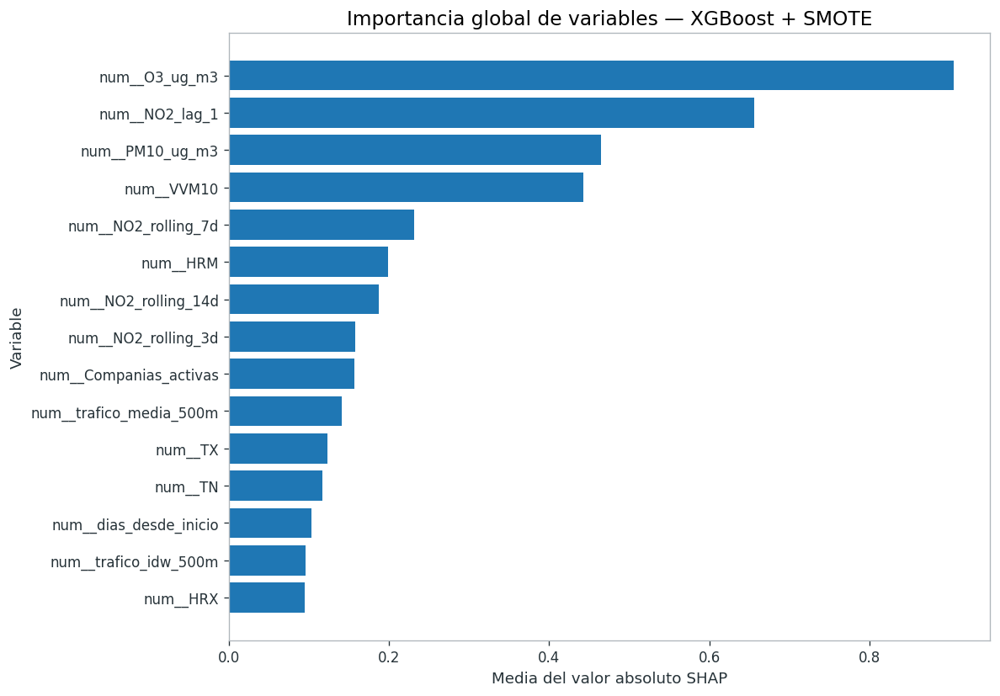


✓ Generando SHAP summary plot...


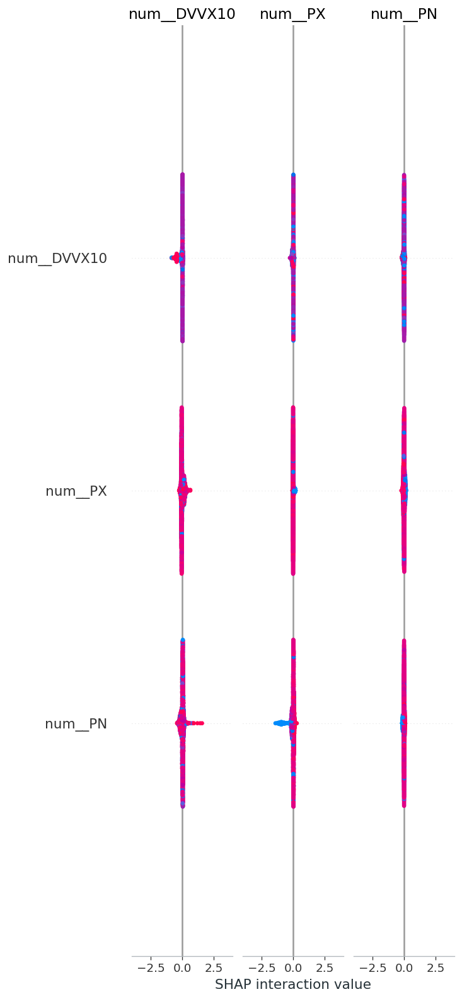


IMPORTANCIA SHAP POR BLOQUES
bloque
NO₂ histórico    1.414358
Meteorología     1.393601
Contaminantes    1.370250
Tráfico          0.832173
Temporal         0.709235
Otros            0.611111
Aéreo            0.267964
Espacial         0.067791
Ruido            0.018663

✓ Importancia por bloques guardada

RESUMEN — INTERPRETABILIDAD

✓ Modelo analizado: XGBoost + SMOTE
✓ Modelo final sin reentrenamiento
✓ TEST utilizado únicamente para interpretación del modelo ya fijado
✓ Importancia global SHAP calculada
✓ Importancia agrupada por bloques calculada

# ✓ INTERPRETABILIDAD SHAP COMPLETADA


In [ ]:
# ============================================================
# CELDA 32 — INTERPRETABILIDAD SHAP DEL MODELO FINAL
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap

from pathlib import Path

# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("32 · INTERPRETABILIDAD SHAP — XGBOOST + SMOTE")
print("=" * 78)

# ============================================================
# 2. COMPROBAR OBJETOS
# ============================================================

if "modelo_final" not in globals():
    raise ValueError(
        "No existe 'modelo_final'. Ejecuta primero la celda 31."
    )

if "X_test" not in globals():
    raise ValueError(
        "No existe X_test. Ejecuta primero las celdas anteriores."
    )

if "y_test" not in globals():
    raise ValueError(
        "No existe y_test. Ejecuta primero las celdas anteriores."
    )

print("\n✓ Modelo final disponible")
print("✓ X_test disponible")
print("✓ y_test disponible")

# ============================================================
# 3. NOMBRES DE FEATURES
# ============================================================

feature_names_path = (
    BASE / "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )["feature_transformada"].tolist()

else:

    feature_names = [
        f"feature_{i}"
        for i in range(X_test.shape[1])
    ]

if len(feature_names) != X_test.shape[1]:
    raise ValueError(
        "El número de nombres de variables no coincide "
        "con las columnas de X_test."
    )

print(
    f"\n✓ Features identificadas: {len(feature_names)}"
)

# ============================================================
# 4. DATAFRAME TEST
# ============================================================

X_test_df = pd.DataFrame(
    X_test,
    columns=feature_names
)

print(
    f"✓ Matriz TEST: {X_test_df.shape}"
)

# ============================================================
# 5. SHAP EXPLAINER
# ============================================================

print("\n✓ Construyendo SHAP TreeExplainer...")

explainer = shap.TreeExplainer(
    modelo_final
)

print("✓ Explainer construido")

# ============================================================
# 6. CALCULAR SHAP
# ============================================================

print(
    "\nCalculando valores SHAP sobre TEST..."
)

shap_values = explainer.shap_values(
    X_test_df
)

print("✓ Valores SHAP calculados")

# ============================================================
# 7. CONTROL DE ESTRUCTURA
# ============================================================

print(
    "\nTipo de objeto SHAP:",
    type(shap_values)
)

if isinstance(shap_values, list):

    print(
        "✓ SHAP devuelve una matriz por clase"
    )

    for i, values in enumerate(shap_values):

        print(
            f"  Clase {i}: {values.shape}"
        )

else:

    print(
        "✓ SHAP devuelve matriz multidimensional"
    )

    print(
        "  Dimensiones:",
        np.asarray(shap_values).shape
    )

# ============================================================
# 8. IMPORTANCIA GLOBAL SHAP
# ============================================================

print("\n" + "=" * 78)
print("IMPORTANCIA GLOBAL SHAP")
print("=" * 78)

if isinstance(shap_values, list):

    shap_abs = np.mean(
        np.abs(
            np.concatenate(
                [
                    np.asarray(v)
                    for v in shap_values
                ],
                axis=0
            )
        ),
        axis=0
    )

else:

    shap_array = np.asarray(
        shap_values
    )

    if shap_array.ndim == 3:

        shap_abs = np.mean(
            np.abs(shap_array),
            axis=(0, 2)
        )

    else:

        shap_abs = np.mean(
            np.abs(shap_array),
            axis=0
        )

importance_shap = pd.DataFrame({
    "feature": feature_names,
    "mean_abs_shap": shap_abs
}).sort_values(
    "mean_abs_shap",
    ascending=False
).reset_index(drop=True)

print(
    "\nTOP 20 VARIABLES SEGÚN SHAP:\n"
)

print(
    importance_shap
    .head(20)
    .to_string(index=False)
)

# ============================================================
# 9. GUARDAR IMPORTANCIA SHAP
# ============================================================

importance_shap.to_csv(
    BASE / "modelo_final_shap_importance.csv",
    index=False
)

print(
    "\n✓ Importancias SHAP guardadas en:"
)

print(
    BASE / "modelo_final_shap_importance.csv"
)

# ============================================================
# 10. TOP 15 — GRÁFICO
# ============================================================

plt.figure(
    figsize=(10, 7)
)

top15 = importance_shap.head(15).sort_values(
    "mean_abs_shap"
)

plt.barh(
    top15["feature"],
    top15["mean_abs_shap"]
)

plt.xlabel(
    "Media del valor absoluto SHAP"
)

plt.ylabel(
    "Variable"
)

plt.title(
    "Importancia global de variables — XGBoost + SMOTE"
)

plt.tight_layout()

plt.show()

# ============================================================
# 11. SHAP SUMMARY PLOT
# ============================================================

print(
    "\n✓ Generando SHAP summary plot..."
)

if isinstance(shap_values, list):

    # Mostrar la clase Mala
    shap.summary_plot(
        shap_values[2],
        X_test_df,
        max_display=15,
        show=True
    )

else:

    shap.summary_plot(
        shap_values,
        X_test_df,
        max_display=15,
        show=True
    )

# ============================================================
# 12. IMPORTANCIA POR BLOQUES TEMÁTICOS
# ============================================================

def clasificar_bloque(nombre):

    n = nombre.lower()

    if "no2" in n:
        return "NO₂ histórico"

    if any(
        x in n
        for x in [
            "o3",
            "pm10",
            "pm25",
            "pm_"
        ]
    ):
        return "Contaminantes"

    if any(
        x in n
        for x in [
            "trafico",
            "aforo"
        ]
    ):
        return "Tráfico"

    if any(
        x in n
        for x in [
            "vvm",
            "vvx",
            "dvm",
            "dvx",
            "tm",
            "tn",
            "tx",
            "hr",
            "ppt",
            "rs24"
        ]
    ):
        return "Meteorología"

    if any(
        x in n
        for x in [
            "mes",
            "dia_",
            "anio",
            "semana",
            "trimestre",
            "invierno",
            "verano",
            "primavera",
            "otono",
            "fin_semana"
        ]
    ):
        return "Temporal"

    if any(
        x in n
        for x in [
            "estacion",
            "lat",
            "lon",
            "x_etrs",
            "y_etrs"
        ]
    ):
        return "Espacial"

    if any(
        x in n
        for x in [
            "vuelo",
            "compania"
        ]
    ):
        return "Aéreo"

    if any(
        x in n
        for x in [
            "laeq",
            "ruido"
        ]
    ):
        return "Ruido"

    return "Otros"


importance_shap["bloque"] = (
    importance_shap["feature"]
    .apply(clasificar_bloque)
)

bloques = (
    importance_shap
    .groupby("bloque")["mean_abs_shap"]
    .sum()
    .sort_values(
        ascending=False
    )
)

print("\n" + "=" * 78)
print("IMPORTANCIA SHAP POR BLOQUES")
print("=" * 78)

print(
    bloques.to_string()
)

# ============================================================
# 13. GUARDAR IMPORTANCIA POR BLOQUES
# ============================================================

bloques_df = (
    bloques
    .reset_index()
    .rename(
        columns={
            "mean_abs_shap":
            "importance_shap_total"
        }
    )
)

bloques_df.to_csv(
    BASE / "modelo_final_shap_importance_bloques.csv",
    index=False
)

print(
    "\n✓ Importancia por bloques guardada"
)

# ============================================================
# 14. RESUMEN
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN — INTERPRETABILIDAD")
print("=" * 78)

print(
    "\n✓ Modelo analizado: XGBoost + SMOTE"
)

print(
    "✓ Modelo final sin reentrenamiento"
)

print(
    "✓ TEST utilizado únicamente para interpretación "
    "del modelo ya fijado"
)

print(
    "✓ Importancia global SHAP calculada"
)

print(
    "✓ Importancia agrupada por bloques calculada"
)

print(
    "\n# ✓ INTERPRETABILIDAD SHAP COMPLETADA"
)

print("=" * 78)

### RESULTADOS INTERPRETABILIDAD SHAP

## 1. Importancia global de las variables

El análisis SHAP se ha aplicado al modelo final **XGBoost + SMOTE**, sin
realizar un nuevo entrenamiento ni modificar el conjunto TEST.

Los valores SHAP presentan dimensiones:

- 2.506 observaciones;
- 122 variables transformadas;
- 3 clases.

La importancia global se obtiene mediante la media del valor absoluto SHAP,
permitiendo identificar las variables con mayor contribución al conjunto de
predicciones.

### Principales variables

| Variable | Media del valor absoluto SHAP |
|---|---:|
| `O3_ug_m3` | **0,9050** |
| `NO2_lag_1` | **0,6559** |
| `PM10_ug_m3` | **0,4652** |
| `VVM10` | **0,4422** |
| `NO2_rolling_7d` | **0,2309** |
| `HRM` | **0,1984** |
| `NO2_rolling_14d` | **0,1877** |
| `NO2_rolling_3d` | **0,1576** |
| `Companias_activas` | **0,1569** |
| `trafico_media_500m` | **0,1412** |

Entre las 20 variables con mayor contribución aparecen principalmente
variables relacionadas con contaminantes atmosféricos, persistencia temporal
del NO₂, meteorología, tráfico y actividad aeroportuaria.

---

## 2. Importancia por bloques temáticos

La agrupación de las variables según su naturaleza permite obtener una visión
más general de los factores utilizados por el modelo:

| Bloque | Importancia SHAP agregada |
|---|---:|
| **NO₂ histórico** | **1,4144** |
| **Meteorología** | **1,3936** |
| **Contaminantes** | **1,3703** |
| **Tráfico** | **0,8322** |
| **Temporal** | **0,7092** |
| **Otros** | **0,6111** |
| **Aéreo** | **0,2680** |
| **Espacial** | **0,0678** |
| **Ruido** | **0,0187** |

Los tres bloques con mayor importancia agregada son **NO₂ histórico,
meteorología y contaminantes**, seguidos por las variables de tráfico y
temporales.

---

## 3. Interpretación ambiental

Los resultados muestran que el modelo combina diferentes dimensiones para
clasificar la calidad del aire.

La elevada importancia del **NO₂ histórico**, especialmente `NO2_lag_1` y las
medias móviles de 3, 7 y 14 días, evidencia la relevancia de la persistencia
temporal de la contaminación.

La **meteorología** constituye igualmente uno de los principales bloques
explicativos, con variables como `VVM10`, `HRM`, `TX`, `TN`, `HRX` y `DVM10`
entre las variables con mayor contribución individual.

El bloque de **contaminantes** también presenta una elevada importancia,
destacando especialmente `O3_ug_m3` y `PM10_ug_m3`.

Las variables asociadas al **tráfico** presentan una contribución relevante,
con `trafico_media_500m` y `trafico_idw_500m` entre las variables de mayor
importancia.

También aparece la actividad aeroportuaria mediante `Companias_activas`,
aunque con una contribución agregada inferior a los bloques anteriores.

---

## 4. Interpretación de los valores SHAP

La importancia SHAP representa la magnitud de la contribución de cada variable
a las predicciones del modelo. Por tanto, una mayor importancia no implica
por sí misma una relación causal con la contaminación.

En particular, el resultado permite identificar qué variables utiliza con
mayor intensidad el modelo para diferenciar las categorías de calidad del
aire, pero no debe interpretarse como una estimación de efectos causales.

---

## 5. Control metodológico

✓ Modelo analizado: **XGBoost + SMOTE**.

✓ Modelo final sin reentrenamiento.

✓ 122 variables transformadas.

✓ 2.506 observaciones de TEST analizadas.

✓ Importancia global calculada mediante valores SHAP absolutos.

✓ Importancia agregada por bloques temáticos calculada.

✓ TEST no utilizado para modificar ni seleccionar nuevamente el modelo.

✓ Resultados SHAP guardados.

---

## 6. Conclusión

El análisis SHAP confirma que la predicción de la calidad del aire se apoya
principalmente en la combinación de **persistencia temporal del NO₂,
meteorología y otros contaminantes atmosféricos**, con una contribución
también relevante de las variables de tráfico y de la estructura temporal.

La elevada importancia de `NO2_lag_1` y de las medias móviles demuestra que la
información histórica incorporada durante el *feature engineering* aporta
valor predictivo al modelo.

Este análisis proporciona una interpretación del modelo complementaria a las
métricas de rendimiento y permite relacionar el comportamiento del modelo
predictivo con los diferentes procesos ambientales y urbanos considerados.

# ✓ INTERPRETABILIDAD SHAP COMPLETADA

# 33 · SHAP ESPECÍFICO DE LA CLASE «MALA»

## Objetivo

Profundizar en la interpretabilidad del modelo final **XGBoost + SMOTE**
mediante un análisis específico de la categoría `Mala`.

La clase `Mala` presenta una frecuencia muy inferior a las categorías
`Buena` y `Media`, por lo que resulta especialmente relevante analizar qué
variables contribuyen a su identificación por parte del modelo.

---

## Análisis específico de la clase

A partir de los valores SHAP calculados en la celda 32 se extraen
exclusivamente los valores correspondientes a la **clase 2 (`Mala`)**.

Se analizará:

- la importancia media absoluta de las variables para la clase `Mala`;
- las variables con mayor contribución a sus predicciones;
- el comportamiento de estas variables mediante un SHAP summary plot;
- las contribuciones en los casos que realmente pertenecen a la clase
  `Mala`.

---

## Casos reales de la clase «Mala»

El conjunto TEST contiene únicamente **22 observaciones reales de la clase
`Mala`**.

Por este motivo, el análisis específico de estos casos debe interpretarse
teniendo en cuenta el reducido tamaño de la muestra.

No obstante, este análisis permite estudiar qué patrones reconoce el modelo
cuando identifica episodios de peor calidad del aire.

---

## Interpretación

Se prestará especial atención a:

- persistencia temporal del NO₂;
- medias móviles de NO₂;
- O₃ y PM10;
- variables meteorológicas;
- tráfico;
- variables temporales;
- características espaciales.

El objetivo no es establecer relaciones causales, sino identificar las
variables que presentan una mayor contribución a las decisiones del modelo
para la categoría `Mala`.

---

## Control metodológico

✓ Se utiliza exclusivamente el modelo final XGBoost + SMOTE.

✓ No se realiza ningún nuevo entrenamiento.

✓ El conjunto TEST permanece intacto.

✓ Los valores SHAP se calculan sobre el modelo ya fijado.

✓ Se analiza específicamente la clase `Mala`.

✓ Se estudian adicionalmente los casos que realmente pertenecen a la clase
`Mala`.

✓ No se utiliza este análisis para modificar o seleccionar nuevamente el
modelo.

---

## Resultado esperado

Este análisis permitirá complementar la evaluación global del modelo con una
interpretación específica de los episodios de peor calidad del aire,
identificando los principales factores que intervienen en su clasificación.

# ✓ ANÁLISIS SHAP DE LA CLASE «MALA» INICIADO

33 · SHAP ESPECÍFICO — CLASE MALA

✓ Modelo final disponible
✓ X_test disponible
✓ y_test disponible

✓ Features identificadas: 122
✓ Matriz TEST: (2506, 122)

✓ SHAP TreeExplainer construido

Calculando valores SHAP...
✓ Valores SHAP calculados

Dimensiones SHAP: (2506, 122, 3)

✓ SHAP extraído para la clase 'Mala'
✓ Matriz SHAP Mala: (2506, 122)

TOP 20 VARIABLES — CLASE MALA
                   feature  mean_abs_shap
             num__O3_ug_m3       1.296891
            num__NO2_lag_1       0.887607
           num__PM10_ug_m3       0.810521
                num__VVM10       0.586033
       num__NO2_rolling_7d       0.538510
    num__Companias_activas       0.408839
                  num__HRM       0.327745
      num__NO2_rolling_14d       0.294831
                 num__anio       0.218504
                num__DVM10       0.180727
                  num__dia       0.178266
       num__dia_semana_sin       0.171724
                  num__HRX       0.168011
            num__trimestre     

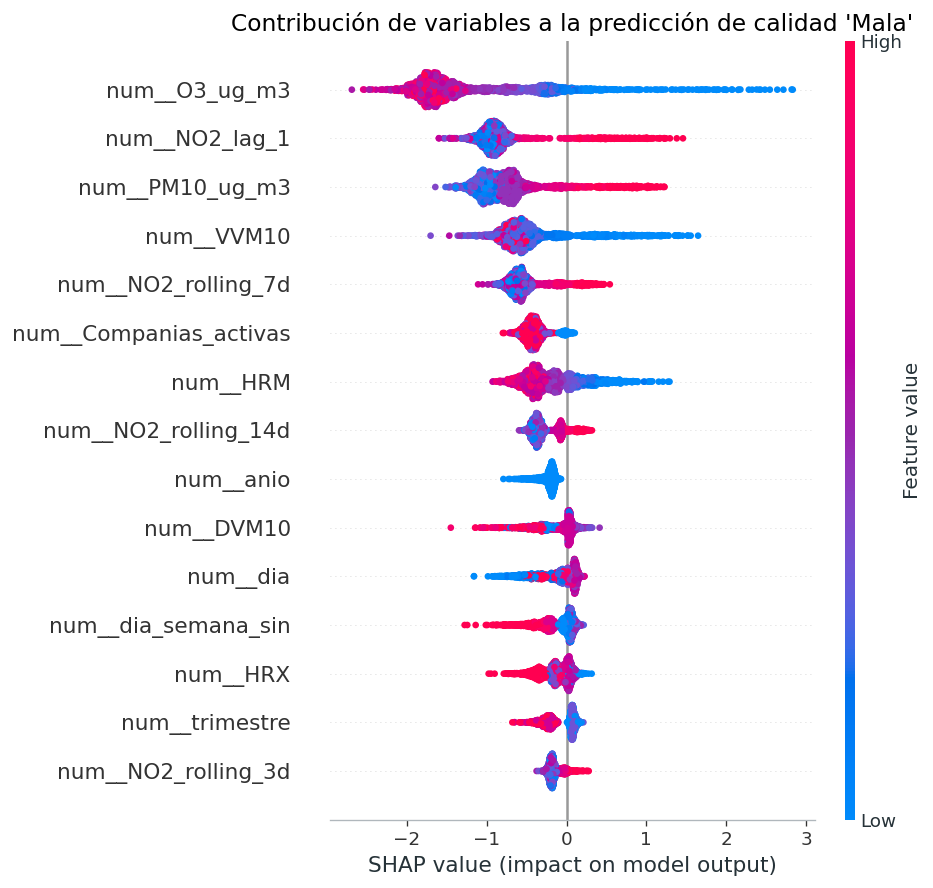

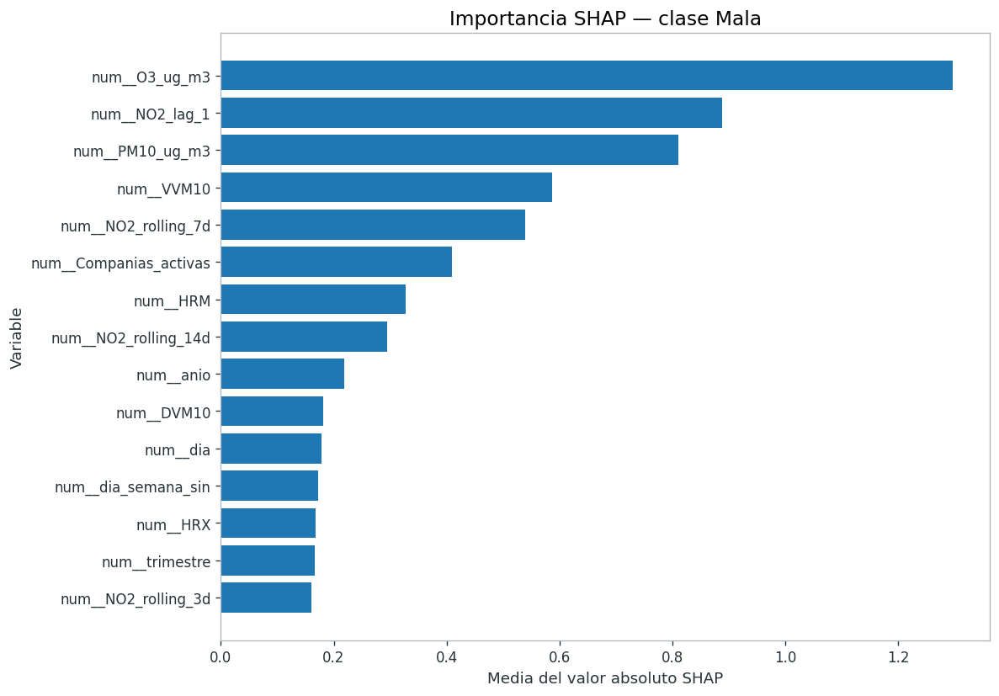


CASOS REALES DE CLASE MALA

✓ Casos reales 'Mala' en TEST: 22

TOP 20 VARIABLES EN LOS CASOS REALMENTE 'MALA':

                        feature  mean_abs_shap
                  num__O3_ug_m3       1.209726
                 num__NO2_lag_1       1.075719
                     num__VVM10       1.030822
                num__PM10_ug_m3       0.772002
         num__Companias_activas       0.390246
            num__NO2_rolling_7d       0.360959
                       num__HRM       0.355856
                       num__HRX       0.270153
            num__dia_semana_sin       0.259767
                      num__anio       0.243002
                     num__DVM10       0.202394
             num__es_fin_semana       0.194023
                       num__dia       0.185781
       num__Puerto_calado_medio       0.168513
        num__trafico_media_500m       0.159112
num__Vuelos_internacionales_pct       0.143149
           num__NO2_rolling_14d       0.140619
          num__trafico_idw_500m       0.1

In [ ]:
# ============================================================
# CELDA 33 — SHAP ESPECÍFICO DE LA CLASE "MALA"
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap

from pathlib import Path

# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

print("=" * 78)
print("33 · SHAP ESPECÍFICO — CLASE MALA")
print("=" * 78)

# ============================================================
# 2. COMPROBACIONES
# ============================================================

if "modelo_final" not in globals():
    raise ValueError(
        "No existe 'modelo_final'. Ejecuta primero la celda 31."
    )

if "X_test" not in globals():
    raise ValueError(
        "No existe X_test. Ejecuta primero las celdas anteriores."
    )

if "y_test" not in globals():
    raise ValueError(
        "No existe y_test. Ejecuta primero las celdas anteriores."
    )

print("\n✓ Modelo final disponible")
print("✓ X_test disponible")
print("✓ y_test disponible")

# ============================================================
# 3. NOMBRES DE FEATURES
# ============================================================

feature_names_path = (
    BASE / "feature_names_preprocessed.csv"
)

if feature_names_path.exists():

    feature_names = pd.read_csv(
        feature_names_path
    )["feature_transformada"].tolist()

else:

    feature_names = [
        f"feature_{i}"
        for i in range(X_test.shape[1])
    ]

if len(feature_names) != X_test.shape[1]:
    raise ValueError(
        "El número de nombres de variables no coincide "
        "con X_test."
    )

X_test_df = pd.DataFrame(
    X_test,
    columns=feature_names
)

print(
    f"\n✓ Features identificadas: {len(feature_names)}"
)

print(
    f"✓ Matriz TEST: {X_test_df.shape}"
)

# ============================================================
# 4. EXPLAINER
# ============================================================

explainer = shap.TreeExplainer(
    modelo_final
)

print(
    "\n✓ SHAP TreeExplainer construido"
)

# ============================================================
# 5. VALORES SHAP
# ============================================================

print(
    "\nCalculando valores SHAP..."
)

shap_values = explainer.shap_values(
    X_test_df
)

print(
    "✓ Valores SHAP calculados"
)

# ============================================================
# 6. EXTRAER CLASE MALA
# ============================================================

shap_array = np.asarray(
    shap_values
)

print(
    "\nDimensiones SHAP:",
    shap_array.shape
)

# En nuestro caso:
# (observaciones, features, clases)

if shap_array.ndim != 3:
    raise ValueError(
        "La estructura SHAP no tiene las dimensiones "
        "esperadas (observaciones, features, clases)."
    )

if shap_array.shape[2] != 3:
    raise ValueError(
        "No se han encontrado exactamente 3 clases."
    )

# Clase 2 = Mala

shap_mala = shap_array[:, :, 2]

print(
    "\n✓ SHAP extraído para la clase 'Mala'"
)

print(
    f"✓ Matriz SHAP Mala: {shap_mala.shape}"
)

# ============================================================
# 7. IMPORTANCIA GLOBAL PARA MALA
# ============================================================

importance_mala = pd.DataFrame({
    "feature": feature_names,
    "mean_abs_shap": np.mean(
        np.abs(shap_mala),
        axis=0
    )
}).sort_values(
    "mean_abs_shap",
    ascending=False
).reset_index(drop=True)

print("\n" + "=" * 78)
print("TOP 20 VARIABLES — CLASE MALA")
print("=" * 78)

print(
    importance_mala
    .head(20)
    .to_string(index=False)
)

# ============================================================
# 8. GUARDAR RESULTADOS
# ============================================================

importance_mala.to_csv(
    BASE / "shap_importance_clase_mala.csv",
    index=False
)

print(
    "\n✓ Importancia SHAP de la clase Mala guardada en:"
)

print(
    BASE / "shap_importance_clase_mala.csv"
)

# ============================================================
# 9. SUMMARY PLOT — CLASE MALA
# ============================================================

print(
    "\n✓ Generando SHAP summary plot para 'Mala'..."
)

plt.figure(
    figsize=(10, 7)
)

shap.summary_plot(
    shap_mala,
    X_test_df,
    max_display=15,
    show=False
)

plt.title(
    "Contribución de variables a la predicción de calidad 'Mala'"
)

plt.tight_layout()

plt.show()

# ============================================================
# 10. BAR PLOT — CLASE MALA
# ============================================================

top15_mala = (
    importance_mala
    .head(15)
    .sort_values(
        "mean_abs_shap"
    )
)

plt.figure(
    figsize=(10, 7)
)

plt.barh(
    top15_mala["feature"],
    top15_mala["mean_abs_shap"]
)

plt.xlabel(
    "Media del valor absoluto SHAP"
)

plt.ylabel(
    "Variable"
)

plt.title(
    "Importancia SHAP — clase Mala"
)

plt.tight_layout()

plt.show()

# ============================================================
# 11. ANALIZAR SOLO LOS CASOS REALES "MALA"
# ============================================================

mask_mala_real = (
    np.asarray(y_test) == 2
)

n_mala = mask_mala_real.sum()

print("\n" + "=" * 78)
print("CASOS REALES DE CLASE MALA")
print("=" * 78)

print(
    f"\n✓ Casos reales 'Mala' en TEST: {n_mala}"
)

if n_mala > 0:

    shap_mala_reales = shap_mala[
        mask_mala_real
    ]

    importance_mala_reales = pd.DataFrame({
        "feature": feature_names,
        "mean_abs_shap": np.mean(
            np.abs(shap_mala_reales),
            axis=0
        )
    }).sort_values(
        "mean_abs_shap",
        ascending=False
    ).reset_index(drop=True)

    print(
        "\nTOP 20 VARIABLES EN LOS CASOS REALMENTE 'MALA':\n"
    )

    print(
        importance_mala_reales
        .head(20)
        .to_string(index=False)
    )

    importance_mala_reales.to_csv(
        BASE / "shap_importance_mala_casos_reales.csv",
        index=False
    )

    print(
        "\n✓ Análisis de casos reales 'Mala' guardado"
    )

else:

    print(
        "⚠ No existen casos 'Mala' en TEST."
    )

# ============================================================
# 12. CONTROL DE PREDICCIONES MALA
# ============================================================

y_pred_final = modelo_final.predict(
    X_test
)

mask_pred_mala = (
    y_pred_final == 2
)

print("\n" + "=" * 78)
print("CONTROL DE PREDICCIONES")
print("=" * 78)

print(
    f"\n✓ Casos reales Mala: {mask_mala_real.sum()}"
)

print(
    f"✓ Casos predichos Mala: {mask_pred_mala.sum()}"
)

print(
    f"✓ Verdaderos positivos Mala: "
    f"{np.sum(mask_mala_real & mask_pred_mala)}"
)

# ============================================================
# 13. RESUMEN
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN")
print("=" * 78)

print(
    "\n✓ SHAP específico para clase Mala calculado"
)

print(
    "✓ Importancia global de variables calculada"
)

print(
    "✓ Summary plot generado"
)

print(
    "✓ Análisis específico de los casos reales Mala realizado"
)

print(
    "✓ Modelo no reentrenado"
)

print(
    "✓ TEST no utilizado para modificar el modelo"
)

print(
    "\n# ✓ SHAP CLASE MALA COMPLETADO"
)

print("=" * 78)

### RESULTADOS  SHAP ESPECÍFICO DE LA CLASE «MALA»

## 1. Importancia de variables para la clase «Mala»

El análisis SHAP específico de la clase `Mala` permite identificar las
variables que presentan una mayor contribución a las predicciones de esta
categoría.

| Variable | Media del valor absoluto SHAP |
|---|---:|
| `O3_ug_m3` | **1,2969** |
| `NO2_lag_1` | **0,8876** |
| `PM10_ug_m3` | **0,8105** |
| `VVM10` | **0,5860** |
| `NO2_rolling_7d` | **0,5385** |
| `Companias_activas` | **0,4088** |
| `HRM` | **0,3277** |
| `NO2_rolling_14d` | **0,2948** |
| `anio` | **0,2185** |
| `DVM10` | **0,1807** |

Las variables relacionadas con **O₃, NO₂ histórico, PM10 y meteorología**
presentan las mayores contribuciones a la predicción de la categoría
`Mala`.

---

## 2. Interpretación del SHAP específico

El análisis muestra que `O3_ug_m3` presenta la mayor contribución media
absoluta a la predicción de la clase `Mala`, seguida de `NO2_lag_1` y
`PM10_ug_m3`.

También adquieren especial relevancia:

- velocidad del viento (`VVM10`);
- medias móviles de NO₂;
- humedad relativa (`HRM`);
- actividad aeroportuaria (`Companias_activas`);
- variables temporales y meteorológicas.

El comportamiento observado en `NO2_lag_1` es especialmente relevante,
dado que los valores elevados tienden a generar contribuciones positivas
hacia la categoría `Mala`.

Esto refuerza la importancia de incorporar información histórica y temporal
en la clasificación.

---

## 3. Análisis de los episodios realmente «Mala»

El conjunto TEST contiene **22 observaciones reales** pertenecientes a la
categoría `Mala`.

Al analizar exclusivamente estos episodios, las principales variables son:

| Variable | Media del valor absoluto SHAP |
|---|---:|
| `O3_ug_m3` | **1,2097** |
| `NO2_lag_1` | **1,0757** |
| `VVM10` | **1,0308** |
| `PM10_ug_m3` | **0,7720** |
| `Companias_activas` | **0,3902** |
| `NO2_rolling_7d` | **0,3610** |
| `HRM` | **0,3559** |
| `HRX` | **0,2702** |
| `dia_semana_sin` | **0,2598** |
| `anio` | **0,2430** |

La estructura de importancia se mantiene respecto al análisis global de la
clase `Mala`, destacando nuevamente O₃, NO₂ histórico, meteorología y PM10.

---

## 4. Capacidad de identificación de la clase «Mala»

El modelo final produce:

- **22 casos reales `Mala`**;
- **10 casos predichos como `Mala`**;
- **8 verdaderos positivos**.

Estos resultados corresponden a:

- Precision `Mala`: **0,8000**
- Recall `Mala`: **0,3636**
- F1 `Mala`: **0,5000**

Por tanto, aunque la baja frecuencia de la clase limita su capacidad de
detección, cuando el modelo clasifica una observación como `Mala` presenta
una elevada precisión.

---

## 5. Coherencia con el análisis global

Los resultados específicos de la clase `Mala` son coherentes con el análisis
SHAP global realizado en la celda 32.

En ambos análisis aparecen de forma destacada:

- O₃;
- `NO2_lag_1`;
- PM10;
- variables meteorológicas;
- medias móviles de NO₂;
- actividad urbana y aeroportuaria.

Esta consistencia indica que los principales factores utilizados por el
modelo se mantienen al centrar el análisis específicamente en los episodios
de peor calidad del aire.

---

## 6. Interpretación ambiental

Los resultados sugieren que la identificación de episodios de peor calidad
del aire depende de la combinación de:

**contaminantes atmosféricos + persistencia temporal del NO₂ +
condiciones meteorológicas + actividad urbana.**

La importancia de `NO2_lag_1` y de las medias móviles indica que la situación
de contaminación de los días anteriores aporta información relevante para
identificar episodios de mala calidad.

La meteorología, especialmente el viento y la humedad, también presenta una
contribución elevada.

Estos resultados deben interpretarse como **importancia predictiva**, no como
evidencia de causalidad.

---

## 7. Limitación de la clase «Mala»

La interpretación de esta categoría debe realizarse teniendo en cuenta que
solo existen **22 observaciones reales `Mala` en el TEST**.

Esta baja frecuencia refleja el desequilibrio presente en los datos y limita
la precisión con la que puede estimarse el comportamiento del modelo para
esta categoría.

El uso de SMOTE durante el entrenamiento permitió mejorar su detección sin
modificar el conjunto TEST.

---

## 8. Control metodológico

✓ Modelo final: **XGBoost + SMOTE**.

✓ Modelo no reentrenado.

✓ SHAP calculado sobre el modelo final.

✓ Clase `Mala` analizada específicamente.

✓ 22 casos reales `Mala` analizados.

✓ TEST no utilizado para modificar el modelo.

✓ Análisis realizado únicamente con finalidad interpretativa.

✓ No se establecen relaciones causales a partir de los valores SHAP.

---

## 9. Conclusión

El análisis SHAP específico de la clase `Mala` confirma la relevancia de
**O₃, NO₂ histórico, PM10 y meteorología** en la identificación de los
episodios de peor calidad del aire.

La coherencia entre la importancia global, la importancia específica de la
clase `Mala` y el análisis de los 22 episodios reales proporciona una
interpretación consistente del comportamiento del modelo.

# ✓ ANÁLISIS SHAP DE LA CLASE «MALA» COMPLETADO

# 34 · EVALUACIÓN COMPLETA DEL MODELO FINAL

## Objetivo

Realizar la evaluación final del modelo **XGBoost + SMOTE** sobre el conjunto
TEST correspondiente al año 2024.

Esta celda reúne las principales métricas de evaluación del modelo y permite
analizar tanto su rendimiento global como su comportamiento específico para
cada una de las tres categorías de calidad del aire.

---

## Modelo evaluado

Se utiliza exclusivamente el modelo final seleccionado en la celda 31:

- **Modelo:** XGBoost + SMOTE
- **TRAIN:** 2019–2023
- **TEST:** 2024
- **Observaciones TEST:** 2.506
- **Clases:** Buena, Media y Mala

El modelo no se vuelve a entrenar en esta etapa.

---

## Métricas de clasificación

Se calcularán:

- Accuracy;
- Balanced Accuracy;
- Precision macro y weighted;
- Recall macro y weighted;
- F1 macro y weighted;
- F1 por clase;
- MCC (Matthews Correlation Coefficient);
- Cohen's Kappa.

Se prestará especial atención al **F1 macro**, dado el fuerte desequilibrio
entre las tres categorías.

---

## Matriz de confusión

Se analizarán las predicciones correctas e incorrectas para cada categoría:

- Buena;
- Media;
- Mala.

La matriz permitirá identificar especialmente las confusiones entre
`Media` y `Mala`, así como los episodios `Mala` clasificados como `Media`.

---

## Curvas ROC y ROC-AUC

Al tratarse de un problema multiclase, se calculará:

- ROC-AUC One-vs-Rest para cada clase;
- ROC-AUC macro;
- ROC-AUC weighted.

Las probabilidades predictivas del modelo se utilizarán exclusivamente para
la evaluación sobre TEST.

---

## Curvas Precision-Recall

Debido al fuerte desequilibrio de la clase `Mala`, se calcularán también
curvas Precision-Recall y el área bajo la curva (Average Precision) para cada
categoría.

Este análisis resulta especialmente relevante para evaluar la capacidad del
modelo para identificar episodios poco frecuentes de mala calidad del aire.

---

## Control metodológico

✓ Modelo final XGBoost + SMOTE.

✓ Modelo no reentrenado.

✓ TEST correspondiente exclusivamente a 2024.

✓ TEST utilizado únicamente para evaluación.

✓ SMOTE aplicado únicamente durante el entrenamiento.

✓ No existen variables de leakage.

✓ Se mantienen las tres clases originales.

✓ Las probabilidades utilizadas para ROC y Precision-Recall proceden del
modelo final.

---

## Objetivo final

Obtener una evaluación completa y reproducible del rendimiento predictivo del
modelo final, complementando las métricas de clasificación con el análisis
ROC-AUC, Precision-Recall y matriz de confusión.

# ✓ EVALUACIÓN FINAL DEL MODELO INICIADA

34 · EVALUACIÓN COMPLETA DEL MODELO FINAL

✓ Base:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado

✓ Carpeta de figuras:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/02_Figuras/MODELO_FINAL

✓ modelo_final disponible
✓ X_test disponible
✓ y_test disponible

INFORMACIÓN DEL CONJUNTO TEST

✓ Observaciones TEST: 2,506
✓ Variables: 122
✓ Periodo esperado: 2024

Distribución de clases:
0    1679
1     805
2      22
Name: count, dtype: int64

✓ NaN en X_test: 0

PREDICCIONES

✓ Predicciones realizadas sobre TEST
✓ Observaciones predichas: 2,506

✓ Probabilidades predictivas obtenidas
✓ Dimensiones probabilidades: (2506, 3)

CONTROL DE CLASES

✓ Clases esperadas: [0, 1, 2]
✓ Clases reales: [0, 1, 2]
✓ Clases predichas: [0, 1, 2]
✓ Tres clases disponibles para evaluación

MÉTRICAS GLOBALES

✓ Accuracy:             0.8867
✓ Balanced Accuracy:   0.7019
✓ Precision macro:      0.8478
✓ Precision weighted:   0.8856
✓ Recall macro:         0.7019
✓ Recall weigh

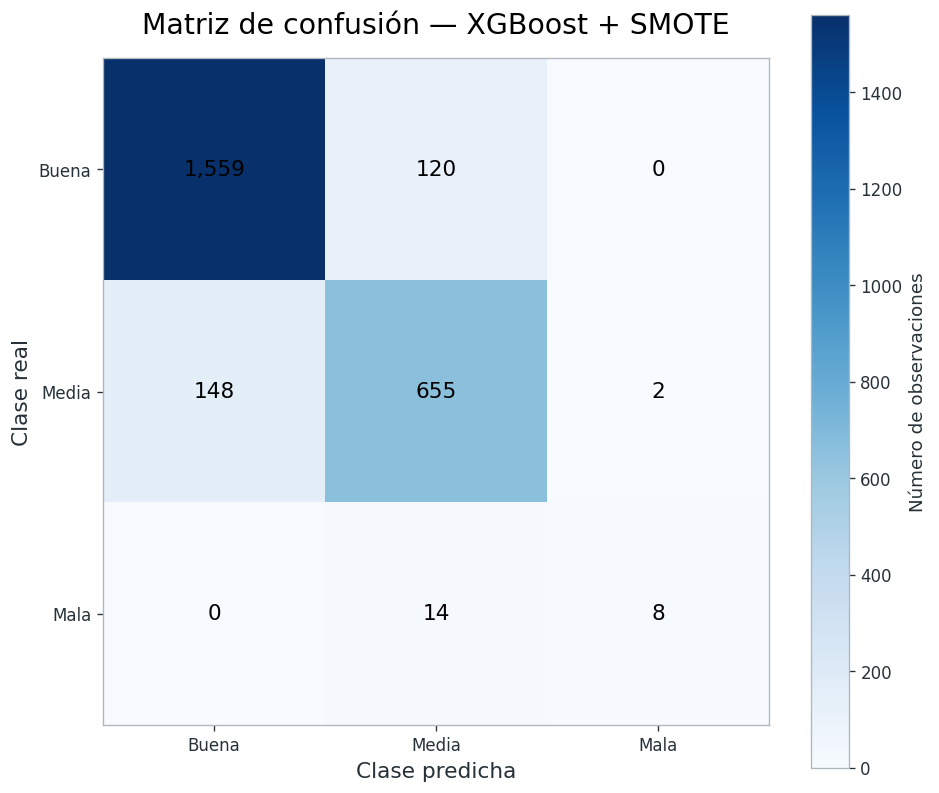


✓ Figura matriz de confusión guardada

ROC-AUC
✓ ROC-AUC Buena: 0.9550
✓ ROC-AUC Media: 0.9482
✓ ROC-AUC Mala: 0.9880

✓ ROC-AUC macro: 0.9637
✓ ROC-AUC weighted: 0.9531


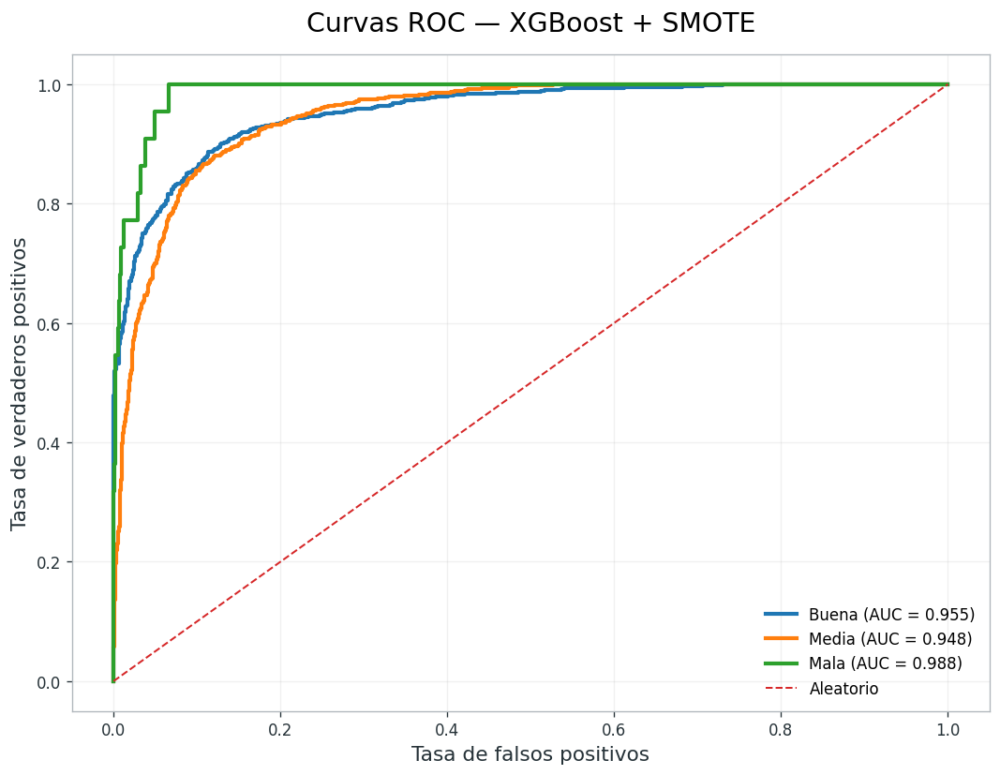

✓ Figura ROC guardada

PRECISION-RECALL / AVERAGE PRECISION
✓ Average Precision Buena: 0.9779
✓ Average Precision Media: 0.8905
✓ Average Precision Mala: 0.6128


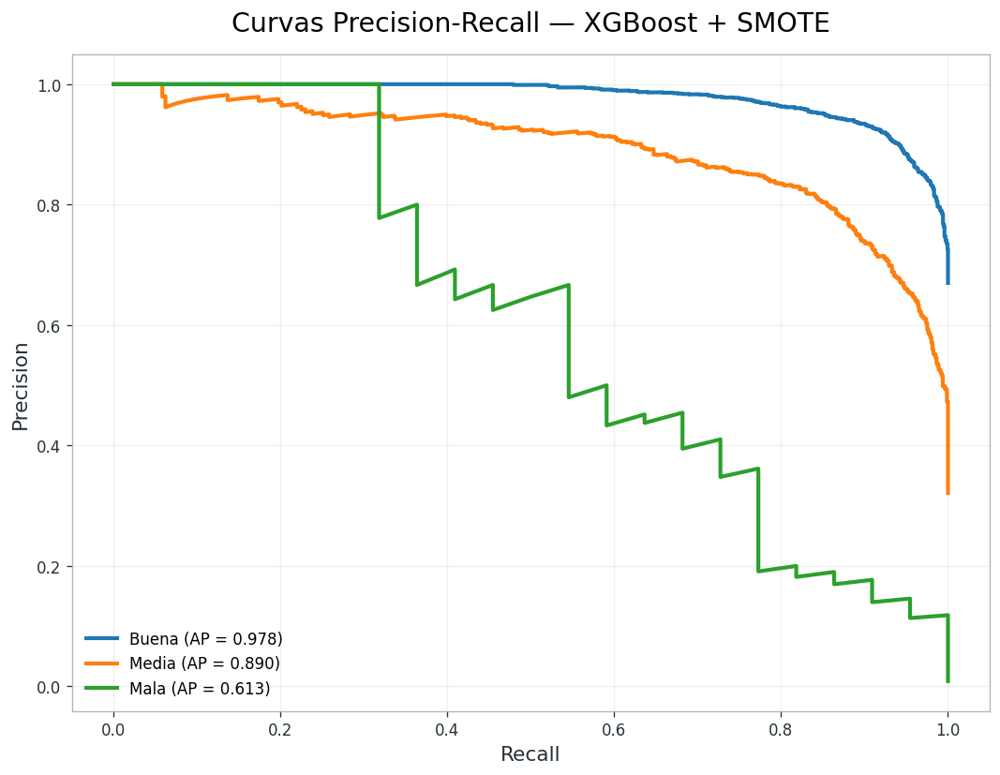

✓ Figura Precision-Recall guardada

RESULTADOS GUARDADOS

✓ Métricas globales:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/modelo_final_metricas_completas.csv

✓ Métricas por clase:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/modelo_final_metricas_por_clase.csv

✓ Matriz de confusión:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/modelo_final_matriz_confusion.csv

✓ ROC / Precision-Recall:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/modelo_final_ROC_PR_por_clase.csv

✓ Predicciones TEST:
/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/03_Datos_Modelado/modelo_final_predicciones_TEST.csv

RESUMEN FINAL — MODELO XGBOOST + SMOTE

✓ Observaciones TEST: 2,506
✓ Accuracy:           0.8867
✓ Balanced Accuracy:  0.7019
✓ F1 macro:           0.7476
✓ F1 weighted:        0.8853
✓ F1 Buena:           0.9209
✓ F1 Media:           0.8218
✓ F1 Mala:            0.5000
✓ MCC:  

In [ ]:
# ============================================================
# CELDA 34 — EVALUACIÓN COMPLETA DEL MODELO FINAL
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score
)

from sklearn.preprocessing import label_binarize


# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

print("=" * 90)
print("34 · EVALUACIÓN COMPLETA DEL MODELO FINAL")
print("=" * 90)


# ============================================================
# 2. RUTAS
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)

DIR_FIGURAS = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "02_Figuras/MODELO_FINAL"
)

DIR_FIGURAS.mkdir(
    parents=True,
    exist_ok=True
)

print("\n✓ Base:")
print(BASE)

print("\n✓ Carpeta de figuras:")
print(DIR_FIGURAS)


# ============================================================
# 3. COMPROBAR OBJETOS
# ============================================================

if "modelo_final" not in globals():

    raise ValueError(
        "No existe 'modelo_final'. "
        "Ejecuta primero la CELDA 31."
    )

if "X_test" not in globals():

    raise ValueError(
        "No existe 'X_test'. "
        "Ejecuta primero las celdas anteriores."
    )

if "y_test" not in globals():

    raise ValueError(
        "No existe 'y_test'. "
        "Ejecuta primero las celdas anteriores."
    )


print("\n✓ modelo_final disponible")
print("✓ X_test disponible")
print("✓ y_test disponible")


# ============================================================
# 4. INFORMACIÓN DEL TEST
# ============================================================

print("\n" + "=" * 90)
print("INFORMACIÓN DEL CONJUNTO TEST")
print("=" * 90)

print(
    f"\n✓ Observaciones TEST: {len(X_test):,}"
)

print(
    f"✓ Variables: {X_test.shape[1]}"
)

print(
    "✓ Periodo esperado: 2024"
)

print(
    "\nDistribución de clases:"
)

print(
    pd.Series(y_test)
    .value_counts()
    .sort_index()
)


# ============================================================
# 5. CONTROL DE NaN
# ============================================================

nan_test = np.isnan(X_test).sum()

print(
    f"\n✓ NaN en X_test: {nan_test}"
)

if nan_test != 0:

    raise ValueError(
        "Existen NaN en X_test."
    )


# ============================================================
# 6. PREDICCIONES
# ============================================================

print("\n" + "=" * 90)
print("PREDICCIONES")
print("=" * 90)

# IMPORTANTE:
# El modelo NO se vuelve a entrenar.
# Se utiliza exclusivamente el modelo_final ya construido.

y_pred = modelo_final.predict(
    X_test
)

print(
    "\n✓ Predicciones realizadas sobre TEST"
)

print(
    f"✓ Observaciones predichas: {len(y_pred):,}"
)


# ============================================================
# 7. PROBABILIDADES
# ============================================================

if not hasattr(
    modelo_final,
    "predict_proba"
):

    raise ValueError(
        "El modelo final no dispone de predict_proba()."
    )

y_proba = modelo_final.predict_proba(
    X_test
)

print(
    "\n✓ Probabilidades predictivas obtenidas"
)

print(
    f"✓ Dimensiones probabilidades: {y_proba.shape}"
)


# ============================================================
# 8. CONTROL DE CLASES
# ============================================================

CLASES = np.array(
    [0, 1, 2]
)

NOMBRES_CLASES = [
    "Buena",
    "Media",
    "Mala"
]

print("\n" + "=" * 90)
print("CONTROL DE CLASES")
print("=" * 90)

print(
    "\n✓ Clases esperadas:",
    CLASES.tolist()
)

print(
    "✓ Clases reales:",
    sorted(
        np.unique(y_test).tolist()
    )
)

print(
    "✓ Clases predichas:",
    sorted(
        np.unique(y_pred).tolist()
    )
)

if y_proba.shape[1] != 3:

    raise ValueError(
        "El modelo no devuelve probabilidades para exactamente "
        "tres clases."
    )

print(
    "✓ Tres clases disponibles para evaluación"
)


# ============================================================
# 9. MÉTRICAS GLOBALES
# ============================================================

accuracy = accuracy_score(
    y_test,
    y_pred
)

balanced_accuracy = balanced_accuracy_score(
    y_test,
    y_pred
)

precision_macro = precision_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_macro = recall_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

recall_weighted = recall_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_macro = f1_score(
    y_test,
    y_pred,
    average="macro",
    zero_division=0
)

f1_weighted = f1_score(
    y_test,
    y_pred,
    average="weighted",
    zero_division=0
)

mcc = matthews_corrcoef(
    y_test,
    y_pred
)

kappa = cohen_kappa_score(
    y_test,
    y_pred
)


print("\n" + "=" * 90)
print("MÉTRICAS GLOBALES")
print("=" * 90)

print(
    f"\n✓ Accuracy:             {accuracy:.4f}"
)

print(
    f"✓ Balanced Accuracy:   {balanced_accuracy:.4f}"
)

print(
    f"✓ Precision macro:      {precision_macro:.4f}"
)

print(
    f"✓ Precision weighted:   {precision_weighted:.4f}"
)

print(
    f"✓ Recall macro:         {recall_macro:.4f}"
)

print(
    f"✓ Recall weighted:      {recall_weighted:.4f}"
)

print(
    f"✓ F1 macro:             {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted:          {f1_weighted:.4f}"
)

print(
    f"✓ MCC:                  {mcc:.4f}"
)

print(
    f"✓ Cohen's Kappa:        {kappa:.4f}"
)


# ============================================================
# 10. MÉTRICAS POR CLASE
# ============================================================

precision_class = precision_score(
    y_test,
    y_pred,
    labels=CLASES,
    average=None,
    zero_division=0
)

recall_class = recall_score(
    y_test,
    y_pred,
    labels=CLASES,
    average=None,
    zero_division=0
)

f1_class = f1_score(
    y_test,
    y_pred,
    labels=CLASES,
    average=None,
    zero_division=0
)

support_class = np.array([
    np.sum(y_test == clase)
    for clase in CLASES
])


metricas_clase = pd.DataFrame({

    "clase": NOMBRES_CLASES,

    "precision":
        precision_class,

    "recall":
        recall_class,

    "f1":
        f1_class,

    "support":
        support_class
})


print("\n" + "=" * 90)
print("MÉTRICAS POR CLASE")
print("=" * 90)

print(
    metricas_clase
    .to_string(index=False)
)


# ============================================================
# 11. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 90)
print("CLASSIFICATION REPORT")
print("=" * 90)

reporte = classification_report(
    y_test,
    y_pred,
    labels=CLASES,
    target_names=NOMBRES_CLASES,
    digits=4,
    zero_division=0
)

print(
    reporte
)


# ============================================================
# 12. MATRIZ DE CONFUSIÓN
# ============================================================

cm = confusion_matrix(
    y_test,
    y_pred,
    labels=CLASES
)

cm_df = pd.DataFrame(
    cm,
    index=[
        "Real_Buena",
        "Real_Media",
        "Real_Mala"
    ],
    columns=[
        "Pred_Buena",
        "Pred_Media",
        "Pred_Mala"
    ]
)

print("\n" + "=" * 90)
print("MATRIZ DE CONFUSIÓN")
print("=" * 90)

print(
    cm_df
)


# ============================================================
# 13. FIGURA — MATRIZ DE CONFUSIÓN
# ============================================================

fig, ax = plt.subplots(
    figsize=(8, 7)
)

im = ax.imshow(
    cm,
    cmap="Blues"
)

ax.set_xticks(
    range(3)
)

ax.set_xticklabels(
    NOMBRES_CLASES
)

ax.set_yticks(
    range(3)
)

ax.set_yticklabels(
    NOMBRES_CLASES
)

ax.set_xlabel(
    "Clase predicha",
    fontsize=13
)

ax.set_ylabel(
    "Clase real",
    fontsize=13
)

ax.set_title(
    "Matriz de confusión — XGBoost + SMOTE",
    fontsize=17,
    pad=15
)

for i in range(3):

    for j in range(3):

        ax.text(
            j,
            i,
            f"{cm[i, j]:,}",
            ha="center",
            va="center",
            fontsize=13
        )

fig.colorbar(
    im,
    ax=ax,
    label="Número de observaciones"
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "34_01_matriz_confusion.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close()

print(
    "\n✓ Figura matriz de confusión guardada"
)


# ============================================================
# 14. ROC-AUC MULTICLASE
# ============================================================

y_test_bin = label_binarize(
    y_test,
    classes=CLASES
)

roc_auc_clase = {}

fpr = {}
tpr = {}

for i, clase in enumerate(CLASES):

    fpr[i], tpr[i], _ = roc_curve(
        y_test_bin[:, i],
        y_proba[:, i]
    )

    roc_auc_clase[clase] = auc(
        fpr[i],
        tpr[i]
    )


roc_auc_macro = roc_auc_score(
    y_test_bin,
    y_proba,
    multi_class="ovr",
    average="macro"
)

roc_auc_weighted = roc_auc_score(
    y_test_bin,
    y_proba,
    multi_class="ovr",
    average="weighted"
)


print("\n" + "=" * 90)
print("ROC-AUC")
print("=" * 90)

for clase, nombre in zip(
    CLASES,
    NOMBRES_CLASES
):

    print(
        f"✓ ROC-AUC {nombre}: "
        f"{roc_auc_clase[clase]:.4f}"
    )

print(
    f"\n✓ ROC-AUC macro: "
    f"{roc_auc_macro:.4f}"
)

print(
    f"✓ ROC-AUC weighted: "
    f"{roc_auc_weighted:.4f}"
)


# ============================================================
# 15. FIGURA — CURVAS ROC
# ============================================================

fig, ax = plt.subplots(
    figsize=(9, 7)
)

for i, nombre in zip(
    CLASES,
    NOMBRES_CLASES
):

    ax.plot(
        fpr[i],
        tpr[i],
        linewidth=2.5,
        label=(
            f"{nombre} "
            f"(AUC = {roc_auc_clase[i]:.3f})"
        )
    )

ax.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=1.2,
    label="Aleatorio"
)

ax.set_xlabel(
    "Tasa de falsos positivos",
    fontsize=13
)

ax.set_ylabel(
    "Tasa de verdaderos positivos",
    fontsize=13
)

ax.set_title(
    "Curvas ROC — XGBoost + SMOTE",
    fontsize=17,
    pad=15
)

ax.legend(
    frameon=False
)

ax.grid(
    alpha=0.18
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "34_02_curvas_ROC.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close()

print(
    "✓ Figura ROC guardada"
)


# ============================================================
# 16. PRECISION-RECALL
# ============================================================

precision_pr = {}
recall_pr = {}
average_precision = {}


for i, clase in enumerate(CLASES):

    precision_pr[i], recall_pr[i], _ = (
        precision_recall_curve(
            y_test_bin[:, i],
            y_proba[:, i]
        )
    )

    average_precision[i] = (
        average_precision_score(
            y_test_bin[:, i],
            y_proba[:, i]
        )
    )


print("\n" + "=" * 90)
print("PRECISION-RECALL / AVERAGE PRECISION")
print("=" * 90)

for clase, nombre in zip(
    CLASES,
    NOMBRES_CLASES
):

    print(
        f"✓ Average Precision {nombre}: "
        f"{average_precision[clase]:.4f}"
    )


# ============================================================
# 17. FIGURA — PRECISION-RECALL
# ============================================================

fig, ax = plt.subplots(
    figsize=(9, 7)
)

for i, nombre in zip(
    CLASES,
    NOMBRES_CLASES
):

    ax.plot(
        recall_pr[i],
        precision_pr[i],
        linewidth=2.5,
        label=(
            f"{nombre} "
            f"(AP = {average_precision[i]:.3f})"
        )
    )

ax.set_xlabel(
    "Recall",
    fontsize=13
)

ax.set_ylabel(
    "Precision",
    fontsize=13
)

ax.set_title(
    "Curvas Precision-Recall — XGBoost + SMOTE",
    fontsize=17,
    pad=15
)

ax.legend(
    frameon=False
)

ax.grid(
    alpha=0.18
)

plt.tight_layout()

plt.savefig(
    DIR_FIGURAS /
    "34_03_curvas_precision_recall.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close()

print(
    "✓ Figura Precision-Recall guardada"
)


# ============================================================
# 18. TABLA FINAL DE MÉTRICAS
# ============================================================

metricas_globales = pd.DataFrame({

    "metrica": [
        "Accuracy",
        "Balanced Accuracy",
        "Precision macro",
        "Precision weighted",
        "Recall macro",
        "Recall weighted",
        "F1 macro",
        "F1 weighted",
        "MCC",
        "Cohen's Kappa",
        "ROC-AUC macro",
        "ROC-AUC weighted"
    ],

    "valor": [
        accuracy,
        balanced_accuracy,
        precision_macro,
        precision_weighted,
        recall_macro,
        recall_weighted,
        f1_macro,
        f1_weighted,
        mcc,
        kappa,
        roc_auc_macro,
        roc_auc_weighted
    ]
})


# ============================================================
# 19. TABLA ROC / PR POR CLASE
# ============================================================

metricas_auc_clase = pd.DataFrame({

    "clase": NOMBRES_CLASES,

    "ROC_AUC": [
        roc_auc_clase[0],
        roc_auc_clase[1],
        roc_auc_clase[2]
    ],

    "Average_Precision": [
        average_precision[0],
        average_precision[1],
        average_precision[2]
    ]
})


# ============================================================
# 20. GUARDAR RESULTADOS
# ============================================================

metricas_globales.to_csv(
    BASE /
    "modelo_final_metricas_completas.csv",
    index=False
)

metricas_clase.to_csv(
    BASE /
    "modelo_final_metricas_por_clase.csv",
    index=False
)

cm_df.to_csv(
    BASE /
    "modelo_final_matriz_confusion.csv"
)

metricas_auc_clase.to_csv(
    BASE /
    "modelo_final_ROC_PR_por_clase.csv",
    index=False
)


predicciones = pd.DataFrame({

    "y_real":
        y_test,

    "y_pred":
        y_pred,

    "prob_Buena":
        y_proba[:, 0],

    "prob_Media":
        y_proba[:, 1],

    "prob_Mala":
        y_proba[:, 2]

})

predicciones.to_csv(
    BASE /
    "modelo_final_predicciones_TEST.csv",
    index=False
)


print("\n" + "=" * 90)
print("RESULTADOS GUARDADOS")
print("=" * 90)

print(
    "\n✓ Métricas globales:"
)

print(
    BASE /
    "modelo_final_metricas_completas.csv"
)

print(
    "\n✓ Métricas por clase:"
)

print(
    BASE /
    "modelo_final_metricas_por_clase.csv"
)

print(
    "\n✓ Matriz de confusión:"
)

print(
    BASE /
    "modelo_final_matriz_confusion.csv"
)

print(
    "\n✓ ROC / Precision-Recall:"
)

print(
    BASE /
    "modelo_final_ROC_PR_por_clase.csv"
)

print(
    "\n✓ Predicciones TEST:"
)

print(
    BASE /
    "modelo_final_predicciones_TEST.csv"
)


# ============================================================
# 21. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 90)
print("RESUMEN FINAL — MODELO XGBOOST + SMOTE")
print("=" * 90)

print(
    f"\n✓ Observaciones TEST: {len(y_test):,}"
)

print(
    f"✓ Accuracy:           {accuracy:.4f}"
)

print(
    f"✓ Balanced Accuracy:  {balanced_accuracy:.4f}"
)

print(
    f"✓ F1 macro:           {f1_macro:.4f}"
)

print(
    f"✓ F1 weighted:        {f1_weighted:.4f}"
)

print(
    f"✓ F1 Buena:           {f1_class[0]:.4f}"
)

print(
    f"✓ F1 Media:           {f1_class[1]:.4f}"
)

print(
    f"✓ F1 Mala:            {f1_class[2]:.4f}"
)

print(
    f"✓ MCC:                {mcc:.4f}"
)

print(
    f"✓ Cohen's Kappa:      {kappa:.4f}"
)

print(
    f"✓ ROC-AUC macro:      {roc_auc_macro:.4f}"
)

print(
    f"✓ ROC-AUC weighted:   {roc_auc_weighted:.4f}"
)

print(
    "\n✓ Modelo NO reentrenado"
)

print(
    "✓ TEST utilizado únicamente para evaluación"
)

print(
    "✓ SMOTE no aplicado sobre TEST"
)

print(
    "✓ Evaluación ROC y Precision-Recall completada"
)

print(
    "\n# ✓ CELDA 34 · EVALUACIÓN FINAL COMPLETADA"
)

print("=" * 90)

### RESULTADOS EVALUACIÓN COMPLETA DEL MODELO FINAL

## 1. Rendimiento global

El modelo final **XGBoost + SMOTE**, entrenado con los datos de 2019–2023 y
evaluado sobre el conjunto TEST correspondiente a 2024, obtiene:

| Métrica | Resultado |
|---|---:|
| **Accuracy** | **0,8867** |
| **Balanced Accuracy** | **0,7019** |
| **Precision macro** | **0,8478** |
| **Recall macro** | **0,7019** |
| **F1 macro** | **0,7476** |
| **Precision weighted** | **0,8856** |
| **Recall weighted** | **0,8867** |
| **F1 weighted** | **0,8853** |
| **MCC** | **0,7441** |
| **Cohen's Kappa** | **0,7439** |
| **ROC-AUC macro** | **0,9637** |
| **ROC-AUC weighted** | **0,9531** |

El modelo alcanza una accuracy del **88,67 %** y un **F1 macro de 0,7476**.
La diferencia entre el F1 macro y el F1 weighted refleja el efecto del
desequilibrio existente entre las tres categorías.

El valor de **MCC = 0,7441** y el **Cohen's Kappa = 0,7439** proporcionan
métricas adicionales de concordancia entre las predicciones y las
observaciones reales.

---

## 2. Rendimiento por clase

| Clase | Precision | Recall | F1 | Support |
|---|---:|---:|---:|---:|
| **Buena** | 0,9133 | 0,9285 | **0,9209** | 1.679 |
| **Media** | 0,8302 | 0,8137 | **0,8218** | 805 |
| **Mala** | 0,8000 | 0,3636 | **0,5000** | 22 |

El modelo presenta un comportamiento especialmente sólido para las categorías
`Buena` y `Media`.

La categoría `Mala` presenta una menor capacidad de detección, condicionada
por su reducida representación en el conjunto TEST, con únicamente **22
observaciones reales**.

No obstante, la precisión de la categoría `Mala` alcanza el **80,0 %**:
cuando el modelo clasifica una observación como `Mala`, la predicción es
correcta en una proporción elevada de los casos.

---

## 3. Matriz de confusión

La matriz de confusión muestra:

- **1.559** observaciones `Buena` correctamente clasificadas;
- **655** observaciones `Media` correctamente clasificadas;
- **8** observaciones `Mala` correctamente clasificadas.

Los principales errores se producen entre las categorías `Buena` y `Media`.

En el caso de la categoría `Mala`, los **14 episodios no identificados como
Mala fueron clasificados como Media**, mientras que ninguno fue clasificado
como Buena.

Esto indica que los errores asociados a los episodios de peor calidad se
producen principalmente entre categorías contiguas de severidad.

---

## 4. Análisis ROC-AUC

Las áreas bajo las curvas ROC obtenidas para cada categoría son:

| Clase | ROC-AUC |
|---|---:|
| **Buena** | **0,9550** |
| **Media** | **0,9482** |
| **Mala** | **0,9880** |
| **Macro** | **0,9637** |
| **Weighted** | **0,9531** |

El **ROC-AUC macro de 0,9637** indica una elevada capacidad global de
discriminación entre las tres categorías.

La categoría `Mala` presenta un **ROC-AUC de 0,9880**, lo que indica una
capacidad de discriminación muy elevada a nivel probabilístico, a pesar de
que su recall obtenido con el umbral de clasificación utilizado sea menor.

Por tanto, el ROC-AUC y el recall deben interpretarse como medidas
complementarias: el primero evalúa la capacidad de discriminación a través
de diferentes umbrales, mientras que el segundo refleja el comportamiento
con el umbral de decisión empleado por el modelo.

---

## 5. Análisis Precision-Recall

Las áreas bajo las curvas Precision-Recall (Average Precision) son:

| Clase | Average Precision |
|---|---:|
| **Buena** | **0,9779** |
| **Media** | **0,8905** |
| **Mala** | **0,6128** |

La categoría `Buena` presenta una capacidad de clasificación muy elevada,
con un AP de **0,9779**, seguida de la categoría `Media`, con **0,8905**.

La categoría `Mala` presenta un AP de **0,6128**. Su curva es más irregular,
lo que resulta coherente con el reducido número de observaciones positivas
disponibles en TEST.

Este análisis resulta especialmente relevante para la clase minoritaria,
ya que Precision-Recall permite evaluar de forma más específica el equilibrio
entre precisión y sensibilidad ante diferentes umbrales.

---

## 6. Interpretación conjunta

Los resultados muestran que el modelo presenta una **elevada capacidad
predictiva y discriminativa**, especialmente para las categorías `Buena` y
`Media`.

Para la categoría `Mala`, el modelo presenta una situación más compleja:

- **Precision = 0,8000**
- **Recall = 0,3636**
- **F1 = 0,5000**
- **ROC-AUC = 0,9880**
- **Average Precision = 0,6128**

Esta combinación indica que el modelo es capaz de separar adecuadamente los
episodios asociados a la categoría `Mala`, pero adopta una decisión
conservadora al asignarlos finalmente a dicha categoría.

La principal limitación está, por tanto, en la **detección de todos los
episodios minoritarios**, y no en una ausencia de capacidad discriminativa.

---

## 7. Limitación asociada al desequilibrio

La categoría `Mala` representa únicamente **22 observaciones de las 2.506
del conjunto TEST**.

Por este motivo, sus métricas presentan una mayor incertidumbre que las de
las categorías mayoritarias.

El empleo de **SMOTE exclusivamente sobre TRAIN** permitió incrementar la
representación de la clase minoritaria durante el entrenamiento, manteniendo
el conjunto TEST original e intacto para realizar una evaluación no
balanceada y representativa de la distribución temporal real.

---

## 8. Conclusión

El modelo final **XGBoost + SMOTE** obtiene un rendimiento global elevado,
con **88,67 % de accuracy**, **0,7476 de F1 macro** y **0,9637 de ROC-AUC
macro**.

La clasificación de las categorías `Buena` y `Media` presenta un rendimiento
alto, mientras que la categoría `Mala` constituye el principal reto debido
a su baja frecuencia.

La combinación de métricas de clasificación, matriz de confusión, ROC-AUC y
Precision-Recall proporciona una evaluación más completa que la accuracy por
sí sola y permite caracterizar adecuadamente el comportamiento del modelo
ante el desequilibrio de clases.

# ✓ EVALUACIÓN COMPLETA DEL MODELO FINAL COMPLETADA

# 35 · ANÁLISIS DETALLADO DE ERRORES DEL MODELO FINAL

## Objetivo

Analizar en detalle los errores cometidos por el modelo final
**XGBoost + SMOTE** sobre el conjunto TEST correspondiente a 2024.

Mientras que la celda 34 ha evaluado el rendimiento global mediante métricas,
ROC-AUC y Precision-Recall, esta celda se centra en identificar **qué tipos
de errores comete el modelo y dónde se concentran**.

---

## Análisis de las confusiones

Se estudiarán especialmente las siguientes transiciones:

- `Buena → Media`;
- `Media → Buena`;
- `Media → Mala`;
- `Mala → Media`;
- `Buena → Mala`;
- `Mala → Buena`.

El objetivo es determinar si los errores se producen principalmente entre
categorías contiguas de calidad o si existen confusiones de mayor magnitud.

---

## Análisis específico de la clase «Mala»

La categoría `Mala` constituye la clase minoritaria del problema y presenta
únicamente **22 observaciones reales en TEST**.

Se analizará:

- número de episodios `Mala` correctamente identificados;
- episodios `Mala` clasificados como `Media`;
- episodios `Mala` clasificados como `Buena`;
- precisión y recall específicos;
- distribución de los errores.

Este análisis permitirá contextualizar el recall relativamente reducido de
la clase `Mala`.

---

## Análisis temporal

Cuando la información temporal original esté disponible, se estudiará la
distribución de los errores por:

- año;
- mes;
- estación del año;
- periodo temporal.

El objetivo es comprobar si los errores se concentran en determinados
periodos del año o situaciones temporales.

---

## Análisis espacial

Cuando la estación de medida esté disponible, se analizará la tasa de error
por estación.

Esto permitirá comprobar si determinadas estaciones presentan una mayor
dificultad de clasificación y si los errores pueden estar relacionados con
la heterogeneidad espacial de la contaminación.

---

## Interpretación

Los errores no se interpretarán únicamente como fallos del algoritmo.

Se analizará también si pueden estar asociados a:

- transiciones entre niveles de calidad;
- variabilidad meteorológica;
- persistencia temporal de la contaminación;
- heterogeneidad espacial;
- baja frecuencia de la categoría `Mala`.

El objetivo es distinguir entre errores estructurales del modelo y
limitaciones derivadas de la naturaleza de los datos.

---

## Control metodológico

✓ Se utiliza exclusivamente el modelo final XGBoost + SMOTE.

✓ El modelo no se reentrena.

✓ El conjunto TEST de 2024 permanece intacto.

✓ Las predicciones proceden del modelo final ya fijado.

✓ No se modifican los hiperparámetros.

✓ No se utiliza el análisis de errores para volver a seleccionar el modelo.

---

## Objetivo final

Identificar los principales patrones de error del modelo y proporcionar una
interpretación contextualizada de sus limitaciones, especialmente en la
detección de episodios de calidad del aire `Mala`.

# ✓ ANÁLISIS DE ERRORES DEL MODELO INICIADO

35 · ANÁLISIS DETALLADO DE ERRORES

✓ Modelo final disponible
✓ X_test disponible
✓ y_test disponible

✓ Predicciones generadas: 2,506

RESUMEN GENERAL

✓ Observaciones TEST:     2,506
✓ Predicciones correctas: 2,222
✓ Predicciones erróneas:  284
✓ Accuracy:               0.8867
✓ Tasa de error:          0.1133

MATRIZ DE CONFUSIÓN
clase_predicha  Buena  Media  Mala
clase_real                        
Buena            1559    120     0
Media             148    655     2
Mala                0     14     8

TIPOS DE ERROR
   tipo_error  observaciones porcentaje
Media → Buena            148     52.11%
Buena → Media            120     42.25%
 Mala → Media             14      4.93%
 Media → Mala              2      0.70%

ANÁLISIS ESPECÍFICO — CLASE MALA

✓ Casos reales Mala:          22
✓ Mala correctamente detectadas: 8
✓ Mala no detectadas:         14

Predicción de los casos realmente Mala:
clase_predicha
Buena     0
Media    14
Mala      8

TASA DE ERROR POR CLASE
            observacio

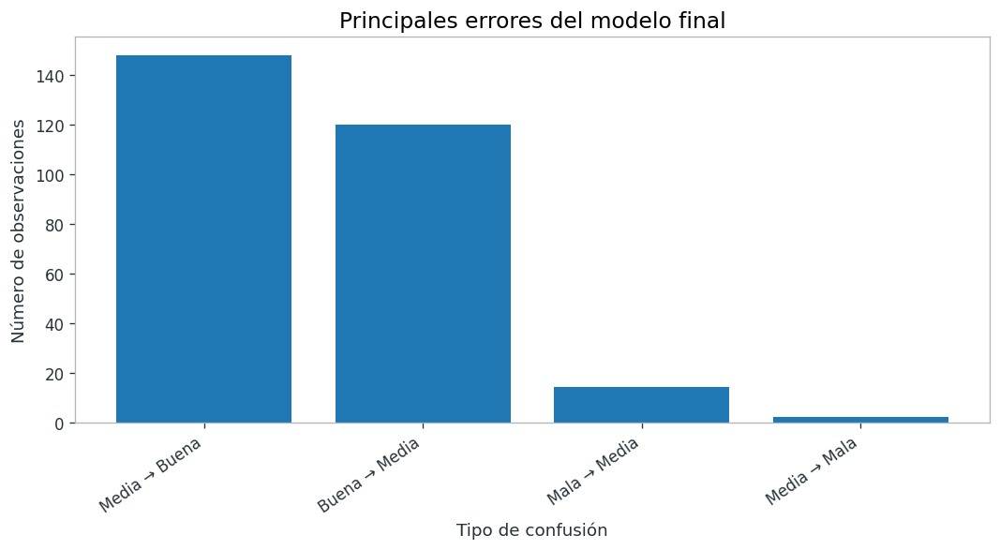

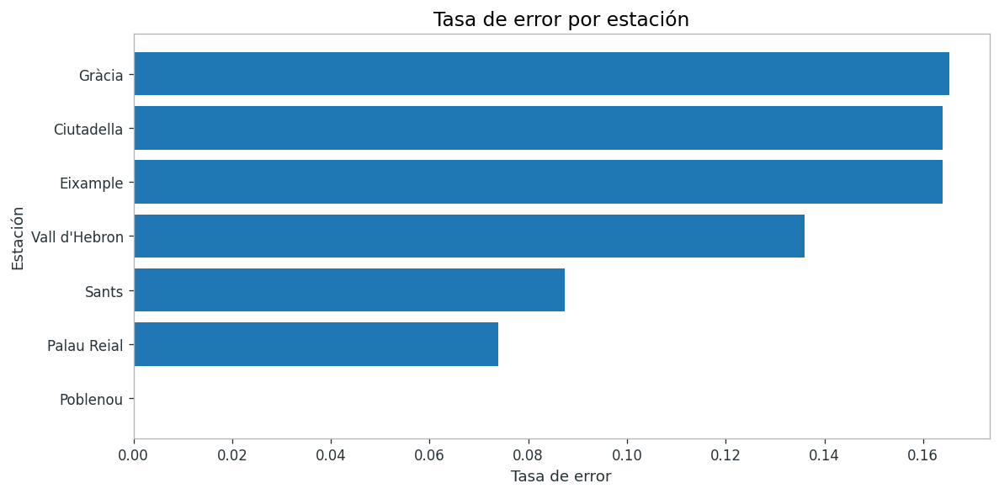


✓ Dataset completo de errores guardado
✓ Tipos de error guardados
✓ Errores por clase guardados
✓ Matriz de confusión guardada

RESUMEN — CELDA 35

✓ Observaciones:              2,506
✓ Correctas:                  2,222
✓ Errores:                    284
✓ Tasa de error:              0.1133
✓ Casos reales Mala:          22
✓ Mala correctamente detectadas: 8
✓ Mala no detectadas:         14

✓ Análisis detallado de errores completado
# ✓ CELDA 35 COMPLETADA


In [ ]:
# ============================================================
# CELDA 35 — ANÁLISIS DETALLADO DE ERRORES
# MODELO FINAL: XGBoost + SMOTE
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

print("=" * 78)
print("35 · ANÁLISIS DETALLADO DE ERRORES")
print("=" * 78)


# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)


# ============================================================
# 2. COMPROBACIONES
# ============================================================

if "modelo_final" not in globals():

    raise ValueError(
        "No existe 'modelo_final'. Ejecuta primero la celda 31."
    )


if "X_test" not in globals():

    raise ValueError(
        "No existe X_test."
    )


if "y_test" not in globals():

    raise ValueError(
        "No existe y_test."
    )


print("\n✓ Modelo final disponible")
print("✓ X_test disponible")
print("✓ y_test disponible")


# ============================================================
# 3. PREDICCIONES
# ============================================================

y_test_array = np.asarray(
    y_test
)

y_pred = modelo_final.predict(
    X_test
)

print(
    f"\n✓ Predicciones generadas: {len(y_pred):,}"
)


# ============================================================
# 4. DATAFRAME BASE
# ============================================================

mapa_clases = {
    0: "Buena",
    1: "Media",
    2: "Mala"
}


errores = pd.DataFrame({

    "y_real":
        y_test_array,

    "y_pred":
        y_pred

})


errores["clase_real"] = (
    errores["y_real"]
    .map(mapa_clases)
)


errores["clase_predicha"] = (
    errores["y_pred"]
    .map(mapa_clases)
)


errores["correcto"] = (
    errores["y_real"]
    ==
    errores["y_pred"]
)


errores["error"] = (
    ~errores["correcto"]
)


# ============================================================
# 5. RESUMEN GENERAL
# ============================================================

n_total = len(
    errores
)

n_correctos = (
    errores["correcto"]
    .sum()
)

n_errores = (
    errores["error"]
    .sum()
)


print("\n" + "=" * 78)
print("RESUMEN GENERAL")
print("=" * 78)


print(
    f"\n✓ Observaciones TEST:     {n_total:,}"
)

print(
    f"✓ Predicciones correctas: {n_correctos:,}"
)

print(
    f"✓ Predicciones erróneas:  {n_errores:,}"
)

print(
    f"✓ Accuracy:               "
    f"{n_correctos / n_total:.4f}"
)

print(
    f"✓ Tasa de error:          "
    f"{n_errores / n_total:.4f}"
)


# ============================================================
# 6. MATRIZ DE CONFUSIÓN
# ============================================================

orden = [
    "Buena",
    "Media",
    "Mala"
]


matriz = pd.crosstab(
    errores["clase_real"],
    errores["clase_predicha"]
).reindex(
    index=orden,
    columns=orden,
    fill_value=0
)


print("\n" + "=" * 78)
print("MATRIZ DE CONFUSIÓN")
print("=" * 78)


print(
    matriz.to_string()
)


# ============================================================
# 7. TIPOS DE ERROR
# ============================================================

errores_solo = errores[
    errores["error"]
].copy()


errores_solo["tipo_error"] = (
    errores_solo["clase_real"]
    + " → "
    + errores_solo["clase_predicha"]
)


errores_tipo = (
    errores_solo["tipo_error"]
    .value_counts()
    .rename_axis("tipo_error")
    .reset_index(
        name="observaciones"
    )
)


errores_tipo["porcentaje"] = (
    errores_tipo["observaciones"]
    /
    n_errores
    *
    100
)


print("\n" + "=" * 78)
print("TIPOS DE ERROR")
print("=" * 78)


print(
    errores_tipo.to_string(
        index=False,
        formatters={
            "porcentaje":
                lambda x: f"{x:.2f}%"
        }
    )
)


# ============================================================
# 8. ANÁLISIS DE LA CLASE MALA
# ============================================================

mala = errores[
    errores["y_real"] == 2
].copy()


mala_correctas = (
    mala["y_pred"] == 2
).sum()


mala_no_detectadas = (
    mala["y_pred"] != 2
).sum()


print("\n" + "=" * 78)
print("ANÁLISIS ESPECÍFICO — CLASE MALA")
print("=" * 78)


print(
    f"\n✓ Casos reales Mala:          "
    f"{len(mala)}"
)


print(
    f"✓ Mala correctamente detectadas: "
    f"{mala_correctas}"
)


print(
    f"✓ Mala no detectadas:         "
    f"{mala_no_detectadas}"
)


if len(mala) > 0:

    print(
        "\nPredicción de los casos realmente Mala:"
    )


    distribucion_mala = (
        mala["clase_predicha"]
        .value_counts()
        .reindex(
            orden,
            fill_value=0
        )
    )


    print(
        distribucion_mala.to_string()
    )


# ============================================================
# 9. ERRORES POR CLASE REAL
# ============================================================

errores_clase = (
    errores
    .groupby("clase_real")
    .agg(
        observaciones=(
            "correcto",
            "size"
        ),
        correctas=(
            "correcto",
            "sum"
        )
    )
)


errores_clase["errores"] = (
    errores_clase["observaciones"]
    -
    errores_clase["correctas"]
)


errores_clase["tasa_error"] = (
    errores_clase["errores"]
    /
    errores_clase["observaciones"]
)


print("\n" + "=" * 78)
print("TASA DE ERROR POR CLASE")
print("=" * 78)


print(
    errores_clase.to_string(
        formatters={
            "tasa_error":
                lambda x: f"{x:.4f}"
        }
    )
)


# ============================================================
# 10. RECUPERAR INFORMACIÓN ORIGINAL DEL TEST
# ============================================================

df_test_original = None


# Intentamos localizar el dataframe original
# sin asumir un nombre concreto.

candidatos = [
    "test",
    "df_test",
    "test_NO2",
    "df_test_NO2",
    "dataset_test"
]


for nombre in candidatos:

    if nombre in globals():

        candidato = globals()[nombre]

        if isinstance(
            candidato,
            pd.DataFrame
        ):

            if len(candidato) == len(
                errores
            ):

                df_test_original = (
                    candidato.copy()
                )

                print(
                    f"\n✓ Dataset TEST original recuperado: "
                    f"{nombre}"
                )

                break


# ============================================================
# 11. FECHA Y ESTACIÓN
# ============================================================

if df_test_original is not None:

    # --------------------------------------------------------
    # Fecha
    # --------------------------------------------------------

    posibles_fecha = [
        c
        for c in df_test_original.columns
        if c.lower()
        in [
            "fecha",
            "date",
            "datetime",
            "timestamp"
        ]
    ]


    if posibles_fecha:

        errores["fecha"] = pd.to_datetime(
            df_test_original[
                posibles_fecha[0]
            ],
            errors="coerce"
        )


        print(
            f"✓ Fecha recuperada: "
            f"{posibles_fecha[0]}"
        )


    # --------------------------------------------------------
    # Estación
    # --------------------------------------------------------

    posibles_estacion = [
        c
        for c in df_test_original.columns
        if c.lower()
        in [
            "estacion_geo",
            "estacion",
            "estacion_fisica"
        ]
    ]


    if posibles_estacion:

        errores["estacion"] = (
            df_test_original[
                posibles_estacion[0]
            ].values
        )


        print(
            f"✓ Estación recuperada: "
            f"{posibles_estacion[0]}"
        )


else:

    print(
        "\n⚠ No se encontró el DataFrame TEST original."
    )


    print(
        "⚠ Se continúa con el análisis de errores "
        "sin dimensión temporal/espacial."
    )


# ============================================================
# 12. ANÁLISIS POR ESTACIÓN
# ============================================================

if "estacion" in errores.columns:

    errores_estacion = (
        errores
        .groupby("estacion")
        .agg(
            observaciones=(
                "correcto",
                "size"
            ),
            correctas=(
                "correcto",
                "sum"
            ),
            errores=(
                "error",
                "sum"
            )
        )
    )


    errores_estacion["accuracy"] = (
        errores_estacion["correctas"]
        /
        errores_estacion["observaciones"]
    )


    errores_estacion["tasa_error"] = (
        errores_estacion["errores"]
        /
        errores_estacion["observaciones"]
    )


    errores_estacion = (
        errores_estacion
        .sort_values(
            "tasa_error",
            ascending=False
        )
    )


    print("\n" + "=" * 78)
    print("ERRORES POR ESTACIÓN")
    print("=" * 78)


    print(
        errores_estacion.to_string(
            formatters={
                "accuracy":
                    lambda x: f"{x:.4f}",
                "tasa_error":
                    lambda x: f"{x:.4f}"
            }
        )
    )


    errores_estacion.to_csv(
        BASE /
        "errores_por_estacion.csv"
    )


    print(
        "\n✓ Errores por estación guardados"
    )


# ============================================================
# 13. ANÁLISIS TEMPORAL
# ============================================================

if "fecha" in errores.columns:

    errores["anio"] = (
        errores["fecha"]
        .dt.year
    )


    errores["mes"] = (
        errores["fecha"]
        .dt.month
    )


    errores["trimestre"] = (
        errores["fecha"]
        .dt.quarter
    )


    # --------------------------------------------------------
    # Por año
    # --------------------------------------------------------

    errores_anio = (
        errores
        .groupby("anio")
        .agg(
            observaciones=(
                "correcto",
                "size"
            ),
            errores=(
                "error",
                "sum"
            )
        )
    )


    errores_anio["accuracy"] = (
        1
        -
        errores_anio["errores"]
        /
        errores_anio["observaciones"]
    )


    errores_anio["tasa_error"] = (
        errores_anio["errores"]
        /
        errores_anio["observaciones"]
    )


    print("\n" + "=" * 78)
    print("ERRORES POR AÑO")
    print("=" * 78)


    print(
        errores_anio.to_string(
            formatters={
                "accuracy":
                    lambda x: f"{x:.4f}",
                "tasa_error":
                    lambda x: f"{x:.4f}"
            }
        )
    )


    # --------------------------------------------------------
    # Por mes
    # --------------------------------------------------------

    errores_mes = (
        errores
        .groupby("mes")
        .agg(
            observaciones=(
                "correcto",
                "size"
            ),
            errores=(
                "error",
                "sum"
            )
        )
    )


    errores_mes["accuracy"] = (
        1
        -
        errores_mes["errores"]
        /
        errores_mes["observaciones"]
    )


    errores_mes["tasa_error"] = (
        errores_mes["errores"]
        /
        errores_mes["observaciones"]
    )


    print("\n" + "=" * 78)
    print("ERRORES POR MES")
    print("=" * 78)


    print(
        errores_mes.to_string(
            formatters={
                "accuracy":
                    lambda x: f"{x:.4f}",
                "tasa_error":
                    lambda x: f"{x:.4f}"
            }
        )
    )


# ============================================================
# 14. GRÁFICO — TIPOS DE ERROR
# ============================================================

if len(errores_tipo) > 0:

    plt.figure(
        figsize=(9, 5)
    )


    plt.bar(
        errores_tipo["tipo_error"],
        errores_tipo["observaciones"]
    )


    plt.xlabel(
        "Tipo de confusión"
    )


    plt.ylabel(
        "Número de observaciones"
    )


    plt.title(
        "Principales errores del modelo final"
    )


    plt.xticks(
        rotation=35,
        ha="right"
    )


    plt.tight_layout()

    plt.show()


# ============================================================
# 15. GRÁFICO — ERRORES POR ESTACIÓN
# ============================================================

if "estacion" in errores.columns:

    plt.figure(
        figsize=(10, 5)
    )


    datos_plot = (
        errores_estacion
        .sort_values(
            "tasa_error"
        )
    )


    plt.barh(
        datos_plot.index.astype(str),
        datos_plot["tasa_error"]
    )


    plt.xlabel(
        "Tasa de error"
    )


    plt.ylabel(
        "Estación"
    )


    plt.title(
        "Tasa de error por estación"
    )


    plt.tight_layout()

    plt.show()


# ============================================================
# 16. GUARDAR DATASET COMPLETO
# ============================================================

ruta_errores = (
    BASE /
    "analisis_errores_modelo_final.csv"
)


errores.to_csv(
    ruta_errores,
    index=False
)


errores_tipo.to_csv(
    BASE /
    "tipos_error_modelo_final.csv",
    index=False
)


errores_clase.to_csv(
    BASE /
    "errores_por_clase_modelo_final.csv"
)


matriz.to_csv(
    BASE /
    "matriz_confusion_errores_modelo_final.csv"
)


print(
    "\n✓ Dataset completo de errores guardado"
)

print(
    "✓ Tipos de error guardados"
)

print(
    "✓ Errores por clase guardados"
)

print(
    "✓ Matriz de confusión guardada"
)


# ============================================================
# 17. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)
print("RESUMEN — CELDA 35")
print("=" * 78)


print(
    f"\n✓ Observaciones:              "
    f"{n_total:,}"
)


print(
    f"✓ Correctas:                  "
    f"{n_correctos:,}"
)


print(
    f"✓ Errores:                    "
    f"{n_errores:,}"
)


print(
    f"✓ Tasa de error:              "
    f"{n_errores / n_total:.4f}"
)


print(
    f"✓ Casos reales Mala:          "
    f"{len(mala)}"
)


print(
    f"✓ Mala correctamente detectadas: "
    f"{mala_correctas}"
)


print(
    f"✓ Mala no detectadas:         "
    f"{mala_no_detectadas}"
)


print(
    "\n✓ Análisis detallado de errores completado"
)


print(
    "# ✓ CELDA 35 COMPLETADA"
)


print("=" * 78)

### RESULTADOS ANÁLISIS DETALLADO DE ERRORES

## 1. Rendimiento global del conjunto TEST

El modelo final **XGBoost + SMOTE** se evaluó sobre las **2.506 observaciones
del año 2024**.

- Observaciones totales: **2.506**
- Predicciones correctas: **2.222**
- Predicciones erróneas: **284**
- Accuracy: **0,8867**
- Tasa de error: **0,1133**

Por tanto, el modelo clasifica correctamente el **88,67 %** de las
observaciones del conjunto TEST.

---

## 2. Principales tipos de error

Los errores se concentran principalmente en la frontera entre las categorías
`Buena` y `Media`:

| Confusión | Observaciones | % de errores |
|---|---:|---:|
| **Media → Buena** | 148 | 52,11 % |
| **Buena → Media** | 120 | 42,25 % |
| **Mala → Media** | 14 | 4,93 % |
| **Media → Mala** | 2 | 0,70 % |

No se producen casos de:

- `Buena → Mala`;
- `Mala → Buena`.

Esto indica que los errores del modelo se producen fundamentalmente entre
categorías de calidad adyacentes, sin saltos directos entre `Buena` y `Mala`.

---

## 3. Análisis de la categoría «Mala»

La categoría `Mala` constituye la clase minoritaria del conjunto TEST.

De las **22 observaciones realmente Mala**:

- **8** fueron correctamente identificadas;
- **14** fueron clasificadas como `Media`;
- **0** fueron clasificadas como `Buena`.

Por tanto:

- Recall `Mala`: **36,36 %**
- Precision `Mala`: **80,00 %**
- F1 `Mala`: **0,5000**

La principal limitación del modelo para esta categoría consiste en la
detección de todos los episodios `Mala`, y no en la asignación de estos
episodios a la categoría más extrema `Buena`.

El hecho de que los episodios `Mala` no detectados sean clasificados como
`Media` muestra que los errores se producen principalmente entre niveles
contiguos de severidad.

---

## 4. Tasa de error por categoría real

| Clase real | Observaciones | Correctas | Errores | Tasa de error |
|---|---:|---:|---:|---:|
| **Buena** | 1.679 | 1.559 | 120 | 7,15 % |
| **Media** | 805 | 655 | 150 | 18,63 % |
| **Mala** | 22 | 8 | 14 | 63,64 % |

La categoría `Buena` presenta la menor tasa de error, mientras que `Mala`
presenta la mayor, debido principalmente a su reducida representación en el
conjunto de evaluación.

---

## 5. Análisis espacial por estación

El comportamiento del modelo presenta diferencias entre estaciones:

| Estación | Observaciones | Accuracy | Tasa de error |
|---|---:|---:|---:|
| **Poblenou** | 345 | **100,00 %** | **0,00 %** |
| **Palau Reial** | 365 | 92,60 % | 7,40 % |
| **Sants** | 366 | 91,26 % | 8,74 % |
| **Vall d'Hebron** | 353 | 86,40 % | 13,60 % |
| **Ciutadella** | 366 | 83,61 % | 16,39 % |
| **Eixample** | 360 | 83,61 % | 16,39 % |
| **Gràcia** | 351 | 83,48 % | 16,52 % |

Se observa una variabilidad espacial del rendimiento, con tasas de error
comprendidas entre **0 % y 16,52 %**.

El resultado de `Poblenou`, con 345 observaciones correctamente clasificadas,
es especialmente elevado y deberá interpretarse con cautela. Dado que la
identidad de la estación forma parte de las variables disponibles para el
modelo, este resultado puede estar relacionado con características
específicas de dicha estación.

Por ello, el rendimiento por estación no debe interpretarse directamente
como evidencia de capacidad de generalización espacial.

---

## 6. Análisis temporal

Al tratarse del conjunto TEST correspondiente exclusivamente a **2024**, la
tasa de error anual es:

- **2024: 11,33 %**

La tasa de error mensual presenta cierta variabilidad:

- Enero: 10,60 %
- Febrero: 9,45 %
- Marzo: 13,17 %
- Abril: 14,08 %
- Mayo: 11,68 %
- Junio: **5,88 %**
- Julio: 7,94 %
- Agosto: 8,49 %
- Septiembre: 11,06 %
- Octubre: 14,76 %
- Noviembre: **15,66 %**
- Diciembre: 13,36 %

Los mayores porcentajes de error se observan en **noviembre (15,66 %)**,
**octubre (14,76 %)** y **abril (14,08 %)**, mientras que el menor se obtiene
en **junio (5,88 %)**.

Estos resultados deben interpretarse como un análisis descriptivo del TEST,
sin atribuir causalidad a la estacionalidad.

---

## 7. Interpretación conjunta de los errores

El análisis muestra que el modelo presenta un comportamiento coherente con
la naturaleza ordinal de las categorías de calidad del aire.

La mayor parte de los errores corresponden a confusiones entre `Buena` y
`Media`, mientras que los episodios `Mala` no identificados se clasifican
como `Media`.

No se observan errores extremos `Buena ↔ Mala`.

Esto sugiere que el modelo tiene dificultades principalmente en situaciones
cercanas a los límites entre categorías, más que en distinguir situaciones
claramente separadas.

---

## 8. Limitaciones

La principal limitación del análisis de errores está asociada a la baja
frecuencia de la categoría `Mala`, con únicamente **22 casos reales en TEST**.

Asimismo, las diferencias observadas entre estaciones deben interpretarse
con cautela, especialmente en aquellas con resultados excepcionalmente
elevados como `Poblenou`.

Para evaluar específicamente la capacidad de **generalización espacial**,
sería necesario realizar posteriormente una validación en la que determinadas
estaciones quedasen fuera del entrenamiento.

---

## 9. Conclusión

El análisis de errores confirma el buen rendimiento global del modelo,
identificando como principal fuente de error la frontera entre las categorías
`Buena` y `Media`.

La categoría `Mala` continúa siendo el principal reto predictivo debido a su
baja frecuencia, aunque los errores asociados a ella se producen únicamente
hacia la categoría `Media` y no hacia `Buena`.

En conjunto, los resultados muestran un patrón de error coherente y permiten
identificar claramente las principales limitaciones del modelo final.

# ✓ ANÁLISIS DE ERRORES COMPLETADO

# 36 · VALIDACIÓN ESPACIAL LEAVE-ONE-STATION-OUT

## Objetivo

Evaluar la capacidad de **generalización espacial** del modelo final
XGBoost + SMOTE mediante una estrategia **Leave-One-Station-Out (LOSO)**.

En cada iteración, una estación de calidad del aire se mantiene completamente
fuera del entrenamiento y se utiliza exclusivamente como conjunto de
validación espacial.

De esta forma se evalúa si el modelo es capaz de generalizar a una estación
que **no ha sido observada durante el entrenamiento**.

---

## Estrategia de validación

Para cada estación:

1. Se selecciona una estación como TEST espacial.
2. El resto de estaciones se utilizan como TRAIN.
3. `estacion_geo` se elimina de las variables predictoras.
4. El preprocesador se ajusta exclusivamente con el TRAIN espacial.
5. Se transforman TRAIN y TEST utilizando dicho preprocesador.
6. Se aplica SMOTE exclusivamente sobre TRAIN.
7. Se entrena un XGBoost con la misma configuración del modelo final.
8. Se evalúa exclusivamente sobre la estación dejada fuera.

El procedimiento se repite para todas las estaciones disponibles.

---

## Variables

Se utilizan las variables predictoras disponibles en el conjunto TRAIN,
excluyendo:

- `target`;
- variables potencialmente asociadas al target;
- `fecha`;
- `estacion_geo`.

La exclusión de `estacion_geo` evita que el modelo pueda utilizar directamente
la identidad de la estación para realizar la predicción.

---

## Modelo

Se mantiene la configuración utilizada para el modelo final:

- XGBoost;
- 500 estimadores;
- profundidad máxima = 6;
- learning rate = 0,05;
- subsample = 0,8;
- colsample_bytree = 0,8;
- objetivo multiclase;
- SMOTE aplicado exclusivamente sobre TRAIN.

---

## Métricas

Para cada estación se calcularán:

- Accuracy;
- Balanced Accuracy;
- Precision macro;
- Recall macro;
- F1 macro;
- F1 weighted.

Se prestará especial atención al **F1 macro**, debido al fuerte desequilibrio
existente entre las categorías de calidad del aire.

---

## Control metodológico

✓ Cada estación se utiliza como TEST exactamente una vez.

✓ La estación dejada fuera no participa en el entrenamiento de su fold.

✓ El preprocesador se ajusta exclusivamente con las estaciones de TRAIN.

✓ SMOTE se aplica exclusivamente sobre TRAIN.

✓ `estacion_geo` no se utiliza como predictor.

✓ El modelo final utilizado para la evaluación temporal no se modifica.

✓ La validación espacial constituye un análisis adicional de robustez.

---

## Objetivo final

Determinar hasta qué punto el modelo mantiene su capacidad predictiva cuando
se enfrenta a una estación que no ha sido observada durante el entrenamiento,
y comparar esta capacidad de generalización espacial con la generalización
temporal evaluada sobre 2024.

# ✓ VALIDACIÓN ESPACIAL INICIADA

36 · VALIDACIÓN ESPACIAL LEAVE-ONE-STATION-OUT

✓ Dataset TRAIN disponible
✓ Observaciones TRAIN: 11,516
✓ Columnas: 95
✓ Estaciones: 8
estacion_geo
Sants                1697
Ciutadella           1684
Gràcia               1675
Vall d'Hebron        1662
Eixample             1659
Palau Reial          1638
Poblenou             1473
Observatori Fabra      28
Name: count, dtype: int64

✓ Features utilizadas: 92
✓ estacion_geo NO se utiliza como predictor en la validación espacial
✓ X: (11516, 92)
✓ y: (11516,)

✓ Variables numéricas: 86
✓ Variables categóricas: 6

Categóricas:
- estacion_meteo_asignada
- codigo_meteo
- estacion_fisica
- tipo
- periodo_covid
- estacion_anio

✓ Estaciones para validación: 8
- Ciutadella: 1,684 observaciones
- Eixample: 1,659 observaciones
- Gràcia: 1,675 observaciones
- Observatori Fabra: 28 observaciones
- Palau Reial: 1,638 observaciones
- Poblenou: 1,473 observaciones
- Sants: 1,697 observaciones
- Vall d'Hebron: 1,662 observaciones

ESTACIÓN DEJADA FUERA:

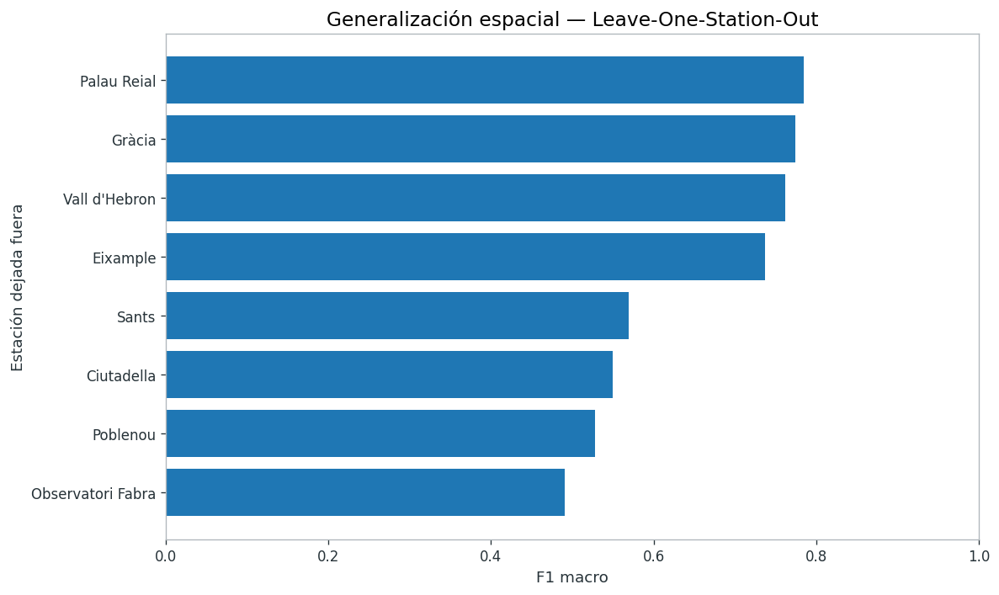

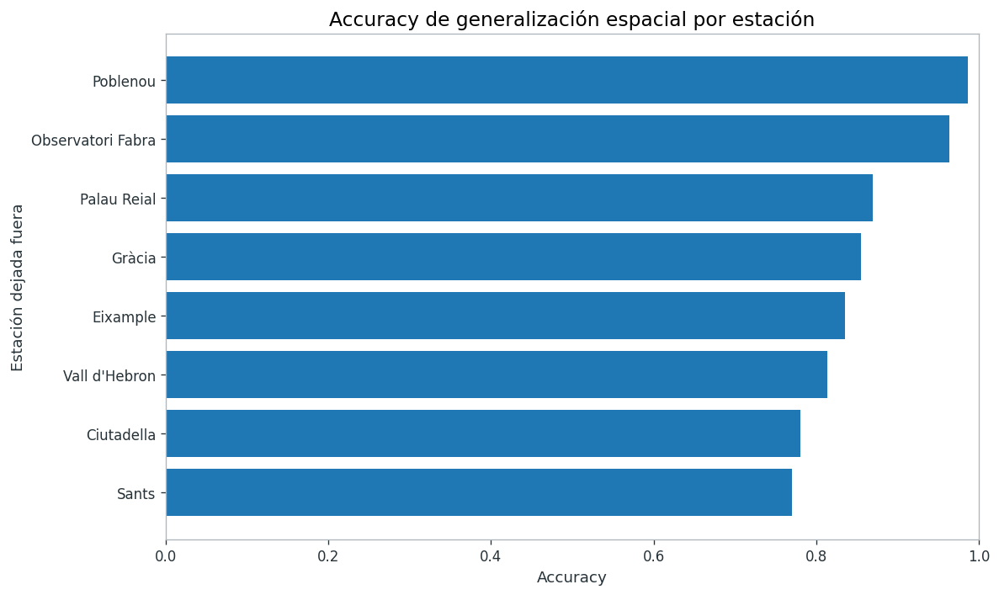


RESUMEN — CELDA 36

✓ Estaciones evaluadas: 8
✓ F1 macro medio: 0.6497
✓ F1 macro mínimo: 0.4909
✓ F1 macro máximo: 0.7853
✓ Accuracy media: 0.8597
✓ Accuracy mínima: 0.7708
✓ Accuracy máxima: 0.9871

✓ Cada estación fue utilizada como TEST exactamente una vez
✓ El preprocesador se ajustó únicamente con las estaciones TRAIN de cada fold
✓ SMOTE aplicado únicamente sobre TRAIN de cada fold
✓ La estación dejada fuera no participa en el entrenamiento de su fold

✓ VALIDACIÓN ESPACIAL COMPLETADA
# ✓ CELDA 36 COMPLETADA


In [ ]:
# ============================================================
# CELDA 36 — VALIDACIÓN ESPACIAL LEAVE-ONE-STATION-OUT (LOSO)
# MODELO: XGBOOST + SMOTE
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler
)

from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier


print("=" * 78)
print("36 · VALIDACIÓN ESPACIAL LEAVE-ONE-STATION-OUT")
print("=" * 78)


# ============================================================
# 1. RUTA
# ============================================================

BASE = Path(
    "/content/drive/MyDrive/TFM/11_Machine_Learning_Temporal/"
    "03_Datos_Modelado"
)


# ============================================================
# 2. COMPROBACIONES
# ============================================================

if "train" not in globals():

    raise ValueError(
        "No existe el DataFrame 'train'."
    )


if not isinstance(train, pd.DataFrame):

    raise ValueError(
        "'train' no es un DataFrame."
    )


print("\n✓ Dataset TRAIN disponible")
print(f"✓ Observaciones TRAIN: {len(train):,}")
print(f"✓ Columnas: {train.shape[1]}")


# ============================================================
# 3. COMPROBAR ESTACIÓN
# ============================================================

if "estacion_geo" not in train.columns:

    raise ValueError(
        "No existe la variable 'estacion_geo' en TRAIN."
    )


print(
    f"✓ Estaciones: "
    f"{train['estacion_geo'].nunique()}"
)


print(
    train["estacion_geo"].value_counts()
)


# ============================================================
# 4. DEFINICIÓN DE FEATURES
# ============================================================

columnas_excluir = [
    "target",
    "target_comprobacion",
    "clase_comprobacion",
    "NO2_delta_1d",
    "NO2_delta_7d",
    "fecha"
]


features_loso = [
    c for c in train.columns
    if c not in columnas_excluir
]


# Comprobaciones de seguridad

features_loso = [
    c for c in features_loso
    if c != "estacion_geo"
]


print(
    f"\n✓ Features utilizadas: "
    f"{len(features_loso)}"
)


print(
    "✓ estacion_geo NO se utiliza como predictor "
    "en la validación espacial"
)


# ============================================================
# 5. VARIABLE TARGET
# ============================================================

X_raw = train[features_loso].copy()

y_raw = train["target"].copy()

estaciones = train["estacion_geo"].copy()


print(
    f"✓ X: {X_raw.shape}"
)


print(
    f"✓ y: {y_raw.shape}"
)


# ============================================================
# 6. TIPOS DE VARIABLES
# ============================================================

variables_categoricas = [
    c for c in features_loso
    if X_raw[c].dtype == "object"
    or str(X_raw[c].dtype).startswith("category")
]


variables_numericas = [
    c for c in features_loso
    if c not in variables_categoricas
]


print(
    f"\n✓ Variables numéricas: "
    f"{len(variables_numericas)}"
)


print(
    f"✓ Variables categóricas: "
    f"{len(variables_categoricas)}"
)


if variables_categoricas:

    print("\nCategóricas:")

    for c in variables_categoricas:

        print(f"- {c}")


# ============================================================
# 7. ESTACIONES
# ============================================================

lista_estaciones = sorted(
    estaciones.dropna().unique()
)


print(
    f"\n✓ Estaciones para validación: "
    f"{len(lista_estaciones)}"
)


for e in lista_estaciones:

    print(
        f"- {e}: "
        f"{(estaciones == e).sum():,} observaciones"
    )


# ============================================================
# 8. RESULTADOS
# ============================================================

resultados_loso = []

predicciones_loso = []


# ============================================================
# 9. LOOP LEAVE-ONE-STATION-OUT
# ============================================================

for estacion_test in lista_estaciones:

    print("\n" + "=" * 78)

    print(
        f"ESTACIÓN DEJADA FUERA: {estacion_test}"
    )

    print("=" * 78)


    # --------------------------------------------------------
    # División espacial
    # --------------------------------------------------------

    mascara_test = (
        estaciones == estacion_test
    )


    mascara_train = (
        ~mascara_test
    )


    X_train_fold = X_raw.loc[
        mascara_train
    ].copy()


    X_test_fold = X_raw.loc[
        mascara_test
    ].copy()


    y_train_fold = y_raw.loc[
        mascara_train
    ].copy()


    y_test_fold = y_raw.loc[
        mascara_test
    ].copy()


    print(
        f"\n✓ TRAIN espacial: "
        f"{X_train_fold.shape}"
    )


    print(
        f"✓ TEST espacial:  "
        f"{X_test_fold.shape}"
    )


    print(
        "\nDistribución TRAIN:"
    )


    print(
        y_train_fold.value_counts()
        .sort_index()
    )


    print(
        "\nDistribución TEST:"
    )


    print(
        y_test_fold.value_counts()
        .sort_index()
    )


    # --------------------------------------------------------
    # Preprocesador ajustado SOLO con estaciones TRAIN
    # --------------------------------------------------------

    pipeline_num = Pipeline(
        steps=[

            (
                "imputer",
                SimpleImputer(
                    strategy="median"
                )
            ),

            (
                "scaler",
                StandardScaler()
            )
        ]
    )


    pipeline_cat = Pipeline(
        steps=[

            (
                "imputer",
                SimpleImputer(
                    strategy="most_frequent"
                )
            ),

            (
                "onehot",
                OneHotEncoder(
                    handle_unknown="ignore",
                    sparse_output=False
                )
            )
        ]
    )


    preprocessor_fold = ColumnTransformer(
        transformers=[

            (
                "num",
                pipeline_num,
                variables_numericas
            ),

            (
                "cat",
                pipeline_cat,
                variables_categoricas
            )
        ],

        remainder="drop"
    )


    # --------------------------------------------------------
    # Ajustar SOLO con TRAIN espacial
    # --------------------------------------------------------

    X_train_proc = (
        preprocessor_fold.fit_transform(
            X_train_fold
        )
    )


    X_test_proc = (
        preprocessor_fold.transform(
            X_test_fold
        )
    )


    print(
        f"\n✓ TRAIN transformado: "
        f"{X_train_proc.shape}"
    )


    print(
        f"✓ TEST transformado: "
        f"{X_test_proc.shape}"
    )


    # --------------------------------------------------------
    # SMOTE SOLO TRAIN
    # --------------------------------------------------------

    smote = SMOTE(
        random_state=42
    )


    X_train_smote, y_train_smote = (
        smote.fit_resample(
            X_train_proc,
            y_train_fold
        )
    )


    print(
        f"\n✓ SMOTE TRAIN: "
        f"{X_train_smote.shape}"
    )


    print(
        "✓ Distribución después de SMOTE:"
    )


    print(
        pd.Series(
            y_train_smote
        ).value_counts()
        .sort_index()
    )


    # --------------------------------------------------------
    # XGBOOST
    # --------------------------------------------------------

    modelo_loso = XGBClassifier(
        n_estimators=500,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="multi:softprob",
        num_class=3,
        eval_metric="mlogloss",
        random_state=42,
        n_jobs=-1
    )


    print(
        "\n✓ XGBoost construido"
    )


    # --------------------------------------------------------
    # ENTRENAMIENTO
    # --------------------------------------------------------

    modelo_loso.fit(
        X_train_smote,
        y_train_smote
    )


    # --------------------------------------------------------
    # PREDICCIÓN
    # --------------------------------------------------------

    y_pred_fold = modelo_loso.predict(
        X_test_proc
    )


    # --------------------------------------------------------
    # MÉTRICAS
    # --------------------------------------------------------

    accuracy = accuracy_score(
        y_test_fold,
        y_pred_fold
    )


    balanced_accuracy = (
        balanced_accuracy_score(
            y_test_fold,
            y_pred_fold
        )
    )


    precision_macro = precision_score(
        y_test_fold,
        y_pred_fold,
        average="macro",
        zero_division=0
    )


    recall_macro = recall_score(
        y_test_fold,
        y_pred_fold,
        average="macro",
        zero_division=0
    )


    f1_macro = f1_score(
        y_test_fold,
        y_pred_fold,
        average="macro",
        zero_division=0
    )


    f1_weighted = f1_score(
        y_test_fold,
        y_pred_fold,
        average="weighted",
        zero_division=0
    )


    # --------------------------------------------------------
    # RESULTADO
    # --------------------------------------------------------

    resultados_loso.append({

        "estacion": estacion_test,

        "n_test": len(y_test_fold),

        "accuracy": accuracy,

        "balanced_accuracy":
            balanced_accuracy,

        "precision_macro":
            precision_macro,

        "recall_macro":
            recall_macro,

        "f1_macro":
            f1_macro,

        "f1_weighted":
            f1_weighted
    })


    pred_fold = pd.DataFrame({

        "estacion_test":
            estacion_test,

        "y_real":
            y_test_fold.values,

        "y_pred":
            y_pred_fold
    })


    predicciones_loso.append(
        pred_fold
    )


    print(
        f"\n✓ Accuracy:          {accuracy:.4f}"
    )


    print(
        f"✓ Balanced Accuracy: {balanced_accuracy:.4f}"
    )


    print(
        f"✓ Precision macro:   {precision_macro:.4f}"
    )


    print(
        f"✓ Recall macro:      {recall_macro:.4f}"
    )


    print(
        f"✓ F1 macro:          {f1_macro:.4f}"
    )


    print(
        f"✓ F1 weighted:       {f1_weighted:.4f}"
    )


# ============================================================
# 10. TABLA FINAL
# ============================================================

resultados_loso_df = pd.DataFrame(
    resultados_loso
)


print("\n" + "=" * 78)

print(
    "RESULTADOS LEAVE-ONE-STATION-OUT"
)

print("=" * 78)


print(
    resultados_loso_df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}"
    )
)


# ============================================================
# 11. MEDIA Y DESVIACIÓN
# ============================================================

metricas_loso = [
    "accuracy",
    "balanced_accuracy",
    "precision_macro",
    "recall_macro",
    "f1_macro",
    "f1_weighted"
]


resumen_loso = pd.DataFrame({

    "metrica": metricas_loso,

    "media": [
        resultados_loso_df[c].mean()
        for c in metricas_loso
    ],

    "desviacion_std": [
        resultados_loso_df[c].std()
        for c in metricas_loso
    ],

    "minimo": [
        resultados_loso_df[c].min()
        for c in metricas_loso
    ],

    "maximo": [
        resultados_loso_df[c].max()
        for c in metricas_loso
    ]
})


print("\n" + "=" * 78)

print(
    "RESUMEN GLOBAL — VALIDACIÓN ESPACIAL"
)

print("=" * 78)


print(
    resumen_loso.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}"
    )
)


# ============================================================
# 12. GRÁFICO F1 MACRO POR ESTACIÓN
# ============================================================

plt.figure(
    figsize=(10, 6)
)


datos_plot = (
    resultados_loso_df
    .sort_values(
        "f1_macro"
    )
)


plt.barh(
    datos_plot["estacion"],
    datos_plot["f1_macro"]
)


plt.xlabel(
    "F1 macro"
)


plt.ylabel(
    "Estación dejada fuera"
)


plt.title(
    "Generalización espacial — Leave-One-Station-Out"
)


plt.xlim(
    0,
    1
)


plt.tight_layout()

plt.show()


# ============================================================
# 13. GRÁFICO ACCURACY POR ESTACIÓN
# ============================================================

plt.figure(
    figsize=(10, 6)
)


datos_plot = (
    resultados_loso_df
    .sort_values(
        "accuracy"
    )
)


plt.barh(
    datos_plot["estacion"],
    datos_plot["accuracy"]
)


plt.xlabel(
    "Accuracy"
)


plt.ylabel(
    "Estación dejada fuera"
)


plt.title(
    "Accuracy de generalización espacial por estación"
)


plt.xlim(
    0,
    1
)


plt.tight_layout()

plt.show()


# ============================================================
# 14. GUARDAR RESULTADOS
# ============================================================

ruta_resultados = (
    BASE /
    "validacion_espacial_LOSO_resultados.csv"
)


ruta_resumen = (
    BASE /
    "validacion_espacial_LOSO_resumen.csv"
)


ruta_predicciones = (
    BASE /
    "validacion_espacial_LOSO_predicciones.csv"
)


resultados_loso_df.to_csv(
    ruta_resultados,
    index=False
)


resumen_loso.to_csv(
    ruta_resumen,
    index=False
)


predicciones_loso_df = pd.concat(
    predicciones_loso,
    ignore_index=True
)


predicciones_loso_df.to_csv(
    ruta_predicciones,
    index=False
)


# ============================================================
# 15. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 78)

print(
    "RESUMEN — CELDA 36"
)

print("=" * 78)


print(
    f"\n✓ Estaciones evaluadas: "
    f"{len(lista_estaciones)}"
)


print(
    f"✓ F1 macro medio: "
    f"{resultados_loso_df['f1_macro'].mean():.4f}"
)


print(
    f"✓ F1 macro mínimo: "
    f"{resultados_loso_df['f1_macro'].min():.4f}"
)


print(
    f"✓ F1 macro máximo: "
    f"{resultados_loso_df['f1_macro'].max():.4f}"
)


print(
    f"✓ Accuracy media: "
    f"{resultados_loso_df['accuracy'].mean():.4f}"
)


print(
    f"✓ Accuracy mínima: "
    f"{resultados_loso_df['accuracy'].min():.4f}"
)


print(
    f"✓ Accuracy máxima: "
    f"{resultados_loso_df['accuracy'].max():.4f}"
)


print(
    "\n✓ Cada estación fue utilizada como TEST "
    "exactamente una vez"
)


print(
    "✓ El preprocesador se ajustó únicamente "
    "con las estaciones TRAIN de cada fold"
)


print(
    "✓ SMOTE aplicado únicamente sobre TRAIN "
    "de cada fold"
)


print(
    "✓ La estación dejada fuera no participa "
    "en el entrenamiento de su fold"
)


print(
    "\n✓ VALIDACIÓN ESPACIAL COMPLETADA"
)


print(
    "# ✓ CELDA 36 COMPLETADA"
)


print("=" * 78)

### RESULTADOS VALIDACIÓN ESPACIAL LEAVE-ONE-STATION-OUT

## OBJETIVO

La validación espacial Leave-One-Station-Out (LOSO) se ha realizado sobre las
**8 estaciones disponibles**, dejando cada estación completamente fuera del
entrenamiento en una iteración independiente.

En cada fold:

- una estación se utiliza exclusivamente como TEST espacial;
- las restantes estaciones constituyen el TRAIN;
- `estacion_geo` no se utiliza como predictor;
- el preprocesador se ajusta exclusivamente sobre TRAIN;
- SMOTE se aplica exclusivamente sobre TRAIN;
- se mantiene la configuración del modelo XGBoost + SMOTE.

De esta forma se evalúa la capacidad del modelo para **generalizar a una
estación no observada durante el entrenamiento**.

---

## RESULTADOS POR ESTACIÓN

| Estación | N TEST | Accuracy | Balanced Accuracy | F1 macro |
|---|---:|---:|---:|---:|
| Ciutadella | 1.684 | 0,7809 | 0,5413 | 0,5502 |
| Eixample | 1.659 | 0,8354 | 0,7578 | 0,7376 |
| Gràcia | 1.675 | 0,8555 | 0,7345 | 0,7739 |
| Observatori Fabra | 28 | 0,9643 | 0,5000 | 0,4909 |
| Palau Reial | 1.638 | 0,8700 | 0,7629 | **0,7853** |
| Poblenou | 1.473 | 0,9871 | 0,4778 | 0,5282 |
| Sants | 1.697 | 0,7708 | 0,5454 | 0,5696 |
| Vall d'Hebron | 1.662 | 0,8135 | 0,7013 | 0,7621 |

Los resultados completos por estación incluyen además Precision macro,
Recall macro y F1 weighted. :contentReference[oaicite:1]{index=1}

---

## RESUMEN GLOBAL

| Métrica | Media | Desv. estándar | Mínimo | Máximo |
|---|---:|---:|---:|---:|
| Accuracy | 0,8597 | 0,0794 | 0,7708 | 0,9871 |
| Balanced Accuracy | 0,6276 | 0,1225 | 0,4778 | 0,7629 |
| Precision macro | 0,7498 | 0,1444 | 0,4821 | 0,8941 |
| Recall macro | 0,6276 | 0,1225 | 0,4778 | 0,7629 |
| **F1 macro** | **0,6497** | **0,1256** | **0,4909** | **0,7853** |
| F1 weighted | 0,8539 | 0,0793 | 0,7650 | 0,9842 |

La **Accuracy media es 0,8597**, mientras que el **F1 macro medio es 0,6497**,
con una variabilidad apreciable entre estaciones. :contentReference[oaicite:2]{index=2}

---

## INTERPRETACIÓN

El modelo mantiene una capacidad de generalización espacial apreciable, aunque
inferior a la obtenida en la evaluación temporal sobre 2024.

El mejor resultado en términos de F1 macro se obtiene para **Palau Reial
(0,7853)**, seguido de **Gràcia (0,7739)** y **Vall d'Hebron (0,7621)**.

Los valores más bajos corresponden a **Observatori Fabra (0,4909)**,
**Poblenou (0,5282)**, **Ciutadella (0,5502)** y **Sants (0,5696)**.

---

## EFECTO DEL DESEQUILIBRIO ENTRE CLASES

La diferencia entre Accuracy y F1 macro resulta especialmente relevante en
determinadas estaciones.

En **Poblenou**, por ejemplo, se obtiene una Accuracy de **0,9871**, pero un
F1 macro de solamente **0,5282**. Esto se debe a que el conjunto TEST está
fuertemente dominado por la clase `Buena`:

- Buena: 1.441 observaciones;
- Media: 30 observaciones;
- Mala: 2 observaciones.

Por tanto, la Accuracy por sí sola puede sobreestimar el rendimiento cuando
existe un fuerte desequilibrio de clases. :contentReference[oaicite:3]{index=3}

---

## CASO PARTICULAR DE OBSERVATORI FABRA

Observatori Fabra presenta únicamente **28 observaciones** en el conjunto
TEST:

- Buena: 27;
- Media: 1;
- Mala: 0.

Por ello, sus métricas macro presentan una elevada incertidumbre y deben
interpretarse con cautela.

La Accuracy de **0,9643** no debe interpretarse como evidencia de una
generalización espacial excepcional, debido al reducido tamaño y a la
distribución de clases del conjunto de validación. :contentReference[oaicite:4]{index=4}

---

## COMPARACIÓN CON LA VALIDACIÓN TEMPORAL

La evaluación temporal del modelo final sobre 2024 obtuvo:

- Accuracy: **0,8867**
- F1 macro: **0,7476**

La validación espacial obtiene:

- Accuracy media: **0,8597**
- F1 macro medio: **0,6497**

La reducción del rendimiento espacial indica que la generalización hacia una
estación no observada durante el entrenamiento constituye un problema más
exigente que la predicción de nuevos registros temporales de estaciones ya
conocidas.

---

## CONTROL METODOLÓGICO

✓ **8 estaciones evaluadas**

✓ Cada estación fue utilizada como TEST exactamente una vez.

✓ `estacion_geo` no se utilizó como predictor.

✓ El preprocesador se ajustó únicamente con las estaciones TRAIN de cada fold.

✓ SMOTE se aplicó únicamente sobre TRAIN de cada fold.

✓ La estación dejada fuera no participó en el entrenamiento de su fold.

✓ La validación espacial no modifica el modelo final seleccionado. :contentReference[oaicite:5]{index=5}

---

## CONCLUSIÓN

La validación Leave-One-Station-Out confirma que el modelo presenta una
**capacidad de generalización espacial razonable**, aunque con una variabilidad
considerable entre estaciones.

El resultado global de **F1 macro = 0,6497** debe interpretarse conjuntamente
con la distribución de clases de cada estación y no únicamente mediante
Accuracy.

La validación espacial aporta, por tanto, una comprobación independiente de
robustez que complementa la validación temporal del modelo final.

# ✓ VALIDACIÓN ESPACIAL COMPLETADA

# CIERRE GLOBAL · MODELO TEMPORAL DE CLASIFICACIÓN

## 1. RESUMEN DEL PROCESO

El notebook ha desarrollado de forma completa el pipeline de modelización
temporal de la calidad del aire de Barcelona, desde la auditoría del Maestro
06 hasta la evaluación final y la comprobación de generalización espacial.

El proceso comprende:

**AUDITORÍA → EDA → DEFINICIÓN DEL OBJETIVO → FEATURE ENGINEERING →
CONTROL DE LEAKAGE → SELECCIÓN DE FEATURES → SPLIT TEMPORAL →
PREPROCESAMIENTO → MODELIZACIÓN → VALIDACIÓN → INTERPRETABILIDAD →
ANÁLISIS DE ERRORES → VALIDACIÓN ESPACIAL**

---

## 2. CONJUNTO DE DATOS Y PREPARACIÓN

El Maestro 06 constituye la fuente de entrada del modelo temporal.

Tras la depuración y transformación se establece una unidad de análisis basada
en:

**fecha + estación geográfica**

y un periodo efectivo de modelización **2019–2024**.

La construcción de las variables incorpora información de contaminación,
meteorología, temporalidad, movilidad, actividad urbana y variables espaciales.

Los controles realizados permiten confirmar:

✓ ausencia de duplicidades en la unidad de análisis final;

✓ coherencia temporal;

✓ definición explícita del objetivo;

✓ identificación y exclusión de variables directamente relacionadas con el
target;

✓ control de leakage temporal;

✓ separación entre entrenamiento y evaluación.

---

## 3. CARACTERIZACIÓN DEL OBJETIVO

El problema se plantea como una clasificación multiclase de tres categorías:

| Clase | Proporción aproximada |
|---|---:|
| Buena | 57,62 % |
| Media | 40,51 % |
| Mala | 1,88 % |

La clase `Mala` constituye una categoría minoritaria, por lo que la Accuracy
no resulta suficiente para evaluar el comportamiento del modelo.

Por este motivo se utiliza el **F1 macro** como una de las métricas principales
de comparación.

---

## 4. MODELIZACIÓN

Se compararon diferentes algoritmos de clasificación.

El mejor comportamiento global se obtuvo con:

**XGBoost + SMOTE**

El uso de SMOTE se restringe exclusivamente al conjunto de entrenamiento,
manteniendo el TEST completamente intacto.

El modelo final se entrena con:

**TRAIN: 2019–2023**

y se evalúa sobre:

**TEST: 2024**

---

## 5. RENDIMIENTO DEL MODELO FINAL

El modelo final obtiene sobre 2024:

| Métrica | Resultado |
|---|---:|
| **Accuracy** | **0,8867** |
| **Balanced Accuracy** | **0,7019** |
| **F1 macro** | **0,7476** |
| **F1 weighted** | **0,8853** |
| **MCC** | **0,7441** |
| **Cohen's Kappa** | **0,7439** |
| **ROC-AUC macro** | **0,9637** |
| **ROC-AUC weighted** | **0,9531** |

El modelo alcanza una Accuracy del **88,67 %** y un F1 macro de **0,7476**.

---

## 6. RENDIMIENTO POR CLASE

| Clase | Precision | Recall | F1 |
|---|---:|---:|---:|
| Buena | 0,9133 | 0,9285 | 0,9209 |
| Media | 0,8302 | 0,8137 | 0,8218 |
| Mala | 0,8000 | 0,3636 | 0,5000 |

El modelo presenta un rendimiento elevado en las clases `Buena` y `Media`.

La clase `Mala` presenta un recall inferior, identificando correctamente
**8 de los 22 casos reales** presentes en el TEST de 2024.

Este comportamiento debe interpretarse considerando que se trata de una clase
minoritaria con un número reducido de observaciones.

---

## 7. VALIDACIÓN TEMPORAL

La validación temporal interna, realizada separando una parte del periodo de
entrenamiento sin utilizar 2024, obtiene:

- Accuracy: **0,8728**
- F1 macro: **0,7002**

Frente al TEST 2024:

- Accuracy: **0,8867**
- F1 macro: **0,7476**

La diferencia de F1 macro es de **−0,0474** en la validación interna respecto
al TEST 2024.

El resultado confirma que existe cierta variabilidad temporal, pero el modelo
mantiene un comportamiento consistente y continúa prediciendo las tres
categorías.

---

## 8. INTERPRETABILIDAD DEL MODELO

El análisis SHAP permite identificar las variables con mayor contribución a
las predicciones.

Entre las variables globalmente más relevantes aparecen:

- `O3_ug_m3`;
- `NO2_lag_1`;
- `PM10_ug_m3`;
- `VVM10`;
- `NO2_rolling_7d`;
- `HRM`;
- `NO2_rolling_14d`;
- `NO2_rolling_3d`;
- variables de tráfico;
- actividad aeroportuaria.

El resultado muestra que la clasificación no depende exclusivamente de una
única variable, sino de la combinación de **contaminantes, persistencia
temporal del NO₂, meteorología, movilidad y actividad urbana**.

El análisis específico de la clase `Mala` refuerza especialmente la
importancia de O₃, NO₂ histórico, PM10 y variables meteorológicas.

---

## 9. ANÁLISIS DE ERRORES

Sobre las **2.506 observaciones de TEST**:

- **2.222** fueron correctamente clasificadas;
- **284** fueron clasificadas incorrectamente;
- tasa de error: **11,33 %**.

Los errores se concentran principalmente entre categorías adyacentes:

| Tipo de error | Observaciones |
|---|---:|
| Media → Buena | 148 |
| Buena → Media | 120 |
| Mala → Media | 14 |
| Media → Mala | 2 |

No se producen errores directos:

- `Buena → Mala`;
- `Mala → Buena`.

Esto indica que los principales errores se producen en la frontera entre
categorías próximas de calidad del aire.

---

## 10. VALIDACIÓN ESPACIAL

La validación Leave-One-Station-Out se realiza sobre las **8 estaciones**,
dejando cada estación completamente fuera del entrenamiento en cada fold.

El resultado global es:

| Métrica | Media |
|---|---:|
| Accuracy | **0,8597** |
| Balanced Accuracy | **0,6276** |
| F1 macro | **0,6497** |
| F1 weighted | **0,8539** |

El F1 macro presenta:

- mínimo: **0,4909**;
- máximo: **0,7853**.

La variabilidad entre estaciones confirma que la generalización espacial es
más exigente que la predicción temporal sobre estaciones ya conocidas.

Los resultados deben interpretarse conjuntamente con la distribución de clases
de cada estación, especialmente en estaciones con muy pocos casos de la
categoría `Mala`.

---

## 11. CONCLUSIONES DEL MODELO

El análisis permite concluir que:

1. **XGBoost + SMOTE es el modelo seleccionado** para la clasificación temporal.

2. El modelo presenta un **rendimiento predictivo elevado** sobre 2024,
   alcanzando un 88,67 % de Accuracy y un F1 macro de 0,7476.

3. El desequilibrio de clases constituye la principal dificultad para la
   detección de episodios `Mala`.

4. SMOTE mejora específicamente la capacidad de detección de la clase
   minoritaria sin deteriorar de forma relevante la Accuracy global.

5. El análisis SHAP proporciona una interpretación coherente del modelo,
   destacando la combinación de contaminantes, meteorología, persistencia
   temporal y movilidad.

6. Los errores se concentran principalmente entre las categorías `Buena` y
   `Media`, mientras que no aparecen saltos directos entre `Buena` y `Mala`.

7. La validación espacial demuestra que el modelo conserva capacidad de
   generalización hacia estaciones no observadas, aunque con un rendimiento
   inferior y mayor variabilidad que la validación temporal.

---

## 12. LIMITACIONES

La principal limitación del modelo es el reducido número de observaciones de
la clase `Mala`, especialmente en determinados subconjuntos temporales y
espaciales.

Asimismo, la validación espacial muestra que el rendimiento depende de las
características y distribución de cada estación.

Por tanto, el modelo debe interpretarse como una herramienta de **clasificación
y análisis de patrones de calidad del aire**, y no como un sustituto de la
medición directa de las estaciones.

---

## 13. RESULTADO FINAL

El pipeline queda completamente cerrado desde el punto de vista de la
modelización temporal:

✓ Datos auditados

✓ Objetivo definido

✓ Feature engineering realizado

✓ Leakage controlado

✓ Features seleccionadas

✓ Split temporal 2019–2023 / 2024

✓ Modelos comparados

✓ XGBoost + SMOTE seleccionado

✓ Validación temporal realizada

✓ Interpretabilidad SHAP completada

✓ Clase `Mala` analizada específicamente

✓ Métricas completas calculadas

✓ Análisis de errores realizado

✓ Generalización espacial contrastada mediante LOSO

### CONCLUSIÓN GLOBAL

El modelo final proporciona una base sólida y reproducible para el análisis
predictivo de la calidad del aire de Barcelona y permite conectar la
clasificación de episodios de contaminación con sus principales factores
ambientales, temporales y de movilidad.

El modelo queda **cerrado y validado** para su explotación en las siguientes
fases del TFM, especialmente el análisis de resultados y la construcción del
dashboard interactivo.

# ✓ MODELO TEMPORAL DE CLASIFICACIÓN COMPLETADO